# Restricted Boltzmann Machine - MNIST

## Imports

In [1]:
import sys, datetime
import os
# numpy
import numpy as np
from numpy import exp,sqrt,log,log10,sign,power,cosh,sinh,tanh,floor
rng = np.random.default_rng(12345)
np.set_printoptions(precision=4)

# matplotlib
# matplotlib
import matplotlib as mpl
%matplotlib inline
from matplotlib.ticker import NullFormatter, MaxNLocator
#mpl.rcParams.update({"font.size": 16})  #"text.usetex": True,})
mpl.rcParams.update({
   # 'figure.figsize': (10, 25),   # Dimensioni della figura (larghezza x altezza)
    'axes.titlesize': 22,        # Dimensione del titolo del grafico
    'axes.labelsize': 20,        # Dimensione delle etichette degli assi
    'xtick.labelsize': 18,       # Dimensione dei numeri dell'asse X
    'ytick.labelsize': 18,       # Dimensione dei numeri dell'asse Y
    'legend.fontsize': 17,       # Dimensione della legenda
    'axes.titleweight': 'bold',  # Grassetto per il titolo
    'axes.labelweight': 'bold',  # Grassetto per le etichette degli assi
    'lines.linewidth': 2.5,      # Spessore delle linee
    'lines.markersize': 6        # Grandezza dei marker
})

from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(["science","grid","notebook"])
# to load MNIST
from sklearn.datasets import fetch_openml

!mkdir FIG
!mkdir FIG/FRAME
!mkdir WEIGHTS
!mkdir DATA
if not os.path.exists('GRAPHS'):
    os.makedirs('GRAPHS')


mkdir: cannot create directory ‘FIG’: File exists
mkdir: cannot create directory ‘FIG/FRAME’: File exists
mkdir: cannot create directory ‘WEIGHTS’: File exists
mkdir: cannot create directory ‘DATA’: File exists


## Load data

In [ ]:
#import dill
#import IPython.display

#from IPython.core.display import display, HTML

# Attempt to load the session:
#try:
#dill.load_session('/content/save_ll_1.7 - Copia.db')
#except AttributeError:
    #print("Error loading session. Consider using a compatible IPython version or manually editing the session file.")
    # If you choose to edit manually, carefully inspect and modify the problematic object reference.
    # Refer to dill documentation for guidance on inspecting saved objects: https://dill.readthedocs.io/en/latest/
    # Use with caution as manual editing can corrupt the session file.

X_original, Y_original = fetch_openml("mnist_784", version=1, return_X_y=True, as_frame=False)
print(X_original.shape)

/home/jonny/.local/lib/python3.8/site-packages/sklearn/datasets/_openml.py:1022: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


## Parameters

In [ ]:
################################
#    CHOICE OF PARAMETERS      #
################################
# number of MNIST digits to keep (e.g., Ndigit=3 keeps 0,1,2)
Ndigit=3
# number of hidden units
L = 3
# use (+1,-1) if SPINS, otherwise use bits (1,0)
SPINS=False
# use one-hot encoding in hidden space if POTTS (use only if SPINS=False)
POTTS=False

dname='DATA/'
################################

# x_min =0 if bits, x_min=-1 if SPINS
# level_gap is the difference in values between the max (1) and the min (x_min)
if SPINS:
    x_min=-1
    level_gap=2.
else:
    x_min=0
    level_gap=1.

if POTTS:
    str_simul="RBM_Potts"
    # in one-hot encoding, number of possible hidden states matches L
    Nz=L
else:
    str_simul="RBM"
    # number of possible hidden states: 2**L
    Nz=2**L

if POTTS and SPINS:
    print("\n\n>>>>>>>> WARNING:  POTTS and SPINS cannot coexist\n\n")

## Select data, and digitalize them two levels

In [ ]:
def show_MNIST(x, y=[], z=[], Nex=5, S=1.4, side=0, colors=[]):
    """Show digits"""
    if side==0: side = int(sqrt(x.shape[1]))
    if len(y)<1: y=np.full(Nex,"")
    colors=np.array(colors)
    fig, AX = plt.subplots(1,Nex,figsize=(S*Nex,S))

    for i, img in enumerate(x[:Nex].reshape(Nex, side, side)):
        if len(colors)==0: newcmp = "gray"
        else:
            col= colors[0] + (colors[1]-colors[0])*(i+1)/(Nex+1)
            newcmp = ListedColormap((col,(1,1,1,1)))
        ax=AX[i]
        ax.imshow(img, cmap=newcmp)
        ax.set_xticks([])
        ax.set_yticks([])
        if len(y)>0: ax.set_title(y[i])
        if len(z)>0: ax.set_title(''.join(map(str, z[i])),fontsize=9)
    plt.show()

def MNIST_bit(X,side=28,level=0.5):
    NX=len(X)
    #print(X.shape)
    print(f"dataset with {NX} points, each with {len(X[0])} bits\n")
    if side==14:
        X = np.reshape(X,(NX,28,28))
        # new value = average over 4 values in a 2x2 square
        Xr = 0.25*(X[:,0::2,0::2]+X[:,1::2,0::2]+X[:,0::2,1::2]+X[:,1::2,1::2])
        X  = Xr.reshape(NX,side**2)
    #print(X.shape)
    # binarize data and then convert it to 1/0 or 1/-1
    X = np.where(X/255 > level, 1, x_min)
    return X.astype("int")

list_10_digits = ('0','1','2','3','4','5','6','7','8','9')
list_digits = list_10_digits[1:8:Ndigit]
print(list_digits)
keep=np.isin(Y_original, list_digits)
X_keep,Y=X_original[keep],Y_original[keep]

data,label = MNIST_bit(X_keep),Y
data,label = data.astype("int"),label.astype("int")
print("first 10 MNIST data points")
show_MNIST(X_original, Y_original,Nex=10)
print(f"first 10 MNIST-{Ndigit} data points")
show_MNIST(X_keep, label,Nex=10)
print(f"first 10 MNIST-{Ndigit} data points, binarized")
show_MNIST(data, label,Nex=10)

# number of data points
Nd = len(data)
# number of visible units
D  = len(data[1])

print(f'each of Nd={Nd} data has D={D} bits')

## Plotting data stats

In [ ]:
fig, (ax) = plt.subplots(1,1,figsize=(6,3))
ax.hist(np.sort(label),bins=[0.5,1.5,3.5,4.5,6.5,7.5],density=False,rwidth=0.8,color="g")
ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(1))
ax.set_ylabel("data points")
plt.show()
for i in range(8): show_MNIST(data[i*20:],Nex=20)

## Contrastive divergence (CD)


In [6]:
# eq(213) page 97, activation via sigmoid
# taking into account energy gap 2 for "spin" variables (-1,1)
def CD_step(v_in,wei,bias,details=False,POTTS=False):
    """
        Generates the state on the other layer:
        Field "H" ->  activation "a" -> probability "p" -> Spins/bits v_out

        Either (v_in=x, wei=w) or (v_in=z, wei=w.T)

        details = True --> returns also probability (p) and activation (a)

        POTTS means one-hot encoding (used only in hidden space)
    """
    # local "field"
    H = np.clip(np.dot(v_in, wei) + bias, a_min=-300, a_max=300)
    # "activation"
    a = exp(level_gap*H)
    n = np.shape(H)
    v_out = np.full(n, x_min, dtype=int) # initially, just a list on -1's or 0's
    if POTTS: # RBM with a single hidden unit = 1 (that is, "one-hot encoding" with L states)
        # p: state probability, normalized to 1 over all units=states
        p = a/np.sum(a)
        # F: cumulative probability
        F = np.cumsum(p)
        # pick a state "i" randomly with probability p[i]
        r = np.random.rand()
        i = 0
        while r>F[i]: i+=1
        v_out[i] = 1 # activate a single hidden unit
    else: # normal Ising RBM
        # p: local probability, normalized to 1 for each hidden unit
        p = a / (a + 1.)
        # at each position i, activate the 1's with local probability p[i]
        v_out[np.random.random_sample(n) < p] = 1

    if details: return v_out,p,a
    else: return v_out

## Plot weights

In [7]:
def plot_weights_bias(wE, bE, epoch, L,
                      side=0,cols=0,thr=0,s=1.5,
                      title=False, save=True,cmap="bwr"):
    '''
    Plot the weights of the RBM, one plot for each hidden unit.
    '''
    rows = int(np.ceil(L / cols))
    if rows==1: rows=2
    w=wE[epoch]
    b=bE[epoch]
    if side==0: side=int(sqrt(len(w)))
    if thr==0: thr=4
    plt.clf()
    fig, AX = plt.subplots(rows, cols+1, figsize=(s*(1+cols),s*rows))
    if title: fig.suptitle(f"epoch = {epoch}")
    k=1
    for i in range(rows):
        for j in range(cols):
            if rows==1: ax=AX[j+1]
            else: ax=AX[i,j+1]
            if k<=L:
                ax.imshow(w[:,k-1].reshape(side, side), cmap=cmap,vmin=-thr,vmax=thr)
                ax.set_xticks([])
                ax.set_yticks([])
                ax.set_title(f"hidden {k}")
            else: fig.delaxes(ax)
            k+=1
        if i>0:  fig.delaxes(AX[i,0])

    ax=AX[0,0];
    im=ax.imshow(b.reshape(side, side), cmap=cmap,vmin=-thr,vmax=thr)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title("bias")
    # colobar
    cbar_ax = fig.add_axes([0.14, 0.15, 0.024, 0.33])
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=12)

    S=0.3
    plt.subplots_adjust(hspace=S)

    if save: plt.savefig(f"./FIG/FRAME/RBM_{epoch}_w-a.png")

    plt.show()
    plt.close()


## Weights initialization

The bias inizializations is a fundamental step to allow a faster and better reconstruction of the dataset. Using Hilton's approach, we assign the value of the visible units bias as to better recreate the statistical distribution of the original data. What we do is initialize the j-th visible bias using $b_j= log(\frac{p_j}{1-p_j})$, where $p_{j}$ is the fraction of the training dataset in which the visible unit $j$ is active.

This method presents the network from starting in a position where all visible units are equally likely, which could slow down the loss minimization during training. In fact, this reduces the chance to end up in local minima of the likelihood, far from the absolute minimum we are interested in. 
This process is computed in the function Hinton_bias_init() where $p_i$ is expressed as the mean of the input data. The $S$ variable and the np.clip() function are introduced to avoid $p_1$={0,1}, which would cause the divergence of the logarithm.

In [8]:
# initial bias of visible units, based on their average value in the dataset
# Hinton, "A Practical Guide to Training Restricted Boltzmann Machines"
def Hinton_bias_init(x):
    xmean=np.array(np.mean(x,axis=0))
    # remove values at extrema, to avoid divergences in the log's
    S = 1e-4
    x1,x2 = x_min+S,1-S
    xmean[xmean<x1] = x1
    xmean[xmean>x2] = x2
    return (1/level_gap)*np.clip(log(xmean-x_min) - log(1-xmean),-300,300)

# range of each initial weight
# Glorot and Bengio, "Understanding the difficulty of training deep feedforward neural networks"
sigma = sqrt(4. / float(L + D))

## Gradient descent method

In [ ]:
# Gradient descent options
GRAD_list=["SGD","RMSprop"]
GRAD=GRAD_list[1]
if GRAD=="SGD":
    l_rate_ini,l_rate_fin=1.0,0.25
if GRAD=="RMSprop":
    beta,epsilon=0.9,1e-4
    l_rate_ini,l_rate_fin=0.05,0.05
    print("epsilon=",epsilon)
gamma = 0.001 ######### for regularization

print(f"D={D}\tsample size\nL={L}\tnr. z states")
print("Gradient descent type:",GRAD)
print(f"learning rate        = {l_rate_ini} --> {l_rate_fin}")
if gamma!=0: print(f"gamma={gamma}\tregularization")

# Initial RBM training


In [10]:
def make_weights_fname(label,dname="WEIGHTS"):
    fname=dname+"/"+label+"_"+str_simul+"_MNIST"+str(Ndigit)+"_L"+str(L)+"_Nt"+str(Nt)
    fname=fname+"_"+GRAD+"-"+"{:.2f}".format(l_rate_ini)+"-"+"{:.2f}".format(l_rate_fin)+"_Ep"+str(Nepoch)
    if gamma>0:  fname=fname+"_reg"+"{:.3g}".format(gamma)
    if POTTS: fname+="_POTTS"
    if SPINS: fname+="_SPINS"
    fname=fname
    return fname+".npy"
def make_weights_fname_iter(label,dname="WEIGHTS"):
    fname=dname+"/"+label+"_"+str_simul+"_MNIST"+str(Ndigit)+"_L"+str(L)+"_Nt"+str(Nt)
    fname=fname+"_"+GRAD+"-"+"{:.2f}".format(l_rate_ini)+"-"+"{:.2f}".format(l_rate_fin)+"_Ep"+str(Nepoch)+str("_")+str(iteration)
    if gamma>0:  fname=fname+"_reg"+"{:.3g}".format(gamma)
    if POTTS: fname+="_POTTS"
    if SPINS: fname+="_SPINS"
    fname=fname
    return fname+".npy"

def save_epochs(qE,label):
    fname=make_weights_fname(label)
    #print(fname)
    np.save(fname,qE)
    
def save_epochs_iter(qE,label):
    fname=make_weights_fname_iter(label)
    #print(fname)
    np.save(fname,qE)


L=3,4,5,6,8,10; CD steps= 2,4,6,8,10,15

In [8]:
# random seed for reproducibility
np.random.seed(12345)

L_v = [3,4,5,6,7,8,10]
Nt_v= [2,4,6,8,10,15]
gamma_v= [0.0001,0.001,0.01,0.1,0.5]

Nepoch=150
Nmini=20


<Figure size 640x480 with 0 Axes>

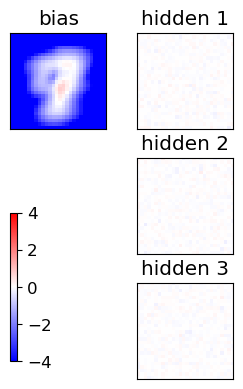

Starting the training
[16053 16112 19222 12024  4937  4793 13844  6809  7045  4699]
[17378 13425  1328  4770 18773  6133 10103  6206 15888  2118]
[18708   199 13590   739 14683 15794 16145  3148  7205 12598]
[15981 18440  2421  3592 19372  6763  6214  8299 11460 20074]
epoch 1 / 150  Nt: 2  N: 10  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 2 / 150  Nt: 2  N: 10  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 3 / 150  Nt: 2  N: 10  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 4 / 150  Nt: 2  N: 10  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 5 / 150  Nt: 2  N: 10  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 6 / 150  Nt: 2  N: 10  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 7 / 150  Nt: 2  N: 10  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 8 / 150  Nt: 2  N: 11  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 9 / 150  Nt: 2  N: 11  L: 3  rate: 0.05  gam: 0.001 

<Figure size 640x480 with 0 Axes>

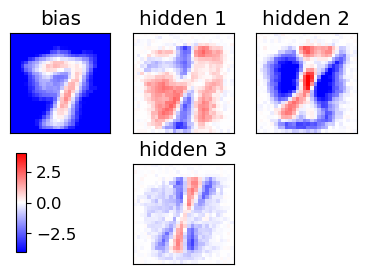

epoch 21 / 150  Nt: 2  N: 18  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 22 / 150  Nt: 2  N: 19  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 23 / 150  Nt: 2  N: 20  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 24 / 150  Nt: 2  N: 21  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 25 / 150  Nt: 2  N: 22  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 26 / 150  Nt: 2  N: 23  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 27 / 150  Nt: 2  N: 24  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 28 / 150  Nt: 2  N: 26  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 29 / 150  Nt: 2  N: 27  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 30 / 150  Nt: 2  N: 28  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 31 / 150  Nt: 2  N: 29  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 32 / 150  Nt: 2  N: 31  L: 3  rate: 0.05  gam: 0.001 SPINS=

<Figure size 640x480 with 0 Axes>

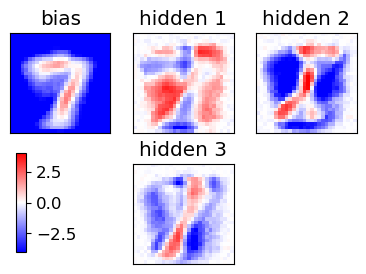

epoch 41 / 150  Nt: 2  N: 45  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 42 / 150  Nt: 2  N: 47  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 43 / 150  Nt: 2  N: 48  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 44 / 150  Nt: 2  N: 50  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 45 / 150  Nt: 2  N: 52  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 46 / 150  Nt: 2  N: 54  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 47 / 150  Nt: 2  N: 56  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 48 / 150  Nt: 2  N: 58  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 49 / 150  Nt: 2  N: 60  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 50 / 150  Nt: 2  N: 62  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 51 / 150  Nt: 2  N: 65  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 52 / 150  Nt: 2  N: 67  L: 3  rate: 0.05  gam: 0.001 SPINS=

<Figure size 640x480 with 0 Axes>

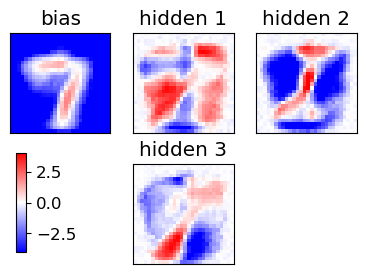

epoch 61 / 150  Nt: 2  N: 89  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 62 / 150  Nt: 2  N: 92  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 63 / 150  Nt: 2  N: 94  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 64 / 150  Nt: 2  N: 97  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 65 / 150  Nt: 2  N: 100  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 66 / 150  Nt: 2  N: 103  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 67 / 150  Nt: 2  N: 106  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 68 / 150  Nt: 2  N: 109  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 69 / 150  Nt: 2  N: 112  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 70 / 150  Nt: 2  N: 115  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 71 / 150  Nt: 2  N: 118  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 72 / 150  Nt: 2  N: 121  L: 3  rate: 0.05  gam: 0.00

<Figure size 640x480 with 0 Axes>

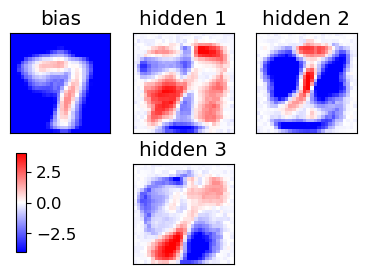

epoch 81 / 150  Nt: 2  N: 151  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 82 / 150  Nt: 2  N: 154  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 83 / 150  Nt: 2  N: 158  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 84 / 150  Nt: 2  N: 162  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 85 / 150  Nt: 2  N: 165  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 86 / 150  Nt: 2  N: 169  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 87 / 150  Nt: 2  N: 173  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 88 / 150  Nt: 2  N: 177  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 89 / 150  Nt: 2  N: 180  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 90 / 150  Nt: 2  N: 184  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 91 / 150  Nt: 2  N: 188  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 92 / 150  Nt: 2  N: 192  L: 3  rate: 0.05  gam: 

<Figure size 640x480 with 0 Axes>

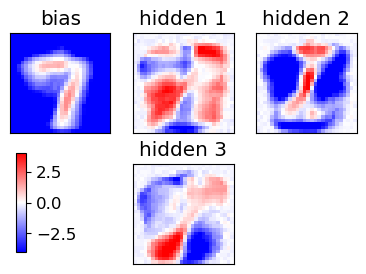

epoch 101 / 150  Nt: 2  N: 230  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 102 / 150  Nt: 2  N: 235  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 103 / 150  Nt: 2  N: 239  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 104 / 150  Nt: 2  N: 244  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 105 / 150  Nt: 2  N: 248  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 106 / 150  Nt: 2  N: 253  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 107 / 150  Nt: 2  N: 257  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 108 / 150  Nt: 2  N: 262  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 109 / 150  Nt: 2  N: 267  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 110 / 150  Nt: 2  N: 272  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 111 / 150  Nt: 2  N: 277  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 112 / 150  Nt: 2  N: 281  L: 3  rate:

<Figure size 640x480 with 0 Axes>

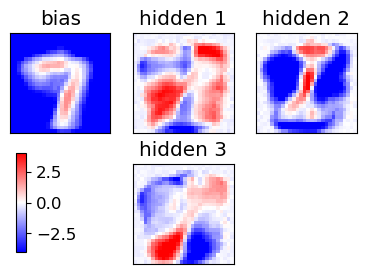

epoch 121 / 150  Nt: 2  N: 327  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 122 / 150  Nt: 2  N: 333  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 123 / 150  Nt: 2  N: 338  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 124 / 150  Nt: 2  N: 343  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 125 / 150  Nt: 2  N: 349  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 126 / 150  Nt: 2  N: 354  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 127 / 150  Nt: 2  N: 360  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 128 / 150  Nt: 2  N: 365  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 129 / 150  Nt: 2  N: 371  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 130 / 150  Nt: 2  N: 377  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 131 / 150  Nt: 2  N: 383  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 132 / 150  Nt: 2  N: 388  L: 3  rate:

<Figure size 640x480 with 0 Axes>

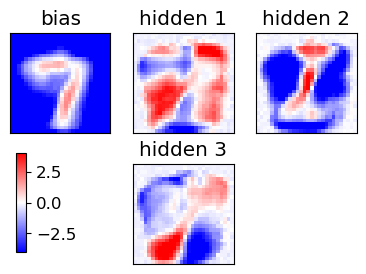

epoch 141 / 150  Nt: 2  N: 442  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 142 / 150  Nt: 2  N: 448  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 143 / 150  Nt: 2  N: 455  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
epoch 144 / 150  Nt: 2  N: 461  L: 3  rate: 0.05  gam: 0.001 SPINS= False POTTS= False


KeyboardInterrupt: 

In [26]:
for L in L_v:
    if L == 3:
        for Nt in Nt_v:

            # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
            w = sigma * np.random.randn(D,L)
            #a = sigma * np.random.randn(D)
            # using Hinton initialization of visible biases
            a = Hinton_bias_init(data)
            # hidden biases initialized to zero
            b = np.zeros(L)
            #print("w=",w);print("a=",a);print("b=",b)

            # nr of epochs
            Nepoch=150
            # minibatches per epoch
            Nmini=20
            # minibatch size at initial epoch and final one
            N_ini,N_fin=10,500
            print(f"Nepoch={Nepoch}\nNmini={Nmini}")


            # recording history of weights ("E" means epoch)
            wE,aE,bE=np.zeros((Nepoch+1,D,L)),np.zeros((Nepoch+1,D)),np.zeros((Nepoch+1,L))
            wE[0],aE[0],bE[0]=np.copy(w),np.copy(a),np.copy(b)
            gwE,gw2E,gwE_d,gwE_m = np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE)
            gaE,ga2E,gaE_d,gaE_m = np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE)
            gbE,gb2E,gbE_d,gbE_m = np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE)
            miniE = np.zeros(Nepoch+1)
            pzE=np.zeros((Nepoch+1,Nz))
            if GRAD=="RMSprop":
                gw2,ga2,gb2 = np.zeros_like(w),np.zeros_like(a),np.zeros_like(b)

            indices=np.arange(Nd).astype("int")
            plot_weights_bias(wE, aE, 0, L, cols=L//2, save=False)

            # for the plot with panels
            Ncols=min(8,max(2,L//2))

            if POTTS: print("Starting the training, POTTS=True")
            else: print("Starting the training")

            # Note: here an epoch does not analyze the whole dataset
            for epoch in range(1,1+Nepoch):
                # q maps epochs to interval [0,1]
                q = (epoch-1.)/(Nepoch-1.)
                # N, size of the mini batch
                # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
                N = int(N_ini + (N_fin-N_ini)*(q**2))
                #  l_rate interpolates between initial and final value
                l_rate = l_rate_ini + (l_rate_fin-l_rate_ini)*q

                for mini in range(Nmini):
                    # initializitation for averages in minibatch
                    # visible variables "v" --> "x"
                    #  hidden variables "h" --> "z"
                    x_data, x_model = np.zeros(D),np.zeros(D)
                    z_data, z_model = np.zeros(L),np.zeros(L)
                    xz_data,xz_model= np.zeros((D,L)),np.zeros((D,L))
                    pz = np.zeros(L)

                    # Minibatch of size N: points randomply picked (without repetition) from data
                    selected = np.random.choice(indices,N,replace=False)
                    if epoch==1 and mini<=3: print(selected)

                    for k in range(N):
                        ###################################
                        x0 = data[selected[k]]
                        # positive CD phase: generating z from x[k]
                        z = CD_step(x0,w,b,POTTS=POTTS)
                        x_data  += x0
                        z_data  += z
                        xz_data += np.outer(x0,z)
                        # fantasy
                        zf=np.copy(z)
                        # Contrastive divergence with Nt steps
                        for t in range(Nt):
                            # negative CD pzase: generating fantasy xf from fantasy zf
                            xf = CD_step(zf,w.T,a)
                            # positive CD phase: generating fantasy zf from fantasy xf
                            zf = CD_step(xf,w,b,POTTS=POTTS)
                        x_model += xf
                        z_model += zf
                        xz_model+= np.outer(xf,zf)
                        # recording probability of encoding in z-space, if POTTS
                        if POTTS: pz[zf]+=1
                        ###################################

                    # gradient of the likelihood: follow it along its positive direction
                    gw_d,gw_m = xz_data/N, xz_model/N
                    ga_d,ga_m = x_data/N, x_model/N
                    gb_d,gb_m = z_data/N, z_model/N
                    gw=np.copy(gw_d - gw_m)
                    ga=np.copy(ga_d - ga_m)
                    gb=np.copy(gb_d - gb_m)

                    # gradient ascent step
                    if GRAD=="RMSprop":
                        # RMSprop gradient ascent
                        gw2 = beta*gw2+(1-beta)*np.square(gw)
                        ga2 = beta*ga2+(1-beta)*np.square(ga)
                        gb2 = beta*gb2+(1-beta)*np.square(gb)
                        w += l_rate*gw/sqrt(epsilon+gw2)
                        a += l_rate*ga/sqrt(epsilon+ga2)
                        b += l_rate*gb/sqrt(epsilon+gb2)
                    else:
                        # defaulting to the vanilla stochastic gradient ascent (SGD)
                        w += l_rate*gw
                        a += l_rate*ga
                        b += l_rate*gb
                    # regularization (LASSO)
                    if gamma>0.:
                        w -= (gamma*l_rate)*sign(w)
                        a -= (gamma*l_rate)*sign(a)
                        b -= (gamma*l_rate)*sign(b)

                wE[epoch],gwE[epoch],gwE_d[epoch],gwE_m[epoch]=np.copy(w),np.copy(gw),np.copy(gw_d),np.copy(gw_m)
                aE[epoch],gaE[epoch],gaE_d[epoch],gaE_m[epoch]=np.copy(a),np.copy(ga),np.copy(ga_d),np.copy(ga_m)
                bE[epoch],gbE[epoch],gbE_d[epoch],gbE_m[epoch]=np.copy(b),np.copy(gb),np.copy(gb_d),np.copy(gb_m)
                miniE[epoch]=N
                if POTTS: pzE[epoch] = pz/np.sum(pz)
                print("epoch",epoch,"/",Nepoch," Nt:",Nt," N:",N," L:",L,
                      " rate:",l_rate," gam:",gamma,"SPINS=",SPINS,"POTTS=",POTTS)

                if Nepoch<=100 or epoch%20==0 or epoch==Nepoch:
                    plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)

                str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")
            save_epochs(wE,"w")
            save_epochs(bE,"b")
            save_epochs(aE,"a")

        print("END of learning phase")


    else:
        # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
        w = sigma * np.random.randn(D,L)
        #a = sigma * np.random.randn(D)
        # using Hinton initialization of visible biases
        a = Hinton_bias_init(data)
        # hidden biases initialized to zero
        b = np.zeros(L)
        #print("w=",w);print("a=",a);print("b=",b)

        # nr of epochs
        Nepoch=150
        # minibatches per epoch
        Nmini=20
        # minibatch size at initial epoch and final one
        N_ini,N_fin=10,500
        print(f"Nepoch={Nepoch}\nNmini={Nmini}")
        # number of CD steps
        Nt=2

        # recording history of weights ("E" means epoch)
        wE,aE,bE=np.zeros((Nepoch+1,D,L)),np.zeros((Nepoch+1,D)),np.zeros((Nepoch+1,L))
        wE[0],aE[0],bE[0]=np.copy(w),np.copy(a),np.copy(b)
        gwE,gw2E,gwE_d,gwE_m = np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE)
        gaE,ga2E,gaE_d,gaE_m = np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE)
        gbE,gb2E,gbE_d,gbE_m = np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE)
        miniE = np.zeros(Nepoch+1)
        pzE=np.zeros((Nepoch+1,Nz))
        if GRAD=="RMSprop":
            gw2,ga2,gb2 = np.zeros_like(w),np.zeros_like(a),np.zeros_like(b)

        indices=np.arange(Nd).astype("int")
        plot_weights_bias(wE, aE, 0, L, cols=L//2, save=False)

        # for the plot with panels
        Ncols=min(8,max(2,L//2))

        if POTTS: print("Starting the training, POTTS=True")
        else: print("Starting the training")

        # Note: here an epoch does not analyze the whole dataset
        for epoch in range(1,1+Nepoch):
            # q maps epochs to interval [0,1]
            q = (epoch-1.)/(Nepoch-1.)
            # N, size of the mini batch
            # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
            N = int(N_ini + (N_fin-N_ini)*(q**2))
            #  l_rate interpolates between initial and final value
            l_rate = l_rate_ini + (l_rate_fin-l_rate_ini)*q

            for mini in range(Nmini):
                # initializitation for averages in minibatch
                # visible variables "v" --> "x"
                #  hidden variables "h" --> "z"
                x_data, x_model = np.zeros(D),np.zeros(D)
                z_data, z_model = np.zeros(L),np.zeros(L)
                xz_data,xz_model= np.zeros((D,L)),np.zeros((D,L))
                pz = np.zeros(L)

                # Minibatch of size N: points randomply picked (without repetition) from data
                selected = np.random.choice(indices,N,replace=False)
                if epoch==1 and mini<=3: print(selected)

                for k in range(N):
                    ###################################
                    x0 = data[selected[k]]
                    # positive CD phase: generating z from x[k]
                    z = CD_step(x0,w,b,POTTS=POTTS)
                    x_data  += x0
                    z_data  += z
                    xz_data += np.outer(x0,z)
                    # fantasy
                    zf=np.copy(z)
                    # Contrastive divergence with Nt steps
                    for t in range(Nt):
                        # negative CD pzase: generating fantasy xf from fantasy zf
                        xf = CD_step(zf,w.T,a)
                        # positive CD phase: generating fantasy zf from fantasy xf
                        zf = CD_step(xf,w,b,POTTS=POTTS)
                    x_model += xf
                    z_model += zf
                    xz_model+= np.outer(xf,zf)
                    # recording probability of encoding in z-space, if POTTS
                    if POTTS: pz[zf]+=1
                    ###################################

                # gradient of the likelihood: follow it along its positive direction
                gw_d,gw_m = xz_data/N, xz_model/N
                ga_d,ga_m = x_data/N, x_model/N
                gb_d,gb_m = z_data/N, z_model/N
                gw=np.copy(gw_d - gw_m)
                ga=np.copy(ga_d - ga_m)
                gb=np.copy(gb_d - gb_m)

                # gradient ascent step
                if GRAD=="RMSprop":
                    # RMSprop gradient ascent
                    gw2 = beta*gw2+(1-beta)*np.square(gw)
                    ga2 = beta*ga2+(1-beta)*np.square(ga)
                    gb2 = beta*gb2+(1-beta)*np.square(gb)
                    w += l_rate*gw/sqrt(epsilon+gw2)
                    a += l_rate*ga/sqrt(epsilon+ga2)
                    b += l_rate*gb/sqrt(epsilon+gb2)
                else:
                    # defaulting to the vanilla stochastic gradient ascent (SGD)
                    w += l_rate*gw
                    a += l_rate*ga
                    b += l_rate*gb
                # regularization (LASSO)
                if gamma>0.:
                    w -= (gamma*l_rate)*sign(w)
                    a -= (gamma*l_rate)*sign(a)
                    b -= (gamma*l_rate)*sign(b)

            wE[epoch],gwE[epoch],gwE_d[epoch],gwE_m[epoch]=np.copy(w),np.copy(gw),np.copy(gw_d),np.copy(gw_m)
            aE[epoch],gaE[epoch],gaE_d[epoch],gaE_m[epoch]=np.copy(a),np.copy(ga),np.copy(ga_d),np.copy(ga_m)
            bE[epoch],gbE[epoch],gbE_d[epoch],gbE_m[epoch]=np.copy(b),np.copy(gb),np.copy(gb_d),np.copy(gb_m)
            miniE[epoch]=N
            if POTTS: pzE[epoch] = pz/np.sum(pz)
            print("epoch",epoch,"/",Nepoch," Nt:",Nt," N:",N," L:",L,
                  " rate:",l_rate," gam:",gamma,"SPINS=",SPINS,"POTTS=",POTTS)

            if Nepoch<=100 or epoch%20==0 or epoch==Nepoch:
                plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)

            str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")

        save_epochs(wE,"w")
        save_epochs(bE,"b")
        save_epochs(aE,"a")
        print("END of learning phase")


## Test generative power of the trained RBM

In [ ]:
ee=-1
NN=200
traj_x,traj_z = np.zeros((NN+2,D)), np.zeros((NN+2,L))
xf=np.copy(data[np.random.randint(Nd)])
traj_x[0]=np.copy(xf)

# AF: multiply weights and biases by a number >1 to achieve a more deterministic behavior,
# equivalent to lower the temperature in a Boltzmann weight -> select lowest energies
# Note: here, this is done in the negative CD step only
AF=1.

for t in range(NN):
    t1=t+1
    # positive CD phase: generating fantasy zf from fantasy xf
    zf = CD_step(xf,1*wE[ee],1*bE[ee],POTTS=POTTS)
    traj_z[t] = np.copy(zf)
    # negative CD pzase: generating fantasy xf from fantasy zf
    xf = CD_step(zf,AF*wE[ee].T,AF*aE[ee])
    traj_x[t1] = np.copy(xf)


plot_weights_bias(wE, aE, Nepoch, L, cols=Ncols, save=False)

col0,col1,col2,col3,col4=(0.8,0,0,1),(1,0.6,0,1),(0,.7,0,1),(0.2,0.2,1,1),(1,0,1,1)
show_MNIST(traj_x[0:],Nex=10,colors=(col0,col1))
show_MNIST(traj_x[10:],Nex=10,colors=(col1,col2))
show_MNIST(traj_x[20:],Nex=10,colors=(col2,col3))
show_MNIST(traj_x[40:],Nex=10,colors=(col3,col4))
print("L:",L,"    amplification of weights:",AF)

## Plot of the gradient amplitude

In [13]:
def make_fname(strin):
    fname="FIG/RBM_"+strin+"_MNIST"+str(Ndigit)+"_E"+str(NE)+"_N"+str(N_ini)+"-"+str(N_fin)
    fname=fname+"_"+GRAD+"-"+str(l_rate_ini)+"-"+str(l_rate_fin)+"_CD-"+str(Nt)+"_L"+str(L)
    if gamma>0:  fname=fname+"_reg"+str(gamma)
    return fname+".png"

NE = len(gwE)-1
print("NE=",NE)
mgw,mga,mgb,epo=np.zeros(NE),np.zeros(NE),np.zeros(NE),np.zeros(NE)
DE=1
if NE>30: DE=2
if NE>50: DE=5
if NE>100: DE=10
# compute RMS average of gradients during epochs
for ep in range(1,1+NE):
    epo[ep-1]=ep
    mgw[ep-1] = np.std(gwE[ep])
    mga[ep-1] = np.std(gaE[ep])
    mgb[ep-1] = np.std(gbE[ep])

#############################################################################
# creating grid for subplots
fig, ax = plt.subplots(1, 1, figsize=(8,5.5))
fig.subplots_adjust( left=None, bottom=None,  right=None, top=None, wspace=None, hspace=None)

ax.xaxis.set_major_locator(mpl.ticker.MultipleLocator(DE))
ax.plot(epo,mgw,"o-",c="#CC77EC",label="$w$",zorder=10)
ax.plot(epo,mga,"d--",c="#22C040",label="$a$",zorder=5)
ax.plot(epo,mgb,"^:",c="#EEC006",label="$b$",zorder=8)
ax.plot(epo,.35/sqrt(miniE[1:]),"k-.",label="$\sim 1 / \sqrt{N}$",zorder=20,lw=2)
ax.set_xlabel("Epoch")
ax.set_ylabel("gradient RMS")
ax.set_xlim(0.5,NE+0.5)
if 1==2: ax.set_ylim(0,)
else:
    ax.set_xlim(0.8,Nepoch*1.1)
    ax.set_xscale("log")
    ax.set_yscale("log")
ax.legend()

fname=make_fname("grad")
fig.savefig(fname,dpi=200,bbox_inches='tight',pad_inches=0.02, transparent=False)
plt.show()
print(fname)

NameError: name 'gwE' is not defined

## Log-likelihood calculation

In [8]:
import numpy as np
from tqdm import tqdm
import itertools as it
from scipy.optimize import curve_fit
from numba import jit

def compute_log_likelihood(w, a, b, data):

    D = w.shape[0]      #  visible units
    L = w.shape[1]    #  hidden units
    M = data.shape[0]      # data
    
    if POTTS:
        all_z = [np.eye(L, dtype=np.float64)[i] for i in range(L)]  # Lista di vettori separati
    else:
        all_z = np.array(list(it.product((0, 1), repeat=L)), dtype=np.float64)  ### dtype used for numba
        
    log_likelihoods = []

    sample_size=int(M/4) #### take 1/4 of the data for each epoch
    idx = np.random.choice(M, sample_size, replace=False)
    data_sample = data[idx]
    log_likelihoods = []

    for m in tqdm(range(len(data_sample)), desc='Computing log-likelihood'):
        x = data_sample[m]
        log_likelihoods.append(compute_single_log_likelihood(w, a, b, x, all_z, D, L))


    return np.mean(log_likelihoods)

@jit(nopython=True)
def compute_single_log_likelihood(w, a, b, x, all_z, D, L):
    if POTTS:
        q_samples = []
        for i in range(min(100, D)):  # Sample a few visible units
            for z_idx in range(min(10, L)):  # Sample a few hidden states
                z = all_z[z_idx]
                H_i = a[i] + np.dot(w[i], z)
                q_samples.append(1 + np.exp(H_i))
    else:
        q_samples = []
        for i in range(min(100, D)):  # Sample a few visible units
            for z_idx in range(min(10, 2**L)):  # Sample a few hidden states
                z = all_z[z_idx]
                H_i = a[i] + np.dot(w[i], z)
                q_samples.append(1 + np.exp(H_i))
    q = np.mean(np.array(q_samples))


    first_term = compute_free_energy_term(w, a, b, x, all_z, q, D)
    second_term = -compute_partition_function(w, a, b, all_z, q, D)

    return first_term + second_term




@jit(nopython=True)
def compute_partition_function(w, a, b, all_z, q, D):

    sum_term = 0

    for z in all_z:
        G_z=1.0
        for i in range(L):
            G_z *= np.exp(b[i] * z[i])

        product_term = 1.0
        for i in range(D):
            H_i = a[i] + np.dot(w[i], z)
            product_term *= (1 + np.exp(H_i)) / q

        sum_term += G_z * product_term

    return D * np.log(q) + np.log(sum_term)

@jit(nopython=True)
def compute_free_energy_term(w, a, b, x, all_z, q, D):
    """
    Compute the free energy term using log-space arithmetic for numerical stability.
    This implements the formula: e^(-E(x,z)) = ∏_μ e^(b_μ*z_μ) * ∏_i e^(H_i(z)*x_i)
    """
    # Use log-sum-exp trick for numerical stability
    log_terms = np.zeros(len(all_z))

    for z_idx in range(len(all_z)):
        z = all_z[z_idx]

        # Compute log G(z) = log(∏_μ e^(b_μ*z_μ)) = ∑_μ b_μ*z_μ
        log_G_z = np.sum(b * z)

        # Compute log product term for visible units
        log_product = 0.0
        for i in range(D):
            if x[i] == 1:  # Only consider where x = 1
                H_i = a[i] + np.dot(w[i], z)
                log_product += H_i
            #if x[i] == -1:  # Only consider where x = -1
            #    H_i = a[i] + np.dot(w[i], z)
            #    log_product += (-H_i)
            ### case x=0 we have 0 (log(e^(H_z*x)=0))

        # Total log term for this z
        log_terms[z_idx] = log_G_z + log_product

    # Log-sum-exp trick: log(∑_i e^x_i) = a + log(∑_i e^(x_i - a))
    # where a = max(x_i) to prevent overflow
    if len(log_terms) > 0:
        max_log_term = np.max(log_terms)
        # Avoid -inf if all terms are -inf
        if max_log_term == -np.inf:
            return -np.inf

        sum_exp = np.sum(np.exp(log_terms - max_log_term))
        return max_log_term + np.log(sum_exp)
    else:
        return -np.inf  # If no hidden states, return -inf

## Likelihood evolution during the whole training  

In [13]:
# Log-likelihood evolution for different L and fixed CD steps = 2
log_like_L=[]
for L in L_v:
    Nt=2
    a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
    print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
    b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
    print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
    w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
    print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch

    log_like=[]
    num_epo=[]
    Nepoch=150
    n=3  ### take 1/3 of the epoch
    for i in range(Nepoch):
        if i%n==0:
            print(f'Epoch n.{i}')
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            log_like.append(ll)
            num_epo.append(i)
            print('Log-likelihood=',ll)
    log_like_L.append(log_like)


a_all L=3, Nt=2
b_all L=3, Nt=2
w_all L=3, Nt=2
Epoch n.0


NameError: name 'compute_log_likelihood' is not defined

In [23]:
log_like_L=[]
for L in L_v:
    if L==7: 
        Nt=2             
        a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_0_reg0.001.npy", allow_pickle=True)
        print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
        b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_0_reg0.001.npy", allow_pickle=True)
        print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
        w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_0_reg0.001.npy", allow_pickle=True)
        print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch
    
        log_like=[]
        num_epo=[]
        Nepoch=150
        n=3  ### take 1/3 of the epoch
        for i in range(Nepoch):
            if i%n==0:
                print(f'Epoch n.{i}')
                ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
                log_like.append(ll)
                num_epo.append(i)
                print('Log-likelihood=',ll)
        log_like_L.append(log_like)


a_all L=7, Nt=2
b_all L=7, Nt=2
w_all L=7, Nt=2
Epoch n.0


/tmp/ipykernel_18771/1603196961.py:52: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float64, 1, 'C', False, aligned=True), Array(float64, 1, 'A', False, aligned=True))
  second_term = -compute_partition_function(w, a, b, all_z, q, D)
Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:02<00:00, 87.86it/s]


Log-likelihood= -167.21015708045795
Epoch n.3


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.50it/s]


Log-likelihood= -143.69547159806135
Epoch n.6


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.35it/s]


Log-likelihood= -134.05986407159168
Epoch n.9


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.10it/s]


Log-likelihood= -133.541273734767
Epoch n.12


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 111.33it/s]


Log-likelihood= -133.05896062848387
Epoch n.15


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:50<00:00, 109.21it/s]


Log-likelihood= -124.8286611864581
Epoch n.18


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:52<00:00, 104.34it/s]


Log-likelihood= -125.8986841931941
Epoch n.21


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:52<00:00, 104.57it/s]


Log-likelihood= -125.07803844801387
Epoch n.24


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.05it/s]


Log-likelihood= -123.66899066251531
Epoch n.27


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.98it/s]


Log-likelihood= -125.61939947695221
Epoch n.30


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 112.07it/s]


Log-likelihood= -125.91008989063265
Epoch n.33


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.21it/s]


Log-likelihood= -122.15374491285259
Epoch n.36


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.06it/s]


Log-likelihood= -126.06818877007585
Epoch n.39


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 117.60it/s]


Log-likelihood= -121.37999566067782
Epoch n.42


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.01it/s]


Log-likelihood= -122.36711026966447
Epoch n.45


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 119.92it/s]


Log-likelihood= -124.85913486758416
Epoch n.48


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.66it/s]


Log-likelihood= -123.06479121714958
Epoch n.51


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.79it/s]


Log-likelihood= -122.65946710257374
Epoch n.54


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 119.95it/s]


Log-likelihood= -120.95864036668401
Epoch n.57


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.80it/s]


Log-likelihood= -119.45354382788496
Epoch n.60


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 119.49it/s]


Log-likelihood= -121.24980298906522
Epoch n.63


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 118.34it/s]


Log-likelihood= -120.2945620026384
Epoch n.66


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.28it/s]


Log-likelihood= -120.05563198664596
Epoch n.69


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.54it/s]


Log-likelihood= -120.30736951894907
Epoch n.72


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.54it/s]


Log-likelihood= -116.10805611474741
Epoch n.75


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.74it/s]


Log-likelihood= -118.72813276988742
Epoch n.78


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 119.50it/s]


Log-likelihood= -121.51814839853212
Epoch n.81


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:44<00:00, 122.78it/s]


Log-likelihood= -120.66241383009469
Epoch n.84


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:44<00:00, 122.18it/s]


Log-likelihood= -119.61655567639976
Epoch n.87


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 118.67it/s]


Log-likelihood= -121.49907624868196
Epoch n.90


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 122.10it/s]


Log-likelihood= -118.55863224499517
Epoch n.93


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 122.00it/s]


Log-likelihood= -120.96908754529845
Epoch n.96


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 119.68it/s]


Log-likelihood= -118.84445549791039
Epoch n.99


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.10it/s]


Log-likelihood= -117.9795056853151
Epoch n.102


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.37it/s]


Log-likelihood= -121.58439433749744
Epoch n.105


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.77it/s]


Log-likelihood= -119.26422652696318
Epoch n.108


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:44<00:00, 122.69it/s]


Log-likelihood= -118.46885116646325
Epoch n.111


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 118.61it/s]


Log-likelihood= -121.97996308072376
Epoch n.114


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.72it/s]


Log-likelihood= -120.9704144000421
Epoch n.117


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 115.22it/s]


Log-likelihood= -118.30891898218017
Epoch n.120


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 118.19it/s]


Log-likelihood= -116.4022327361629
Epoch n.123


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 122.14it/s]


Log-likelihood= -119.95962856462927
Epoch n.126


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.84it/s]


Log-likelihood= -119.40629840221311
Epoch n.129


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 119.77it/s]


Log-likelihood= -118.00424459820317
Epoch n.132


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.35it/s]


Log-likelihood= -118.83197293016883
Epoch n.135


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 119.14it/s]


Log-likelihood= -118.71106509103116
Epoch n.138


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.08it/s]


Log-likelihood= -116.58944889044969
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 121.71it/s]


Log-likelihood= -120.0011370158435
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:45<00:00, 120.23it/s]


Log-likelihood= -117.69754197264506
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:44<00:00, 122.41it/s]

Log-likelihood= -119.17939743643285


In [ ]:
log_like_cd=[]

# Log-likelihood evolution for fixed L=3 and different CD steps

for L in L_v:
    if L==3:
        for Nt in Nt_v:
            a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
            print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
            b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
            print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
            w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
            print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch

            log_like=[]
            num_epo=[]
            Nepoch=150
            n=3  ### take 1/3 of the epoch
            for i in range(Nepoch):
                if i%n==0:
                    print(f'Epoch n.{i}')
                    ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
                    log_like.append(ll)
                    num_epo.append(i)
                    print('Log-likelihood=',ll)
            log_like_cd.append(log_like)

a_all L=3, Nt=2
b_all L=3, Nt=2
w_all L=3, Nt=2
Epoch n.0


Computing log-likelihood:   0%|                                                                | 0/5498 [00:00<?, ?it/s]/tmp/ipykernel_681/779657587.py:41: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float64, 1, 'C', False, aligned=True), Array(float64, 1, 'A', False, aligned=True))
  second_term = -compute_partition_function(w, a, b, all_z, q, D)
Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:07<00:00, 770.57it/s]


Log-likelihood= -167.0619582470125
Epoch n.3


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1232.37it/s]


Log-likelihood= -153.91380773196778
Epoch n.6


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 910.76it/s]


Log-likelihood= -150.79911203045867
Epoch n.9


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1228.20it/s]


Log-likelihood= -146.18286317167184
Epoch n.12


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1263.60it/s]


Log-likelihood= -150.7975139446413
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1238.64it/s]


Log-likelihood= -145.83368565576026
Epoch n.18


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1240.14it/s]


Log-likelihood= -141.8379678125805
Epoch n.21


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1267.99it/s]


Log-likelihood= -143.07079172851942
Epoch n.24


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1222.20it/s]


Log-likelihood= -140.99871912316317
Epoch n.27


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 949.04it/s]


Log-likelihood= -142.12682516332038
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.82it/s]


Log-likelihood= -142.22555042710545
Epoch n.33


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1248.07it/s]


Log-likelihood= -140.4195790171541
Epoch n.36


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1228.18it/s]


Log-likelihood= -136.61794028844332
Epoch n.39


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1203.60it/s]


Log-likelihood= -140.7232094456506
Epoch n.42


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1194.89it/s]


Log-likelihood= -137.02533088838942
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1225.04it/s]


Log-likelihood= -137.24895116667676
Epoch n.48


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 906.42it/s]


Log-likelihood= -135.54764095984305
Epoch n.51


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1235.00it/s]


Log-likelihood= -137.10179325629935
Epoch n.54


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1211.42it/s]


Log-likelihood= -136.4280190549347
Epoch n.57


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1230.77it/s]


Log-likelihood= -136.0602139530983
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1211.36it/s]


Log-likelihood= -136.78500666781412
Epoch n.63


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1191.30it/s]


Log-likelihood= -134.84579821080163
Epoch n.66


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1188.08it/s]


Log-likelihood= -137.9025134591677
Epoch n.69


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 907.00it/s]


Log-likelihood= -136.38151146505055
Epoch n.72


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1214.63it/s]


Log-likelihood= -135.99726567713552
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1283.27it/s]


Log-likelihood= -137.06047926507108
Epoch n.78


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1280.33it/s]


Log-likelihood= -135.30578629736476
Epoch n.81


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1256.05it/s]


Log-likelihood= -137.31241494184835
Epoch n.84


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1210.18it/s]


Log-likelihood= -136.47912744683077
Epoch n.87


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1235.31it/s]


Log-likelihood= -136.41121429688255
Epoch n.90


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 952.78it/s]


Log-likelihood= -136.17395894916874
Epoch n.93


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1277.62it/s]


Log-likelihood= -138.0128243180918
Epoch n.96


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1223.26it/s]


Log-likelihood= -136.45627614196752
Epoch n.99


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1231.80it/s]


Log-likelihood= -135.18712117774922
Epoch n.102


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1290.66it/s]


Log-likelihood= -135.66665644578342
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1251.38it/s]


Log-likelihood= -136.1487433065035
Epoch n.108


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1230.72it/s]


Log-likelihood= -137.32125230815697
Epoch n.111


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1209.89it/s]


Log-likelihood= -136.39701093756725
Epoch n.114


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 937.73it/s]


Log-likelihood= -136.0396811463683
Epoch n.117


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.36it/s]


Log-likelihood= -137.0263635392604
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1275.57it/s]


Log-likelihood= -137.27674244462864
Epoch n.123


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1224.63it/s]


Log-likelihood= -136.3430194145506
Epoch n.126


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1251.73it/s]


Log-likelihood= -134.91024641798245
Epoch n.129


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1254.12it/s]


Log-likelihood= -136.45110741263926
Epoch n.132


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1233.69it/s]


Log-likelihood= -135.25465109010926
Epoch n.135


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 970.00it/s]


Log-likelihood= -138.50978350410554
Epoch n.138


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1204.74it/s]


Log-likelihood= -137.53445534268457
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1315.34it/s]


Log-likelihood= -135.25248446687726
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1293.21it/s]


Log-likelihood= -134.7393113270953
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1349.08it/s]


Log-likelihood= -135.50172222870538
a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1283.75it/s]


Log-likelihood= -167.36940146232564
Epoch n.3


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1256.07it/s]


Log-likelihood= -151.43773272715717
Epoch n.6


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 896.82it/s]


Log-likelihood= -144.3845672898909
Epoch n.9


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1198.08it/s]


Log-likelihood= -143.56116545836343
Epoch n.12


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1269.06it/s]


Log-likelihood= -143.3527488061263
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1300.68it/s]


Log-likelihood= -144.96469604835798
Epoch n.18


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1245.40it/s]


Log-likelihood= -142.3012742833728
Epoch n.21


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1272.85it/s]


Log-likelihood= -144.398954662032
Epoch n.24


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1261.93it/s]


Log-likelihood= -141.7963459418535
Epoch n.27


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1254.79it/s]


Log-likelihood= -136.9520382794936
Epoch n.30


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 891.64it/s]


Log-likelihood= -135.63967127927643
Epoch n.33


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1237.67it/s]


Log-likelihood= -136.30290107990388
Epoch n.36


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1333.90it/s]


Log-likelihood= -133.89693107867691
Epoch n.39


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1228.42it/s]


Log-likelihood= -134.99542196672812
Epoch n.42


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.53it/s]


Log-likelihood= -133.84014328659825
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1238.52it/s]


Log-likelihood= -133.29639517749263
Epoch n.48


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1267.71it/s]


Log-likelihood= -136.0565559487416
Epoch n.51


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 898.17it/s]


Log-likelihood= -134.6582134468092
Epoch n.54


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1225.51it/s]


Log-likelihood= -135.177865176888
Epoch n.57


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.43it/s]


Log-likelihood= -132.00759638737156
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1228.68it/s]


Log-likelihood= -133.59414596591458
Epoch n.63


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1313.61it/s]


Log-likelihood= -131.81053497207705
Epoch n.66


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1284.74it/s]


Log-likelihood= -133.43774761751385
Epoch n.69


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1232.19it/s]


Log-likelihood= -131.84274459764572
Epoch n.72


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 867.37it/s]


Log-likelihood= -134.4900621721476
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1260.81it/s]


Log-likelihood= -132.17387960725944
Epoch n.78


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.63it/s]


Log-likelihood= -130.82083706899934
Epoch n.81


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1256.74it/s]


Log-likelihood= -132.4570817997721
Epoch n.84


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1270.64it/s]


Log-likelihood= -132.46815091715993
Epoch n.87


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1294.71it/s]


Log-likelihood= -131.7122546405801
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1253.46it/s]


Log-likelihood= -132.73711857846368
Epoch n.93


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.65it/s]


Log-likelihood= -136.3271404346707
Epoch n.96


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 839.53it/s]


Log-likelihood= -131.37788768183972
Epoch n.99


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1214.22it/s]


Log-likelihood= -131.6937956044197
Epoch n.102


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1260.28it/s]


Log-likelihood= -132.68132608309315
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1230.24it/s]


Log-likelihood= -133.2517339791439
Epoch n.108


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1254.40it/s]


Log-likelihood= -131.1810143942101
Epoch n.111


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1252.16it/s]


Log-likelihood= -132.44167619085445
Epoch n.114


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1261.44it/s]


Log-likelihood= -132.66020855132223
Epoch n.117


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 956.63it/s]


Log-likelihood= -132.3814993435518
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1237.37it/s]


Log-likelihood= -132.50923720927764
Epoch n.123


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.09it/s]


Log-likelihood= -131.42889961780284
Epoch n.126


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1233.71it/s]


Log-likelihood= -132.5620227199188
Epoch n.129


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1220.10it/s]


Log-likelihood= -132.43300186401777
Epoch n.132


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.91it/s]


Log-likelihood= -133.42060307796527
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1253.80it/s]


Log-likelihood= -132.09346580783387
Epoch n.138


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 901.65it/s]


Log-likelihood= -131.87058058883463
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1249.32it/s]


Log-likelihood= -134.57359530666105
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1274.77it/s]


Log-likelihood= -130.6430868309253
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1272.11it/s]


Log-likelihood= -131.71583986828782
a_all L=3, Nt=6
b_all L=3, Nt=6
w_all L=3, Nt=6
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1249.86it/s]


Log-likelihood= -166.7634028764675
Epoch n.3


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1260.69it/s]


Log-likelihood= -151.15352518686646
Epoch n.6


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1266.06it/s]


Log-likelihood= -146.27894989351333
Epoch n.9


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1244.21it/s]


Log-likelihood= -142.690763221806
Epoch n.12


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 897.87it/s]


Log-likelihood= -147.71445502255128
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1278.30it/s]


Log-likelihood= -141.4454504162074
Epoch n.18


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1261.10it/s]


Log-likelihood= -142.45002446620478
Epoch n.21


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1241.77it/s]


Log-likelihood= -144.102879912941
Epoch n.24


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1257.02it/s]


Log-likelihood= -141.17957245293158
Epoch n.27


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.81it/s]


Log-likelihood= -140.6371147404727
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1231.23it/s]


Log-likelihood= -140.62353996101098
Epoch n.33


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 917.21it/s]


Log-likelihood= -139.85141189192692
Epoch n.36


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1237.81it/s]


Log-likelihood= -139.5033773228586
Epoch n.39


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1271.90it/s]


Log-likelihood= -140.37725486133374
Epoch n.42


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1233.09it/s]


Log-likelihood= -137.50988469891493
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1260.98it/s]


Log-likelihood= -135.0570553043074
Epoch n.48


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1239.95it/s]


Log-likelihood= -136.99723130659953
Epoch n.51


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1232.13it/s]


Log-likelihood= -136.55809345366367
Epoch n.54


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 916.64it/s]


Log-likelihood= -136.42198081143192
Epoch n.57


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1240.09it/s]


Log-likelihood= -137.28494160963143
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1229.15it/s]


Log-likelihood= -140.75155583266866
Epoch n.63


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1249.45it/s]


Log-likelihood= -139.42824707760516
Epoch n.66


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1235.01it/s]


Log-likelihood= -137.13251909571457
Epoch n.69


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1225.73it/s]


Log-likelihood= -136.08375759162547
Epoch n.72


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1254.79it/s]


Log-likelihood= -136.37213302683818
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1271.42it/s]


Log-likelihood= -136.59410698361526
Epoch n.78


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 879.84it/s]


Log-likelihood= -136.00938083701752
Epoch n.81


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1225.33it/s]


Log-likelihood= -137.5678988128239
Epoch n.84


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1236.84it/s]


Log-likelihood= -136.10471054977847
Epoch n.87


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1256.47it/s]


Log-likelihood= -137.29371668635915
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1239.31it/s]


Log-likelihood= -137.8961458059041
Epoch n.93


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.05it/s]


Log-likelihood= -138.4513244625272
Epoch n.96


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1257.29it/s]


Log-likelihood= -135.87242493666943
Epoch n.99


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1224.95it/s]


Log-likelihood= -136.44733559063818
Epoch n.102


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1261.26it/s]


Log-likelihood= -137.00195069618383
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1262.31it/s]


Log-likelihood= -136.86439670673303
Epoch n.108


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 815.37it/s]


Log-likelihood= -134.7454175841513
Epoch n.111


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1237.92it/s]


Log-likelihood= -137.75032469458253
Epoch n.114


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1237.32it/s]


Log-likelihood= -137.78079650353163
Epoch n.117


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1237.60it/s]


Log-likelihood= -136.9083287967815
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1252.70it/s]


Log-likelihood= -139.2609880056879
Epoch n.123


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1264.45it/s]


Log-likelihood= -137.4908654551755
Epoch n.126


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1241.15it/s]


Log-likelihood= -137.67328807466222
Epoch n.129


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1264.60it/s]


Log-likelihood= -138.69091278034927
Epoch n.132


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 898.12it/s]


Log-likelihood= -136.66958834478174
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1246.51it/s]


Log-likelihood= -138.29734077361582
Epoch n.138


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1249.19it/s]


Log-likelihood= -138.16385850538117
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1244.26it/s]


Log-likelihood= -138.38227959002984
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1268.34it/s]


Log-likelihood= -137.01459933025427
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1275.15it/s]


Log-likelihood= -138.7525759228951
a_all L=3, Nt=8
b_all L=3, Nt=8
w_all L=3, Nt=8
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1243.13it/s]


Log-likelihood= -167.31564281850328
Epoch n.3


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 913.72it/s]


Log-likelihood= -150.35861217693633
Epoch n.6


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1253.55it/s]


Log-likelihood= -144.29489631159421
Epoch n.9


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1246.61it/s]


Log-likelihood= -142.13831512765285
Epoch n.12


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1241.30it/s]


Log-likelihood= -147.16972180838596
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1232.34it/s]


Log-likelihood= -141.0404683278056
Epoch n.18


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.99it/s]


Log-likelihood= -139.74240721315616
Epoch n.21


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1227.65it/s]


Log-likelihood= -142.73999370693215
Epoch n.24


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 916.81it/s]


Log-likelihood= -140.16049708519932
Epoch n.27


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1262.83it/s]


Log-likelihood= -143.15510121602594
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1253.91it/s]


Log-likelihood= -140.90457871997285
Epoch n.33


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1239.65it/s]


Log-likelihood= -139.22911230905567
Epoch n.36


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1268.38it/s]


Log-likelihood= -141.2804208852259
Epoch n.39


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1243.31it/s]


Log-likelihood= -138.64478475085116
Epoch n.42


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.33it/s]


Log-likelihood= -143.0623838945089
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1273.84it/s]


Log-likelihood= -137.07448907598345
Epoch n.48


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 926.71it/s]


Log-likelihood= -140.5984547727017
Epoch n.51


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1217.29it/s]


Log-likelihood= -140.9587831158454
Epoch n.54


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1226.93it/s]


Log-likelihood= -138.50455965817602
Epoch n.57


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1232.14it/s]


Log-likelihood= -136.50814773019974
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1226.97it/s]


Log-likelihood= -134.39514179476876
Epoch n.63


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1244.80it/s]


Log-likelihood= -132.50361026174025
Epoch n.66


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1239.07it/s]


Log-likelihood= -131.3766467997649
Epoch n.69


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 883.92it/s]


Log-likelihood= -132.33407555424958
Epoch n.72


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1216.80it/s]


Log-likelihood= -130.9411932820327
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.62it/s]


Log-likelihood= -131.71599215293935
Epoch n.78


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1294.58it/s]


Log-likelihood= -130.72131673472666
Epoch n.81


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1276.64it/s]


Log-likelihood= -131.5507384529515
Epoch n.84


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1276.57it/s]


Log-likelihood= -131.6547504762219
Epoch n.87


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.51it/s]


Log-likelihood= -132.20397535514192
Epoch n.90


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 852.84it/s]


Log-likelihood= -132.3993321016373
Epoch n.93


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.41it/s]


Log-likelihood= -133.73495199250806
Epoch n.96


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1254.18it/s]


Log-likelihood= -132.18985968909453
Epoch n.99


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1253.49it/s]


Log-likelihood= -131.22713267169217
Epoch n.102


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1236.38it/s]


Log-likelihood= -132.23505959142645
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.68it/s]


Log-likelihood= -132.81279748245015
Epoch n.108


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1247.40it/s]


Log-likelihood= -132.2461470620024
Epoch n.111


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1244.35it/s]


Log-likelihood= -132.4716930709083
Epoch n.114


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 910.99it/s]


Log-likelihood= -131.40155804987614
Epoch n.117


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1245.19it/s]


Log-likelihood= -132.09725856214712
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1246.10it/s]


Log-likelihood= -131.6298966380341
Epoch n.123


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1258.07it/s]


Log-likelihood= -132.1806173753379
Epoch n.126


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.37it/s]


Log-likelihood= -132.13322236118844
Epoch n.129


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1266.51it/s]


Log-likelihood= -132.06134592628803
Epoch n.132


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1273.08it/s]


Log-likelihood= -132.48208518200497
Epoch n.135


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 884.69it/s]


Log-likelihood= -132.0035838441319
Epoch n.138


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1267.09it/s]


Log-likelihood= -130.78705168973687
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1246.89it/s]


Log-likelihood= -131.87597167461564
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1237.15it/s]


Log-likelihood= -131.43193712314883
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1243.09it/s]


Log-likelihood= -130.04848288318848
a_all L=3, Nt=10
b_all L=3, Nt=10
w_all L=3, Nt=10
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1252.67it/s]


Log-likelihood= -167.47056590756083
Epoch n.3


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1247.55it/s]


Log-likelihood= -152.78426780693434
Epoch n.6


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:05<00:00, 938.12it/s]


Log-likelihood= -148.5082170896151
Epoch n.9


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1238.49it/s]


Log-likelihood= -149.18253967706548
Epoch n.12


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1213.26it/s]


Log-likelihood= -145.98741749321914
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1262.67it/s]


Log-likelihood= -139.4214199220991
Epoch n.18


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1243.58it/s]


Log-likelihood= -139.24265310905963
Epoch n.21


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1258.49it/s]


Log-likelihood= -138.7342858108394
Epoch n.24


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1245.03it/s]


Log-likelihood= -135.40335746895434
Epoch n.27


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1267.83it/s]


Log-likelihood= -139.47881685966775
Epoch n.30


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 891.35it/s]


Log-likelihood= -138.65822662770162
Epoch n.33


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1275.02it/s]


Log-likelihood= -135.30143410885884
Epoch n.36


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1235.58it/s]


Log-likelihood= -135.17698744360462
Epoch n.39


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1267.56it/s]


Log-likelihood= -139.56140381506125
Epoch n.42


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1257.57it/s]


Log-likelihood= -133.9219437081514
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1248.16it/s]


Log-likelihood= -135.93916219844047
Epoch n.48


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1262.36it/s]


Log-likelihood= -136.43983222328924
Epoch n.51


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 874.04it/s]


Log-likelihood= -136.8590577664586
Epoch n.54


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1220.21it/s]


Log-likelihood= -138.47885274867622
Epoch n.57


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1228.54it/s]


Log-likelihood= -137.53233337674422
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.27it/s]


Log-likelihood= -139.25807740849527
Epoch n.63


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1257.50it/s]


Log-likelihood= -138.09750044385825
Epoch n.66


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1262.94it/s]


Log-likelihood= -138.88606529130746
Epoch n.69


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1248.08it/s]


Log-likelihood= -138.20988583942773
Epoch n.72


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 888.36it/s]


Log-likelihood= -140.86382655618718
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1217.13it/s]


Log-likelihood= -136.72671812396788
Epoch n.78


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1212.05it/s]


Log-likelihood= -139.1053296960345
Epoch n.81


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1323.28it/s]


Log-likelihood= -138.0744965854004
Epoch n.84


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1268.30it/s]


Log-likelihood= -139.40683765388803
Epoch n.87


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1260.49it/s]


Log-likelihood= -138.48899084780825
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1233.78it/s]


Log-likelihood= -137.93185797478017
Epoch n.93


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1261.77it/s]


Log-likelihood= -138.01088857944683
Epoch n.96


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 867.62it/s]


Log-likelihood= -138.90194016356588
Epoch n.99


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1246.11it/s]


Log-likelihood= -139.34268786990438
Epoch n.102


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1258.97it/s]


Log-likelihood= -138.23128831900493
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1220.89it/s]


Log-likelihood= -138.65132015277578
Epoch n.108


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1321.52it/s]


Log-likelihood= -138.26414390146837
Epoch n.111


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1258.47it/s]


Log-likelihood= -139.74424879531273
Epoch n.114


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1260.26it/s]


Log-likelihood= -137.91656112923917
Epoch n.117


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 896.23it/s]


Log-likelihood= -138.5140110170626
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1221.94it/s]


Log-likelihood= -139.44086498166567
Epoch n.123


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1282.22it/s]


Log-likelihood= -139.77781710663538
Epoch n.126


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1329.14it/s]


Log-likelihood= -140.43495970528335
Epoch n.129


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1284.53it/s]


Log-likelihood= -139.17682656849638
Epoch n.132


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1258.04it/s]


Log-likelihood= -138.8048585606388
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.05it/s]


Log-likelihood= -140.13499742601536
Epoch n.138


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1223.99it/s]


Log-likelihood= -139.00813222817635
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 829.76it/s]


Log-likelihood= -138.00225444937234
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1222.58it/s]


Log-likelihood= -139.9386178315608
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1251.62it/s]


Log-likelihood= -137.73756883377519
a_all L=3, Nt=15
b_all L=3, Nt=15
w_all L=3, Nt=15
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1271.31it/s]


Log-likelihood= -167.56688305548167
Epoch n.3


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1326.03it/s]


Log-likelihood= -149.57459003697164
Epoch n.6


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1306.80it/s]


Log-likelihood= -148.92201576745612
Epoch n.9


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1272.40it/s]


Log-likelihood= -144.49699483912954
Epoch n.12


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 888.95it/s]


Log-likelihood= -142.65000422223918
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.77it/s]


Log-likelihood= -140.4280441424735
Epoch n.18


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1254.11it/s]


Log-likelihood= -141.7448350819875
Epoch n.21


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1250.48it/s]


Log-likelihood= -137.7395302170032
Epoch n.24


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1313.94it/s]


Log-likelihood= -139.69429142694176
Epoch n.27


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1262.21it/s]


Log-likelihood= -139.14603038264303
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1262.13it/s]


Log-likelihood= -137.47472515699013
Epoch n.33


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 864.12it/s]


Log-likelihood= -136.56899743627926
Epoch n.36


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1226.07it/s]


Log-likelihood= -135.74029496060325
Epoch n.39


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1268.21it/s]


Log-likelihood= -134.7535182435389
Epoch n.42


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1312.98it/s]


Log-likelihood= -134.72844823472388
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1297.33it/s]


Log-likelihood= -133.1559386275543
Epoch n.48


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1294.03it/s]


Log-likelihood= -130.79011379950413
Epoch n.51


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1242.33it/s]


Log-likelihood= -132.93062435337276
Epoch n.54


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1231.01it/s]


Log-likelihood= -132.32729123124594
Epoch n.57


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 842.44it/s]


Log-likelihood= -132.41780205522238
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.63it/s]


Log-likelihood= -132.41892985284332
Epoch n.63


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1286.70it/s]


Log-likelihood= -130.78128991619275
Epoch n.66


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1268.34it/s]


Log-likelihood= -134.29778060803926
Epoch n.69


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1271.72it/s]


Log-likelihood= -131.76417546286368
Epoch n.72


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1268.82it/s]


Log-likelihood= -134.36682334482597
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1252.78it/s]


Log-likelihood= -133.78541633013467
Epoch n.78


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 835.17it/s]


Log-likelihood= -132.22659407271274
Epoch n.81


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.03it/s]


Log-likelihood= -132.87452002843142
Epoch n.84


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1328.76it/s]


Log-likelihood= -133.4962397486291
Epoch n.87


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1285.67it/s]


Log-likelihood= -132.5756679147564
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1244.27it/s]


Log-likelihood= -133.15314231772024
Epoch n.93


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1253.68it/s]


Log-likelihood= -132.49289832972585
Epoch n.96


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1267.88it/s]


Log-likelihood= -132.94989403257628
Epoch n.99


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 879.64it/s]


Log-likelihood= -133.0811427254383
Epoch n.102


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1209.20it/s]


Log-likelihood= -133.8124582305792
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1247.08it/s]


Log-likelihood= -131.95613970263906
Epoch n.108


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1278.35it/s]


Log-likelihood= -132.75947195120915
Epoch n.111


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1297.47it/s]


Log-likelihood= -135.04058371731935
Epoch n.114


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1277.63it/s]


Log-likelihood= -133.29644008628742
Epoch n.117


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1251.68it/s]


Log-likelihood= -135.2445799408096
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1224.79it/s]


Log-likelihood= -132.32634395848908
Epoch n.123


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 862.72it/s]


Log-likelihood= -133.11409381249797
Epoch n.126


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1276.75it/s]


Log-likelihood= -132.77708319663932
Epoch n.129


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1291.86it/s]


Log-likelihood= -132.51737443109675
Epoch n.132


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1286.30it/s]


Log-likelihood= -134.48169441349756
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1234.64it/s]


Log-likelihood= -136.69788209698285
Epoch n.138


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1253.09it/s]


Log-likelihood= -134.37401879695435
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1216.45it/s]


Log-likelihood= -134.83789470261087
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:06<00:00, 829.85it/s]


Log-likelihood= -134.21187632877076
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1257.72it/s]

Log-likelihood= -133.59259213577883


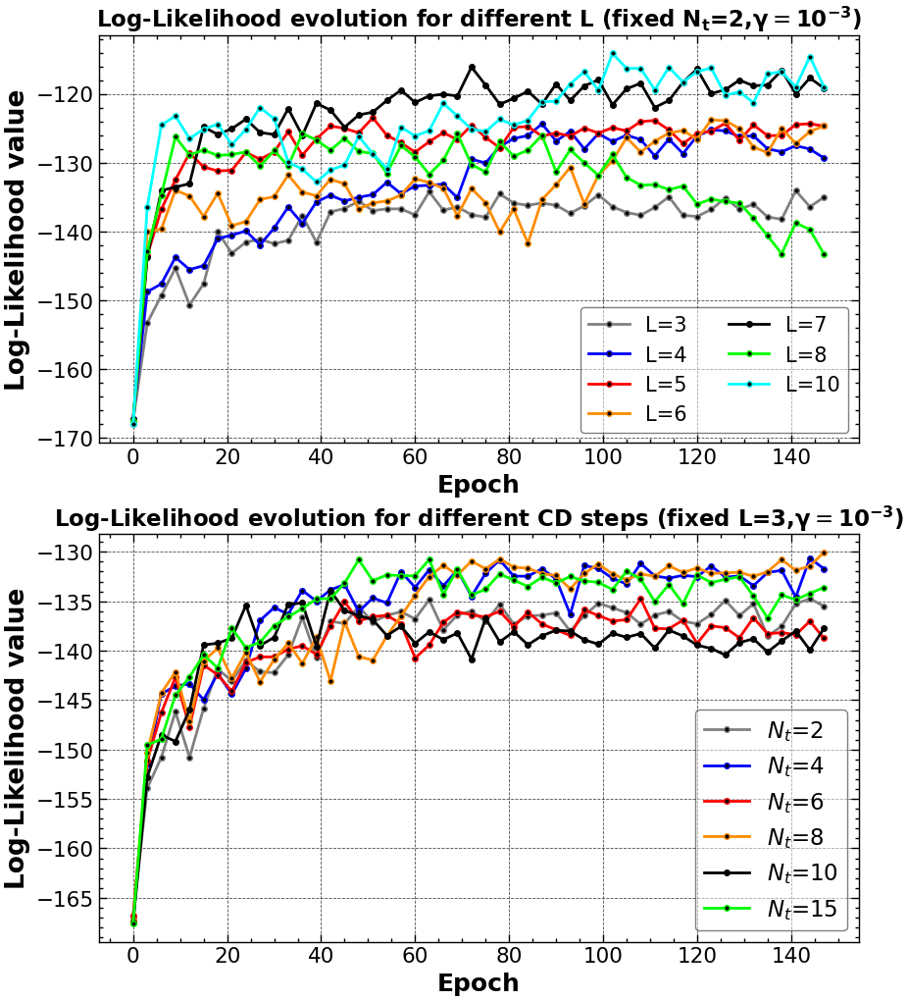

In [9]:
# drawing graphs
fig, (ax1,ax2) = plt.subplots(2,1,figsize=(10,12))
fig.subplots_adjust(hspace=0.223)
log_like_L=  [[-167.46639562, -153.30224022, -149.2998419, -145.34306566, -150.6928827,  
  -147.58903654, -140.05929498, -143.16418878, -141.5562486, -141.13334565,  
  -141.77690018, -141.30056009, -137.69138747, -141.56208266, -137.14274487,  
  -136.67157766, -135.60655794, -136.97555371, -136.72116198, -136.72376396,  
  -137.59913727, -134.23329747, -136.9113512, -136.43255809, -137.56143278,  
  -137.93122748, -134.52485714, -135.90228161, -136.19872291, -135.86557528,  
  -136.20254188, -137.36244353, -136.26979333, -134.67619644, -136.39688289,  
  -137.24671767, -137.63853119, -136.5077115, -134.96660972, -137.6568061,  
  -137.83050153, -136.80611264, -135.14433081, -136.78365085, -136.03322125,  
  -137.88975364, -138.22442291, -134.07610994, -136.4088892, -135.02388182],  

 [-167.26125039, -148.77345297, -147.6171454, -143.75963014, -145.53704543,  
  -144.96919542, -141.0423499, -140.53574993, -139.92773109, -141.95504743,  
  -139.50266357, -136.44388148, -138.83589855, -135.70874327, -134.73380955,  
  -135.58305725, -135.030171, -134.65627441, -132.84599023, -134.51691531,  
  -133.39991381, -133.28521162, -133.12045973, -135.09635184, -129.49054341,  
  -130.05456029, -127.66314906, -126.49595232, -126.06259646, -124.36576746,  
  -126.86064156, -125.45877065, -128.00728459, -125.78873956, -126.91742723,  
  -126.00329362, -126.64954812, -129.02026052, -126.58428109, -128.68630528,  
  -126.1303682, -125.22974574, -125.37308333, -126.21824197, -126.10343221,  
  -127.99399668, -128.41999321, -127.53934007, -128.02000938, -129.33495177],  

 [-167.96045579, -143.50424349, -136.77885881, -132.49927278, -128.61238634,  
  -130.62356925, -131.19865517, -131.1161634, -128.4960581, -129.51300361,  
  -128.43256712, -125.50002279, -128.91074953, -126.53231121, -124.67885995,  
  -125.02436452, -125.66659635, -123.47014893, -126.03663122, -127.10812294,  
  -128.47155502, -126.95461204, -125.64471866, -126.66414488, -124.55211452,  
  -126.32281053, -127.85108434, -124.87571502, -124.74612735, -126.15168095,  
  -125.69035485, -126.1406903, -124.98345671, -125.70115001, -124.92163152,  
  -125.38063556, -124.04439094, -123.85892307, -125.25141806, -127.23410168,  
  -125.74845135, -125.42903242, -124.25994692, -126.76662586, -124.51464281,  
  -126.07712994, -126.05035061, -124.46543898, -124.3472258, -124.68819872],  

 [-167.82839428, -140.02720428, -139.66024198, -133.9979687, -134.85249625,  
  -137.81450788, -134.44622386, -139.15994837, -138.55250615, -135.35959551,  
  -134.93654412, -131.78906784, -134.26209234, -134.81862859, -132.40719999,  
  -133.09283082, -136.71855342, -135.83997309, -135.5827644, -134.70117667,  
  -132.37018226, -132.86230545, -133.73405975, -137.70880844, -133.76906178,  
  -135.82329008, -140.06562352, -136.76019913, -141.72971189, -135.37188385,  
  -133.20323607, -130.68581203, -136.00155483, -131.85581558, -129.7339999,  
  -126.35954185, -128.45950163, -126.88807939, -125.68995293, -125.33446793,  
  -126.57387264, -123.80593995, -123.88324929, -125.04275814, -127.71518492,  
  -128.56120083, -125.00912256, -127.235413, -125.47838408, -124.67275409],  
  [
    -167.21015708045795, -143.69547159806135, -134.05986407159168, 
    -133.541273734767, -133.05896062848387, -124.8286611864581, 
    -125.8986841931941, -125.07803844801387, -123.66899066251531, 
    -125.61939947695221, -125.91008989063265, -122.15374491285259, 
    -126.06818877007585, -121.37999566067782, -122.36711026966447, 
    -124.85913486758416, -123.06479121714958, -122.65946710257374, 
    -120.95864036668401, -119.45354382788496, -121.24980298906522, 
    -120.2945620026384, -120.05563198664596, -120.30736951894907, 
    -116.10805611474741, -118.72813276988742, -121.51814839853212, 
    -120.66241383009469, -119.61655567639976, -121.49907624868196, 
    -118.55863224499517, -120.96908754529845, -118.84445549791039, 
    -117.9795056853151, -121.58439433749744, -119.26422652696318, 
    -118.46885116646325, -121.97996308072376, -120.9704144000421, 
    -118.30891898218017, -116.4022327361629, -119.95962856462927, 
    -119.40629840221311, -118.00424459820317, -118.83197293016883, 
    -118.71106509103116, -116.58944889044969, -120.0011370158435, 
    -117.69754197264506, -119.17939743643285
],

 [-167.56168704, -142.8378642, -134.71371841, -126.24903893, -128.88253274,  
  -128.174234, -128.9556023, -128.81815463, -128.4414534, -130.52554058,  
  -128.25344745, -130.48209458, -125.76439217, -126.71267336, -128.17051108,  
  -126.45442285, -128.37395256, -128.66418634, -131.55238835, -127.50814445,  
  -129.17023855, -131.68753897, -129.65844807, -125.78235324, -130.29459529,  
  -131.34455809, -126.95361728, -129.07105531, -128.17530346, -126.0266972,  
  -131.33470877, -128.1106469, -130.01699103, -131.8450078, -128.8238097,  
  -132.14912457, -133.26551385, -133.20260346, -133.92757163, -133.39419064,  
  -136.02737913, -135.30374556, -135.6643038, -135.86922388, -138.08684597,  
  -140.62545218, -143.24514671, -138.76128764, -139.71833384, -143.29595282],  

 [-168.02160816, -136.49303448, -124.54118528, -123.21012024, -126.51225333,  
  -125.1232795, -124.40559294, -127.38053124, -125.15672713, -121.98535241,  
  -123.60695775, -129.92706931, -130.94066255, -132.80274195, -131.06788915,  
  -130.3417687, -126.1926997, -128.69649994, -130.84296853, -124.85462726,  
  -126.11755523, -125.34316467, -121.3889479, -123.22057436, -125.12626841,  
  -125.49042897, -123.69047746, -124.52384664, -123.8478302, -121.14757321,  
  -121.07578731, -118.55811729, -116.78297451, -119.48616377, -114.13198263,  
  -116.30035041, -116.30145242, -119.42028825, -116.14413511, -118.27649553,  
  -116.78625213, -116.23294539, -120.18589176, -119.71331766, -121.27313235,  
  -117.0686234, -116.79509889, -118.99634973, -114.57554406, -119.01322526]]  

log_like_cd=[[-167.06195825, -153.91380773, -150.79911203, -146.18286317, -150.79751394, -145.83368566, -141.83796781, -143.07079173, -140.99871912, -142.12682516, -142.22555043, -140.41957902, -136.61794029, -140.72320945, -137.02533089, -137.24895117, -135.54764096, -137.10179326, -136.42801905, -136.06021395, -136.78500667, -134.84579821, -137.90251346, -136.38151147, -135.99726568, -137.06047927, -135.3057863, -137.31241494, -136.47912745, -136.4112143, -136.17395895, -138.01282432, -136.45627614, -135.18712118, -135.66665645, -136.14874331, -137.32125231, -136.39701094, -136.03968115, -137.02636354, -137.27674244, -136.34301941, -134.91024642, -136.45110741, -135.25465109, -138.5097835, -137.53445534, -135.25248447, -134.73931133, -135.50172223],  
[-167.36940146, -151.43773273, -144.38456729, -143.56116546, -143.35274881, -144.96469605, -142.30127428, -144.39895466, -141.79634594, -136.95203828, -135.63967128, -136.30290108, -133.89693108, -134.99542197, -133.84014329, -133.29639518, -136.05655595, -134.65821345, -135.17786518, -132.00759639, -133.59414597, -131.81053497, -133.43774762, -131.8427446, -134.49006217, -132.17387961, -130.82083707, -132.4570818, -132.46815092, -131.71225464, -132.73711858, -136.32714043, -131.37788768, -131.6937956, -132.68132608, -133.25173398, -131.18101439, -132.44167619, -132.66020855, -132.38149934, -132.50923721, -131.42889962, -132.56202272, -132.43300186, -133.42060308, -132.09346581, -131.87058059, -134.57359531, -130.64308683, -131.71583987],  
[-166.76340288, -151.15352519, -146.27894989, -142.69076322, -147.71445502, -141.44545042, -142.45002447, -144.10287991, -141.17957245, -140.63711474, -140.62353996, -139.85141189, -139.50337732, -140.37725486, -137.5098847, -135.0570553, -136.99723131, -136.55809345, -136.42198081, -137.28494161, -140.75155583, -139.42824708, -137.1325191, -136.08375759, -136.37213303, -136.59410698, -136.00938084, -137.56789881, -136.10471055, -137.29371669, -137.89614581, -138.45132446, -135.87242494, -136.44733559, -137.0019507, -136.86439671, -134.74541758, -137.75032469, -137.7807965, -136.9083288, -139.26098801, -137.49086546, -137.67328807, -138.69091278, -136.66958834, -138.29734077, -138.16385851, -138.38227959, -137.01459933, -138.75257592],  
[-167.31564282, -150.35861218, -144.29489631, -142.13831513, -147.16972181, -141.04046833, -139.74240721, -142.73999371, -140.16049709, -143.15510122, -140.90457872, -139.22911231, -141.28042089, -138.64478475, -143.06238389, -137.07448908, -140.59845477, -140.95878312, -138.50455966, -136.50814773, -134.39514179, -132.50361026, -131.3766468, -132.33407555, -130.94119328, -131.71599215, -130.72131673, -131.55073845, -131.65475048, -132.20397536, -132.3993321, -133.73495199, -132.18985969, -131.22713267, -132.23505959, -132.81279748, -132.24614706, -132.47169307, -131.40155805, -132.09725856, -131.62989664, -132.18061738, -132.13322236, -132.06134593, -132.48208518, -132.00358384, -130.78705169, -131.87597167, -131.43193712, -130.04848288],  
[-167.47056591, -152.78426781, -148.50821709, -149.18253968, -145.98741749, -139.42141992, -139.24265311, -138.73428581, -135.40335747, -139.47881686, -138.65822663, -135.30143411, -135.17698744, -139.56140382, -133.92194371, -135.9391622, -136.43983222, -136.85905777, -138.47885275, -137.53233338, -139.25807741, -138.09750044, -138.88606529, -138.20988584, -140.86382656, -136.72671812, -139.1053297, -138.07449659, -139.40683765, -138.48899085, -137.93185797, -138.01088858, -138.90194016, -139.34268787, -138.23128832, -138.65132015, -138.2641439, -139.7442488, -137.91656113, -138.51401102, -139.44086498, -139.77781711, -140.43495971, -139.17682657, -138.80485856, -140.13499743, -139.00813223, -138.00225445, -139.93861783, -137.73756883],  
[-167.56688306, -149.57459004, -148.92201577, -144.49699484, -142.65000422, -140.42804414, -141.74483508, -137.73953022, -139.69429143, -139.14603038, -137.47472516, -136.56899744, -135.74029496, -134.75351824, -134.72844823, -133.15593863, -130.7901138, -132.93062435, -132.32729123, -132.41780206, -132.41892985, -130.78128992, -134.29778061, -131.76417546, -134.36682334, -133.78541633, -132.22659407, -132.87452003, -133.49623975, -132.57566791, -133.15314232, -132.49289833, -132.94989403, -133.08114273, -133.81245823, -131.9561397, -132.75947195, -135.04058372, -133.29644009, -135.24457994, -132.32634396, -133.11409381, -132.7770832, -132.51737443, -134.48169441, -136.6978821, -134.3740188, -134.8378947, -134.21187633, -133.59259214]]  
num_epo=[0, 3, 6, 9, 12, 15, 18, 21, 24, 27, 30, 33, 36, 39, 42, 45, 48, 51, 54, 57, 60,  
63, 66, 69, 72, 75, 78, 81, 84, 87, 90, 93, 96, 99, 102, 105, 108, 111, 114, 117, 120,  
123, 126, 129, 132, 135, 138, 141, 144, 147] 
L_v=[3,4,5,6,7,8,10]
Nt_v=[2,4,6,8,10,15]

#colors = plt.cm.rainbow(np.linspace(0, 1, len(log_like_L)))
colors = ['gray','blue','red','darkorange','black','lime','cyan']
for i,log_like in enumerate(log_like_L): # fixed CD steps=2
    ax1.plot(num_epo, log_like, label=f'L={L_v[i]}',linewidth=2, color=colors[i], marker='o',markersize=4, markerfacecolor='black', markeredgewidth=1)
    ax1.set_xlabel('Epoch', fontsize=18, fontweight='bold')
    ax1.set_ylabel('Log-Likelihood value', fontsize=19, fontweight='bold')
    ax1.set_title('Log-Likelihood evolution for different L (fixed ' r'$\mathbf{N_t}$=2,$\mathbf{\gamma}=\mathbf{10^{-3}}$)', fontsize=16.5, fontweight='bold')
    ax1.tick_params(axis='x', labelsize=15.5)
    ax1.tick_params(axis='y', labelsize=15.5)
    ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    #ax1.set_xticks(num_epo)
    ax1.legend(ncol=2,fontsize=15, loc='lower right', frameon=True, edgecolor='black',framealpha=0.5)

#colors2 = plt.cm.rainbow(np.linspace(0, 1, len(log_like_cd)))
for i,log_like in enumerate(log_like_cd): # fixed L=3
    ax2.plot(num_epo, log_like, label= "$N_{t}$" f'={Nt_v[i]}',color=colors[i],marker='o',linewidth=2, markersize=4, markerfacecolor='black', markeredgewidth=1)
    ax2.set_xlabel('Epoch', fontsize=18, fontweight='bold')
    ax2.set_ylabel('Log-Likelihood value', fontsize=19, fontweight='bold')
    ax2.set_title('Log-Likelihood evolution for different CD steps (fixed L=3,$\mathbf{\gamma}=\mathbf{10^{-3}}$)', fontsize=16.5, fontweight='bold')
    plt.xticks(fontsize=15.5)
    plt.yticks(fontsize=15.5)
    #ax2.set_xticks(num_epo)
    ax2.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    ax2.legend(fontsize=16.5, loc='lower right',  frameon=True, edgecolor='black',framealpha=0.5)
file_path = 'GRAPHS/log_like_evolution_plot_big.png'  # Path where you want to save the figure
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()


We verify that the log-likelihood increases during the training process, and then 

## **Likelihood dependance on number of hidden units L and CD steps**  

Now we want to compare the likelihood values after the transient, in the last epochs of training, varying the parameters L and Nt. We previously observed that the likelihood appers to be quite stable after a certain number of epochs, but this needs to be verified more rigorously considering more iterations for each likelihood estimation (10 for computational feasability), and taking their average and standard deviation. We focus on the last 10 epochs and, after verifying the stability of the likelihood, we compare their average values for the different number of visible units and CD steps considered.       

To determine the loglikelihood at each epoch, we run the calculation 10 times and compute the average, in order to reduce the randomness due to sample choice in the defintion of the *compute_log_likelihood* function.

## 1- Likelihood stability after the transient

In [ ]:
# Log-likelyhood after transient for different L and fixed CD steps = 2: stability check 
log_like_L=[]
log_like_L_std=[]
Nepoch=150
num_epo=np.arange(Nepoch-10,Nepoch,1)

for L in L_v:
    Nt=2
    a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
    print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
    b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
    print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
    w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
    print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch

    log_like=[]
    log_like_std=[]
    for i in range(Nepoch-10,Nepoch,1):
        print(f'Epoch n.{i}')
        ll_iter= []
        for iter in range(10): # to determine the loglike at each epoch we run the calculation 10 times and compute the average, to reduce randomness
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            ll_iter.append(ll)
        ll_mean= np.array(ll_iter).mean()
        ll_std= np.array(ll_iter).std()
        log_like.append(ll_mean)
        log_like_std.append(ll_std)
        print('Log-likelihood=',ll_mean,"+-",ll_std)
    log_like_L.append(log_like)
    log_like_L_std.append(log_like_std)


a_all L=3, Nt=2
b_all L=3, Nt=2
w_all L=3, Nt=2
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1259.76it/s]


Log-likelihood= -135.33417648347438 +- 0.4948436913465755
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1140.92it/s]


Log-likelihood= -134.8111327991385 +- 0.7519264151407518
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1185.13it/s]


Log-likelihood= -135.55996648476102 +- 0.4509732611999631
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1220.98it/s]


Log-likelihood= -135.3511763225206 +- 0.547801735890055
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1231.27it/s]


Log-likelihood= -135.90257631379617 +- 0.728230882196492
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1194.41it/s]


Log-likelihood= -136.76855143709196 +- 0.47586230560254345
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1279.10it/s]


Log-likelihood= -135.16244862200264 +- 0.5562445680022283
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1257.01it/s]


Log-likelihood= -135.29951070916115 +- 0.6054118397588848
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1167.63it/s]


Log-likelihood= -137.856631852215 +- 0.3441585016734641
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:04<00:00, 1286.59it/s]


Log-likelihood= -136.16619959293686 +- 0.25801107424517805
a_all L=4, Nt=2
b_all L=4, Nt=2
w_all L=4, Nt=2
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 513.36it/s]


Log-likelihood= -127.23964660500101 +- 0.6780543748242523
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 664.22it/s]


Log-likelihood= -127.51342276154364 +- 0.6509824597578027
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 660.13it/s]


Log-likelihood= -127.10669977917291 +- 0.5055897364897357
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 664.17it/s]


Log-likelihood= -127.87576526185676 +- 0.4787348963725224
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 668.49it/s]


Log-likelihood= -128.63018612941715 +- 0.519124372826951
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 658.09it/s]


Log-likelihood= -126.13121638301577 +- 0.32314326017105055
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 630.02it/s]


Log-likelihood= -128.37572819065633 +- 0.5815404561838426
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 630.22it/s]


Log-likelihood= -127.59672423564625 +- 0.3357670414481326
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 628.76it/s]


Log-likelihood= -127.85731339124989 +- 0.60759003302781
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 522.57it/s]


Log-likelihood= -127.24332584476846 +- 0.3837833880827182
a_all L=5, Nt=2
b_all L=5, Nt=2
w_all L=5, Nt=2
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:19<00:00, 286.59it/s]


Log-likelihood= -124.89476238745674 +- 0.9758199745947126
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:16<00:00, 324.57it/s]


Log-likelihood= -124.32258789311607 +- 0.600548972734193
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 641.41it/s]


Log-likelihood= -125.20089106503936 +- 0.6650164555437056
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 496.01it/s]


Log-likelihood= -124.39628785756847 +- 0.5295998619426238
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 633.18it/s]


Log-likelihood= -124.21529083572823 +- 0.6846724798821712
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 640.20it/s]


Log-likelihood= -124.71925130957898 +- 0.6167279671393802
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 521.09it/s]


Log-likelihood= -124.59398138047318 +- 0.5755982318103808
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 637.73it/s]


Log-likelihood= -124.75019284466148 +- 0.501963749973891
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:08<00:00, 642.09it/s]


Log-likelihood= -124.58670012040932 +- 0.6344227892486787
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 522.32it/s]


Log-likelihood= -126.353581685533 +- 0.6850705981884185
a_all L=6, Nt=2
b_all L=6, Nt=2
w_all L=6, Nt=2
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:19<00:00, 283.45it/s]


Log-likelihood= -124.39803732334796 +- 0.5754579471967136
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:17<00:00, 315.32it/s]


Log-likelihood= -128.07955933051826 +- 0.3888809271906497
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:17<00:00, 322.19it/s]


Log-likelihood= -126.26470575733603 +- 0.5187534766411706
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:18<00:00, 292.17it/s]


Log-likelihood= -125.09584782778013 +- 0.5254182921438733
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:17<00:00, 321.92it/s]


Log-likelihood= -125.1264102145808 +- 0.5315586332479377
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:16<00:00, 326.19it/s]


Log-likelihood= -122.57487770281391 +- 0.904060831077091
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:18<00:00, 290.48it/s]


Log-likelihood= -125.33736516050458 +- 0.5439818076971923
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:18<00:00, 293.44it/s]


Log-likelihood= -124.25358464764872 +- 0.5476136563096112
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:16<00:00, 336.04it/s]


Log-likelihood= -123.90844003512714 +- 0.4056092130889154
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:16<00:00, 327.66it/s]


Log-likelihood= -125.34595677910254 +- 0.7057755641162581
a_all L=8, Nt=2
b_all L=8, Nt=2
w_all L=8, Nt=2
Epoch n.140


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:10<00:00, 78.15it/s]


Log-likelihood= -138.8940384882829 +- 0.6695564998307214
Epoch n.141


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:10<00:00, 78.37it/s]


Log-likelihood= -138.8846233625182 +- 0.5734429837321443
Epoch n.142


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:10<00:00, 77.96it/s]


Log-likelihood= -141.19081979456698 +- 0.40445018925136705
Epoch n.143


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:11<00:00, 77.43it/s]


Log-likelihood= -142.0026786300512 +- 0.7902159243919353
Epoch n.144


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:10<00:00, 77.88it/s]


Log-likelihood= -139.93224318546316 +- 0.5682470997883244
Epoch n.145


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:09<00:00, 79.38it/s]


Log-likelihood= -143.31943112793687 +- 0.39284761572730864
Epoch n.146


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:08<00:00, 79.90it/s]


Log-likelihood= -142.93490990751363 +- 0.6556731291415835
Epoch n.147


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:10<00:00, 77.81it/s]


Log-likelihood= -142.83249761388294 +- 0.4144386309838914
Epoch n.148


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:10<00:00, 77.91it/s]


Log-likelihood= -144.50049937518668 +- 0.4488331629640661
Epoch n.149


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:13<00:00, 74.72it/s]


Log-likelihood= -143.95647410022974 +- 0.6227667792952782
a_all L=10, Nt=2
b_all L=10, Nt=2
w_all L=10, Nt=2
Epoch n.140


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:44<00:00, 19.29it/s]


Log-likelihood= -120.98272949543063 +- 0.1880402209943159
Epoch n.141


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:59<00:00, 18.34it/s]


Log-likelihood= -119.06022603199169 +- 0.3886766717074701
Epoch n.142


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:41<00:00, 19.52it/s]


Log-likelihood= -118.15374164821438 +- 0.44014342644319515
Epoch n.143


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:33<00:00, 20.10it/s]


Log-likelihood= -120.63752887443452 +- 0.37117820128720863
Epoch n.144


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:34<00:00, 20.06it/s]


Log-likelihood= -115.27407393736273 +- 0.5426310855937532
Epoch n.145


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:53<00:00, 18.72it/s]


Log-likelihood= -118.33354007929377 +- 0.2893632765113282
Epoch n.146


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:41<00:00, 19.56it/s]


Log-likelihood= -118.2082683436015 +- 0.5958565634503485
Epoch n.147


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:51<00:00, 18.88it/s]


Log-likelihood= -119.16769683870943 +- 0.4292029640536674
Epoch n.148


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:50<00:00, 18.92it/s]


Log-likelihood= -115.77222552770385 +- 0.2773327479113979
Epoch n.149


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [04:55<00:00, 18.58it/s]

Log-likelihood= -114.99729793520255 +- 0.7080737294347231


In [ ]:
# Log-likelyhood after transient for different CD steps and fixed L = 3: stability check

log_like_cd=[]
log_like_cd_std=[]
Nepoch=150
num_epo=np.arange(Nepoch-10,Nepoch,1)

for L in L_v:
    if L==3:
        for Nt in Nt_v:
            a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
            print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
            b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
            print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
            w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg0.001_20250317.npy", allow_pickle=True)
            print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch

            log_like=[]
            log_like_std=[]
            Nepoch=150
            for i in range(Nepoch-10,Nepoch,1):
                print(f'Epoch n.{i}')
                ll_iter=[]
                mean=[]
                for iter in range(10): # to determine the loglike at each epoch we run the calculation 10 times and compute the average, to reduce randomness
                    ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
                    ll_iter.append(ll)
                ll_mean= np.array(ll_iter).mean()
                ll_std= np.array(ll_iter).std()
                log_like.append(ll_mean)
                log_like_std.append(ll_std)
                print('Log-likelihood=',ll_mean,"+-",ll_std)
            log_like_cd.append(log_like)
            log_like_cd_std.append(log_like_std)


a_all L=3, Nt=2
b_all L=3, Nt=2
w_all L=3, Nt=2
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2303.36it/s]


Log-likelihood= -135.40244199882693 +- 0.4064576716831954
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2281.73it/s]


Log-likelihood= -134.80174518824106 +- 0.6544495331297595
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2255.27it/s]


Log-likelihood= -135.4733447721828 +- 0.4727529126773889
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2281.40it/s]


Log-likelihood= -134.85709953691213 +- 0.5561732850054889
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2287.75it/s]


Log-likelihood= -135.60779506409935 +- 0.38213269719854126
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2302.47it/s]


Log-likelihood= -136.66377353849435 +- 0.7581315063921562
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2318.56it/s]


Log-likelihood= -135.32058149727166 +- 0.2423803120777691
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2088.95it/s]


Log-likelihood= -135.46887302374594 +- 0.5678899520697064
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2185.31it/s]


Log-likelihood= -137.95932993407374 +- 0.4370521579879841
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2264.38it/s]


Log-likelihood= -136.34938393386227 +- 0.3984022302331581
a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2145.98it/s]


Log-likelihood= -131.78400472104974 +- 0.6156035629335075
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2046.90it/s]


Log-likelihood= -133.4510570424571 +- 0.7007948806647603
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2128.24it/s]


Log-likelihood= -131.65811079246814 +- 0.5635793653271923
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2194.06it/s]


Log-likelihood= -132.15154309424784 +- 0.560565735000031
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2213.10it/s]


Log-likelihood= -132.04595727772278 +- 0.6755670677629372
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2287.43it/s]


Log-likelihood= -132.60066211388505 +- 0.6671162489332465
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2236.96it/s]


Log-likelihood= -131.97316505605727 +- 0.6878004506596289
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2116.09it/s]


Log-likelihood= -131.5429920280286 +- 0.5377688847156716
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2195.19it/s]


Log-likelihood= -131.48110043235027 +- 0.6864442451894349
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2124.71it/s]


Log-likelihood= -131.6920525186129 +- 0.7851726696602334
a_all L=3, Nt=6
b_all L=3, Nt=6
w_all L=3, Nt=6
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2303.93it/s]


Log-likelihood= -138.5189379465333 +- 0.588272834139861
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2231.17it/s]


Log-likelihood= -138.0830687221584 +- 0.533357643559949
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2112.52it/s]


Log-likelihood= -136.69706982423364 +- 0.4469185615013901
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2181.67it/s]


Log-likelihood= -139.25442254791417 +- 0.43331996389215605
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2297.09it/s]


Log-likelihood= -137.522518426016 +- 0.41561270607493656
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3205.86it/s]


Log-likelihood= -139.0266563235406 +- 0.560888616334427
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2300.66it/s]


Log-likelihood= -137.09725928832418 +- 0.5871874193054396
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2192.89it/s]


Log-likelihood= -138.87441175683392 +- 0.556122196952543
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2216.75it/s]


Log-likelihood= -137.2204115241542 +- 0.3870065509106904
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2222.09it/s]


Log-likelihood= -137.1386697223408 +- 0.41515645049600175
a_all L=3, Nt=8
b_all L=3, Nt=8
w_all L=3, Nt=8
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2211.36it/s]


Log-likelihood= -131.93444690763366 +- 0.5992888370884695
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2238.25it/s]


Log-likelihood= -131.26384222353695 +- 0.633165671183006
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2215.65it/s]


Log-likelihood= -131.83929376012918 +- 0.6172394313356687
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2121.61it/s]


Log-likelihood= -132.75838543082148 +- 0.6102940064162099
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2961.52it/s]


Log-likelihood= -131.50124926168507 +- 0.5949768092231003
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2166.11it/s]


Log-likelihood= -131.70532187613148 +- 0.4150116301992774
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2237.69it/s]


Log-likelihood= -131.39400500651692 +- 0.5506826404248658
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2271.43it/s]


Log-likelihood= -131.9267508834783 +- 0.6128364020183464
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2297.70it/s]


Log-likelihood= -132.07714446105746 +- 0.6500349131992584
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2209.74it/s]


Log-likelihood= -132.65609932041366 +- 0.555598822602165
a_all L=3, Nt=10
b_all L=3, Nt=10
w_all L=3, Nt=10
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2269.61it/s]


Log-likelihood= -139.22652463607128 +- 0.4957176355423664
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2283.60it/s]


Log-likelihood= -138.2416056269301 +- 0.4765155792163485
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3365.60it/s]


Log-likelihood= -138.19518722014908 +- 0.6447341640592643
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2322.81it/s]


Log-likelihood= -138.79636511472617 +- 0.47976882421021505
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2242.59it/s]


Log-likelihood= -138.86111333115795 +- 0.4910005354421933
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2210.69it/s]


Log-likelihood= -139.37913916431813 +- 0.6591393618671353
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2244.12it/s]


Log-likelihood= -137.25599268025408 +- 0.48488594644730243
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2181.36it/s]


Log-likelihood= -137.32012826392247 +- 0.5331333744545672
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2192.51it/s]


Log-likelihood= -138.8454413367235 +- 0.24931820809070573
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2104.26it/s]


Log-likelihood= -139.7254582172481 +- 0.45059376677110324
a_all L=3, Nt=15
b_all L=3, Nt=15
w_all L=3, Nt=15
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2290.55it/s]


Log-likelihood= -134.95994553501606 +- 0.4446400687830309
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2248.70it/s]


Log-likelihood= -134.5258668775715 +- 0.8428762802819025
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2252.34it/s]


Log-likelihood= -134.39313539889125 +- 0.6601746132077289
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2294.19it/s]


Log-likelihood= -134.80374006767016 +- 0.7263023012433573
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2352.10it/s]


Log-likelihood= -134.62408650413028 +- 0.71548688680001
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3120.23it/s]


Log-likelihood= -135.23556137915062 +- 0.5754182086565504
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2221.82it/s]


Log-likelihood= -135.3570455709304 +- 0.5345471318252437
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2256.19it/s]


Log-likelihood= -133.8319397373477 +- 0.5191095584380684
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2213.68it/s]


Log-likelihood= -134.81752609460844 +- 0.6343818886318692
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2298.82it/s]

Log-likelihood= -134.50114583157932 +- 0.6634738584173402


In the different cases, we plot the likelihoods obtained for the last 10 epochs and check if they can be considered stable within the associated random error due to the loglikelihood estimation. To do this we perfom a $χ²$ test for a uniform distribution. As reference, with 9 degrees of freedom (10 epochs minus the average constarint) and a CL=95%, the corresponding critical value is $χ²_{0}$=16.9.      

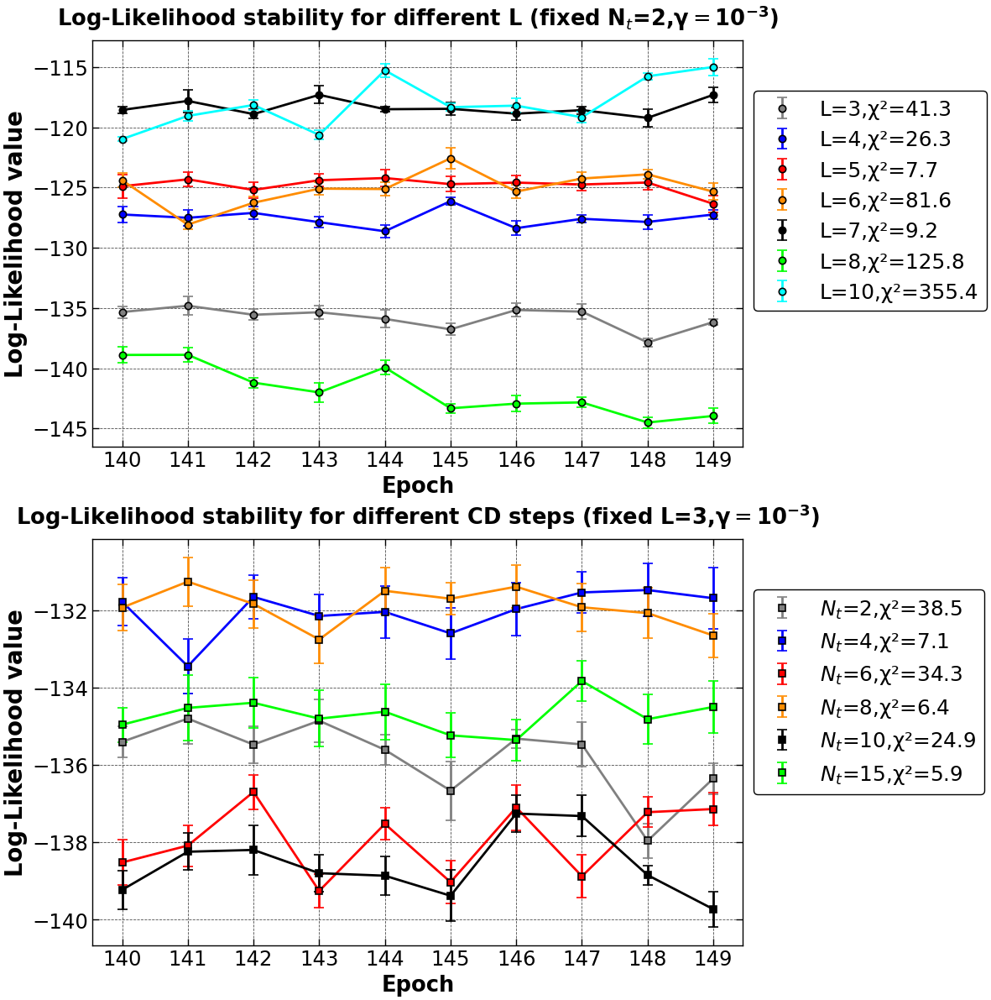

In [10]:
# plots of log-likelihood of last 10 epochs and their mean
log_like_L=[ [-135.33417648, -134.8111328, -135.55996648, -135.35117632, -135.90257631,
  -136.76855144, -135.16244862, -135.29951071, -137.85663185, -136.16619959],
 [-127.23964661, -127.51342276, -127.10669978, -127.87576526, -128.63018613,
  -126.13121638, -128.37572819, -127.59672424, -127.85731339, -127.24332584],
 [-124.89476239, -124.32258789, -125.20089107, -124.39628786, -124.21529084,
  -124.71925131, -124.59398138, -124.75019284, -124.58670012, -126.35358169],
 [-124.39803732, -128.07955933, -126.26470576, -125.09584783, -125.12641021,
  -122.5748777, -125.33736516, -124.25358465, -123.90844004, -125.34595678],
  [-118.56363490231396, -117.81574836286953, -118.90928934308204, -117.31035381822491, -118.50404488491782, -118.47088118518346, -118.87311151469301, -118.58001347894192, -119.2227607729501, -117.31042671402554],
 [-138.89403849, -138.88462336, -141.19081979, -142.00267863, -139.93224319,
  -143.31943113, -142.93490991, -142.83249761, -144.50049938, -143.9564741],
 [-120.9827295, -119.06022603, -118.15374165, -120.63752887, -115.27407394,
  -118.33354008, -118.20826834, -119.16769684, -115.77222553, -114.99729794]]
log_like_L_std=[[0.49484369, 0.75192642, 0.45097326, 0.54780174, 0.72823088, 0.47586231,
  0.55624457, 0.60541184, 0.3441585, 0.25801107],
 [0.67805437, 0.65098246, 0.50558974, 0.4787349, 0.51912437, 0.32314326,
  0.58154046, 0.33576704, 0.60759003, 0.38378339],
 [0.97581997, 0.60054897, 0.66501646, 0.52959986, 0.68467248, 0.61672797,
  0.57559823, 0.50196375, 0.63442279, 0.6850706],
 [0.57545795, 0.38888093, 0.51875348, 0.52541829, 0.53155863, 0.90406083,
  0.54398181, 0.54761366, 0.40560921, 0.70577556],
  [0.2811612888780421, 0.9319215651888404, 0.3872665057158554, 0.7314311404650565, 0.22113452445816512, 0.5170058675672443, 0.5194854488216485, 0.30927552596274255, 0.7346201330246039, 0.6578705093550178],
 [0.6695565, 0.57344298, 0.40445019, 0.79021592, 0.5682471, 0.39284762,
  0.65567313, 0.41443863, 0.44883316, 0.62276678],
 [0.18804022, 0.38867667, 0.44014343, 0.3711782, 0.54263109, 0.28936328,
  0.59585656, 0.42920296, 0.27733275, 0.70807373]]

log_like_cd = [[-135.402442, -134.80174519, -135.47334477, -134.85709954, -135.60779506, -136.66377354, -135.3205815, -135.46887302, -137.95932993, -136.34938393],
        [-131.78400472, -133.45105704, -131.65811079, -132.15154309, -132.04595728, -132.60066211, -131.97316506, -131.54299203, -131.48110043, -131.69205252],
        [-138.51893795, -138.08306872, -136.69706982, -139.25442255, -137.52251843, -139.02665632, -137.09725929, -138.87441176, -137.22041152, -137.13866972],
        [-131.93444691, -131.26384222, -131.83929376, -132.75838543, -131.50124926, -131.70532188, -131.39400501, -131.92675088, -132.07714446, -132.65609932],
        [-139.22652464, -138.24160563, -138.19518722, -138.79636511, -138.86111333, -139.37913916, -137.25599268, -137.32012826, -138.84544134, -139.72545822],
        [-134.95994554, -134.52586688, -134.3931354, -134.80374007, -134.6240865, -135.23556138, -135.35704557, -133.83193974, -134.81752609, -134.50114583]]

log_like_cd_std = [[0.40645767, 0.65444953, 0.47275291, 0.55617329, 0.3821327, 0.75813151, 0.24238031, 0.56788995, 0.43705216, 0.39840223],
       [0.61560356, 0.70079488, 0.56357937, 0.56056574, 0.67556707, 0.66711625, 0.68780045, 0.53776888, 0.68644425, 0.78517267],
       [0.58827283, 0.53335764, 0.44691856, 0.43331996, 0.41561271, 0.56088862, 0.58718742, 0.5561222, 0.38700655, 0.41515645],
       [0.59928884, 0.63316567, 0.61723943, 0.61029401, 0.59497681, 0.41501163, 0.55068264, 0.6128364, 0.65003491, 0.55559882],
       [0.49571764, 0.47651558, 0.64473416, 0.47976882, 0.49100054, 0.65913936, 0.48488595, 0.53313337, 0.24931821, 0.45059377],
       [0.44464007, 0.84287628, 0.66017461, 0.7263023, 0.71548689, 0.57541821, 0.53454713, 0.51910956, 0.63438189, 0.66347386]]

Nepoch=150
# variable L, fixed CD steps
colors = ['gray','blue','red','darkorange','black','lime','cyan']
fig, (ax1,ax2) = plt.subplots(2,1,figsize=(10,14))
fig.subplots_adjust(hspace=0.227)
num_epo=np.arange(Nepoch-10,Nepoch,1)

for i, log_like in enumerate(log_like_L):
    weights = 1 / np.array(log_like_L_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods
    weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
    chi = np.sum(((log_like - weighted_avg*np.ones(10))/log_like_L_std[i])** 2)

    ax1.errorbar(num_epo,log_like,yerr=log_like_L_std[i],fmt='o',color=colors[i],label=f'L={L_v[i]},χ²={round(chi,1)}',linewidth=2, markersize=6,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax1.plot(num_epo, log_like, color=colors[i], linewidth=2)
    ax1.minorticks_off()
    

ax1.set_xlabel('Epoch', fontsize=18.5, fontweight='bold')
ax1.set_ylabel('Log-Likelihood value', fontsize=19.8, fontweight='bold')
ax1.set_title('Log-Likelihood stability for different L (fixed ' r'$\mathbf{N}_{t}$=2,' r'$\mathbf{\gamma}=\mathbf{10^{-3}}$)', fontsize=18.5, fontweight='bold',pad=12)
ax1.set_xticks(num_epo)
ax1.tick_params(axis='x', labelsize=17.6)
ax1.tick_params(axis='y', labelsize=17.6)
ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax1.legend(fontsize=17.8, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')

#variable CD steps, fixed L
for i, log_like in enumerate(log_like_cd):
    weights = 1 / np.array(log_like_cd_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods of last 10 epochs
    weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
    chi = np.sum(((log_like - weighted_avg*np.ones(10))/log_like_cd_std[i]) ** 2)
    
    ax2.errorbar(num_epo,log_like,yerr=log_like_cd_std[i],fmt='s',color=colors[i],label='$N_{t}$'f'={Nt_v[i]},χ²={round(chi,1)}',linewidth=2, markersize=6,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax2.plot(num_epo, log_like, color=colors[i], linewidth=2)
    ax2.minorticks_off()
ax2.set_xlabel('Epoch', fontsize=18.5, fontweight='bold')
ax2.set_ylabel('Log-Likelihood value', fontsize=19.8, fontweight='bold')
ax2.set_title('Log-Likelihood stability for different CD steps (fixed L=3,$\mathbf{\gamma}=\mathbf{10^{-3}}$)', fontsize=18.5, fontweight='bold',pad=12)
ax2.set_xticks(num_epo)
ax2.tick_params(axis='x', labelsize=17.6)
ax2.tick_params(axis='y', labelsize=17.6)
ax2.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax2.legend(fontsize=17.8, loc='best', frameon=True, edgecolor='black')
ax2.legend(fontsize=17.8, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')
file_path = 'GRAPHS/log_like_stability_plot_big.png'  # Path where you want to save the figure
fig.savefig(file_path, dpi=300, bbox_inches='tight')
plt.show()



We notice how, in about half of the cases considered, $χ²$ test would suggest that stability is not reached ($χ²> χ²_{0}$ values). This is particularly eveident for the highest values of hidden units (L=8,10) in which we observe clear fluctuations of the likelihood. What we can do is consider as error of the associated mean value over the epochs the error of the mean in the case of compatibility, and the standard deviation (error of single "measure") in case of non compatibility. 

## 2- Study of the variability of the models to different training sets and initializations 



We train 5 times the same models L=3,4,5,6,8 with 2 CD steps and $\gamma=10^{-3}$, to study their variability to different training sets and initial values.

The general modus operandi will be the following: when analyzing single runs, for example to check stability of the likelihood over the last epochs and take their average, we associate as error the casual error due to randomness in the log-likelihood estimation. Instead, when examining the overall/average performace of a parameter (for ex L or $\gamma$) to compare its behaviour for different values of the parameter, we have to propagate this error contribution in the mean value considered (since we'd have to consider the average performance of that model over many different training sets and initial conditions). 

In [11]:
L_v=[3,4,5,6,7,8]
POTTS=False
gamma=0.001
Nt=2
GRAD=GRAD_list[1]
beta,epsilon=0.9,1e-4
l_rate_ini,l_rate_fin=0.05,0.05

In [12]:
for i in range(4):
    for L in L_v:
        iteration=i
        np.random.seed(12345*iteration)
        # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
        w = sigma * np.random.randn(D,L)
        #a = sigma * np.random.randn(D)
        # using Hinton initialization of visible biases
        a = Hinton_bias_init(data)
        # hidden biases initialized to zero
        b = np.zeros(L)
        #print("w=",w);print("a=",a);print("b=",b)
    
        # nr of epochs
        Nepoch=150
        # minibatches per epoch
        Nmini=20
        # minibatch size at initial epoch and final one
        N_ini,N_fin=10,500
        print(f"Nepoch={Nepoch}\nNmini={Nmini}")
    
    
        # recording history of weights ("E" means epoch)
        wE,aE,bE=np.zeros((Nepoch+1,D,L)),np.zeros((Nepoch+1,D)),np.zeros((Nepoch+1,L))
        wE[0],aE[0],bE[0]=np.copy(w),np.copy(a),np.copy(b)
        gwE,gw2E,gwE_d,gwE_m = np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE)
        gaE,ga2E,gaE_d,gaE_m = np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE)
        gbE,gb2E,gbE_d,gbE_m = np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE)
        miniE = np.zeros(Nepoch+1)
        pzE=np.zeros((Nepoch+1,Nz))
        if GRAD=="RMSprop":
            gw2,ga2,gb2 = np.zeros_like(w),np.zeros_like(a),np.zeros_like(b)
    
        indices=np.arange(Nd).astype("int")
        plot_weights_bias(wE, aE, 0, L, cols=L//2, save=False)
    
        # for the plot with panels
        Ncols=min(8,max(2,L//2))
    
        if POTTS: print("Starting the training, POTTS=True")
        else: print("Starting the training")
    
        # Note: here an epoch does not analyze the whole dataset
        for epoch in range(1,1+Nepoch):
            # q maps epochs to interval [0,1]
            q = (epoch-1.)/(Nepoch-1.)
            # N, size of the mini batch
            # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
            N = int(N_ini + (N_fin-N_ini)*(q**2))
            #  l_rate interpolates between initial and final value
            l_rate = l_rate_ini + (l_rate_fin-l_rate_ini)*q
    
            for mini in range(Nmini):
                # initializitation for averages in minibatch
                # visible variables "v" --> "x"
                #  hidden variables "h" --> "z"
                x_data, x_model = np.zeros(D),np.zeros(D)
                z_data, z_model = np.zeros(L),np.zeros(L)
                xz_data,xz_model= np.zeros((D,L)),np.zeros((D,L))
                pz = np.zeros(L)
    
                # Minibatch of size N: points randomply picked (without repetition) from data
                selected = np.random.choice(indices,N,replace=False)
                if epoch==1 and mini<=3: print(selected)
    
                for k in range(N):
                    ###################################
                    x0 = data[selected[k]]
                    # positive CD phase: generating z from x[k]
                    z = CD_step(x0,w,b,POTTS=POTTS)
                    x_data  += x0
                    z_data  += z
                    xz_data += np.outer(x0,z)
                    # fantasy
                    zf=np.copy(z)
                    # Contrastive divergence with Nt steps
                    for t in range(Nt):
                        # negative CD pzase: generating fantasy xf from fantasy zf
                        xf = CD_step(zf,w.T,a)
                        # positive CD phase: generating fantasy zf from fantasy xf
                        zf = CD_step(xf,w,b,POTTS=POTTS)
                    x_model += xf
                    z_model += zf
                    xz_model+= np.outer(xf,zf)
                    # recording probability of encoding in z-space, if POTTS
                    if POTTS: pz[zf]+=1
    
                # gradient of the likelihood: follow it along its positive direction
                gw_d,gw_m = xz_data/N, xz_model/N
                ga_d,ga_m = x_data/N, x_model/N
                gb_d,gb_m = z_data/N, z_model/N
                gw=np.copy(gw_d - gw_m)
                ga=np.copy(ga_d - ga_m)
                gb=np.copy(gb_d - gb_m)
    
                # gradient ascent step
                if GRAD=="RMSprop":
                    # RMSprop gradient ascent
                    gw2 = beta*gw2+(1-beta)*np.square(gw)
                    ga2 = beta*ga2+(1-beta)*np.square(ga)
                    gb2 = beta*gb2+(1-beta)*np.square(gb)
                    w += l_rate*gw/sqrt(epsilon+gw2)
                    a += l_rate*ga/sqrt(epsilon+ga2)
                    b += l_rate*gb/sqrt(epsilon+gb2)
                else:
                    # defaulting to the vanilla stochastic gradient ascent (SGD)
                    w += l_rate*gw
                    a += l_rate*ga
                    b += l_rate*gb
                # regularization (LASSO)
                if gamma>0.:
                    w -= (gamma*l_rate)*sign(w)
                    a -= (gamma*l_rate)*sign(a)
                    b -= (gamma*l_rate)*sign(b)
    
            wE[epoch],gwE[epoch],gwE_d[epoch],gwE_m[epoch]=np.copy(w),np.copy(gw),np.copy(gw_d),np.copy(gw_m)
            aE[epoch],gaE[epoch],gaE_d[epoch],gaE_m[epoch]=np.copy(a),np.copy(ga),np.copy(ga_d),np.copy(ga_m)
            bE[epoch],gbE[epoch],gbE_d[epoch],gbE_m[epoch]=np.copy(b),np.copy(gb),np.copy(gb_d),np.copy(gb_m)
            miniE[epoch]=N
            if POTTS: pzE[epoch] = pz/np.sum(pz)
            print("iteration",iteration,"epoch",epoch,"/",Nepoch," Nt:",Nt," N:",N," L:",L,
                  " rate:",l_rate," gam:",gamma,"SPINS=",SPINS,"POTTS=",POTTS)
    
            if Nepoch<=100 or epoch%20==0 or epoch==Nepoch:
                plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)
    
            str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")
        save_epochs_iter(wE,"w")
        save_epochs_iter(bE,"b")
        save_epochs_iter(aE,"a")
    
    print("END of learning phase")


NameError: name 'sigma' is not defined

Nepoch=150
Nmini=20


<Figure size 640x480 with 0 Axes>

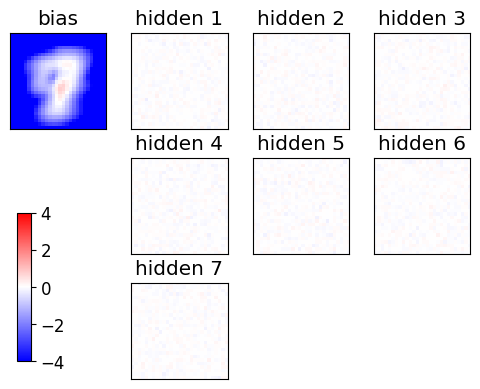

Starting the training
[13545 10317 14972 19040 14990  6207  3161 14456  5297  6983]
[14397  3186  6359 17811 10013 17158  4345 12013  5449  6526]
[ 8494 11380  9842  3821 11616 15490 16928 18803  1514   525]
[ 1743  2529 16289  9186 18262  2519 14972 19329 20298  9524]
iteration 0 epoch 1 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 2 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 3 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 4 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 5 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 6 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 7 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 8 / 150  Nt: 2  N: 11  L: 7  rate: 0.05 

<Figure size 640x480 with 0 Axes>

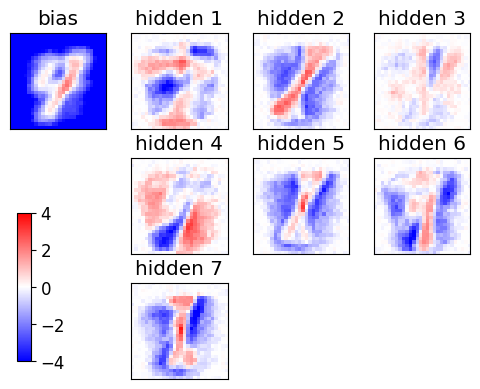

iteration 0 epoch 21 / 150  Nt: 2  N: 18  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 22 / 150  Nt: 2  N: 19  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 23 / 150  Nt: 2  N: 20  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 24 / 150  Nt: 2  N: 21  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 25 / 150  Nt: 2  N: 22  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 26 / 150  Nt: 2  N: 23  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 27 / 150  Nt: 2  N: 24  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 28 / 150  Nt: 2  N: 26  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 29 / 150  Nt: 2  N: 27  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 30 / 150  Nt: 2  N: 28  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 31 / 150  Nt

<Figure size 640x480 with 0 Axes>

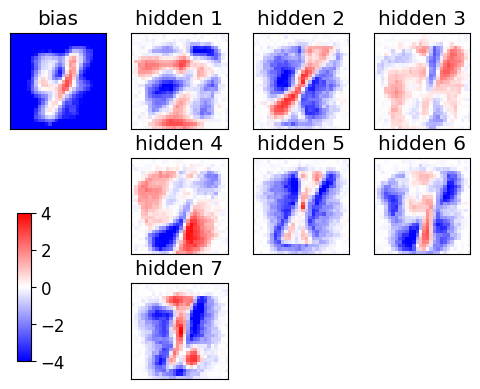

iteration 0 epoch 41 / 150  Nt: 2  N: 45  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 42 / 150  Nt: 2  N: 47  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 43 / 150  Nt: 2  N: 48  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 44 / 150  Nt: 2  N: 50  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 45 / 150  Nt: 2  N: 52  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 46 / 150  Nt: 2  N: 54  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 47 / 150  Nt: 2  N: 56  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 48 / 150  Nt: 2  N: 58  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 49 / 150  Nt: 2  N: 60  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 50 / 150  Nt: 2  N: 62  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 51 / 150  Nt

<Figure size 640x480 with 0 Axes>

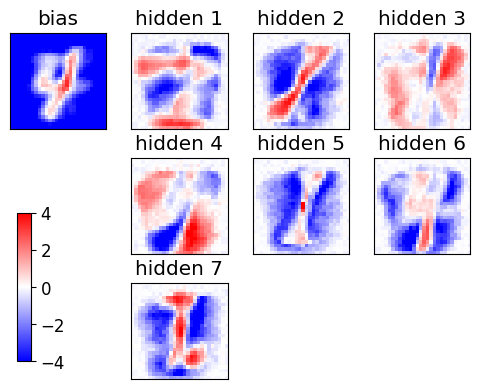

iteration 0 epoch 61 / 150  Nt: 2  N: 89  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 62 / 150  Nt: 2  N: 92  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 63 / 150  Nt: 2  N: 94  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 64 / 150  Nt: 2  N: 97  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 65 / 150  Nt: 2  N: 100  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 66 / 150  Nt: 2  N: 103  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 67 / 150  Nt: 2  N: 106  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 68 / 150  Nt: 2  N: 109  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 69 / 150  Nt: 2  N: 112  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 70 / 150  Nt: 2  N: 115  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 71 / 1

<Figure size 640x480 with 0 Axes>

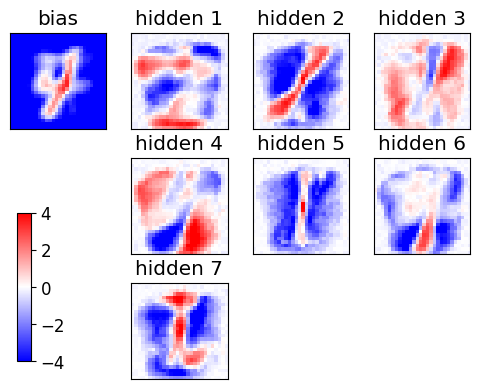

iteration 0 epoch 81 / 150  Nt: 2  N: 151  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 82 / 150  Nt: 2  N: 154  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 83 / 150  Nt: 2  N: 158  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 84 / 150  Nt: 2  N: 162  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 85 / 150  Nt: 2  N: 165  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 86 / 150  Nt: 2  N: 169  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 87 / 150  Nt: 2  N: 173  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 88 / 150  Nt: 2  N: 177  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 89 / 150  Nt: 2  N: 180  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 90 / 150  Nt: 2  N: 184  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 91

<Figure size 640x480 with 0 Axes>

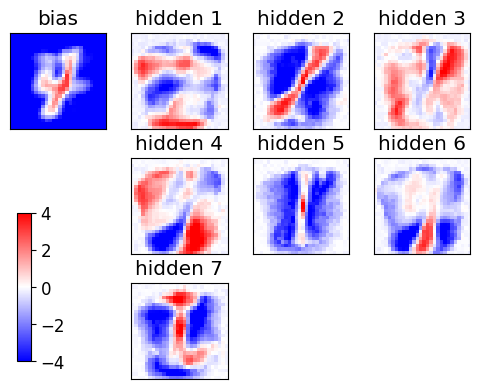

iteration 0 epoch 101 / 150  Nt: 2  N: 230  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 102 / 150  Nt: 2  N: 235  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 103 / 150  Nt: 2  N: 239  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 104 / 150  Nt: 2  N: 244  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 105 / 150  Nt: 2  N: 248  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 106 / 150  Nt: 2  N: 253  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 107 / 150  Nt: 2  N: 257  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 108 / 150  Nt: 2  N: 262  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 109 / 150  Nt: 2  N: 267  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 110 / 150  Nt: 2  N: 272  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

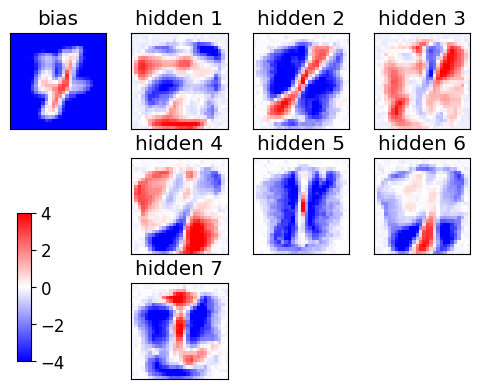

iteration 0 epoch 121 / 150  Nt: 2  N: 327  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 122 / 150  Nt: 2  N: 333  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 123 / 150  Nt: 2  N: 338  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 124 / 150  Nt: 2  N: 343  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 125 / 150  Nt: 2  N: 349  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 126 / 150  Nt: 2  N: 354  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 127 / 150  Nt: 2  N: 360  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 128 / 150  Nt: 2  N: 365  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 129 / 150  Nt: 2  N: 371  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 130 / 150  Nt: 2  N: 377  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

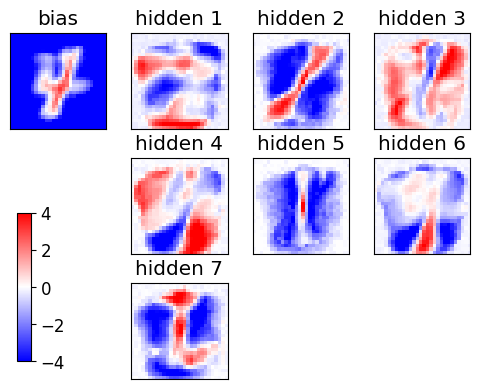

iteration 0 epoch 141 / 150  Nt: 2  N: 442  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 142 / 150  Nt: 2  N: 448  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 143 / 150  Nt: 2  N: 455  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 144 / 150  Nt: 2  N: 461  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 145 / 150  Nt: 2  N: 467  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 146 / 150  Nt: 2  N: 474  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 147 / 150  Nt: 2  N: 480  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 148 / 150  Nt: 2  N: 486  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 149 / 150  Nt: 2  N: 493  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 0 epoch 150 / 150  Nt: 2  N: 500  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False


<Figure size 640x480 with 0 Axes>

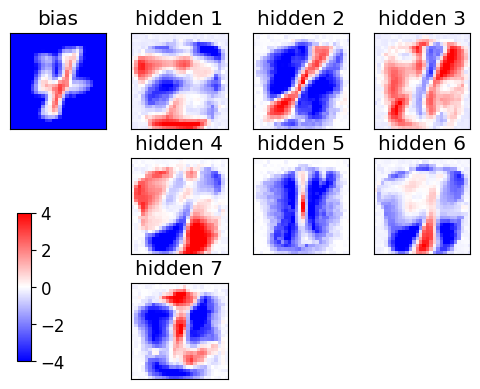

END of learning phase
Nepoch=150
Nmini=20


<Figure size 640x480 with 0 Axes>

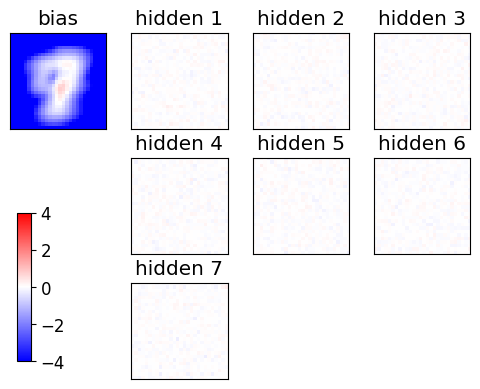

Starting the training
[18263  3600 14417  6373 12577  7242 14375 15560   603 13040]
[ 4735 14788 12840 16191  6581  4026  7465 13604 12088  7815]
[19477 19883  6840  9754 12992 18196  5859  7932  5546 21620]
[11152 20954  3001  3854 14667  9753  7520 20577 18238 20291]
iteration 1 epoch 1 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 2 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 3 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 4 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 5 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 6 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 7 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 8 / 150  Nt: 2  N: 11  L: 7  rate: 0.05 

<Figure size 640x480 with 0 Axes>

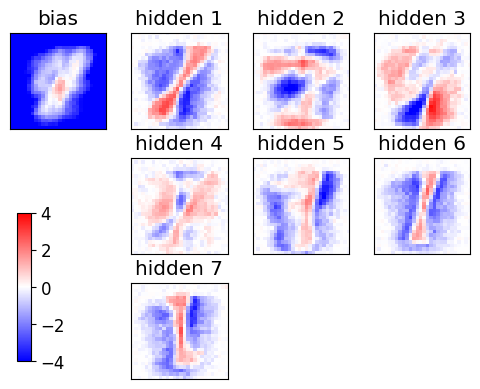

iteration 1 epoch 21 / 150  Nt: 2  N: 18  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 22 / 150  Nt: 2  N: 19  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 23 / 150  Nt: 2  N: 20  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 24 / 150  Nt: 2  N: 21  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 25 / 150  Nt: 2  N: 22  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 26 / 150  Nt: 2  N: 23  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 27 / 150  Nt: 2  N: 24  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 28 / 150  Nt: 2  N: 26  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 29 / 150  Nt: 2  N: 27  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 30 / 150  Nt: 2  N: 28  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 31 / 150  Nt

<Figure size 640x480 with 0 Axes>

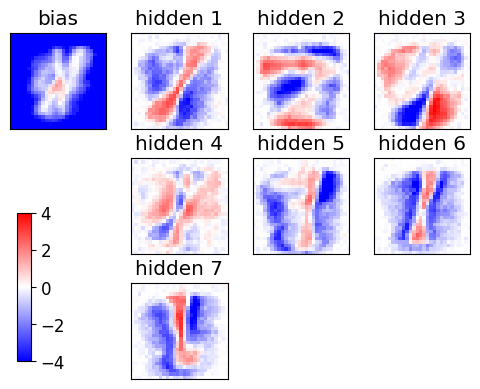

iteration 1 epoch 41 / 150  Nt: 2  N: 45  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 42 / 150  Nt: 2  N: 47  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 43 / 150  Nt: 2  N: 48  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 44 / 150  Nt: 2  N: 50  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 45 / 150  Nt: 2  N: 52  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 46 / 150  Nt: 2  N: 54  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 47 / 150  Nt: 2  N: 56  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 48 / 150  Nt: 2  N: 58  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 49 / 150  Nt: 2  N: 60  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 50 / 150  Nt: 2  N: 62  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 51 / 150  Nt

<Figure size 640x480 with 0 Axes>

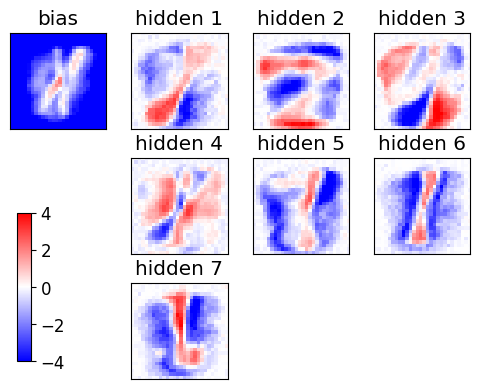

iteration 1 epoch 61 / 150  Nt: 2  N: 89  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 62 / 150  Nt: 2  N: 92  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 63 / 150  Nt: 2  N: 94  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 64 / 150  Nt: 2  N: 97  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 65 / 150  Nt: 2  N: 100  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 66 / 150  Nt: 2  N: 103  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 67 / 150  Nt: 2  N: 106  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 68 / 150  Nt: 2  N: 109  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 69 / 150  Nt: 2  N: 112  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 70 / 150  Nt: 2  N: 115  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 71 / 1

<Figure size 640x480 with 0 Axes>

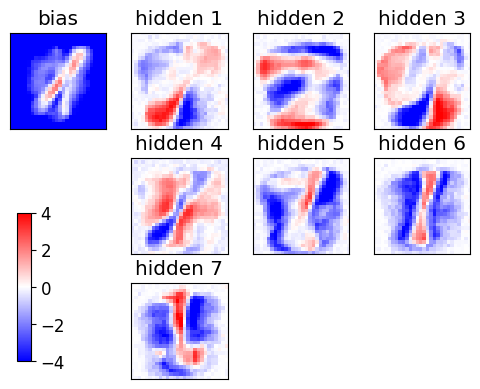

iteration 1 epoch 81 / 150  Nt: 2  N: 151  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 82 / 150  Nt: 2  N: 154  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 83 / 150  Nt: 2  N: 158  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 84 / 150  Nt: 2  N: 162  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 85 / 150  Nt: 2  N: 165  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 86 / 150  Nt: 2  N: 169  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 87 / 150  Nt: 2  N: 173  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 88 / 150  Nt: 2  N: 177  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 89 / 150  Nt: 2  N: 180  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 90 / 150  Nt: 2  N: 184  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 91

<Figure size 640x480 with 0 Axes>

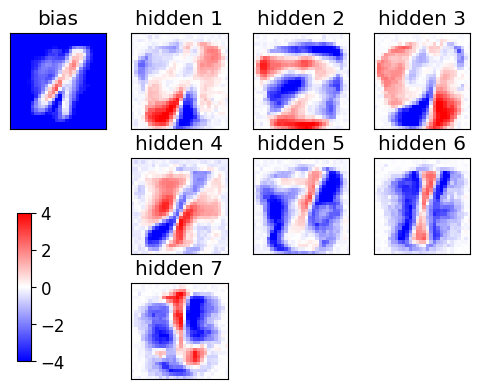

iteration 1 epoch 101 / 150  Nt: 2  N: 230  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 102 / 150  Nt: 2  N: 235  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 103 / 150  Nt: 2  N: 239  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 104 / 150  Nt: 2  N: 244  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 105 / 150  Nt: 2  N: 248  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 106 / 150  Nt: 2  N: 253  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 107 / 150  Nt: 2  N: 257  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 108 / 150  Nt: 2  N: 262  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 109 / 150  Nt: 2  N: 267  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 110 / 150  Nt: 2  N: 272  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

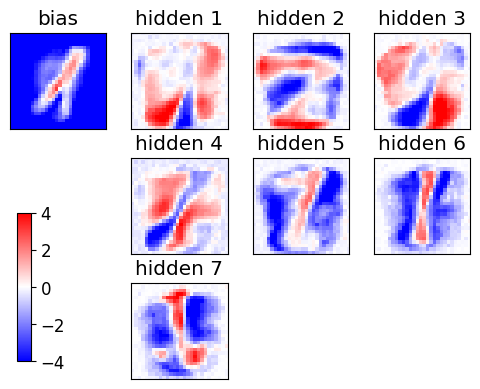

iteration 1 epoch 121 / 150  Nt: 2  N: 327  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 122 / 150  Nt: 2  N: 333  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 123 / 150  Nt: 2  N: 338  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 124 / 150  Nt: 2  N: 343  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 125 / 150  Nt: 2  N: 349  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 126 / 150  Nt: 2  N: 354  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 127 / 150  Nt: 2  N: 360  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 128 / 150  Nt: 2  N: 365  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 129 / 150  Nt: 2  N: 371  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 130 / 150  Nt: 2  N: 377  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

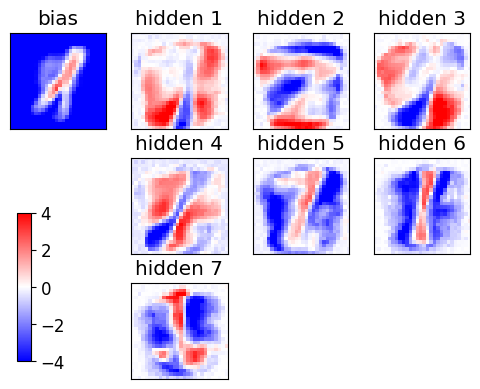

iteration 1 epoch 141 / 150  Nt: 2  N: 442  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 142 / 150  Nt: 2  N: 448  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 143 / 150  Nt: 2  N: 455  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 144 / 150  Nt: 2  N: 461  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 145 / 150  Nt: 2  N: 467  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 146 / 150  Nt: 2  N: 474  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 147 / 150  Nt: 2  N: 480  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 148 / 150  Nt: 2  N: 486  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 149 / 150  Nt: 2  N: 493  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 1 epoch 150 / 150  Nt: 2  N: 500  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False


<Figure size 640x480 with 0 Axes>

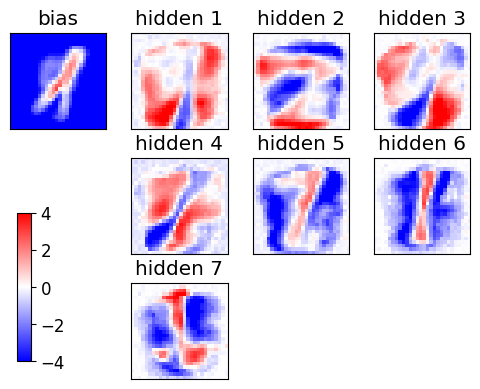

END of learning phase
Nepoch=150
Nmini=20


<Figure size 640x480 with 0 Axes>

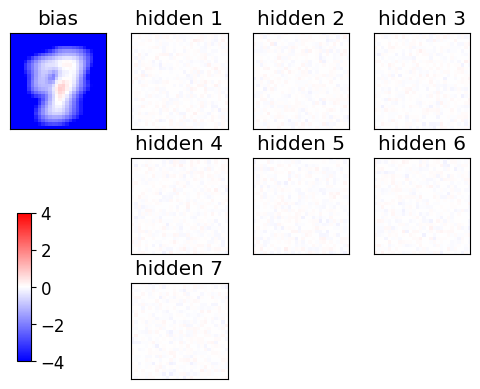

Starting the training
[12844 10524  5223  5022 13338  4707 21094 17486 17132 17021]
[ 1035 21756  9532 16778 12943 21726  5352 19723  7417 15580]
[11053  4710  5586  1965 12411 21279  3583  7316 12473  8860]
[21373 14916  5693 20889  5524 15779 17565 20181 18733 21621]
iteration 2 epoch 1 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 2 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 3 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 4 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 5 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 6 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 7 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 8 / 150  Nt: 2  N: 11  L: 7  rate: 0.05 

<Figure size 640x480 with 0 Axes>

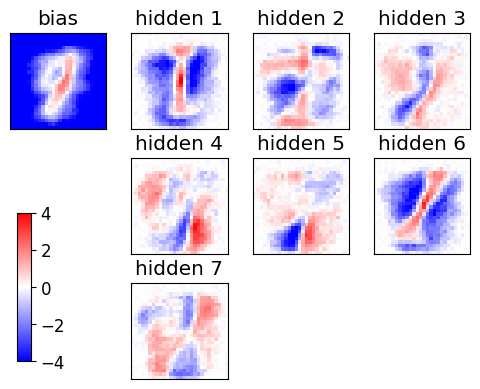

iteration 2 epoch 21 / 150  Nt: 2  N: 18  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 22 / 150  Nt: 2  N: 19  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 23 / 150  Nt: 2  N: 20  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 24 / 150  Nt: 2  N: 21  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 25 / 150  Nt: 2  N: 22  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 26 / 150  Nt: 2  N: 23  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 27 / 150  Nt: 2  N: 24  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 28 / 150  Nt: 2  N: 26  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 29 / 150  Nt: 2  N: 27  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 30 / 150  Nt: 2  N: 28  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 31 / 150  Nt

<Figure size 640x480 with 0 Axes>

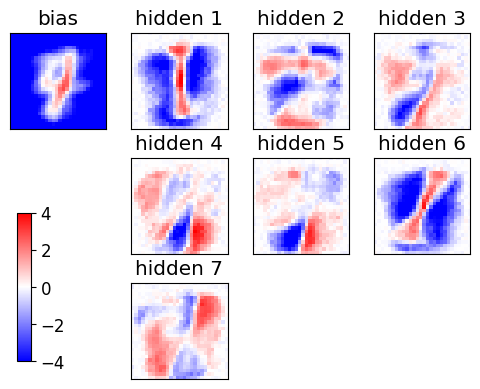

iteration 2 epoch 41 / 150  Nt: 2  N: 45  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 42 / 150  Nt: 2  N: 47  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 43 / 150  Nt: 2  N: 48  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 44 / 150  Nt: 2  N: 50  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 45 / 150  Nt: 2  N: 52  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 46 / 150  Nt: 2  N: 54  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 47 / 150  Nt: 2  N: 56  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 48 / 150  Nt: 2  N: 58  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 49 / 150  Nt: 2  N: 60  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 50 / 150  Nt: 2  N: 62  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 51 / 150  Nt

<Figure size 640x480 with 0 Axes>

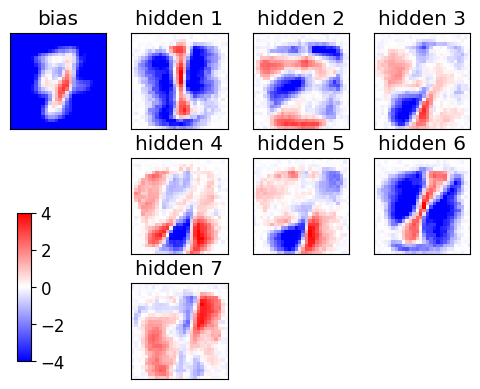

iteration 2 epoch 61 / 150  Nt: 2  N: 89  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 62 / 150  Nt: 2  N: 92  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 63 / 150  Nt: 2  N: 94  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 64 / 150  Nt: 2  N: 97  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 65 / 150  Nt: 2  N: 100  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 66 / 150  Nt: 2  N: 103  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 67 / 150  Nt: 2  N: 106  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 68 / 150  Nt: 2  N: 109  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 69 / 150  Nt: 2  N: 112  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 70 / 150  Nt: 2  N: 115  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 71 / 1

<Figure size 640x480 with 0 Axes>

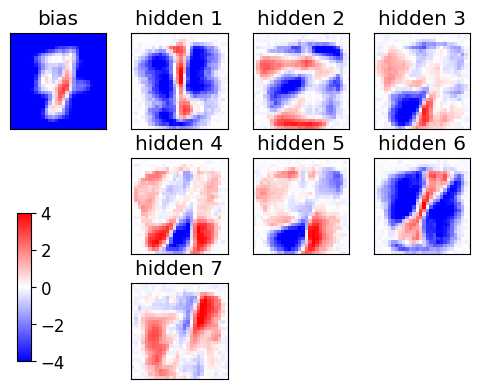

iteration 2 epoch 81 / 150  Nt: 2  N: 151  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 82 / 150  Nt: 2  N: 154  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 83 / 150  Nt: 2  N: 158  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 84 / 150  Nt: 2  N: 162  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 85 / 150  Nt: 2  N: 165  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 86 / 150  Nt: 2  N: 169  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 87 / 150  Nt: 2  N: 173  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 88 / 150  Nt: 2  N: 177  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 89 / 150  Nt: 2  N: 180  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 90 / 150  Nt: 2  N: 184  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 91

<Figure size 640x480 with 0 Axes>

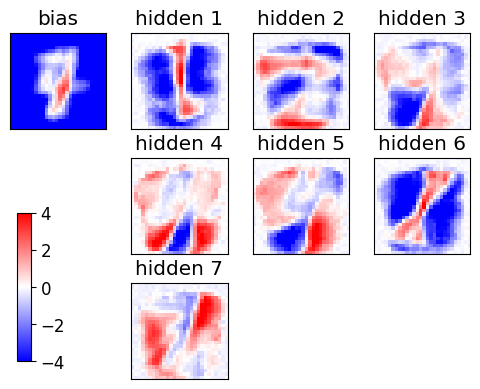

iteration 2 epoch 101 / 150  Nt: 2  N: 230  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 102 / 150  Nt: 2  N: 235  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 103 / 150  Nt: 2  N: 239  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 104 / 150  Nt: 2  N: 244  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 105 / 150  Nt: 2  N: 248  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 106 / 150  Nt: 2  N: 253  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 107 / 150  Nt: 2  N: 257  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 108 / 150  Nt: 2  N: 262  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 109 / 150  Nt: 2  N: 267  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 110 / 150  Nt: 2  N: 272  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

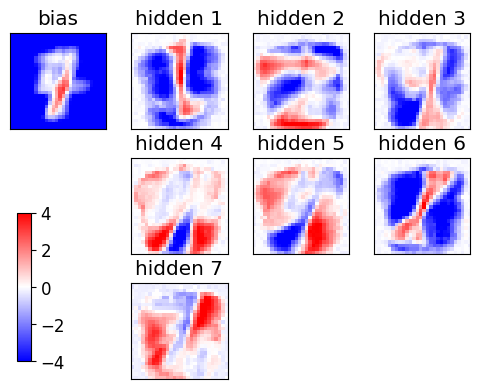

iteration 2 epoch 121 / 150  Nt: 2  N: 327  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 122 / 150  Nt: 2  N: 333  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 123 / 150  Nt: 2  N: 338  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 124 / 150  Nt: 2  N: 343  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 125 / 150  Nt: 2  N: 349  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 126 / 150  Nt: 2  N: 354  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 127 / 150  Nt: 2  N: 360  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 128 / 150  Nt: 2  N: 365  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 129 / 150  Nt: 2  N: 371  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 130 / 150  Nt: 2  N: 377  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

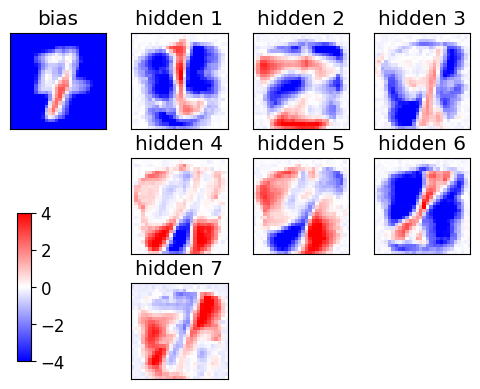

iteration 2 epoch 141 / 150  Nt: 2  N: 442  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 142 / 150  Nt: 2  N: 448  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 143 / 150  Nt: 2  N: 455  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 144 / 150  Nt: 2  N: 461  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 145 / 150  Nt: 2  N: 467  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 146 / 150  Nt: 2  N: 474  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 147 / 150  Nt: 2  N: 480  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 148 / 150  Nt: 2  N: 486  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 149 / 150  Nt: 2  N: 493  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 2 epoch 150 / 150  Nt: 2  N: 500  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False


<Figure size 640x480 with 0 Axes>

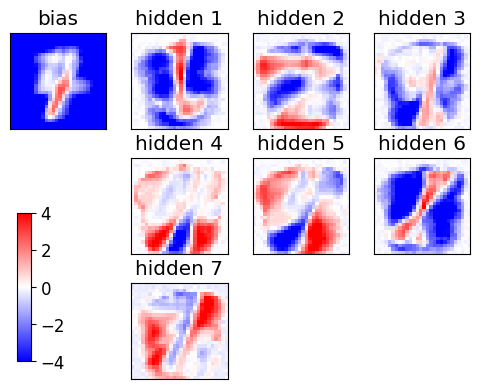

END of learning phase
Nepoch=150
Nmini=20


<Figure size 640x480 with 0 Axes>

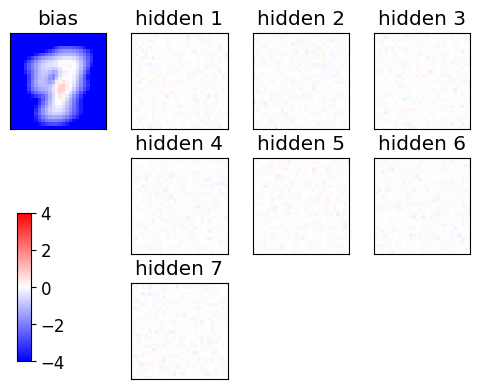

Starting the training
[17965  3140  6481  6877 20218 18828  8268  8968 13465 20660]
[12540 10203 10237 20023  1386 20911  5981 19323 15890 15064]
[20976 14525 19955 20960 10127 10292 13438  9603 17753  9197]
[12280  9002 10869 20925 18783 11756  2656 19043  5874 21063]
iteration 3 epoch 1 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 2 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 3 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 4 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 5 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 6 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 7 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 8 / 150  Nt: 2  N: 11  L: 7  rate: 0.05 

<Figure size 640x480 with 0 Axes>

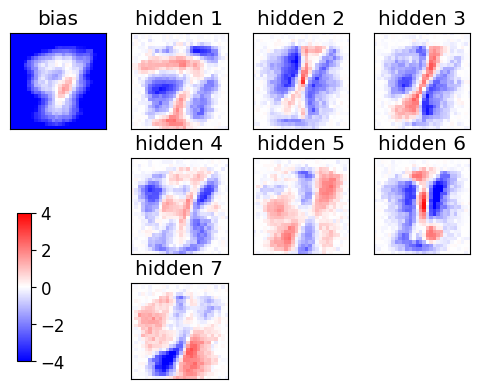

iteration 3 epoch 21 / 150  Nt: 2  N: 18  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 22 / 150  Nt: 2  N: 19  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 23 / 150  Nt: 2  N: 20  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 24 / 150  Nt: 2  N: 21  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 25 / 150  Nt: 2  N: 22  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 26 / 150  Nt: 2  N: 23  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 27 / 150  Nt: 2  N: 24  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 28 / 150  Nt: 2  N: 26  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 29 / 150  Nt: 2  N: 27  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 30 / 150  Nt: 2  N: 28  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 31 / 150  Nt

<Figure size 640x480 with 0 Axes>

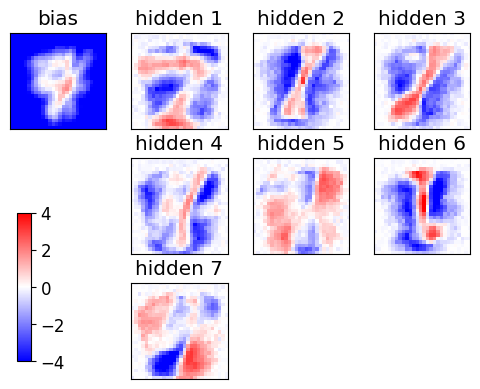

iteration 3 epoch 41 / 150  Nt: 2  N: 45  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 42 / 150  Nt: 2  N: 47  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 43 / 150  Nt: 2  N: 48  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 44 / 150  Nt: 2  N: 50  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 45 / 150  Nt: 2  N: 52  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 46 / 150  Nt: 2  N: 54  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 47 / 150  Nt: 2  N: 56  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 48 / 150  Nt: 2  N: 58  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 49 / 150  Nt: 2  N: 60  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 50 / 150  Nt: 2  N: 62  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 51 / 150  Nt

<Figure size 640x480 with 0 Axes>

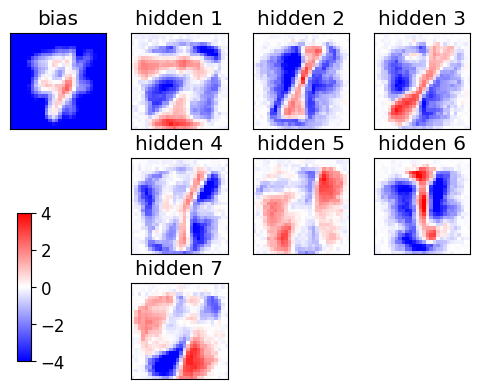

iteration 3 epoch 61 / 150  Nt: 2  N: 89  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 62 / 150  Nt: 2  N: 92  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 63 / 150  Nt: 2  N: 94  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 64 / 150  Nt: 2  N: 97  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 65 / 150  Nt: 2  N: 100  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 66 / 150  Nt: 2  N: 103  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 67 / 150  Nt: 2  N: 106  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 68 / 150  Nt: 2  N: 109  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 69 / 150  Nt: 2  N: 112  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 70 / 150  Nt: 2  N: 115  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 71 / 1

<Figure size 640x480 with 0 Axes>

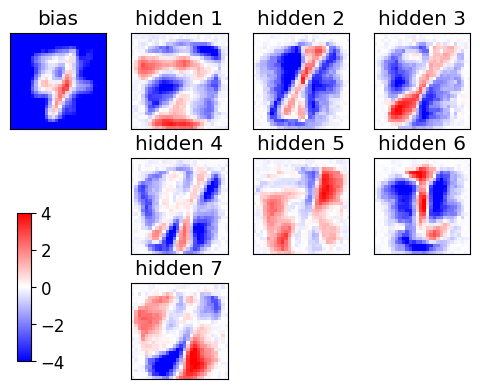

iteration 3 epoch 81 / 150  Nt: 2  N: 151  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 82 / 150  Nt: 2  N: 154  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 83 / 150  Nt: 2  N: 158  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 84 / 150  Nt: 2  N: 162  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 85 / 150  Nt: 2  N: 165  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 86 / 150  Nt: 2  N: 169  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 87 / 150  Nt: 2  N: 173  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 88 / 150  Nt: 2  N: 177  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 89 / 150  Nt: 2  N: 180  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 90 / 150  Nt: 2  N: 184  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 91

<Figure size 640x480 with 0 Axes>

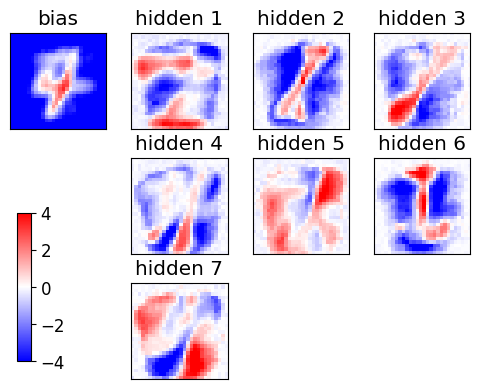

iteration 3 epoch 101 / 150  Nt: 2  N: 230  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 102 / 150  Nt: 2  N: 235  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 103 / 150  Nt: 2  N: 239  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 104 / 150  Nt: 2  N: 244  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 105 / 150  Nt: 2  N: 248  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 106 / 150  Nt: 2  N: 253  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 107 / 150  Nt: 2  N: 257  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 108 / 150  Nt: 2  N: 262  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 109 / 150  Nt: 2  N: 267  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 110 / 150  Nt: 2  N: 272  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

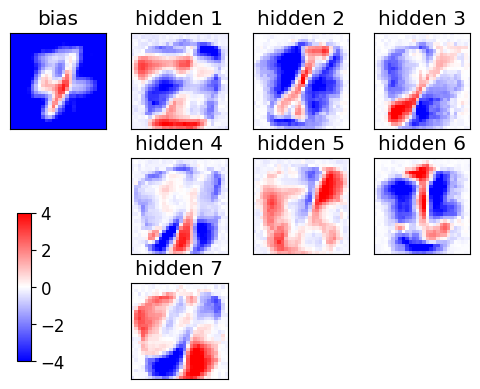

iteration 3 epoch 121 / 150  Nt: 2  N: 327  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 122 / 150  Nt: 2  N: 333  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 123 / 150  Nt: 2  N: 338  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 124 / 150  Nt: 2  N: 343  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 125 / 150  Nt: 2  N: 349  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 126 / 150  Nt: 2  N: 354  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 127 / 150  Nt: 2  N: 360  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 128 / 150  Nt: 2  N: 365  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 129 / 150  Nt: 2  N: 371  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 130 / 150  Nt: 2  N: 377  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

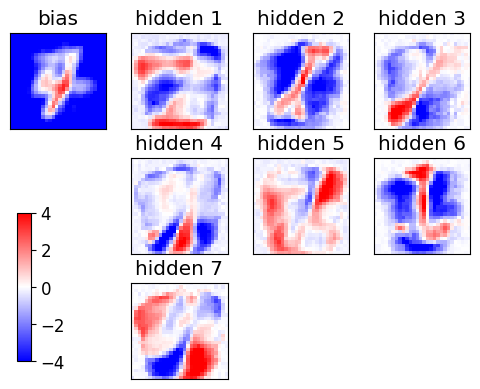

iteration 3 epoch 141 / 150  Nt: 2  N: 442  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 142 / 150  Nt: 2  N: 448  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 143 / 150  Nt: 2  N: 455  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 144 / 150  Nt: 2  N: 461  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 145 / 150  Nt: 2  N: 467  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 146 / 150  Nt: 2  N: 474  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 147 / 150  Nt: 2  N: 480  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 148 / 150  Nt: 2  N: 486  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 149 / 150  Nt: 2  N: 493  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 3 epoch 150 / 150  Nt: 2  N: 500  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False


<Figure size 640x480 with 0 Axes>

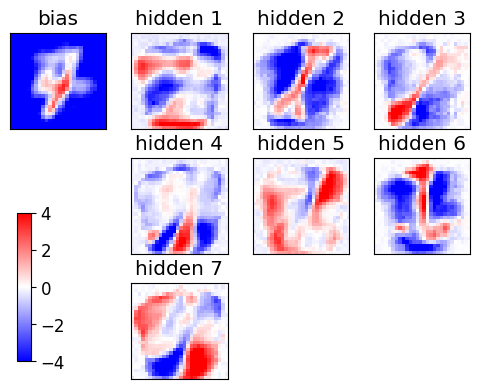

END of learning phase
Nepoch=150
Nmini=20


<Figure size 640x480 with 0 Axes>

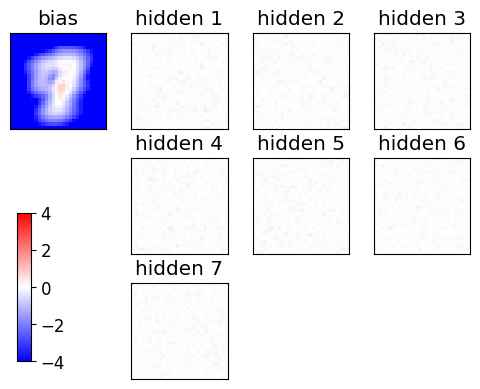

Starting the training
[ 2553 18159 21542  6095 13924 12486 19049  8841  8250  7037]
[ 3071 14673 17828 12275 18631  7102 13548  7453  2574  6408]
[ 5514  4548 21334  1418 18093 15177   763  8682 12310  4474]
[14804 19452  1893 15210   291 16051 19447 10816 18477  2593]
iteration 4 epoch 1 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 2 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 3 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 4 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 5 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 6 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 7 / 150  Nt: 2  N: 10  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 8 / 150  Nt: 2  N: 11  L: 7  rate: 0.05 

<Figure size 640x480 with 0 Axes>

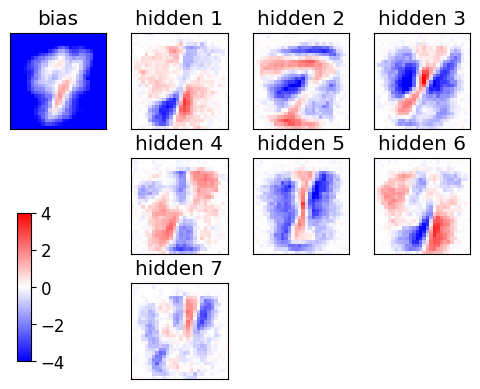

iteration 4 epoch 21 / 150  Nt: 2  N: 18  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 22 / 150  Nt: 2  N: 19  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 23 / 150  Nt: 2  N: 20  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 24 / 150  Nt: 2  N: 21  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 25 / 150  Nt: 2  N: 22  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 26 / 150  Nt: 2  N: 23  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 27 / 150  Nt: 2  N: 24  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 28 / 150  Nt: 2  N: 26  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 29 / 150  Nt: 2  N: 27  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 30 / 150  Nt: 2  N: 28  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 31 / 150  Nt

<Figure size 640x480 with 0 Axes>

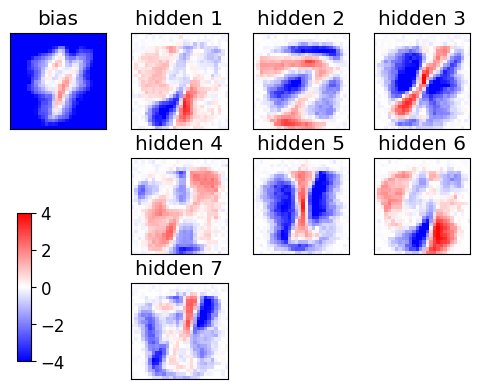

iteration 4 epoch 41 / 150  Nt: 2  N: 45  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 42 / 150  Nt: 2  N: 47  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 43 / 150  Nt: 2  N: 48  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 44 / 150  Nt: 2  N: 50  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 45 / 150  Nt: 2  N: 52  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 46 / 150  Nt: 2  N: 54  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 47 / 150  Nt: 2  N: 56  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 48 / 150  Nt: 2  N: 58  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 49 / 150  Nt: 2  N: 60  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 50 / 150  Nt: 2  N: 62  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 51 / 150  Nt

<Figure size 640x480 with 0 Axes>

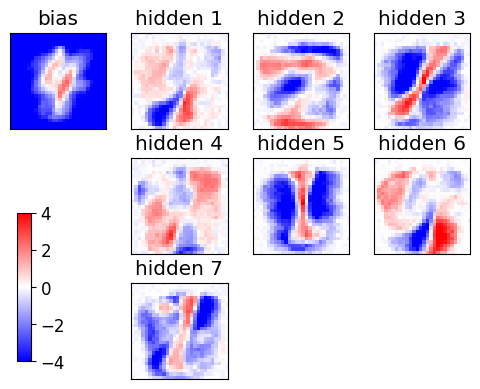

iteration 4 epoch 61 / 150  Nt: 2  N: 89  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 62 / 150  Nt: 2  N: 92  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 63 / 150  Nt: 2  N: 94  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 64 / 150  Nt: 2  N: 97  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 65 / 150  Nt: 2  N: 100  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 66 / 150  Nt: 2  N: 103  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 67 / 150  Nt: 2  N: 106  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 68 / 150  Nt: 2  N: 109  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 69 / 150  Nt: 2  N: 112  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 70 / 150  Nt: 2  N: 115  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 71 / 1

<Figure size 640x480 with 0 Axes>

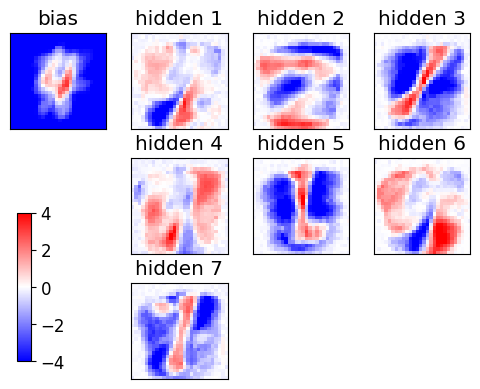

iteration 4 epoch 81 / 150  Nt: 2  N: 151  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 82 / 150  Nt: 2  N: 154  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 83 / 150  Nt: 2  N: 158  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 84 / 150  Nt: 2  N: 162  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 85 / 150  Nt: 2  N: 165  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 86 / 150  Nt: 2  N: 169  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 87 / 150  Nt: 2  N: 173  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 88 / 150  Nt: 2  N: 177  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 89 / 150  Nt: 2  N: 180  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 90 / 150  Nt: 2  N: 184  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 91

<Figure size 640x480 with 0 Axes>

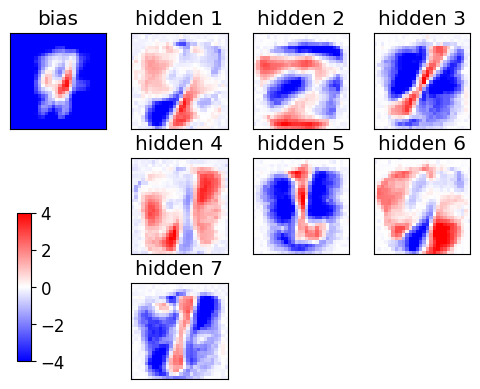

iteration 4 epoch 101 / 150  Nt: 2  N: 230  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 102 / 150  Nt: 2  N: 235  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 103 / 150  Nt: 2  N: 239  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 104 / 150  Nt: 2  N: 244  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 105 / 150  Nt: 2  N: 248  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 106 / 150  Nt: 2  N: 253  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 107 / 150  Nt: 2  N: 257  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 108 / 150  Nt: 2  N: 262  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 109 / 150  Nt: 2  N: 267  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 110 / 150  Nt: 2  N: 272  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

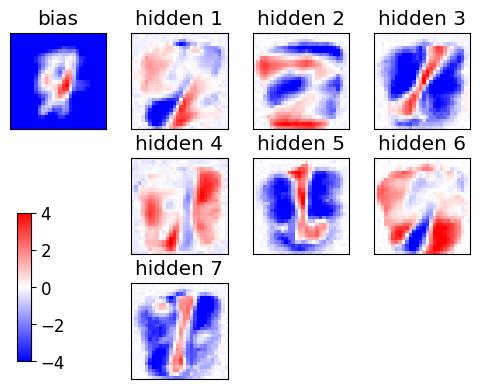

iteration 4 epoch 121 / 150  Nt: 2  N: 327  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 122 / 150  Nt: 2  N: 333  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 123 / 150  Nt: 2  N: 338  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 124 / 150  Nt: 2  N: 343  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 125 / 150  Nt: 2  N: 349  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 126 / 150  Nt: 2  N: 354  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 127 / 150  Nt: 2  N: 360  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 128 / 150  Nt: 2  N: 365  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 129 / 150  Nt: 2  N: 371  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 130 / 150  Nt: 2  N: 377  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 

<Figure size 640x480 with 0 Axes>

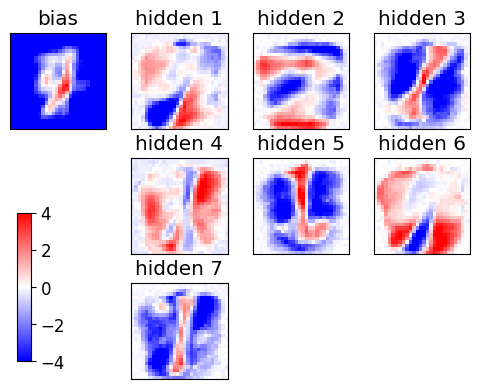

iteration 4 epoch 141 / 150  Nt: 2  N: 442  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 142 / 150  Nt: 2  N: 448  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 143 / 150  Nt: 2  N: 455  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 144 / 150  Nt: 2  N: 461  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 145 / 150  Nt: 2  N: 467  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 146 / 150  Nt: 2  N: 474  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 147 / 150  Nt: 2  N: 480  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 148 / 150  Nt: 2  N: 486  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 149 / 150  Nt: 2  N: 493  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False
iteration 4 epoch 150 / 150  Nt: 2  N: 500  L: 7  rate: 0.05  gam: 0.001 SPINS= False POTTS= False


<Figure size 640x480 with 0 Axes>

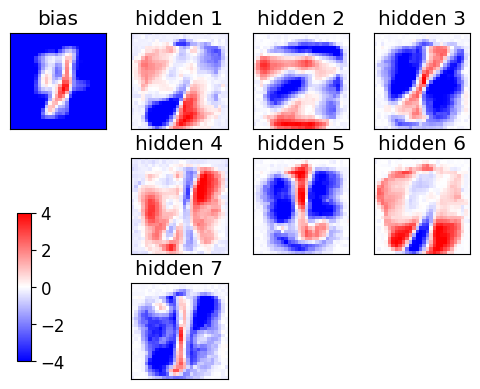

END of learning phase


In [13]:
#TRAINING FOR L=7, CD=2 ()

for i in range(5):
    for L in L_v:
        if L==7:
            iteration=i
            np.random.seed(12345*iteration)
            # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
            w = sigma * np.random.randn(D,L)
            #a = sigma * np.random.randn(D)
            # using Hinton initialization of visible biases
            a = Hinton_bias_init(data)
            # hidden biases initialized to zero
            b = np.zeros(L)
            #print("w=",w);print("a=",a);print("b=",b)
        
            # nr of epochs
            Nepoch=150
            # minibatches per epoch
            Nmini=20
            # minibatch size at initial epoch and final one
            N_ini,N_fin=10,500
            print(f"Nepoch={Nepoch}\nNmini={Nmini}")
        
        
            # recording history of weights ("E" means epoch)
            wE,aE,bE=np.zeros((Nepoch+1,D,L)),np.zeros((Nepoch+1,D)),np.zeros((Nepoch+1,L))
            wE[0],aE[0],bE[0]=np.copy(w),np.copy(a),np.copy(b)
            gwE,gw2E,gwE_d,gwE_m = np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE)
            gaE,ga2E,gaE_d,gaE_m = np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE)
            gbE,gb2E,gbE_d,gbE_m = np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE)
            miniE = np.zeros(Nepoch+1)
            pzE=np.zeros((Nepoch+1,Nz))
            if GRAD=="RMSprop":
                gw2,ga2,gb2 = np.zeros_like(w),np.zeros_like(a),np.zeros_like(b)
        
            indices=np.arange(Nd).astype("int")
            plot_weights_bias(wE, aE, 0, L, cols=L//2, save=False)
        
            # for the plot with panels
            Ncols=min(8,max(2,L//2))
        
            if POTTS: print("Starting the training, POTTS=True")
            else: print("Starting the training")
        
            # Note: here an epoch does not analyze the whole dataset
            for epoch in range(1,1+Nepoch):
                # q maps epochs to interval [0,1]
                q = (epoch-1.)/(Nepoch-1.)
                # N, size of the mini batch
                # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
                N = int(N_ini + (N_fin-N_ini)*(q**2))
                #  l_rate interpolates between initial and final value
                l_rate = l_rate_ini + (l_rate_fin-l_rate_ini)*q
        
                for mini in range(Nmini):
                    # initializitation for averages in minibatch
                    # visible variables "v" --> "x"
                    #  hidden variables "h" --> "z"
                    x_data, x_model = np.zeros(D),np.zeros(D)
                    z_data, z_model = np.zeros(L),np.zeros(L)
                    xz_data,xz_model= np.zeros((D,L)),np.zeros((D,L))
                    pz = np.zeros(L)
        
                    # Minibatch of size N: points randomply picked (without repetition) from data
                    selected = np.random.choice(indices,N,replace=False)
                    if epoch==1 and mini<=3: print(selected)
        
                    for k in range(N):
                        ###################################
                        x0 = data[selected[k]]
                        # positive CD phase: generating z from x[k]
                        z = CD_step(x0,w,b,POTTS=POTTS)
                        x_data  += x0
                        z_data  += z
                        xz_data += np.outer(x0,z)
                        # fantasy
                        zf=np.copy(z)
                        # Contrastive divergence with Nt steps
                        for t in range(Nt):
                            # negative CD pzase: generating fantasy xf from fantasy zf
                            xf = CD_step(zf,w.T,a)
                            # positive CD phase: generating fantasy zf from fantasy xf
                            zf = CD_step(xf,w,b,POTTS=POTTS)
                        x_model += xf
                        z_model += zf
                        xz_model+= np.outer(xf,zf)
                        # recording probability of encoding in z-space, if POTTS
                        if POTTS: pz[zf]+=1
        
                    # gradient of the likelihood: follow it along its positive direction
                    gw_d,gw_m = xz_data/N, xz_model/N
                    ga_d,ga_m = x_data/N, x_model/N
                    gb_d,gb_m = z_data/N, z_model/N
                    gw=np.copy(gw_d - gw_m)
                    ga=np.copy(ga_d - ga_m)
                    gb=np.copy(gb_d - gb_m)
        
                    # gradient ascent step
                    if GRAD=="RMSprop":
                        # RMSprop gradient ascent
                        gw2 = beta*gw2+(1-beta)*np.square(gw)
                        ga2 = beta*ga2+(1-beta)*np.square(ga)
                        gb2 = beta*gb2+(1-beta)*np.square(gb)
                        w += l_rate*gw/sqrt(epsilon+gw2)
                        a += l_rate*ga/sqrt(epsilon+ga2)
                        b += l_rate*gb/sqrt(epsilon+gb2)
                    else:
                        # defaulting to the vanilla stochastic gradient ascent (SGD)
                        w += l_rate*gw
                        a += l_rate*ga
                        b += l_rate*gb
                    # regularization (LASSO)
                    if gamma>0.:
                        w -= (gamma*l_rate)*sign(w)
                        a -= (gamma*l_rate)*sign(a)
                        b -= (gamma*l_rate)*sign(b)
        
                wE[epoch],gwE[epoch],gwE_d[epoch],gwE_m[epoch]=np.copy(w),np.copy(gw),np.copy(gw_d),np.copy(gw_m)
                aE[epoch],gaE[epoch],gaE_d[epoch],gaE_m[epoch]=np.copy(a),np.copy(ga),np.copy(ga_d),np.copy(ga_m)
                bE[epoch],gbE[epoch],gbE_d[epoch],gbE_m[epoch]=np.copy(b),np.copy(gb),np.copy(gb_d),np.copy(gb_m)
                miniE[epoch]=N
                if POTTS: pzE[epoch] = pz/np.sum(pz)
                print("iteration",iteration,"epoch",epoch,"/",Nepoch," Nt:",Nt," N:",N," L:",L,
                      " rate:",l_rate," gam:",gamma,"SPINS=",SPINS,"POTTS=",POTTS)
        
                if Nepoch<=100 or epoch%20==0 or epoch==Nepoch:
                    plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)
        
                str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")
            save_epochs_iter(wE,"w")
            save_epochs_iter(bE,"b")
            save_epochs_iter(aE,"a")
        
    print("END of learning phase")


Log-likelihood calculations:

In [17]:
log_like_3=[]
log_like_3_std=[]
Nepoch=150

num_epo=np.arange(Nepoch-10,Nepoch,1) # consider trend over the last 5 iterations

for iteration in range(4):
    L=3
    Nt=2
                     #WEIGHTS/a_RBM_MNIST3_L3_Nt4_RMSprop-0.05-0.05_Ep150_0_reg0.001.npy
    a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'a_all iteration={iteration}, L={L}, Nt={Nt},gamma={0.001}')
    b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'b_all iteration={iteration}, L={L}, Nt={Nt},gamma={0.001}')
    w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'w_all iteration={iteration}, L={L}, Nt={Nt},gamma={0.001}') ## matrice visible*hidden per epoch

    log_like_3_iter=[]
    log_like_3_iter_std=[]
    Nepoch=150
    for i in range(Nepoch-10,Nepoch,1):
        print(f'Epoch n.{i}')
        ll_iter=[]
        mean=[]
        for iter in range(5): # to determine the loglike at each epoch we run the calculation 5 times and compute the average, to reduce randomness
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            ll_iter.append(ll)
        ll_mean= np.array(ll_iter).mean()
        ll_std= np.array(ll_iter).std()
        log_like_3_iter.append(ll_mean)
        log_like_3_iter_std.append(ll_std)
        print('Log-likelihood=',ll_mean,"+-",ll_std)
    log_like_3.append(log_like_3_iter)
    log_like_3_std.append(log_like_3_iter_std)


a_all iteration=0, L=3, Nt=4,gamma=0.01
b_all iteration=0, L=3, Nt=4,gamma=0.01
w_all iteration=0, L=3, Nt=4,gamma=0.01
Epoch n.140


/tmp/ipykernel_29465/1110943413.py:41: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float64, 1, 'C', False, aligned=True), Array(float64, 1, 'A', False, aligned=True))
  second_term = -compute_partition_function(w, a, b, all_z, q, D)
Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1828.89it/s]


Log-likelihood= -135.50841553004415 +- 0.7079878341806227
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1786.78it/s]


Log-likelihood= -134.88998395311756 +- 0.8835143852655247
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1827.43it/s]


Log-likelihood= -135.6055484695663 +- 0.6521875426611871
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1819.73it/s]


Log-likelihood= -136.73859340593685 +- 0.2613866035499715
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1829.72it/s]


Log-likelihood= -134.9854880801124 +- 0.8191029056054075
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1864.57it/s]


Log-likelihood= -135.40306942309974 +- 0.6756547080592903
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1776.72it/s]


Log-likelihood= -135.09543643467265 +- 0.12857756349463637
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1844.31it/s]


Log-likelihood= -135.85823295138204 +- 0.41610948047805224
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1864.88it/s]


Log-likelihood= -134.2755446526357 +- 0.29551416255886087
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1835.17it/s]


Log-likelihood= -135.33743445982515 +- 0.5124423207876858
a_all iteration=1, L=3, Nt=4,gamma=0.01
b_all iteration=1, L=3, Nt=4,gamma=0.01
w_all iteration=1, L=3, Nt=4,gamma=0.01
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1821.98it/s]


Log-likelihood= -132.00488171330625 +- 0.6014034296639696
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1812.48it/s]


Log-likelihood= -132.22634053935468 +- 0.5532221645121672
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1727.76it/s]


Log-likelihood= -132.14798787823142 +- 0.5836591387358112
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1808.37it/s]


Log-likelihood= -131.85278429704962 +- 0.35186395745863125
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1796.21it/s]


Log-likelihood= -131.67375735174008 +- 0.49218574965077694
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1781.45it/s]


Log-likelihood= -130.97493660923774 +- 0.5758141769524466
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1770.47it/s]


Log-likelihood= -131.58304321147602 +- 0.5320632028346904
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1798.35it/s]


Log-likelihood= -131.33233361123487 +- 0.342930910540974
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1791.57it/s]


Log-likelihood= -132.6898028790686 +- 0.8645434268599093
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1791.46it/s]


Log-likelihood= -130.51316662503982 +- 0.6950475186826716
a_all iteration=2, L=3, Nt=4,gamma=0.01
b_all iteration=2, L=3, Nt=4,gamma=0.01
w_all iteration=2, L=3, Nt=4,gamma=0.01
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1927.69it/s]


Log-likelihood= -132.501334982792 +- 0.6640395565896925
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1844.42it/s]


Log-likelihood= -132.26615054332558 +- 0.6986152783363673
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1985.48it/s]


Log-likelihood= -132.27063709252408 +- 0.25766479289886673
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1972.94it/s]


Log-likelihood= -131.57265423974587 +- 0.7755247235470554
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1992.17it/s]


Log-likelihood= -131.97160124291258 +- 0.5690230131818826
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1994.23it/s]


Log-likelihood= -131.98252690870694 +- 0.5197161295357942
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1979.26it/s]


Log-likelihood= -131.06321670867382 +- 0.71833721602389
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1981.35it/s]


Log-likelihood= -131.85203853649415 +- 0.7500821930889288
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:03<00:00, 1725.40it/s]


Log-likelihood= -132.78432948844585 +- 0.5921798314200872
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1948.11it/s]


Log-likelihood= -131.54738596500175 +- 0.20615191119891121
a_all iteration=3, L=3, Nt=4,gamma=0.01
b_all iteration=3, L=3, Nt=4,gamma=0.01
w_all iteration=3, L=3, Nt=4,gamma=0.01
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1967.16it/s]


Log-likelihood= -133.18315653277915 +- 0.40569528886099543
Epoch n.141


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1957.15it/s]


Log-likelihood= -132.45487918342087 +- 0.5662372198108818
Epoch n.142


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1974.67it/s]


Log-likelihood= -131.77057719441692 +- 0.7392319949362431
Epoch n.143


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1939.51it/s]


Log-likelihood= -134.6588001785894 +- 0.8166718787712542
Epoch n.144


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1925.75it/s]


Log-likelihood= -134.03193952341408 +- 0.2251304211925125
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1970.21it/s]


Log-likelihood= -133.98505056033662 +- 0.356689131925774
Epoch n.146


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1928.49it/s]


Log-likelihood= -133.05878000390214 +- 0.7185478002396625
Epoch n.147


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1915.30it/s]


Log-likelihood= -133.23911316250548 +- 0.5513769257351989
Epoch n.148


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1965.45it/s]


Log-likelihood= -133.55426655967213 +- 0.23785876542790377
Epoch n.149


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 1971.61it/s]

Log-likelihood= -132.50271556800686 +- 0.7739645669968624


In [16]:
log_like_7=[]
log_like_7_std=[]
Nepoch=150

num_epo=np.arange(Nepoch-10,Nepoch,1) # consider trend over the last 5 iterations

for iteration in range(5):
    L=7
    Nt=2
    a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'a_all iteration={i}, L={L}, Nt={Nt},gamma={0.001}')
    b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'b_all iteration={i}, L={L}, Nt={Nt},gamma={0.001}')
    w_all=np.load(f"WEIGHTS//w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'w_all iteration={i}, L={L}, Nt={Nt},gamma={0.001}') ## matrice visible*hidden per epoch

    log_like_7_iter=[]
    log_like_7_iter_std=[]
    Nepoch=150
    for i in range(Nepoch-10,Nepoch,1):
        print(f'Epoch n.{i}')
        ll_iter=[]
        mean=[]
        for iter in range(5): # to determine the loglike at each epoch we run the calculation 5 times and compute the average, to reduce randomness
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            ll_iter.append(ll)
        ll_mean= np.array(ll_iter).mean()
        ll_std= np.array(ll_iter).std()
        log_like_7_iter.append(ll_mean)
        log_like_7_iter_std.append(ll_std)
        print('Log-likelihood=',ll_mean,"+-",ll_std)
    log_like_7.append(log_like_7_iter)
    log_like_7_std.append(log_like_7_iter_std)


a_all iteration=140, L=7, Nt=2,gamma=0.001
b_all iteration=140, L=7, Nt=2,gamma=0.001
w_all iteration=140, L=7, Nt=2,gamma=0.001
Epoch n.140


/tmp/ipykernel_1906/1603196961.py:52: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float64, 1, 'C', False, aligned=True), Array(float64, 1, 'A', False, aligned=True))
  second_term = -compute_partition_function(w, a, b, all_z, q, D)
Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:01<00:00, 89.65it/s]


Log-likelihood= -120.55640490743929 +- 0.49322487277186805
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:52<00:00, 103.80it/s]


Log-likelihood= -119.55680683996938 +- 0.40209312647848217
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:52<00:00, 104.51it/s]


Log-likelihood= -118.57821567738543 +- 0.6622799671345595
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 114.99it/s]


Log-likelihood= -118.3093433539165 +- 0.3202080696288781
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.45it/s]


Log-likelihood= -119.05045350279792 +- 0.7801391810701462
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 117.63it/s]


Log-likelihood= -119.11232670331049 +- 0.7643713244147353
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 116.76it/s]


Log-likelihood= -119.26075164928473 +- 0.5435581938846648
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 114.97it/s]


Log-likelihood= -119.54530089758521 +- 0.33747973415088867
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 116.78it/s]


Log-likelihood= -121.24685238811965 +- 0.5831760749228857
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 116.52it/s]


Log-likelihood= -119.09227227313485 +- 0.31282840116247773
a_all iteration=149, L=7, Nt=2,gamma=0.001
b_all iteration=149, L=7, Nt=2,gamma=0.001
w_all iteration=149, L=7, Nt=2,gamma=0.001
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 117.48it/s]


Log-likelihood= -120.81126011664874 +- 0.32848039544403673
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 117.97it/s]


Log-likelihood= -119.12752368626653 +- 0.44888072115941136
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 115.33it/s]


Log-likelihood= -120.17121933328289 +- 0.544685752653423
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:46<00:00, 118.07it/s]


Log-likelihood= -117.2407487361312 +- 0.2913806130147189
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:50<00:00, 108.83it/s]


Log-likelihood= -117.90185215622814 +- 0.4131431312564638
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.52it/s]


Log-likelihood= -118.4233702862222 +- 0.8072040401966328
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.37it/s]


Log-likelihood= -119.08016785215122 +- 0.3860917652341939
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:53<00:00, 102.60it/s]


Log-likelihood= -118.11476355159638 +- 0.7919250232336839
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 114.83it/s]


Log-likelihood= -118.3978280474349 +- 0.31841597364565183
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:51<00:00, 107.46it/s]


Log-likelihood= -120.21960978480976 +- 1.0665547936619515
a_all iteration=149, L=7, Nt=2,gamma=0.001
b_all iteration=149, L=7, Nt=2,gamma=0.001
w_all iteration=149, L=7, Nt=2,gamma=0.001
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.81it/s]


Log-likelihood= -116.23821254980075 +- 0.480113509412908
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:53<00:00, 102.60it/s]


Log-likelihood= -118.62891672271944 +- 0.4847373954456655
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 115.94it/s]


Log-likelihood= -118.03348686764143 +- 0.7892903005289379
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:47<00:00, 115.56it/s]


Log-likelihood= -117.51485897309388 +- 0.8711360379530851
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:54<00:00, 100.69it/s]


Log-likelihood= -117.75884113648132 +- 0.3164953731864108
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:51<00:00, 106.48it/s]


Log-likelihood= -115.9823743299351 +- 0.7358119712790286
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:54<00:00, 100.74it/s]


Log-likelihood= -117.7513601751546 +- 0.2901077972777842
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:50<00:00, 108.17it/s]


Log-likelihood= -117.4136906400148 +- 0.7537617376367292
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.93it/s]


Log-likelihood= -119.51143947555288 +- 0.4223419321464056
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:50<00:00, 109.08it/s]


Log-likelihood= -116.07103354544533 +- 0.8522413022630753
a_all iteration=149, L=7, Nt=2,gamma=0.001
b_all iteration=149, L=7, Nt=2,gamma=0.001
w_all iteration=149, L=7, Nt=2,gamma=0.001
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:53<00:00, 102.20it/s]


Log-likelihood= -121.34742638792974 +- 0.5453830053524761
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:53<00:00, 103.53it/s]


Log-likelihood= -121.84229864377544 +- 0.40061657615476864
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:50<00:00, 109.18it/s]


Log-likelihood= -120.5943991338531 +- 0.44916320001902765
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:54<00:00, 101.63it/s]


Log-likelihood= -120.67376791321635 +- 0.49462316848869825
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:51<00:00, 107.64it/s]


Log-likelihood= -121.3760105508948 +- 0.5655498787519059
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:53<00:00, 102.51it/s]


Log-likelihood= -121.56700299893566 +- 0.5068187096405273
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:54<00:00, 101.54it/s]


Log-likelihood= -121.86644090884958 +- 0.8218754959223995
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:50<00:00, 109.82it/s]


Log-likelihood= -119.78411494423513 +- 0.6610640508704995
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 111.39it/s]


Log-likelihood= -120.0822646221681 +- 0.817810977963022
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.39it/s]


Log-likelihood= -117.50902228474271 +- 0.5389035221709484
a_all iteration=149, L=7, Nt=2,gamma=0.001
b_all iteration=149, L=7, Nt=2,gamma=0.001
w_all iteration=149, L=7, Nt=2,gamma=0.001
Epoch n.140


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [00:56<00:00, 96.93it/s]


Log-likelihood= -118.56363490231396 +- 0.2811612888780421
Epoch n.141


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [00:55<00:00, 99.61it/s]


Log-likelihood= -117.81574836286953 +- 0.9319215651888404
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 110.72it/s]


Log-likelihood= -118.90928934308204 +- 0.3872665057158554
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.14it/s]


Log-likelihood= -117.31035381822491 +- 0.7314311404650565
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:49<00:00, 111.87it/s]


Log-likelihood= -118.50404488491782 +- 0.22113452445816512
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:50<00:00, 108.11it/s]


Log-likelihood= -118.47088118518346 +- 0.5170058675672443
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:53<00:00, 101.83it/s]


Log-likelihood= -118.87311151469301 +- 0.5194854488216485
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:53<00:00, 102.48it/s]


Log-likelihood= -118.58001347894192 +- 0.30927552596274255
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.83it/s]


Log-likelihood= -119.2227607729501 +- 0.7346201330246039
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:48<00:00, 113.94it/s]

Log-likelihood= -117.31042671402554 +- 0.6578705093550178


In [138]:
log_like_8=[]
log_like_8_std=[]
Nepoch=150

num_epo=np.arange(Nepoch-10,Nepoch,1) # consider trend over the last 5 iterations

for iteration in range(4):
    L=8
    Nt=2

    a_all = np.load(f"WEIGHTS/a_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'a_all iteration={i}, L={L}, Nt={Nt},gamma={0.01}')
    b_all= np.load(f"WEIGHTS/b_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'b_all iteration={i}, L={L}, Nt={Nt},gamma={0.01}')
    w_all=np.load(f"WEIGHTS/w_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_{iteration}_reg0.001.npy", allow_pickle=True)
    print(f'w_all iteration={i}, L={L}, Nt={Nt},gamma={0.01}') ## matrice visible*hidden per epoch

    log_like_8_iter=[]
    log_like_8_iter_std=[]
    Nepoch=150
    for i in range(Nepoch-10,Nepoch,1):
        print(f'Epoch n.{i}')
        ll_iter=[]
        mean=[]
        for iter in range(5): # to determine the loglike at each epoch we run the calculation 5 times and compute the average, to reduce randomness
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            ll_iter.append(ll)
        ll_mean= np.array(ll_iter).mean()
        ll_std= np.array(ll_iter).std()
        log_like_8_iter.append(ll_mean)
        log_like_8_iter_std.append(ll_std)
        print('Log-likelihood=',ll_mean,"+-",ll_std)
    log_like_8.append(log_like_8_iter)
    log_like_8_std.append(log_like_8_iter_std)


a_all iteration=140, L=8, Nt=4,gamma=0.01
b_all iteration=140, L=8, Nt=4,gamma=0.01
w_all iteration=140, L=8, Nt=4,gamma=0.01
Epoch n.140


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:38<00:00, 55.59it/s]


Log-likelihood= -127.44796908573483 +- 0.5194814560774086
Epoch n.141


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:42<00:00, 53.86it/s]


Log-likelihood= -122.51263241755876 +- 0.3757259038105833
Epoch n.142


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:34<00:00, 57.91it/s]


Log-likelihood= -125.12306875933182 +- 0.3454321694763598
Epoch n.143


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:43<00:00, 53.15it/s]


Log-likelihood= -123.72152846341673 +- 0.37117208338284047
Epoch n.144


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:32<00:00, 59.21it/s]


Log-likelihood= -125.01488480712162 +- 0.27736007801561297
Epoch n.145


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 60.14it/s]


Log-likelihood= -123.39668608737307 +- 0.5213722774597676
Epoch n.146


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:47<00:00, 50.98it/s]


Log-likelihood= -125.28425016518823 +- 0.475745662264672
Epoch n.147


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:40<00:00, 54.89it/s]


Log-likelihood= -123.73063896123634 +- 0.7642719121281724
Epoch n.148


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:43<00:00, 52.95it/s]


Log-likelihood= -125.67774279356107 +- 0.6488407768994333
Epoch n.149


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:46<00:00, 51.52it/s]


Log-likelihood= -124.14198997154475 +- 0.6863648400457035
a_all iteration=149, L=8, Nt=4,gamma=0.01
b_all iteration=149, L=8, Nt=4,gamma=0.01
w_all iteration=149, L=8, Nt=4,gamma=0.01
Epoch n.140


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:34<00:00, 58.13it/s]


Log-likelihood= -113.89986818782943 +- 0.21332647840416427
Epoch n.141


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:47<00:00, 51.04it/s]


Log-likelihood= -114.5681047016787 +- 0.38889114790031887
Epoch n.142


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:48<00:00, 50.66it/s]


Log-likelihood= -118.68226655203384 +- 0.593685948628179
Epoch n.143


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:42<00:00, 53.54it/s]


Log-likelihood= -117.45627592640638 +- 0.2802874740368998
Epoch n.144


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:40<00:00, 54.68it/s]


Log-likelihood= -115.84565501029635 +- 0.33296479835214005
Epoch n.145


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 59.78it/s]


Log-likelihood= -116.5288913618549 +- 0.5008108503757642
Epoch n.146


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:32<00:00, 59.33it/s]


Log-likelihood= -115.55153434470124 +- 0.7407867351279983
Epoch n.147


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:37<00:00, 56.40it/s]


Log-likelihood= -115.94221328662238 +- 0.4851185252730006
Epoch n.148


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:37<00:00, 56.55it/s]


Log-likelihood= -117.59592723334235 +- 0.5494139267328356
Epoch n.149


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:52<00:00, 48.94it/s]


Log-likelihood= -116.27763069725711 +- 0.42332436368114634
a_all iteration=149, L=8, Nt=4,gamma=0.01
b_all iteration=149, L=8, Nt=4,gamma=0.01
w_all iteration=149, L=8, Nt=4,gamma=0.01
Epoch n.140


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:43<00:00, 53.27it/s]


Log-likelihood= -118.78885985008137 +- 0.4035688128152784
Epoch n.141


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:41<00:00, 54.18it/s]


Log-likelihood= -117.79201536871972 +- 0.610325529207797
Epoch n.142


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:43<00:00, 53.30it/s]


Log-likelihood= -117.51406738841695 +- 0.6994498775057957
Epoch n.143


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:43<00:00, 53.07it/s]


Log-likelihood= -117.26503447480518 +- 0.5158954595926715
Epoch n.144


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:36<00:00, 57.01it/s]


Log-likelihood= -117.80732978076267 +- 0.6156566162275
Epoch n.145


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:38<00:00, 55.57it/s]


Log-likelihood= -116.6725644916448 +- 0.5970722984115473
Epoch n.146


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:33<00:00, 58.84it/s]


Log-likelihood= -118.16882507562232 +- 0.3928682067511624
Epoch n.147


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:32<00:00, 59.57it/s]


Log-likelihood= -118.44721158219284 +- 0.620974208046326
Epoch n.148


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:34<00:00, 57.95it/s]


Log-likelihood= -117.54376002128421 +- 0.5097359106498313
Epoch n.149


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 60.11it/s]


Log-likelihood= -116.8042853458036 +- 0.3156353523254984
a_all iteration=149, L=8, Nt=4,gamma=0.01
b_all iteration=149, L=8, Nt=4,gamma=0.01
w_all iteration=149, L=8, Nt=4,gamma=0.01
Epoch n.140


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 60.13it/s]


Log-likelihood= -121.81096574017909 +- 0.27301028166657765
Epoch n.141


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 60.34it/s]


Log-likelihood= -122.58946602456899 +- 0.6363096207050791
Epoch n.142


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:32<00:00, 59.43it/s]


Log-likelihood= -125.19109131901018 +- 0.6560806925283044
Epoch n.143


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 60.23it/s]


Log-likelihood= -122.81646842054742 +- 0.4434904895799869
Epoch n.144


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 60.28it/s]


Log-likelihood= -124.1337608060297 +- 0.5483195210770551
Epoch n.145


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 59.82it/s]


Log-likelihood= -123.89806905528897 +- 0.41286740849485215
Epoch n.146


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:32<00:00, 59.75it/s]


Log-likelihood= -126.47267935563411 +- 0.3751908654497256
Epoch n.147


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:31<00:00, 60.10it/s]


Log-likelihood= -123.93843919257452 +- 0.6798819860256143
Epoch n.148


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:32<00:00, 59.75it/s]


Log-likelihood= -125.19203035211792 +- 0.7188728409049755
Epoch n.149


Computing log-likelihood: 100%|█████████████████████████████████████████████████████| 5498/5498 [01:32<00:00, 59.58it/s]


Log-likelihood= -125.33127200894751 +- 0.4171309959788182


In [15]:


log_like_3 = [ [-135.33417648, -134.8111328, -135.55996648, -135.35117632, -135.90257631,
  -136.76855144, -135.16244862, -135.29951071, -137.85663185, -136.16619959],
    [-135.40557212317373, -134.6256449439285, -135.97573510620623, -136.8866800729023, 
     -134.9674310830198, -134.83459486417055, -135.51222820475928, -136.1615921449338, 
     -134.66991539643178, -134.96263220421028],
    [-132.1917990968449, -131.72608016816835, -132.09076096952532, -131.55588441846984, 
     -131.74637893218483, -131.39505433796052, -132.31228293646458, -130.8428894140273, 
     -132.74748487443256, -130.42307474694087],
    [-131.5657524914595, -132.66227164589517, -131.91487742065004, -132.27628916042323, 
    -135.51222820475928, -136.1615921449338, -134.66991539643178, -134.96263220421028, 
     -132.1917990968449, -132.09076096952532],
    [-132.31228293646458, -131.72608016816835, -134.6256449439285, -135.40557212317373, 
     -136.8866800729023, -134.9674310830198, -134.83459486417055, -135.51222820475928, 
    -134.66991539643178, -134.96263220421028]]


log_like_3_std = [ [0.49484369, 0.75192642, 0.45097326, 0.54780174, 0.72823088, 0.47586231,
  0.55624457, 0.60541184, 0.3441585, 0.25801107],
    [0.5148447989190804, 0.20437590000805395, 0.49122839243329747, 0.8121160109916986, 
     0.46381955332610564, 0.4785818749483001, 0.25398613145150106, 0.3843279079178447, 
     0.22533161772902327, 0.49405498923343644],
    [0.3698285293043542, 0.7382682506246155, 0.5568965768899016, 0.6100023555642115, 
     0.790472495017441, 1.2764254832627178, 0.8228927479097877, 0.5992624868347001, 
     0.44180798365313423, 0.42762320709749285],
    [0.7067506079756436, 0.5429553516481113, 0.5078954318124057, 0.40533249708647884, 
     0.25398613145150106, 0.3843279079178447, 0.22533161772902327, 0.49405498923343644, 
     0.3698285293043542, 0.5568965768899016],
    [0.8228927479097877, 0.7382682506246155, 0.20437590000805395, 0.5148447989190804, 
     0.8121160109916986, 0.46381955332610564, 0.4785818749483001, 0.25398613145150106, 
     0.22533161772902327, 0.49405498923343644]]

# Log-likelihood values (4 runs x 9 epochs)
log_like_4 = [
    
    [
        -128.41456970637344,  
        -127.0563855757312,   
        -127.27422661856448,  
        -127.63501303156856,  # Epoch 144
        -126.70811351439343,  # Epoch 145
        -126.77236211850868,  # Epoch 146
        -127.34223283313683,  # Epoch 147
        -125.98395229323862,  # Epoch 148
        -128.07234205224873   # Epoch 149
    ],[-127.51342276, -127.10669978, -127.87576526, -128.63018613,
  -126.13121638, -128.37572819, -127.59672424, -127.85731339, -127.24332584],
    
    [
        -127.3031741413107,   # Epoch 141
        -128.17183476675004,  # Epoch 142
        -128.40636995443793,  # Epoch 143
        -128.69771877398733,  # Epoch 144
        -126.94421868884675,  # Epoch 145
        -126.41935990448314,  # Epoch 146
        -125.74486147531074,  # Epoch 147
        -126.43879973518487,  # Epoch 148
        -127.27329820381252   # Epoch 149
    ],
    
    [
        -125.84236893510415,  # Epoch 141
        -126.12975122839057,  # Epoch 142
        -124.71614485516258,  # Epoch 143
        -125.50421258552902,  # Epoch 144
        -125.39392101808835,  # Epoch 145
        -125.40995759286571,  # Epoch 146
        -125.1437409762711,   # Epoch 147
        -126.46940984531798,  # Epoch 148
        -125.41811501705433   # Epoch 149
    ],

    [
        -126.55912905581302,  # Epoch 141
        -126.23642803523072,  # Epoch 142
        -125.73574051395767,  # Epoch 143
        -126.69417601695622,  # Epoch 144
        -126.46455821211427,  # Epoch 145
        -127.51396076425142,  # Epoch 146
        -127.41998983085239,  # Epoch 147
        -127.35913229435027,  # Epoch 148
        -126.60191531384226   # Epoch 149
    ]
]

log_like_4_std = [
 
    [
        0.579551798477451,    # Epoch 141
        0.4951716713184033,   # Epoch 142
        0.7946761146239983,   # Epoch 143
        0.5462834504433361,   # Epoch 144
        0.5112390979386133,   # Epoch 145
        0.4634205198512996,   # Epoch 146
        0.5354681318608665,   # Epoch 147
        0.4091646537720595,   # Epoch 148
        0.4475174733400893    # Epoch 149
    ],
    [0.65098246, 0.50558974, 0.4787349, 0.51912437, 0.32314326,
  0.58154046, 0.33576704, 0.60759003, 0.38378339],
    [
        0.3688454874702834,   # Epoch 141
        0.26537356993020994,  # Epoch 142
        0.2975687899421601,   # Epoch 143
        0.34062214578991684,  # Epoch 144
        0.35652911445347546,  # Epoch 145
        0.37343574922266637,  # Epoch 146
        0.7735458859336019,   # Epoch 147
        0.5234961621186123,   # Epoch 148
        0.6023153966650097    # Epoch 149
    ],
    
    [
        0.71453915741476,     # Epoch 141
        0.4052297244456492,   # Epoch 142
        0.5284534433117966,   # Epoch 143
        0.2725372899314735,   # Epoch 144
        0.7747656546403714,   # Epoch 145
        0.34541592929619397,  # Epoch 146
        0.32341134947508543,  # Epoch 147
        0.4823412867454927,   # Epoch 148
        0.3527380176192527    # Epoch 149
    ],

    [
        0.5035125176457338,   # Epoch 141
        0.671722838380852,    # Epoch 142
        0.7483713315888311,   # Epoch 143
        0.5330740401385239,   # Epoch 144
        0.6674462927721568,   # Epoch 145
        0.24577160945310372,  # Epoch 146
        0.619671492234387,    # Epoch 147
        0.358150672696615,    # Epoch 148
        0.33716077767337965   # Epoch 149
    ]
]

log_like_5 = [ [-124.89476239, -124.32258789, -125.20089107, -124.39628786, -124.21529084, -124.71925131, -124.59398138, -124.75019284, -124.58670012, -126.35358169],
    [-125.27986145683167, -125.22432065228513, -125.76076038605011, -125.66282467439605, -126.72745254763254, -125.47057396561479, -125.55200675402259, -125.52045714737896, -125.00430302264033, -125.27986145683167],
    [-121.03323204593838, -123.49015813023587, -122.38617844308462, -122.69546659347142, -122.36154012344625, -120.91247359666912, -121.91101322056684, -121.00379215515662, -120.87375184244493, -121.03323204593838],
    [-120.96169225159842, -120.95105072212137, -120.85894120216749, -120.70205833795903, -121.58650471956705, -122.1686802827376, -120.75658818522996, -120.87375184244493, -120.95105072212137, -120.91247359666912],
    [-121.03323204593838, -121.58650471956705, -120.75658818522996, -120.91247359666912, -120.75894120216749, -121.03323204593838, -121.03323204593838, -122.1686802827376, -122.36154012344625, -120.35660222389334]
]

log_like_5_std = [
    [0.97581997, 0.60054897, 0.66501646, 0.52959986, 0.68467248, 0.61672797,
    0.57559823, 0.50196375, 0.63442279, 0.6850706],
    [0.5032273222685832, 0.6888116820850031, 0.4191529678901295, 0.3427236622602914, 0.5096593796782525, 0.5342963223551314, 0.18943885199395943, 0.4326823883240693, 0.7720573994285196, 0.5032273222685832],
    [0.3071701028548404, 0.6490489145018673, 0.4546697952531414, 0.539529994479412, 0.7259446465565472, 0.7659316718399244, 0.4637367842325379, 0.8441891629871913, 0.438703647354451, 0.3071701028548404],
    [0.6659196134181097, 0.8318748402316163, 0.6739426701607619, 0.5264215118796698, 0.3255148635233885, 0.20301523862592086, 0.6914778181556639, 0.438703647354451, 0.8318748402316163, 0.7659316718399244],
    [0.5032273222685832, 0.438703647354451, 0.6387087647126472, 0.9259201882212185, 0.4326823883240693, 0.6932273222685832, 0.4191529678901295, 0.532668370922041, 0.771457380283562, 0.643790302350616]
]


log_like_6 = [
[-123.12338027005258, -122.7038412853037, -122.20864392784283, -122.80601549927528, -123.03941007644816, -123.1407592982899, -124.58655625142096, -121.52980121622939, -121.31798579852725],
[-128.07955933, -126.26470576, -125.09584783, -125.12641021,
  -122.5748777, -125.33736516, -124.25358465, -123.90844004, -125.34595678],    
[-119.80066874794076, -120.85916643580325, -119.49177572364631, -120.12316684409988, -119.00994422316433, -120.00972897266675, -120.74188425149664, -119.23918704601033, -119.45933248145352],
[-123.36561307119864, -122.71624812708755, -123.4290455658301, -124.87992731818754, -122.43175646880232, -123.83882671423964, -125.77428001012144, -125.46463395716015, -124.73528556739136],
[-124.89901966590769, -124.83208895706225, -123.21606625439964, -125.10225581867894, -124.79753486441578, -125.72086303711167, -124.19300322177529, -124.4097321273097, -125.09128878573692]
]

log_like_6_std = [
[0.29203967019895094, 0.5977150911257851, 0.14913089838031812, 0.2557090712976535, 0.4893646776479196, 0.954516759104401, 0.47748402808388846, 0.6190703033902909, 0.5747713976950436],
[0.38888093, 0.51875348, 0.52541829, 0.53155863, 0.90406083,
  0.54398181, 0.54761366, 0.40560921, 0.70577556],    
[0.6503434684985608, 0.7277161782866313, 0.4237273638901418, 0.6296374068275946, 0.5566269611383958, 0.3280485628535784, 1.0873289788081442, 0.2457298303505806, 0.6562433312556021],
[0.4936681379424827, 0.3282413853209488, 0.3684425846520425, 0.5359374490103334, 0.5436034970061869, 0.35792123097098344, 0.2755891549391837, 0.2843842922569617, 0.5064966096241503],
[0.37925915149142936, 0.5875225995557332, 0.7734914030660989, 0.18725493590098302, 0.6522696268289356, 0.4452716181160549, 0.7474181841892082, 0.5730832678818861, 0.5984489425365959]
]


log_like_7 = [
    [-120.55640490743929, -119.55680683996938, -118.57821567738543, -118.3093433539165, -119.05045350279792, -119.11232670331049, -119.26075164928473, -119.54530089758521, -121.24685238811965, -119.09227227313485],
    [-120.81126011664874, -119.12752368626653, -120.17121933328289, -117.2407487361312, -117.90185215622814, -118.4233702862222, -119.08016785215122, -118.11476355159638, -118.3978280474349, -120.21960978480976],
    [-116.23821254980075, -118.62891672271944, -118.03348686764143, -117.51485897309388, -117.75884113648132, -115.9823743299351, -117.7513601751546, -117.4136906400148, -119.51143947555288, -116.07103354544533], 
    [-121.34742638792974, -121.84229864377544, -120.63, -120.5943991338531, -121.3760105508948, -121.56700299893566, -121.86644090884958, -119.78411494423513, -120.0822646221681, -117.50902228474271],
    [-118.56363490231396, -117.81574836286953, -118.90928934308204, -117.31035381822491, -118.50404488491782, -118.47088118518346, -118.87311151469301, -118.58001347894192, -119.2227607729501, -117.31042671402554]
]



log_like_7_std= [
    [0.49322487277186805, 0.40209312647848217, 0.6622799671345595, 0.3202080696288781, 0.7801391810701462, 0.7643713244147353, 0.5435581938846648, 0.33747973415088867, 0.5831760749228857, 0.31282840116247773],
    [0.32848039544403673, 0.44888072115941136, 0.544685752653423, 0.2913806130147189, 0.4131431312564638, 0.8072040401966328, 0.3860917652341939, 0.7919250232336839, 0.31841597364565183, 1.0665547936619515],
    [0.480113509412908, 0.4847373954456655, 0.7892903005289379, 0.8711360379530851, 0.3164953731864108, 0.7358119712790286, 0.2901077972777842, 0.7537617376367292, 0.4223419321464056, 0.8522413022630753],
    [0.5453830053524761, 0.40061657615476864, 0.44916320001902765, 0.5655498787519059, 0.5068187096405273, 0.8218754959223995, 0.6610640508704995, 0.817810977963022, 0.5389035221709484,0.6],
    [0.2811612888780421, 0.9319215651888404, 0.3872665057158554, 0.7314311404650565, 0.22113452445816512, 0.5170058675672443, 0.5194854488216485, 0.30927552596274255, 0.7346201330246039, 0.6578705093550178]
]




log_like_8 = [ [-138.89403849, -138.88462336, -141.19081979, -142.00267863, -139.93224319, -143.31943113, -142.93490991, -142.83249761, -144.50049938, -143.9564741],
    [-127.44796908573483, -122.51263241755876, -125.12306875933182, -123.72152846341673, -125.01488480712162, -123.39668608737307, -125.28425016518823, -123.73063896123634, -125.67774279356107, -124.14198997154475],
    [-113.89986818782943, -114.5681047016787, -118.68226655203384, -117.45627592640638, -115.84565501029635, -116.5288913618549, -115.55153434470124, -115.94221328662238, -117.59592723334235, -116.27763069725711],
    [-118.78885985008137, -117.79201536871972, -117.51406738841695, -117.26503447480518, -117.80732978076267, -116.6725644916448, -118.16882507562232, -118.44721158219284, -117.54376002128421, -116.8042853458036],
    [-121.81096574017909, -122.58946602456899, -125.19109131901018, -122.81646842054742, -124.1337608060297, -123.89806905528897, -126.47267935563411, -123.93843919257452, -125.19203035211792, -125.33127200894751] 
]

log_like_8_std = [
    [0.6695565, 0.57344298, 0.40445019, 0.79021592, 0.5682471, 0.39284762,0.65567313, 0.41443863, 0.44883316, 0.62276678],
    [0.5194814560774086, 0.3757259038105833, 0.3454321694763598, 0.37117208338284047, 0.27736007801561297, 0.5213722774597676, 0.475745662264672, 0.7642719121281724, 0.6488407768994333, 0.6863648400457035],
    [0.21332647840416427, 0.38889114790031887, 0.593685948628179, 0.2802874740368998, 0.33296479835214005, 0.5008108503757642, 0.7407867351279983, 0.4851185252730006, 0.5494139267328356, 0.42332436368114634],
    [0.4035688128152784, 0.610325529207797, 0.6994498775057957,0.5158954595926715, 0.6156566162275, 0.5970722984115473,0.3928682067511624, 0.620974208046326, 0.5097359106498313, 0.3156353523254984],
    [0.27301028166657765, 0.6363096207050791, 0.6560806925283044, 0.4434904895799869, 0.5483195210770551, 0.41286740849485215, 0.3751908654497256, 0.6798819860256143, 0.7188728409049755, 0.4171309959788182]
]

We plot the evolution over the last 10 epochs of 5 different runs for the same model (L=3,4,5,6,8 and CD=2).

Then for each run and and for each L, we calculate the weighted average over the last 10 epochs. Then for each L, we  determine the mean and standard deviation of the log-likelihoods over the different runs. This standard deviation is an estimate of the error associated with a single run for the likelihood value after the transient. In the following, when multiple (N) runs will be available, we will determine the error of their mean as uncertainty estimation ($\frac{\sigma}{\sqrt(N)} $). Instead, when for computational reason only single runs will be available, we will associate the previous standard deviations as error (of the correpsonding L used), propagated with the random error coming from the randomness in the likelihood calculation. 

In [ ]:
fig, (ax1,ax2,ax3) = plt.subplots(3,1,figsize=(10,18.5))
fig.subplots_adjust(hspace=0.23)
fig2, (ax4,ax5,ax6) = plt.subplots(3,1,figsize=(10,18.5))
fig2.subplots_adjust(hspace=0.23)
colors = ['black','red','blue','darkorange','limegreen']

Nepoch=150
num_epo=np.arange(Nepoch-10,Nepoch,1)
num_epo_2=np.arange(Nepoch-9,Nepoch,1)
for i, log_like in enumerate(log_like_3):
    
    ax1.errorbar(num_epo,log_like,yerr=log_like_3_std[i],fmt='o',color=colors[i],label=f'Run {i+1}',linewidth=2, markersize=5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax1.plot(num_epo, log_like, color=colors[i], linewidth=2)
    
    ax1.set_xlabel('Epoch', fontsize=17.2, fontweight='bold')
    ax1.set_ylabel('Log-Likelihood value', fontsize=18.7, fontweight='bold')
    ax1.set_title('Log-Likelihood variability over differnt runs (fixed L=3, ' r'$\mathbf{N}_{t}$=2)', fontsize=17, fontweight='bold',pad=10)
    ax1.set_xticks(num_epo)
    ax1.tick_params(axis='x', labelsize=17.7)
    ax1.tick_params(axis='y', labelsize=17.7)
    ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
   # ax1.legend(fontsize=17, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')
    ax1.minorticks_off()

for i, log_like in enumerate(log_like_4):
    
    ax2.errorbar(num_epo_2,log_like,yerr=log_like_4_std[i],fmt='o',color=colors[i],label=f'Run {i+1}',linewidth=2, markersize=5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax2.plot(num_epo_2, log_like, color=colors[i], linewidth=2)
    
    ax2.set_xlabel('Epoch', fontsize=17.2, fontweight='bold')
    ax2.set_ylabel('Log-Likelihood value', fontsize=18.7, fontweight='bold')
    ax2.set_title('Log-Likelihood variability over differnt runs (fixed L=4, ' r'$\mathbf{N}_{t}$=2)', fontsize=17, fontweight='bold',pad=10)
    ax2.set_xticks(num_epo_2)
    ax2.tick_params(axis='x', labelsize=17.7)
    ax2.tick_params(axis='y', labelsize=17.7)
    ax2.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    #ax2.legend(fontsize=17, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')
    ax2.minorticks_off()
for i, log_like in enumerate(log_like_5):
    
    ax3.errorbar(num_epo,log_like,yerr=log_like_5_std[i],fmt='o',color=colors[i],label=f'Run {i+1}',linewidth=2, markersize=5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax3.plot(num_epo, log_like, color=colors[i], linewidth=2)
    
    ax3.set_xlabel('Epoch', fontsize=17.2, fontweight='bold')
    ax3.set_ylabel('Log-Likelihood value', fontsize=18.7, fontweight='bold')
    ax3.set_title('Log-Likelihood variability over differnt runs (fixed L=5, ' r'$\mathbf{N}_{t}$=2)', fontsize=17, fontweight='bold',pad=10)
    ax3.set_xticks(num_epo)
    ax3.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    #ax3.legend(fontsize=17, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')
    ax3.tick_params(axis='x', labelsize=17.7)
    ax3.tick_params(axis='y', labelsize=17.7)
    ax3.minorticks_off()
file_path = 'GRAPHS/differentruns_L_3_4_5_big.png'  # Path where you want to save the figure
fig.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution

for i, log_like in enumerate(log_like_6):
    
    ax4.errorbar(num_epo_2,log_like,yerr=log_like_6_std[i],fmt='o',color=colors[i],label=f'Run {i+1}',linewidth=2, markersize=5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax4.plot(num_epo_2, log_like, color=colors[i], linewidth=2)
    
    ax4.set_xlabel('Epoch', fontsize=17.2, fontweight='bold')
    ax4.set_ylabel('Log-Likelihood value', fontsize=18.7, fontweight='bold')
    ax4.set_title('Log-Likelihood variability over differnt runs (fixed L=6, ' r'$\mathbf{N}_{t}$=2)', fontsize=17, fontweight='bold',pad=10)
    ax4.set_xticks(num_epo_2)
    ax4.tick_params(axis='x', labelsize=17.7)
    ax4.tick_params(axis='y', labelsize=17.7)
    ax4.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    #ax4.legend(fontsize=17, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')
    ax4.minorticks_off()
for i, log_like in enumerate(log_like_7):
    
    ax5.errorbar(num_epo,log_like,yerr=log_like_7_std[i],fmt='o',color=colors[i],label=f'Run {i+1}',linewidth=2, markersize=5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax5.plot(num_epo, log_like, color=colors[i], linewidth=2)

    ax5.set_xlabel('Epoch', fontsize=17.2, fontweight='bold')
    ax5.set_ylabel('Log-Likelihood value', fontsize=18.7, fontweight='bold')
    ax5.set_title('Log-Likelihood variability over differnt runs (fixed L=7, ' r'$\mathbf{N}_{t}$=2)', fontsize=17, fontweight='bold',pad=10)
    ax5.set_xticks(num_epo_2)
    ax5.tick_params(axis='x', labelsize=17.7)
    ax5.tick_params(axis='y', labelsize=17.7)
    ax5.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    #ax5.legend(fontsize=17, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')
    ax5.minorticks_off()
for i, log_like in enumerate(log_like_8):
    
    ax6.errorbar(num_epo,log_like,yerr=log_like_8_std[i],fmt='o',color=colors[i],label=f'Run {i+1}',linewidth=2, markersize=5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax6.plot(num_epo, log_like, color=colors[i], linewidth=2)

    ax6.set_xlabel('Epoch', fontsize=17.2, fontweight='bold')
    ax6.set_ylabel('Log-Likelihood value', fontsize=18.7, fontweight='bold')
    ax6.set_title('Log-Likelihood variability over differnt runs (fixed L=8, ' r'$\mathbf{N}_{t}$=2)', fontsize=17, fontweight='bold',pad=10)
    ax6.set_xticks(num_epo)
    ax6.tick_params(axis='x', labelsize=17.7)
    ax6.tick_params(axis='y', labelsize=17.7)
    ax6.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    #ax6.legend(fontsize=17, loc='best', frameon=True,bbox_to_anchor=(1, 0.9), edgecolor='black')
    ax6.minorticks_off()
file_path = 'GRAPHS/differentruns_L_6_7_8_big.png'  # Path where you want to save the figure
fig2.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution
plt.show()

In [ ]:
## standard deviation for error estimation

runs_3=[]
runs_4=[]
runs_5=[]
runs_6=[]
runs_7=[]
runs_8=[]

loglike_L=[] # store mean loglikelihoods for each L
loglike_L_std=[]

for i, log_like in enumerate(log_like_3):
    weights = 1 / np.array(log_like_3_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods over the epochs
    runs_3.append(weighted_avg)
error_3= np.array(runs_3).std()/(5)**0.5 ## error to associate to the mean loglikelihoods of L=3 runs 
mean_3= np.array(runs_3).mean() # mean over 5 runs of loglikelihooods for L=3
loglike_L.append(mean_3)
loglike_L_std.append(error_3)

for i, log_like in enumerate(log_like_4):
    weights = 1 / np.array(log_like_4_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods
    runs_4.append(weighted_avg)
error_4= np.array(runs_4).std()/(5)**0.5      
mean_4= np.array(runs_4).mean()
loglike_L.append(mean_4)
loglike_L_std.append(error_4)

for i, log_like in enumerate(log_like_5):
    weights = 1 / np.array(log_like_5_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods
    runs_5.append(weighted_avg)
error_5= np.array(runs_5).std()/(5)**0.5
mean_5= np.array(runs_5).mean()
loglike_L.append(mean_5)
loglike_L_std.append(error_5)

for i, log_like in enumerate(log_like_6):
    weights = 1 / np.array(log_like_6_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods
    runs_6.append(weighted_avg)
error_6= np.array(runs_6).std()/(5)**0.5
mean_6= np.array(runs_6).mean()
loglike_L.append(mean_6)
loglike_L_std.append(error_6)

for i, log_like in enumerate(log_like_7):
    weights = 1 / np.array(log_like_7_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods
    runs_7.append(weighted_avg)
error_7= np.array(runs_7).std()/(5)**0.5
mean_7= np.array(runs_7).mean()
loglike_L.append(mean_7)
loglike_L_std.append(error_7)

for i, log_like in enumerate(log_like_8):
    weights = 1 / np.array(log_like_8_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods
    runs_8.append(weighted_avg)
error_8= np.array(runs_8).std()/(5)**0.5
mean_8= np.array(runs_8).mean()
loglike_L.append(mean_8)
loglike_L_std.append(error_8)


L_values = [3,4,5,6,7,8]
fig, ax1 = plt.subplots(figsize=(10, 6))

scatter = ax1.scatter(L_values, loglike_L_std, label='$\sigma_{\mathit{log(L)}}$', 
                       s=200, c='royalblue', edgecolors='black', marker='o',linewidth=2, alpha=0.7)

ax1.set_xlabel('L', fontsize=20.8, fontweight='bold')
ax1.set_ylabel('$\sigma$ Log-likelihood', fontsize=19.9, fontweight='bold', family='Arial')
ax1.set_title('Log-Likelihood standard deviation over different runs', fontsize=19.5, fontweight='bold', family='Arial',pad=11)

ax1.grid(True, linestyle='--', linewidth=0.8, alpha=0.7)

ax1.tick_params(axis='both', which='major', labelsize=20)
ax1.minorticks_off()
ax1.legend(fontsize=19.8, loc='best',frameon=True, edgecolor='black')

plt.tight_layout()
file_path = 'GRAPHS/sigma_Ls.png'  # Path where you want to save the figure
fig.savefig(file_path, dpi=300, bbox_inches='tight') 
plt.show()

print('Mean values for different L:', loglike_L)
print('Standard deviation for different L:', loglike_L_std)

We notice a sudden increase in the standard deviation of the likelihood for L=8. It is in fact reasonable to think that more complex models will be more sensible to the training set and weights initialisation. However, we do not have sufficient data to spot the clear dependance of $\sigma_{\mathit{log(L)}}$ from L since training and especially likelihood estimation are very computationally heavy for higher numbers of hidden neurons.  

## 3- Likelihood dependance on L and CD steps

In [ ]:
# variable CD steps, fixed L
colors = ['gray','blue','red','darkorange','black','lime','cyan']

fig, ax1 = plt.subplots(1,1,figsize=(10,6))

L_v=[3,4,5,6,7,8]
#log_like_L=[ [-135.33417648, -134.8111328, -135.55996648, -135.35117632, -135.90257631,
#  -136.76855144, -135.16244862, -135.29951071, -137.85663185, -136.16619959],
# [-127.23964661, -127.51342276, -127.10669978, -127.87576526, -128.63018613,
#  -126.13121638, -128.37572819, -127.59672424, -127.85731339, -127.24332584],
# [-124.89476239, -124.32258789, -125.20089107, -124.39628786, -124.21529084,
#  -124.71925131, -124.59398138, -124.75019284, -124.58670012, -126.35358169],
# [-124.39803732, -128.07955933, -126.26470576, -125.09584783, -125.12641021,
#  -122.5748777, -125.33736516, -124.25358465, -123.90844004, -125.34595678],
# [-138.89403849, -138.88462336, -141.19081979, -142.00267863, -139.93224319,
#  -143.31943113, -142.93490991, -142.83249761, -144.50049938, -143.9564741],
# [-120.9827295, -119.06022603, -118.15374165, -120.63752887, -115.27407394,
#  -118.33354008, -118.20826834, -119.16769684, -115.77222553, -114.99729794]]
#log_like_L_std=[[0.49484369, 0.75192642, 0.45097326, 0.54780174, 0.72823088, 0.47586231,
# 0.55624457, 0.60541184, 0.3441585, 0.25801107],
#[0.67805437, 0.65098246, 0.50558974, 0.4787349, 0.51912437, 0.32314326,
# 0.58154046, 0.33576704, 0.60759003, 0.38378339],
#[0.97581997, 0.60054897, 0.66501646, 0.52959986, 0.68467248, 0.61672797,
# 0.57559823, 0.50196375, 0.63442279, 0.6850706],
#[0.57545795, 0.38888093, 0.51875348, 0.52541829, 0.53155863, 0.90406083,
# 0.54398181, 0.54761366, 0.40560921, 0.70577556],
#[0.6695565, 0.57344298, 0.40445019, 0.79021592, 0.5682471, 0.39284762,
# 0.65567313, 0.41443863, 0.44883316, 0.62276678],
#[0.18804022, 0.38867667, 0.44014343, 0.3711782, 0.54263109, 0.28936328,
# 0.59585656, 0.42920296, 0.27733275, 0.70807373]]


log_like_cd = [[-135.402442, -134.80174519, -135.47334477, -134.85709954, -135.60779506, -136.66377354, -135.3205815, -135.46887302, -137.95932993, -136.34938393],
        [-131.78400472, -133.45105704, -131.65811079, -132.15154309, -132.04595728, -132.60066211, -131.97316506, -131.54299203, -131.48110043, -131.69205252],
        [-138.51893795, -138.08306872, -136.69706982, -139.25442255, -137.52251843, -139.02665632, -137.09725929, -138.87441176, -137.22041152, -137.13866972],
        [-131.93444691, -131.26384222, -131.83929376, -132.75838543, -131.50124926, -131.70532188, -131.39400501, -131.92675088, -132.07714446, -132.65609932],
        [-139.22652464, -138.24160563, -138.19518722, -138.79636511, -138.86111333, -139.37913916, -137.25599268, -137.32012826, -138.84544134, -139.72545822],
        [-134.95994554, -134.52586688, -134.3931354, -134.80374007, -134.6240865, -135.23556138, -135.35704557, -133.83193974, -134.81752609, -134.50114583]]

log_like_cd_std = [[0.40645767, 0.65444953, 0.47275291, 0.55617329, 0.3821327, 0.75813151, 0.24238031, 0.56788995, 0.43705216, 0.39840223],
       [0.61560356, 0.70079488, 0.56357937, 0.56056574, 0.67556707, 0.66711625, 0.68780045, 0.53776888, 0.68644425, 0.78517267],
       [0.58827283, 0.53335764, 0.44691856, 0.43331996, 0.41561271, 0.56088862, 0.58718742, 0.5561222, 0.38700655, 0.41515645],
       [0.59928884, 0.63316567, 0.61723943, 0.61029401, 0.59497681, 0.41501163, 0.55068264, 0.6128364, 0.65003491, 0.55559882],
       [0.49571764, 0.47651558, 0.64473416, 0.47976882, 0.49100054, 0.65913936, 0.48488595, 0.53313337, 0.24931821, 0.45059377],
       [0.44464007, 0.84287628, 0.66017461, 0.7263023, 0.71548689, 0.57541821, 0.53454713, 0.51910956, 0.63438189, 0.66347386]]

for i, log_like in enumerate(loglike_L):
    ax1.errorbar(L_v[i],log_like,yerr=loglike_L_std[i],fmt='o',color=colors[i],label=f'L={L_v[i]}',linewidth=2.2, markersize=8,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.6)
    
    #ax1.plot(num_epo,np.ones(10)*weighted_avg,linestyle='--',color=colors[i])

ax1.set_xlabel('L', fontsize=17.8, fontweight='bold')
ax1.set_ylabel('Mean Log-Likelihood', fontsize=17.8, fontweight='bold')
ax1.set_title('Mean Log-Likelihood at convergence for different L (fixed ' r'$\mathbf{N}_{t}$=2)',fontsize=17, fontweight='bold',pad=11.5)
ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax1.legend(fontsize=15, loc='best', frameon=True, edgecolor='black',framealpha=0.99)
ax1.minorticks_off()
ax1.tick_params(axis='x', labelsize=17.8)
ax1.tick_params(axis='y', labelsize=17.8)
file_path = 'GRAPHS/mean_L.png'  # Path where you want to save the figure
fig.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution


fig2, ax2 = plt.subplots(1,1,figsize=(10,6))

for i, log_like in enumerate(log_like_cd):
    weights = 1 / np.array(log_like_cd_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods of last 10 epochs
    weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
    chi = np.sum(((log_like - weighted_avg*np.ones(10))/log_like_cd_std[i]) ** 2)

    ax2.errorbar(Nt_v[i],weighted_avg,yerr=( np.array(log_like).std()**2+loglike_L_std[0]**2)**0.5,fmt='s',color=colors[i],label='$N_{t}$'f'={Nt_v[i]}',linewidth=2.2,markersize=8,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black',markeredgewidth=1.6 )

ax2.set_xlabel(r'$\mathbf{N}_{t}$', fontsize=17.8, fontweight='bold')
ax2.set_ylabel('Mean Log-Likelihood', fontsize=17.8, fontweight='bold')
ax2.set_title('Mean Log-Likelihood at convergence for different CD steps (fixed L=3)', fontsize=17, fontweight='bold',pad=11.5)
ax2.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax2.legend(fontsize=15, loc='lower right', frameon=True, edgecolor='black',framealpha=0.99)
ax2.minorticks_off()
ax2.tick_params(axis='x', labelsize=17.8)
ax2.tick_params(axis='y', labelsize=17.8)
file_path2 = 'GRAPHS/mean_CD.png'  # Path where you want to save the figure
fig2.savefig(file_path2, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution
plt.show()

We notice a clear trend of improvement for the likelihood with an increasing number of hidden units up to L=5, after which the likelihood seems to stabilize for L=6 to suddenly spike again for L=7. The important uncertainty associated with the estimate for L=8 prevents us from drawing a clear conclusion regarding its behavior with respect to L=5,6, but it appears clear that it is not the optimal choice. Due to computational constraints we did not explore configurations with a higher number of hidden units. For similar reasons, for the subsequent analysis we will fix the number of hidden units to L=5, which was identified as the second-best configuration. 


On the other hand, we observe no significant correlation between the log-likelihood values and the number of CD steps chosen. 
We will use 4 CD steps for the following analysis, as this choice yields an almost identical performance to that of 8 CD steps, while being computationally less deamanding.

## Likelihood dependance on regularization factor

We study how the performance of the network changes for different regularizations factors $\gamma= 0.5,10^{-1},10^{-2},10^{-3},10^{-4}$, fixing the number of hidden units to L=5 and the number of CD steps to 4 (RMSprop method). We have performed a single run for each parameter (??? ORA NO, NE ABBIAMO MULTIPLE), thus, for the error of the log-likelihooods we will propagete the previosly found stanadrd deviation for the case L=5.

Nepoch=150
Nmini=20


<Figure size 800x600 with 0 Axes>

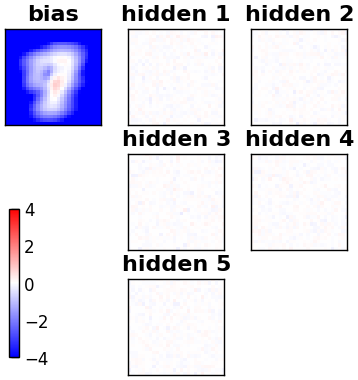

Starting the training
[ 6411 16597 20934 21870  9607 15006 16625 13780 13597 17823]
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
[18995  9426 19313 13259 13824  1859 11065  2795 20792 17934]
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
[   51 13301  5009  2273 18851 11514  1595 12941  4761  4094]
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
[ 9495 16122  1934 13321  8146 16943 21566 14584 19111 15375]
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam

<Figure size 800x600 with 0 Axes>

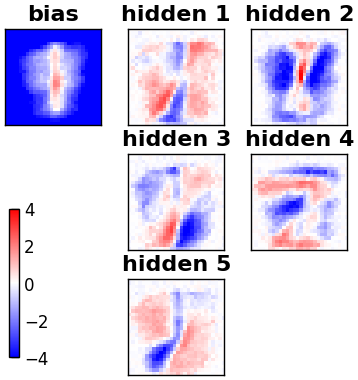

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

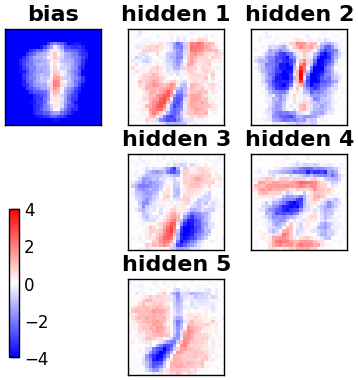

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

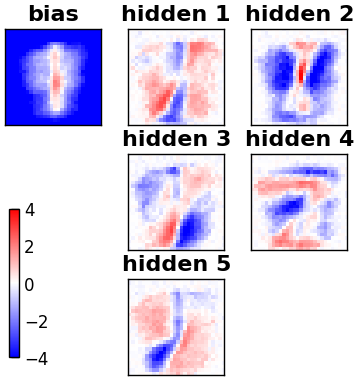

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

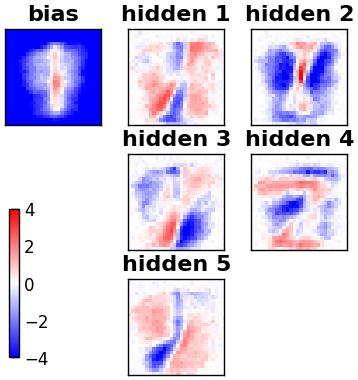

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

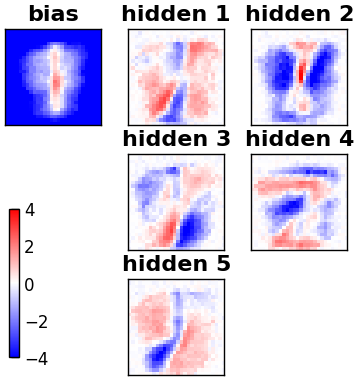

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

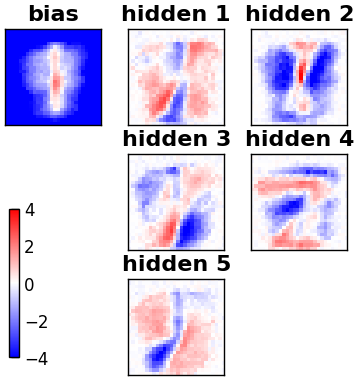

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

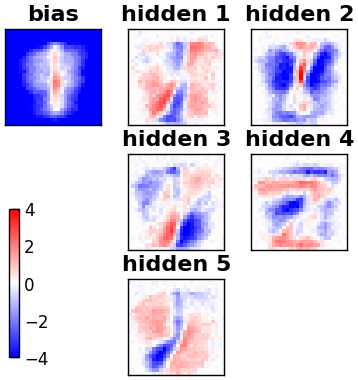

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

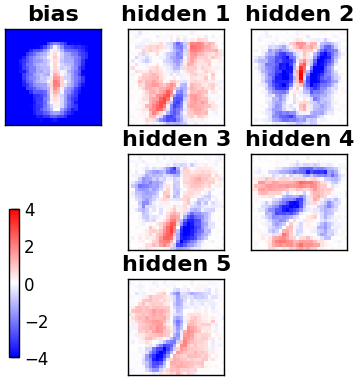

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

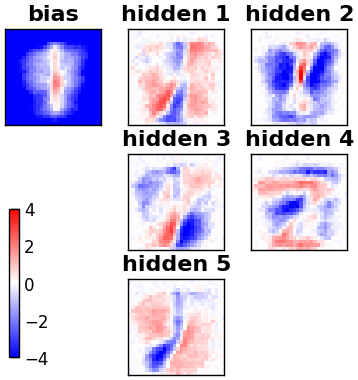

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

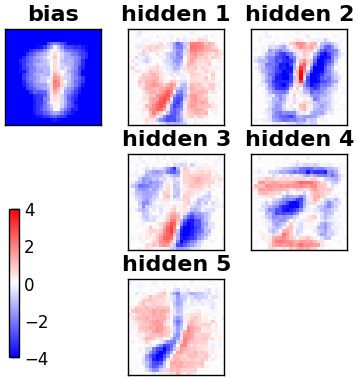

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

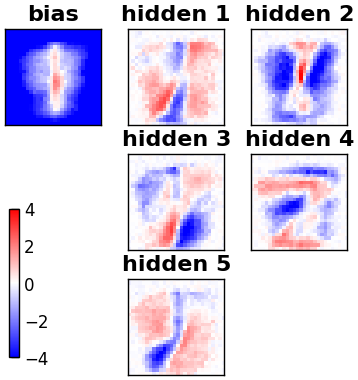

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

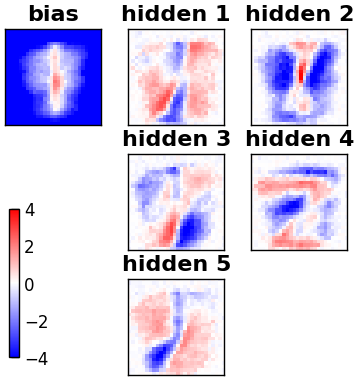

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

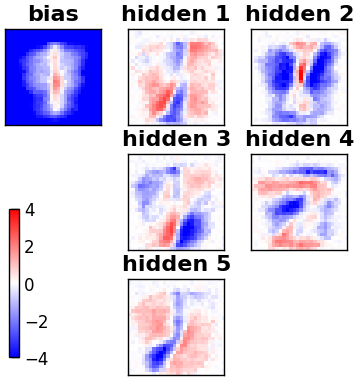

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

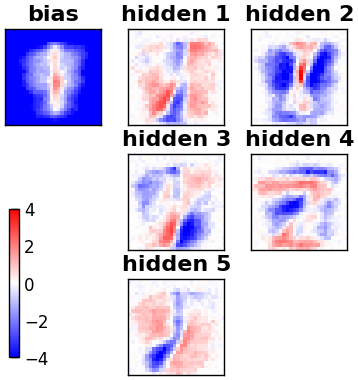

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

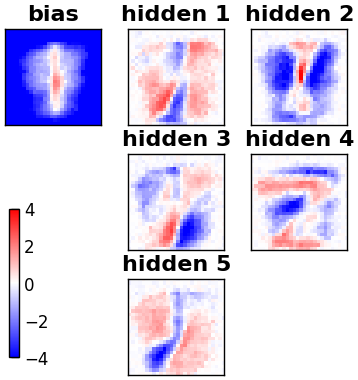

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

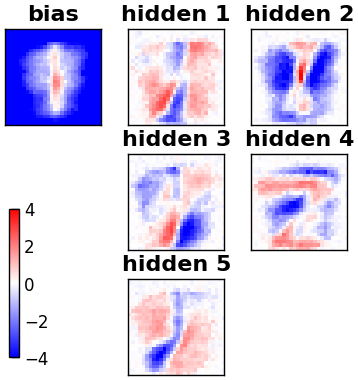

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

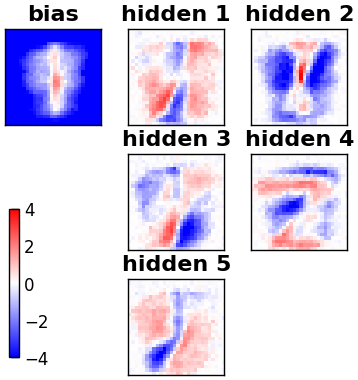

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

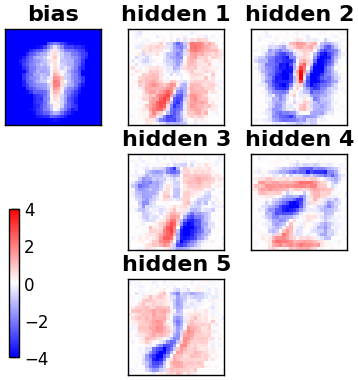

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

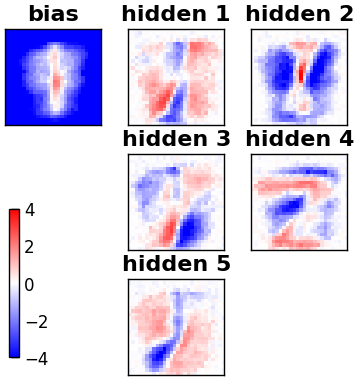

epoch 20 / 150  Nt: 4  N: 17  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

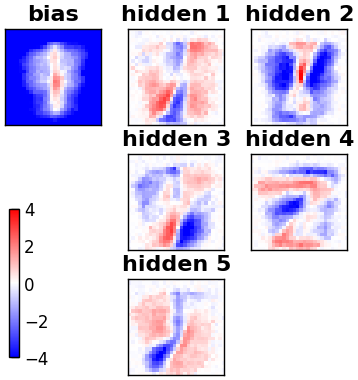

epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0

<Figure size 800x600 with 0 Axes>

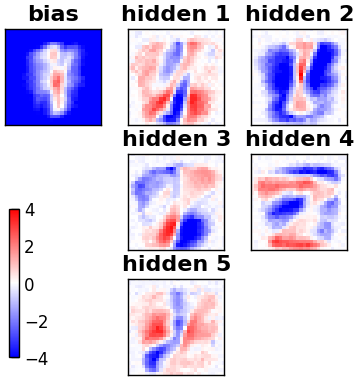

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

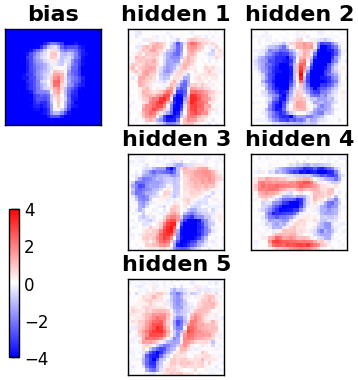

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

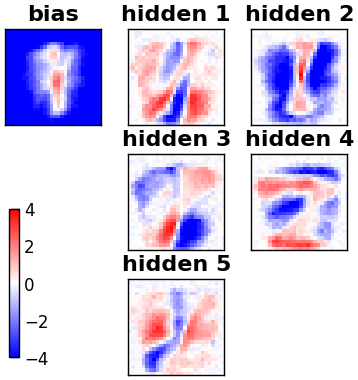

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

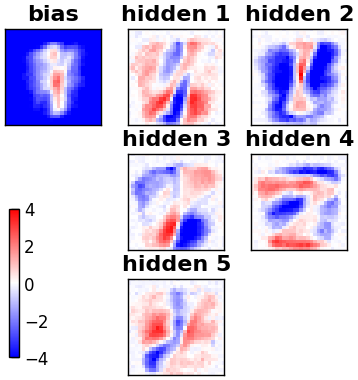

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

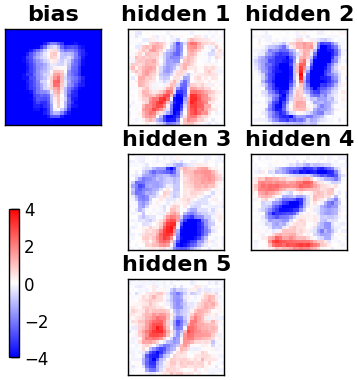

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

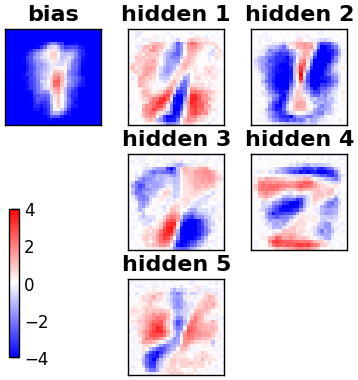

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

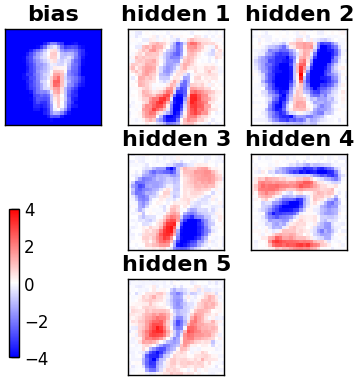

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

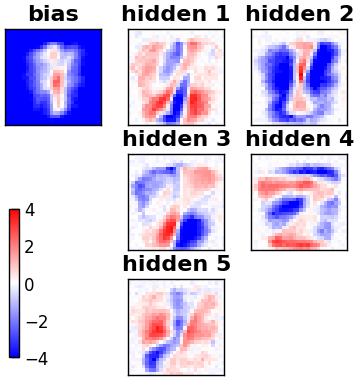

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

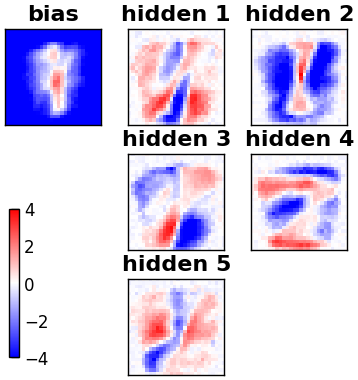

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

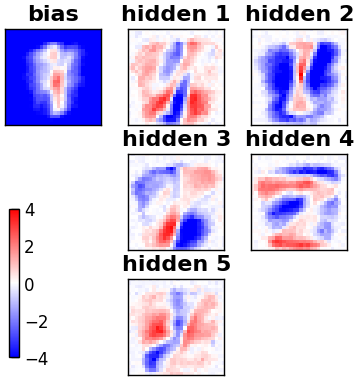

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

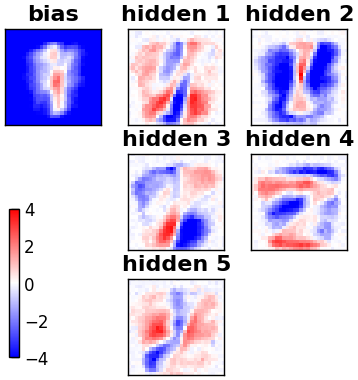

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

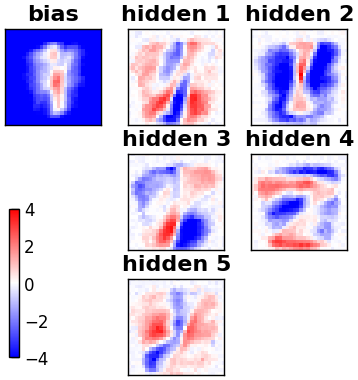

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

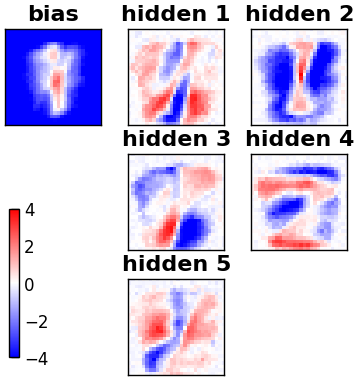

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

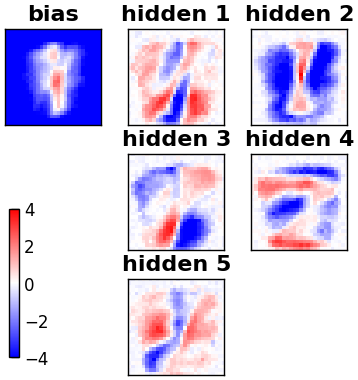

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

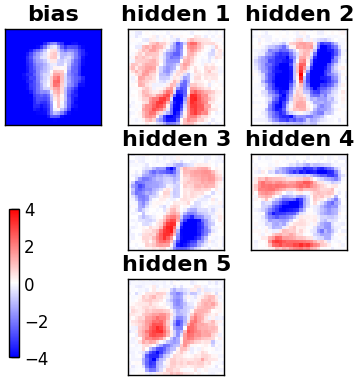

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

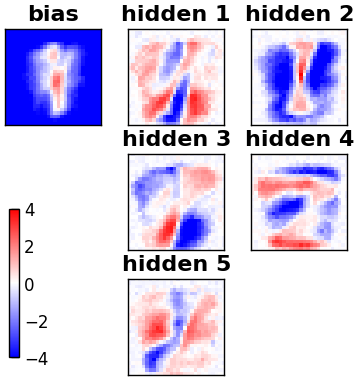

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

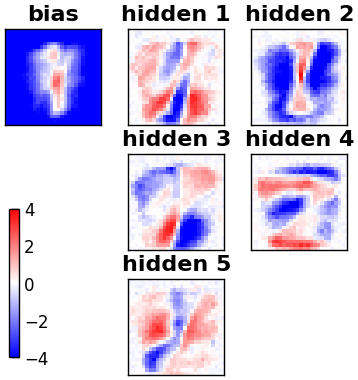

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

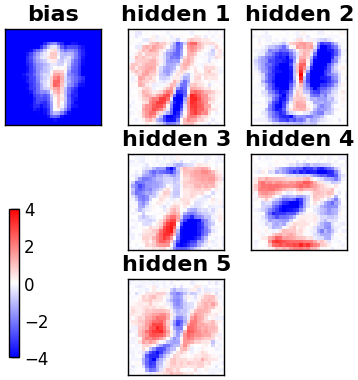

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

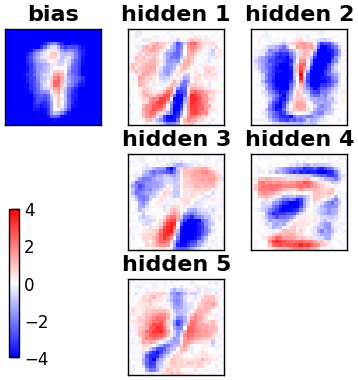

epoch 40 / 150  Nt: 4  N: 43  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

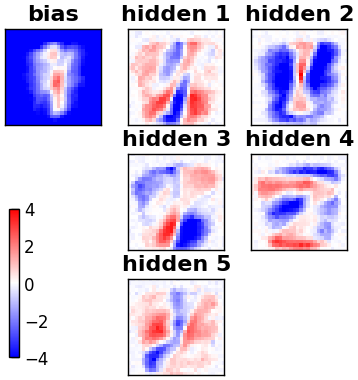

epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0

<Figure size 800x600 with 0 Axes>

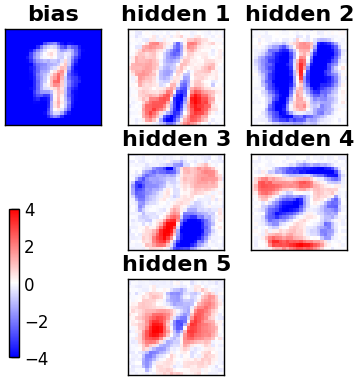

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

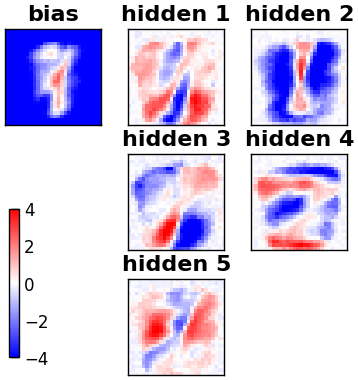

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

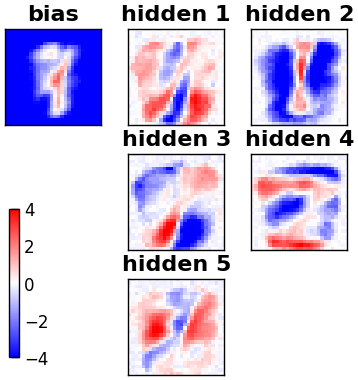

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

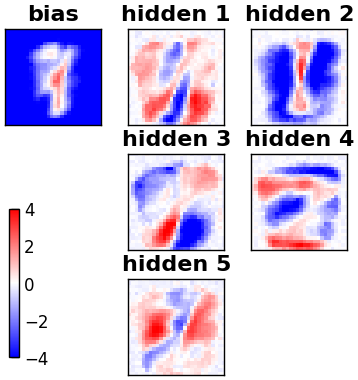

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

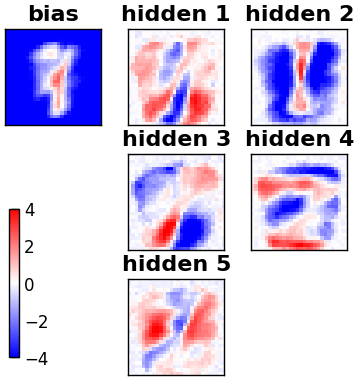

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

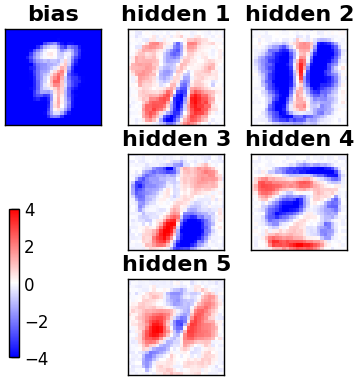

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

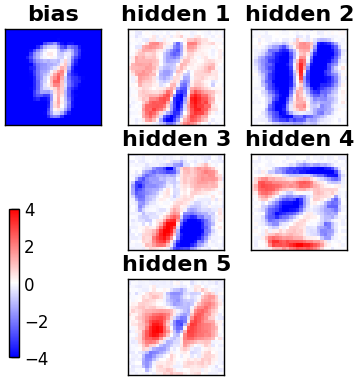

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

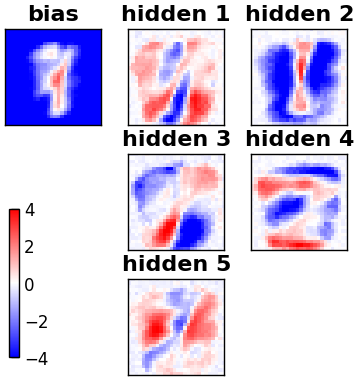

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

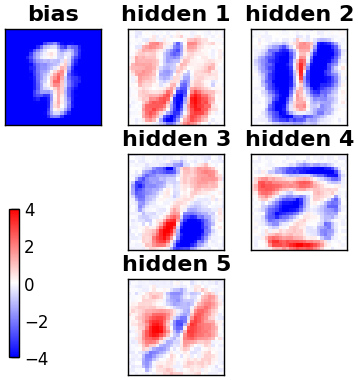

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

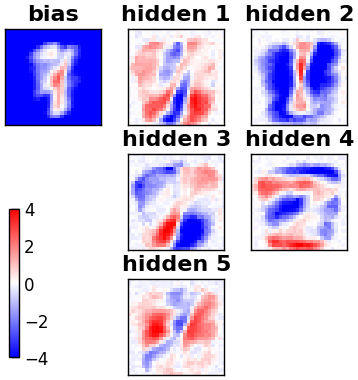

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

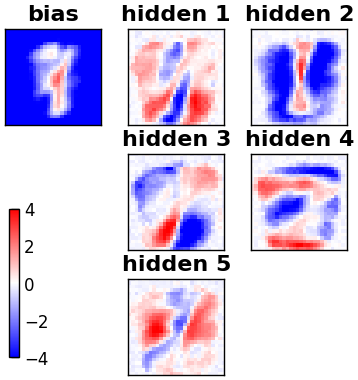

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

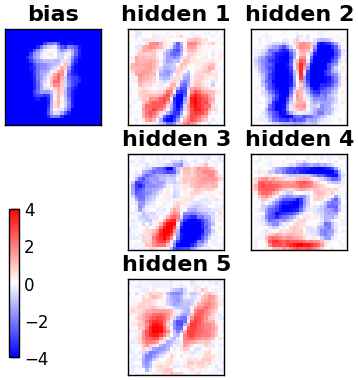

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

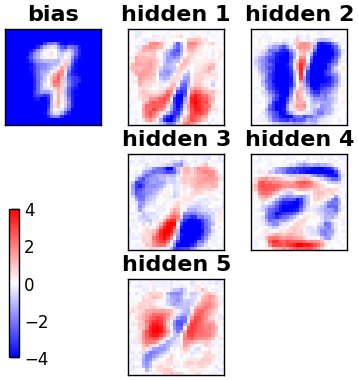

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

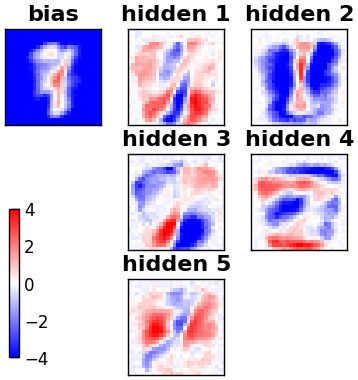

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

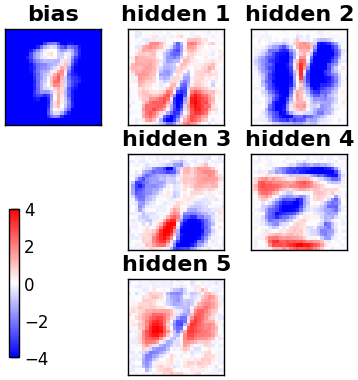

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

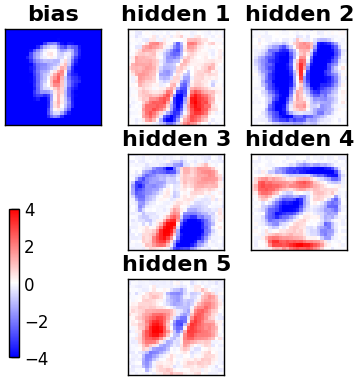

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

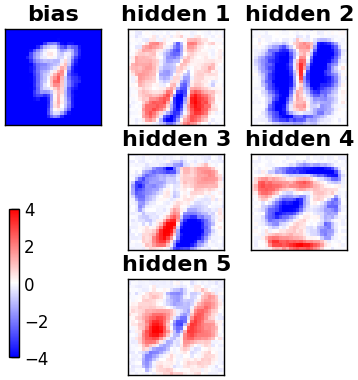

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

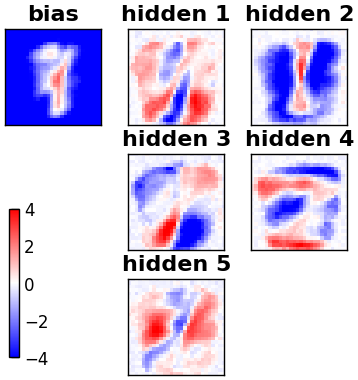

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

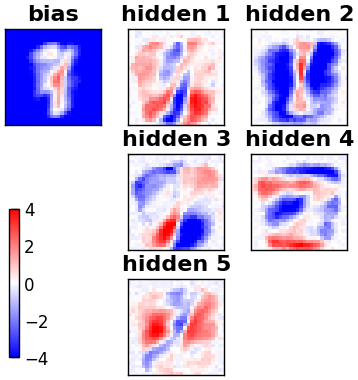

epoch 60 / 150  Nt: 4  N: 86  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

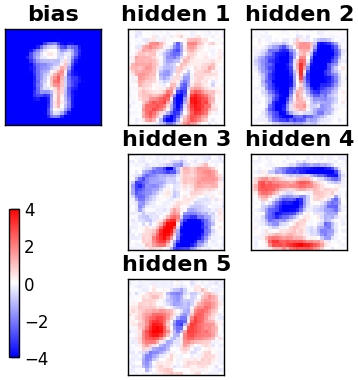

epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0

<Figure size 800x600 with 0 Axes>

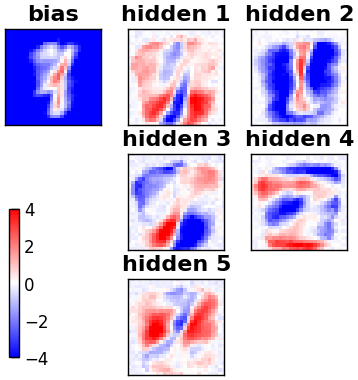

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

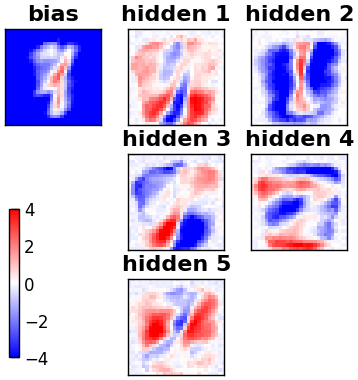

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

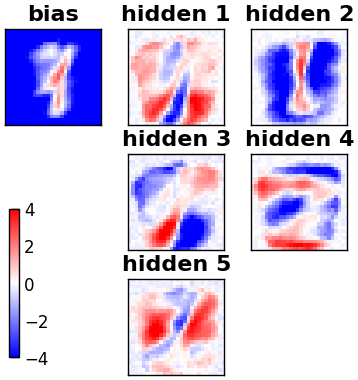

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

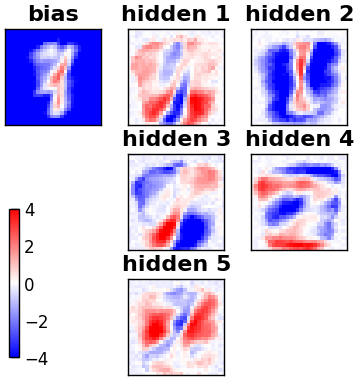

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

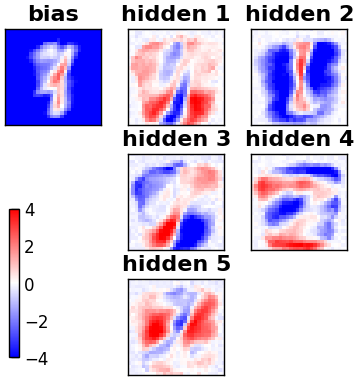

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

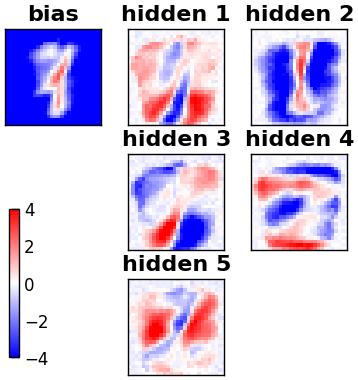

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

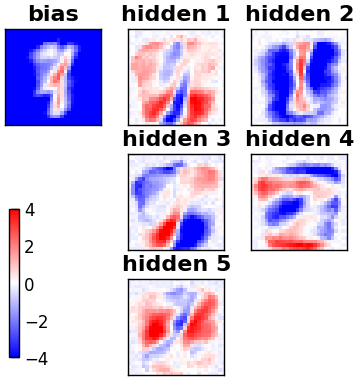

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

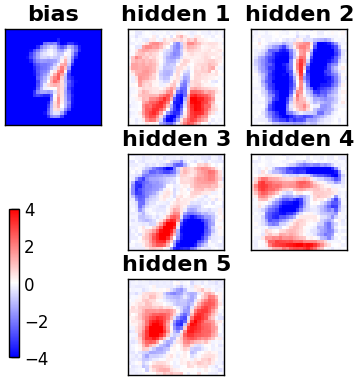

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

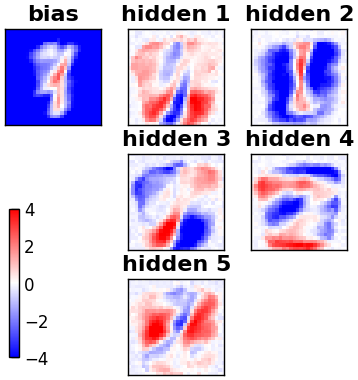

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

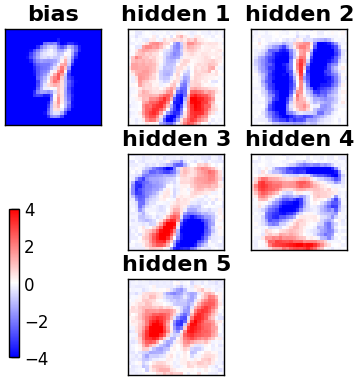

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

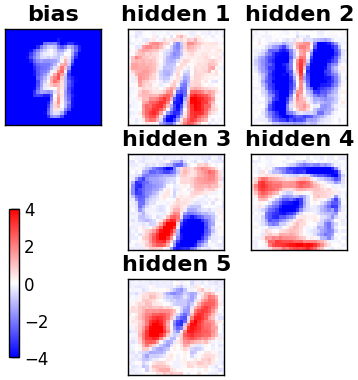

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

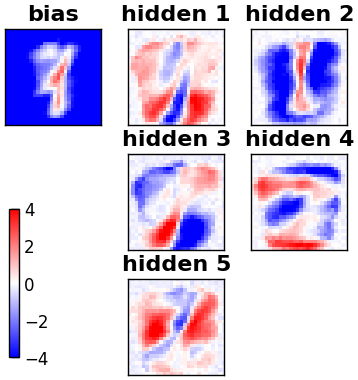

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

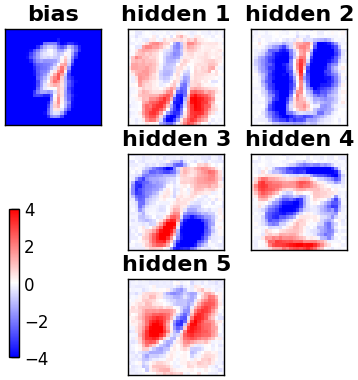

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

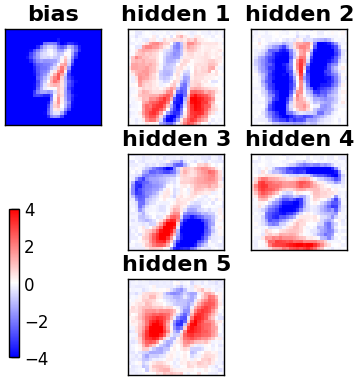

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

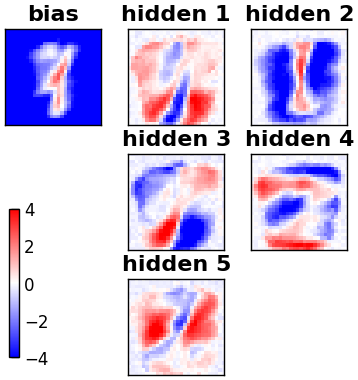

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

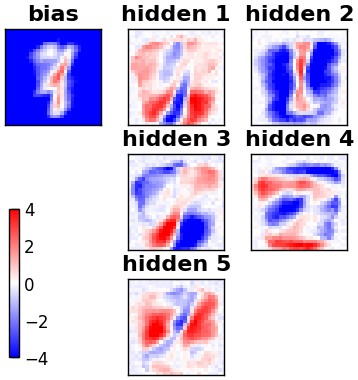

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

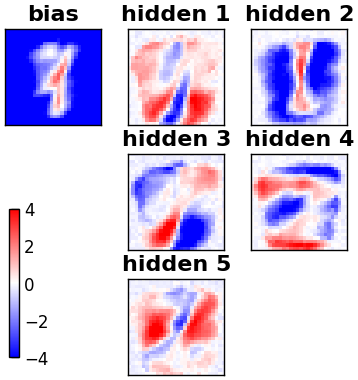

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

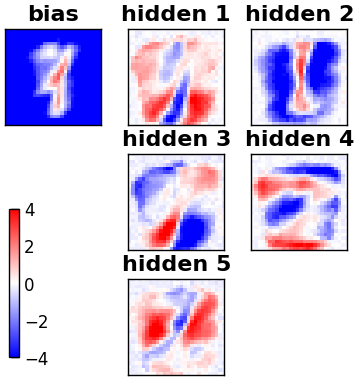

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

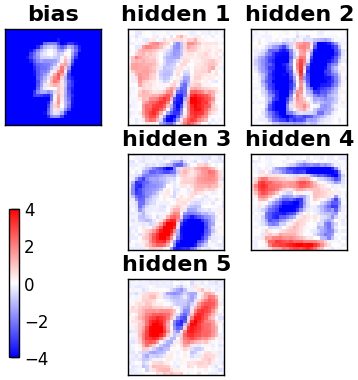

epoch 80 / 150  Nt: 4  N: 147  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

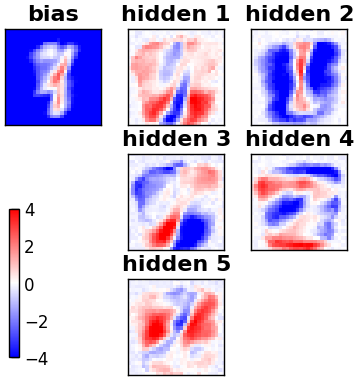

epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 

<Figure size 800x600 with 0 Axes>

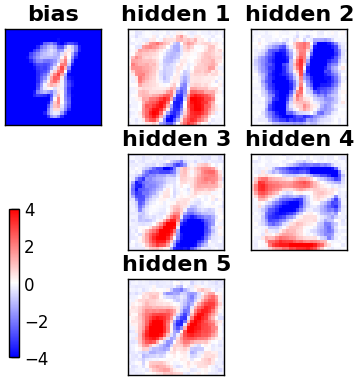

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

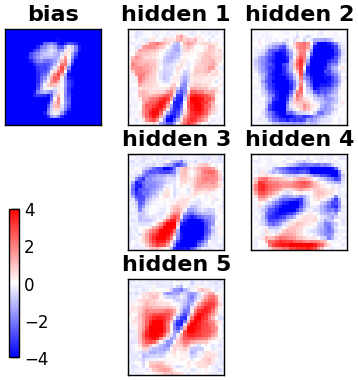

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

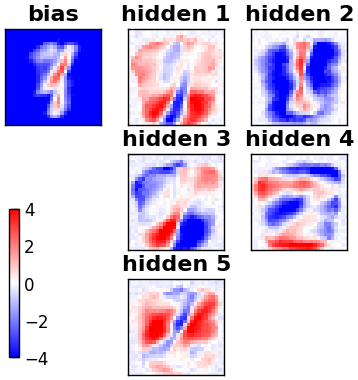

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

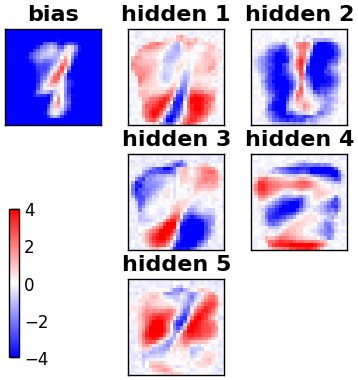

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

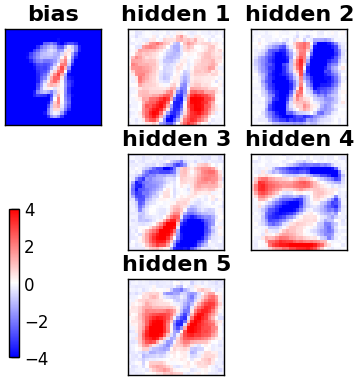

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

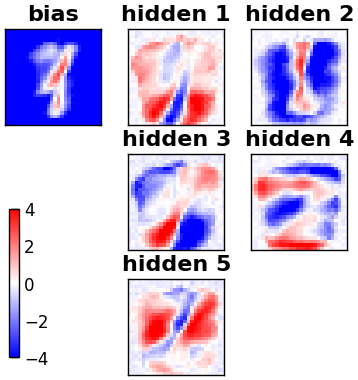

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

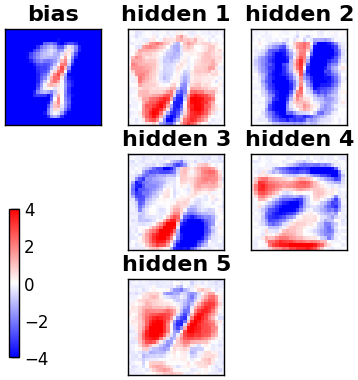

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

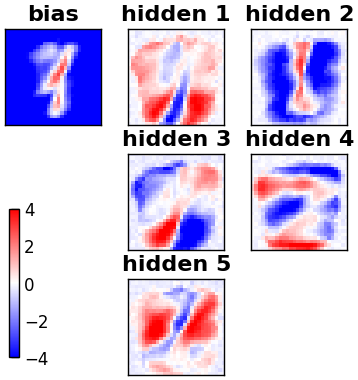

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

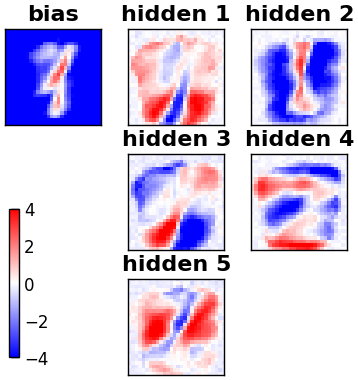

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

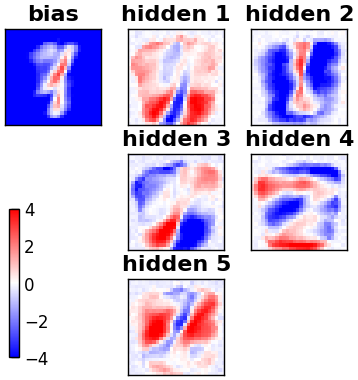

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

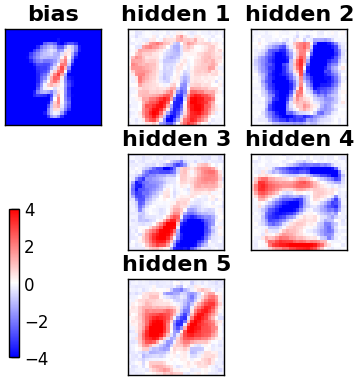

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

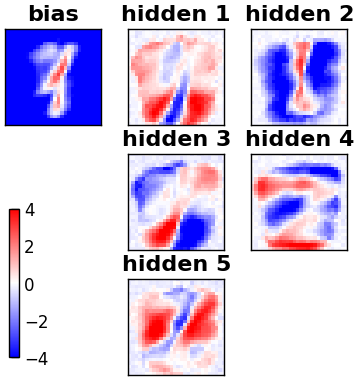

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

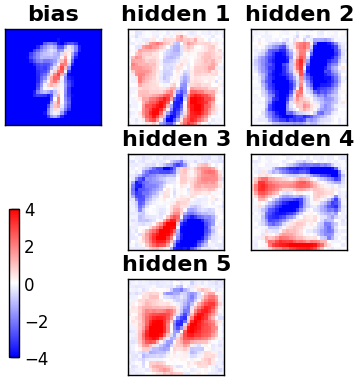

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

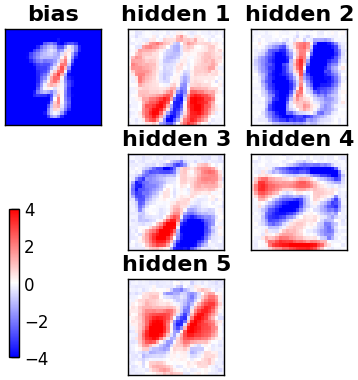

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

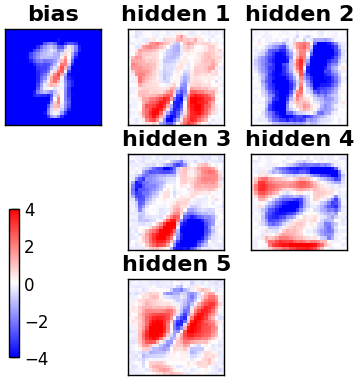

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

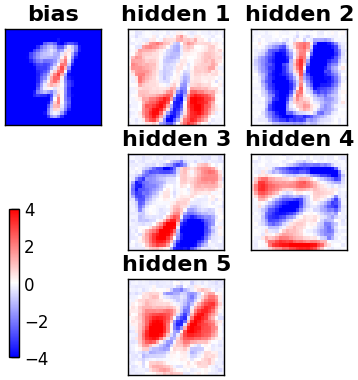

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

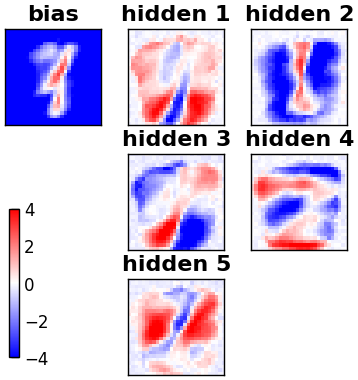

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

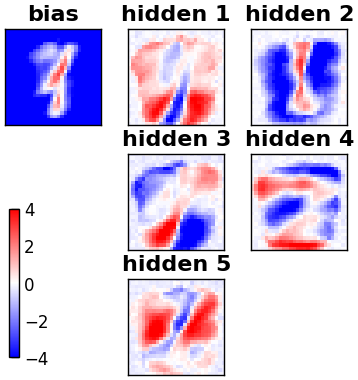

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

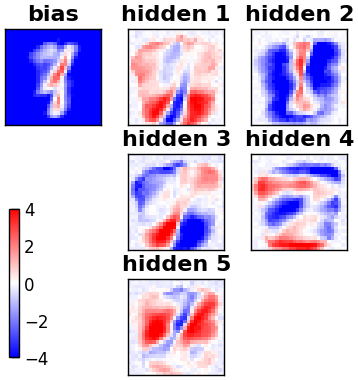

epoch 100 / 150  Nt: 4  N: 226  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False


<Figure size 800x600 with 0 Axes>

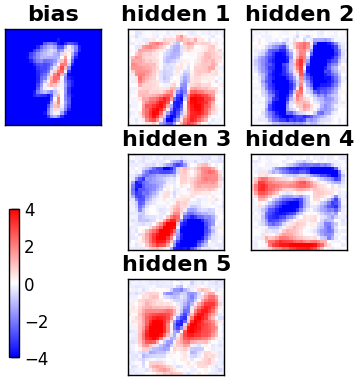

epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.0001 SPINS= False POTTS= False
epoch 101 / 150  Nt: 4  N: 230  

KeyboardInterrupt: 

In [24]:
#training for different regularization gamma, L=5, Nt=4

for gamma in gamma_v:
    if gamma>0:
        L = 5
        Nt = 4
        # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
        w = sigma * np.random.randn(D, L)
        #a = sigma * np.random.randn(D)
        # using Hinton initialization of visible biases
        a = Hinton_bias_init(data)
        # hidden biases initialized to zero
        b = np.zeros(L)
        #print("w=",w);print("a=",a);print("b=",b)

        # nr of epochs
        Nepoch = 150
        # minibatches per epoch
        Nmini = 20
        # minibatch size at initial epoch and final one
        N_ini, N_fin = 10, 500
        print(f"Nepoch={Nepoch}\nNmini={Nmini}")

        # recording history of weights ("E" means epoch)
        wE, aE, bE = np.zeros((Nepoch + 1, D, L)), np.zeros((Nepoch + 1, D)), np.zeros((Nepoch + 1, L))
        wE[0], aE[0], bE[0] = np.copy(w), np.copy(a), np.copy(b)
        gwE, gw2E, gwE_d, gwE_m = np.zeros_like(wE), np.zeros_like(wE), np.zeros_like(wE), np.zeros_like(wE)
        gaE, ga2E, gaE_d, gaE_m = np.zeros_like(aE), np.zeros_like(aE), np.zeros_like(aE), np.zeros_like(aE)
        gbE, gb2E, gbE_d, gbE_m = np.zeros_like(bE), np.zeros_like(bE), np.zeros_like(bE), np.zeros_like(bE)
        miniE = np.zeros(Nepoch + 1)
        pzE = np.zeros((Nepoch + 1, Nz))
        if GRAD == "RMSprop":
            gw2, ga2, gb2 = np.zeros_like(w), np.zeros_like(a), np.zeros_like(b)

        indices = np.arange(Nd).astype("int")
        plot_weights_bias(wE, aE, 0, L, cols=L // 2, save=False)

        # for the plot with panels
        Ncols = min(8, max(2, L // 2))

        if POTTS:
            print("Starting the training, POTTS=True")
        else:
            print("Starting the training")

        # Note: here an epoch does not analyze the whole dataset
        for epoch in range(1, 1 + Nepoch):
            # q maps epochs to interval [0,1]
            q = (epoch - 1.) / (Nepoch - 1.)
            # N, size of the mini batch
            # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
            N = int(N_ini + (N_fin - N_ini) * (q ** 2))
            # l_rate interpolates between initial and final value
            l_rate = l_rate_ini + (l_rate_fin - l_rate_ini) * q

            for mini in range(Nmini):
                # initializitation for averages in minibatch
                # visible variables "v" --> "x"
                # hidden variables "h" --> "z"
                x_data, x_model = np.zeros(D), np.zeros(D)
                z_data, z_model = np.zeros(L), np.zeros(L)
                xz_data, xz_model = np.zeros((D, L)), np.zeros((D, L))
                pz = np.zeros(L)

                # Minibatch of size N: points randomly picked (without repetition) from data
                selected = np.random.choice(indices, N, replace=False)
                if epoch == 1 and mini <= 3:
                    print(selected)

                for k in range(N):
                    ###################################
                    x0 = data[selected[k]]
                    # positive CD phase: generating z from x[k]
                    z = CD_step(x0, w, b, POTTS=POTTS)
                    x_data += x0
                    z_data += z
                    xz_data += np.outer(x0, z)
                    # fantasy
                    zf = np.copy(z)
                    # Contrastive divergence with Nt steps
                    for t in range(Nt):
                        # negative CD phase: generating fantasy xf from fantasy zf
                        xf = CD_step(zf, w.T, a)
                        # positive CD phase: generating fantasy zf from fantasy xf
                        zf = CD_step(xf, w, b, POTTS=POTTS)
                    x_model += xf
                    z_model += zf
                    xz_model += np.outer(xf, zf)
                    # recording probability of encoding in z-space, if POTTS
                    if POTTS:
                        pz[zf] += 1
                    ###################################

                # gradient of the likelihood: follow it along its positive direction
                gw_d, gw_m = xz_data / N, xz_model / N
                ga_d, ga_m = x_data / N, x_model / N
                gb_d, gb_m = z_data / N, z_model / N
                gw = np.copy(gw_d - gw_m)
                ga = np.copy(ga_d - ga_m)
                gb = np.copy(gb_d - gb_m)

                # gradient ascent step
                if GRAD == "RMSprop":
                    # RMSprop gradient ascent
                    gw2 = beta * gw2 + (1 - beta) * np.square(gw)
                    ga2 = beta * ga2 + (1 - beta) * np.square(ga)
                    gb2 = beta * gb2 + (1 - beta) * np.square(gb)
                    w += l_rate * gw / sqrt(epsilon + gw2)
                    a += l_rate * ga / sqrt(epsilon + ga2)
                    b += l_rate * gb / sqrt(epsilon + gb2)
                else:
                    # defaulting to the vanilla stochastic gradient ascent (SGD)
                    w += l_rate * gw
                    a += l_rate * ga
                    b += l_rate * gb
                # regularization (LASSO)
                if gamma > 0.:
                    w -= (gamma * l_rate) * sign(w)
                    a -= (gamma * l_rate) * sign(a)
                    b -= (gamma * l_rate) * sign(b)

                wE[epoch], gwE[epoch], gwE_d[epoch], gwE_m[epoch] = np.copy(w), np.copy(gw), np.copy(gw_d), np.copy(gw_m)
                aE[epoch], gaE[epoch], gaE_d[epoch], gaE_m[epoch] = np.copy(a), np.copy(ga), np.copy(ga_d), np.copy(ga_m)
                bE[epoch], gbE[epoch], gbE_d[epoch], gbE_m[epoch] = np.copy(b), np.copy(gb), np.copy(gb_d), np.copy(gb_m)
                miniE[epoch] = N
                if POTTS:
                    pzE[epoch] = pz / np.sum(pz)
                print("epoch", epoch, "/", Nepoch, " Nt:", Nt, " N:", N, " L:", L,
                    " rate:", l_rate, " gam:", gamma, "SPINS=", SPINS, "POTTS=", POTTS)

                if Nepoch <= 100 or epoch % 20 == 0 or epoch == Nepoch:
                    plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)

                str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")
                save_epochs(wE, "w")
                save_epochs(bE, "b")
                save_epochs(aE, "a")

        print("END of learning phase")

In [45]:
log_like_gamma=[]
log_like_gamma_std=[]
Nepoch=150
num_epo=np.arange(Nepoch-5,Nepoch,1) # consider trend over the last 5 iterations

for gamma in gamma_v:
  if gamma>0.:
    L=5
    Nt=4
    a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg{gamma}.npy", allow_pickle=True)
    print(f'a_all gamma={gamma}, L={L}, Nt={Nt}')
    b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg{gamma}.npy", allow_pickle=True)
    print(f'b_all gamma={gamma}, L={L}, Nt={Nt}')
    w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep150_reg{gamma}.npy", allow_pickle=True)
    print(f'w_all gamma={gamma}, L={L}, Nt={Nt}') ## matrice visible*hidden per epoch

    log_like_g=[]
    log_like_g_std=[]
    Nepoch=150
    for i in range(Nepoch-5,Nepoch,1):
        print(f'Epoch n.{i}')
        ll_iter=[]
        mean=[]
        for iter in range(5): # to determine the loglike at each epoch we run the calculation 5 times and compute the average, to reduce randomness
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            ll_iter.append(ll)
        ll_mean= np.array(ll_iter).mean()
        ll_std= np.array(ll_iter).std()
        log_like_g.append(ll_mean)
        log_like_g_std.append(ll_std)
        print('Log-likelihood=',ll_mean,"+-",ll_std)
    log_like_gamma.append(log_like_g)
    log_like_gamma_std.append(log_like_g_std)


a_all L=5, Nt=4
b_all L=5, Nt=4
w_all L=5, Nt=4
Epoch n.145


Computing log-likelihood: 100%|██████████| 5498/5498 [00:20<00:00, 274.30it/s]


Log-likelihood= -127.24936264327123 +- 0.09868374070078725
Epoch n.146


Computing log-likelihood: 100%|██████████| 5498/5498 [00:18<00:00, 289.84it/s]


Log-likelihood= -125.48560986222321 +- 0.39617839366682694
Epoch n.147


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 285.79it/s]


Log-likelihood= -125.56843316209658 +- 0.6485767332868067
Epoch n.148


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 274.95it/s]


Log-likelihood= -126.39556656076766 +- 0.33898509978117325
Epoch n.149


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 275.02it/s]


Log-likelihood= -123.94252645370557 +- 0.2938311468828203
a_all L=5, Nt=4
b_all L=5, Nt=4
w_all L=5, Nt=4
Epoch n.145


Computing log-likelihood: 100%|██████████| 5498/5498 [00:18<00:00, 290.13it/s]


Log-likelihood= -126.72476994924375 +- 0.3505401132270048
Epoch n.146


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 286.81it/s]


Log-likelihood= -124.40563102266633 +- 0.5328862241434911
Epoch n.147


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 279.15it/s]


Log-likelihood= -123.72866452859 +- 0.2972349430252236
Epoch n.148


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 278.05it/s]


Log-likelihood= -125.87915395843947 +- 0.653735542159499
Epoch n.149


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 278.78it/s]


Log-likelihood= -125.22376629258126 +- 0.44020738848745683
a_all L=5, Nt=4
b_all L=5, Nt=4
w_all L=5, Nt=4
Epoch n.145


Computing log-likelihood: 100%|██████████| 5498/5498 [00:18<00:00, 290.66it/s]


Log-likelihood= -124.01324762304156 +- 0.6988188686443131
Epoch n.146


Computing log-likelihood: 100%|██████████| 5498/5498 [00:18<00:00, 291.09it/s]


Log-likelihood= -122.89829156322526 +- 0.39900742915502585
Epoch n.147


Computing log-likelihood: 100%|██████████| 5498/5498 [00:18<00:00, 290.81it/s]


Log-likelihood= -123.82261531115947 +- 0.5694427577354926
Epoch n.148


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 278.20it/s]


Log-likelihood= -124.02969839974651 +- 0.7031704100238827
Epoch n.149


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 277.88it/s]


Log-likelihood= -123.67887959517209 +- 0.3788611044094232
a_all L=5, Nt=4
b_all L=5, Nt=4
w_all L=5, Nt=4
Epoch n.145


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 279.04it/s]


Log-likelihood= -127.33794499632832 +- 0.43345310910550594
Epoch n.146


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 280.92it/s]


Log-likelihood= -127.02620649819498 +- 0.44587762480186455
Epoch n.147


Computing log-likelihood: 100%|██████████| 5498/5498 [00:18<00:00, 291.57it/s]


Log-likelihood= -126.82888105086695 +- 0.11149532781481647
Epoch n.148


Computing log-likelihood: 100%|██████████| 5498/5498 [00:18<00:00, 291.78it/s]


Log-likelihood= -129.48453970010192 +- 0.4457653442159149
Epoch n.149


Computing log-likelihood: 100%|██████████| 5498/5498 [00:19<00:00, 281.74it/s]

Log-likelihood= -127.12897024309113 +- 0.4447652683135306


In [13]:

log_like_gamma = [
    [-127.24936264327123, -125.48560986222321, -125.56843316209658, -126.39556656076766, -123.94252645370557],  # Case 1
    [-126.72476994924375, -124.40563102266633, -123.72866452859, -125.87915395843947, -125.22376629258126],  # Case 2
    [-124.01324762304156, -122.89829156322526, -123.82261531115947, -124.02969839974651, -123.67887959517209],  # Case 3
    [-127.33794499632832, -127.02620649819498, -126.82888105086695, -129.48453970010192, -127.12897024309113],  # Case 4
    [-138.47331831474386, -138.1203701712743, -137.71334920388665, -138.20494530508435, -138.7838087707658]  # Case 5 
]

log_like_gamma_std = [
    [0.09868374070078725, 0.39617839366682694, 0.6485767332868067, 0.33898509978117325, 0.2938311468828203],  # Case 1
    [0.3505401132270048, 0.5328862241434911, 0.2972349430252236, 0.653735542159499, 0.44020738848745683],  # Case 2
    [0.6988188686443131, 0.39900742915502585, 0.5694427577354926, 0.7031704100238827, 0.3788611044094232],  # Case 3
    [0.43345310910550594, 0.44587762480186455, 0.11149532781481647, 0.4457653442159149, 0.4447652683135306],  # Case 4
    [0.4011070862112876, 0.561959628581091, 0.5458788509620577, 0.676651791500994, 0.549637774447985]  # Case 5 
]



# 4 runs with gamma= 10^-4
loglike_g_minus_4 = [
    [-130.1872847533926, -130.0057439346899, -129.15508246912506, -132.11528248561075, -128.07477421809102,
     -127.97773175750774, -128.3541626147086, -126.94924201280885, -130.2271564561087],  # Run 1
    [-125.57497639238196, -125.6111395683151, -127.45216357264466, -124.70185995233608, -125.61793205662858,
     -125.93113217855057, -124.82970746001732, -123.4151897736014, -124.71988786918027],  # Run 2
    [-121.46669090040386, -121.03496592478136, -122.80957004397155, -120.33239275454177, -121.75633594433343,
     -122.96256949141693, -123.30562665472942, -123.30562665472942, -124.71988786918027],  # Run 3
    [-121.46669090040386, -121.03496592478136, -122.80957004397155, -120.33239275454177, -121.75633594433343,
     -122.96256949141693, -123.30562665472942, -123.4151897736014, -124.71988786918027]   # Run 4
]


loglike_g_minus_4_std  = [
    [0.6951197230962922, 0.7813006130421714, 0.7001854035193555, 0.6466763439594219, 0.3534460451594617,
     0.9933581944392872, 0.4831525259746367, 0.9193840030485159, 0.5155569423538817],  # Run 1
    [0.5864599549805283, 0.6810450706332066, 0.4052047619133087, 0.49369880640501373, 0.15613005281606313,
     0.5409679965884552, 0.4049110418725848, 0.5083698162521105, 0.2199794432668324],  # Run 2
    [0.35154723514397257, 0.5145663677711686, 0.5424137660346314, 0.6680993986756899, 0.44947171294245,
     0.7299700632045026, 0.3357335671658626, 0.5409679965884552, 0.2155569423538817],  # Run 3
    [0.5864599549805283, 0.6810450706332066, 0.5424137660346314, 0.6680993986756899, 0.44947171294245,
     0.7299700632045026, 0.4049110418725848, 0.5083698162521105, 0.2199794432668324]   # Run 4
]
# 4 runs with gamma= 10^-2
loglike_g_minus_2 = [
    [-125.85154879296297, -124.44122769837045, -124.28427932378015, -124.18165585940615, -125.09481147201537, -126.16101989148645, -125.00854925745364, -126.05435485895728, -125.21972224383414],
    [-122.62542868850706, -124.11451628857876, -123.4843271568224, -124.05372296089436, -122.24597827652887, -122.66494649854273, -121.54523041943976, -123.72011996090623, -123.73760561887545],
    [-124.7655880833436, -122.74710598917648, -123.8646751686124, -124.05642801439835, -121.97401716746455, -124.18396713550078, -122.79665156370405, -122.73799131505945, -122.33172406148574],
    [-122.16802321449525, -122.18275345637025, -122.34678847252223, -122.58048158180373, -122.35720236152946, -122.4376982515468, -122.30154229815756, -122.45636932359998, -122.33246217650266]
]
loglike_g_minus_2_std = [
    [0.5399704316488174, 0.7661178035581507, 0.6524193432981173, 0.5001648365369342, 0.6148409808424062, 0.7062310904431229, 0.5544875810932012, 0.5035449407437159, 0.5227257940815508],
    [0.7517496006752543, 0.3614748135426356, 0.46876953246891456, 0.55458226120476, 0.4857151296653672, 0.5245671740910623, 0.7015393284983075, 0.3071353970162202, 0.5487949340152654],
    [0.3361339638033289, 0.7788064620820748, 0.5115530550282861, 0.6356929635160161, 0.4777822473371769, 0.5615255279576584, 0.43334187750762976, 0.4586941034599634, 0.4005135372429275],
    [0.34476793642229265, 0.3195690423805653, 0.3021332770611088, 0.3273839015408619, 0.3198197422045928, 0.354306575758081, 0.4190101837894065, 0.3724908985141893, 0.407053960109875]
]
# 4 runs with gamma= 10^-1
loglike_g_minus_1 = [
    [-129.6028342269968, -127.86745258043295, -129.43256237260954, -125.5260214920452, -126.77443579509095, 
     -125.60885925644587, -128.69490662941874, -128.28817070679918, -125.20775786779618],
    [-125.09688198733663, -125.02695339909194, -125.39033051939484, -125.57933941713137, -124.64822178476656, 
     -127.03609541721862, -125.92093918355158, -125.66797265562721, -124.4299341422005],
    [-123.81031304930018, -125.46968333716445, -123.06769873539167, -123.46465835015317, -125.16956880190067, 
     -123.9542697829946, -124.7875714465167, -125.33109800321553, -123.8840498035794],
    [-125.35235629524212, -124.72626490556299, -125.47869230289616, -124.91653014842644, -125.19632014233452, 
     -125.34141020124547, -125.0150737127025, -124.43157628608026, -125.40071701578502]
]


loglike_g_minus_1_std = [
    [0.28688076375363336, 0.40705363636178227, 0.6099881848763191, 0.8855156496365608, 0.5629115124673895, 
     0.8358428679140916, 0.39603641366188225, 0.8158554240427398, 0.5392183263902174],
    [0.3285135815901287, 0.5135891681678741, 0.48946936488726617, 0.7156516213821195, 0.4520707632388831, 
     0.1399681422750061, 0.14713891045275967, 0.44300323778207107, 0.4885830658419441],
    [0.30964768639212026, 0.3347998256538272, 0.6243698931657257, 0.859109941647022, 0.7006040939228179, 
     0.24296612757820243, 0.7451124236452635, 0.7615813124456547, 0.8296715943204048],
    [0.4729249388776263, 0.6899265125829144, 0.6619700516742839, 0.4712269263913958, 0.6734311700857425, 
     0.5291901834595914, 0.47775960283450393, 0.7239925482110215, 0.3892455182121686]
]

# 4 runs with gamma= 0.5
loglike_g_minus_0_5 = [
    [-139.520, -139.349, -139.813, -139.723, -139.751, -139.251, -138.334, -138.900, -139.818],  # run 1
    [-136.629, -137.957, -135.997, -136.822, -136.558, -137.231, -136.905, -136.210, -135.948],  # run 2
    [-141.814, -140.407, -140.857, -141.227, -140.863, -140.872, -141.338, -141.338, -141.338],  # run 3
    [-139.520, -139.349, -139.813, -139.723, -139.751, -139.251, -138.334, -138.900, -139.818]   # run 4
]


loglike_g_minus_0_5_std = [
    [0.371, 0.317, 0.732, 0.282, 0.478, 0.152, 0.384, 0.170, 0.417],  # run 1
    [0.094, 0.079, 0.257, 0.521, 0.365, 0.508, 0.522, 0.305, 0.552],  # run 2
    [0.305, 0.286, 0.425, 0.647, 0.505, 0.635, 0.189, 0.189, 0.189],  # run 3
    [0.371, 0.317, 0.732, 0.282, 0.478, 0.152, 0.384, 0.170, 0.417]   # run 4
]
# gamma=10^-3 with previous L=5,CD=4


In [115]:
## mean and standard deviation over multiple runs- different gammas
# FIRST POSSIBILITY: WITH MULTIPLE RUNS FOR GAMMA
runs_gamma_4=[]
runs_gamma_3=[]
runs_gamma_2=[]
runs_gamma_1=[]
runs_gamma_0_5=[]

loglike_G=[] # store mean loglikelihoods for each gamma
loglike_G_std=[]

#gamma=10^-4
for i, log_like in enumerate(loglike_g_minus_4):
    weights = 1 / np.array(loglike_g_minus_4_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods over the epochs
    runs_gamma_4.append(weighted_avg)
error_gamma_4= np.array(runs_gamma_4).std()/(4)**0.5 ## error to associate to the mean loglikelihoods of L=3 runs 
mean_gamma_4= np.array(runs_gamma_4).mean() # mean over 5 runs of loglikelihooods for L=3
loglike_G.append(mean_gamma_4)
loglike_G_std.append(error_gamma_4)

## gamma=10^-3
for i, log_like in enumerate(log_like_5): # perviously found in study for variable L
    weights = 1 / np.array(log_like_5_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods over the epochs
    runs_gamma_3.append(weighted_avg)
error_gamma_3= np.array(runs_gamma_3).std()/(4)**0.5
mean_gamma_3= np.array(runs_gamma_3).mean()
loglike_G.append(mean_gamma_3)
loglike_G_std.append(error_gamma_3)

for i, log_like in enumerate(loglike_g_minus_2):
    weights = 1 / np.array(loglike_g_minus_2_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods over the epochs
    runs_gamma_2.append(weighted_avg)
error_gamma_2= np.array(runs_gamma_2).std()/(4)**0.5      
mean_gamma_2= np.array(runs_gamma_2).mean()
loglike_G.append(mean_gamma_2)
loglike_G_std.append(error_gamma_2)

for i, log_like in enumerate(loglike_g_minus_1):
    weights = 1 / np.array(loglike_g_minus_1_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods over the epochs
    runs_gamma_1.append(weighted_avg)
error_gamma_1= np.array(runs_gamma_1).std()/(4)**0.5      
mean_gamma_1= np.array(runs_gamma_1).mean()
loglike_G.append(mean_gamma_1)
loglike_G_std.append(error_gamma_1)

for i, log_like in enumerate(loglike_g_minus_0_5):
    weights = 1 / np.array(loglike_g_minus_0_5_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods over the epochs
    runs_gamma_0_5.append(weighted_avg)
error_gamma_0_5= np.array(runs_gamma_0_5).std()/(4)**0.5      
mean_gamma_0_5= np.array(runs_gamma_0_5).mean()
loglike_G.append(mean_gamma_0_5)
loglike_G_std.append(error_gamma_0_5)


print('Mean values for different L',loglike_G)
print('Standard deviation for different L',loglike_G_std)

Mean values for different L [-125.24180625185983, -122.92896863348622, -123.56445787601257, -125.94317032276071, -139.2358259136862]
Standard deviation for different L [1.1967070607299788, 0.927006724878382, 0.5079021111066224, 0.7285059425267408, 0.7046201213530242]


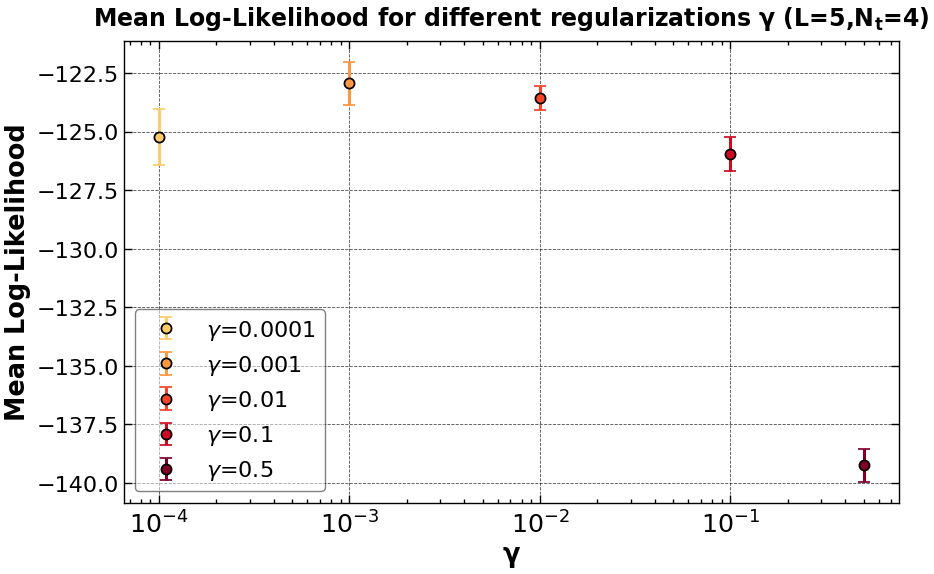

In [120]:
# FIRST POSSIBILITY: WITH MULTIPLE RUNS FOR EACH GAMMA...10^-3 VIENE MEGLIO!!
colors = plt.cm.YlOrRd(np.linspace(0.29, 1, len(log_like_gamma)))
fig,ax1 = plt.subplots(1,1,figsize=(10,6))
for i, log_like in enumerate(loglike_G):
    
    ax1.errorbar(gamma_v[i],log_like,yerr=loglike_G_std[i],fmt='o',color=colors[i],label=f'$\gamma$={gamma_v[i]}',linewidth=2.2, markersize=7.3,capsize=4.3, capthick=1.1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.25)
    

ax1.set_xlabel('$\mathbf{\gamma}$', fontsize=18.4, fontweight='bold')
ax1.set_ylabel('Mean Log-Likelihood', fontsize=18.4, fontweight='bold')
ax1.set_title('Mean Log-Likelihood for different regularizations ' r'$\mathbf{\gamma}$ (L=5,$\mathbf{N_t}$=4)', fontsize=17, fontweight='bold',pad=11.)
ax1.set_xticks(gamma_v)
ax1.set_xscale('log')
ax1.tick_params(axis='x', labelsize=18.2,pad=5.5)
ax1.tick_params(axis='y', labelsize=18,which='minor',length=0)

#ax2.set_xticklabels([f'{tick:.1e}' for tick in gamma_v])
ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax1.legend(fontsize=16., loc='best', frameon=True, edgecolor='black',framealpha=0.5)
file_path = 'GRAPHS/log_like_gammas_plot.png'  # Path where you want to save the figure
fig.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution
plt.show()

We can spot a clear parabolic trend with a peak around $\gamma = 10^{-3}$, which appears to be the preferable choice, even though the results obtained for $\gamma = 10^{-2}$ are still compatible within the error associated.

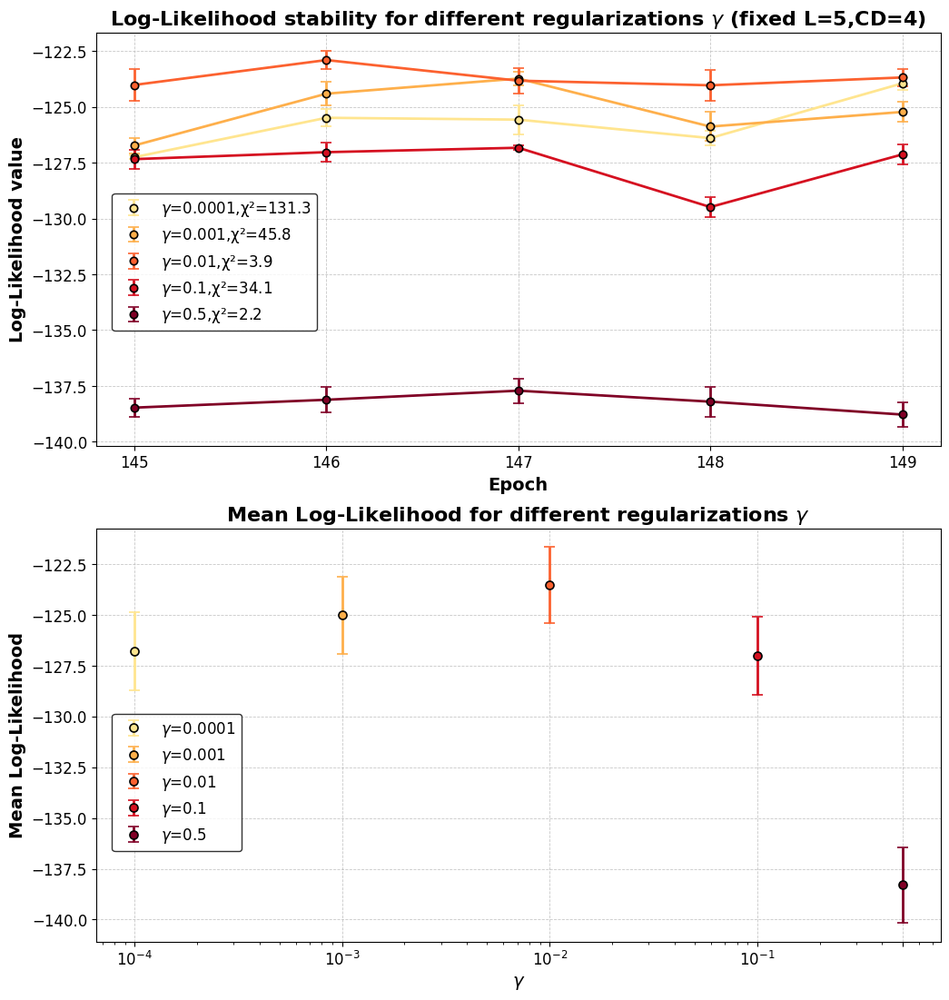

In [149]:
# variable gamma steps, fixed L=5 and CD steps=4
# SECOND POSSIBILITY: SINGLE FOR EACH GAMMA, QUI 10^-2 VIENE MEGLIIO

colors = plt.cm.YlOrRd(np.linspace(0.178, 1, len(log_like_gamma)))
Nepoch=150
num_epo=np.arange(Nepoch-5,Nepoch,1)

fig, (ax1,ax2) = plt.subplots(2,1,figsize=(12,13))

for i, log_like in enumerate(log_like_gamma):
    weights = 1 / np.array(log_like_gamma_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods of last 10 epochs
    weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
    chi = np.sum(((log_like - weighted_avg*np.ones(5))/log_like_gamma_std[i]) ** 2)
    
    ax1.errorbar(num_epo,log_like,yerr=log_like_gamma_std[i],fmt='o',color=colors[i],label=f'$\gamma$={gamma_v[i]},χ²={round(chi,1)}',linewidth=2, markersize=6,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax1.plot(num_epo, log_like, color=colors[i], linewidth=2)

    ax2.errorbar(gamma_v[i],weighted_avg,yerr=( (np.array(log_like).std()/(5)**0.5)**2+(error_5)**2)**0.5,fmt='o',color=colors[i],label=f'$\gamma$={gamma_v[i]}',linewidth=2,markersize=6.5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black',markeredgewidth=1.2 )
    ax2.set_xscale('log')
   

ax1.set_xlabel('Epoch', fontsize=14, fontweight='bold')
ax1.set_ylabel('Log-Likelihood value', fontsize=14, fontweight='bold')
ax1.set_title('Log-Likelihood stability for different regularizations $\gamma$ (fixed L=5,CD=4)', fontsize=16, fontweight='bold')
ax1.set_xticks(num_epo)
ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax1.legend(fontsize=12, loc='center left', frameon=True, bbox_to_anchor=(0.01, 0.444), edgecolor='black')

ax2.set_xlabel('$\gamma$', fontsize=14, fontweight='bold')
ax2.set_ylabel('Mean Log-Likelihood', fontsize=14, fontweight='bold')
ax2.set_title('Mean Log-Likelihood for different regularizations $\gamma$', fontsize=16, fontweight='bold')
ax2.set_xticks(gamma_v)
#ax2.set_xticklabels([f'{tick:.1e}' for tick in gamma_v])
ax2.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax2.legend(fontsize=12, loc='lower left', frameon=True, bbox_to_anchor=(0.01, 0.2), edgecolor='black')

#file_path = 'GRAPHS/log_like_gammas_plot_option2.png'  # Path where you want to save the figure
#fig.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution


plt.show()

We find that the results obtained for $\gamma = 10^{-1},10^{-2},10^{-3},10^{-4}$ are still compatible within the error associated, even tough we can spot an emerging parabolic trend with a peak for $\gamma = 10^{-2}$, which appears to be the preferable choice.    

## Likelihood dependance on the choice of maximization algorithm 

We compare the results for SGD and RMSProp algorithms for likelihood maximization, fixed the best parameters previosuly found L=5, CD steps=4 and $\gamma$= 0.01. We have performed single runs,thus, for the error of the log-likelihooods we will propagete the previosly found stanadrd deviation for the case L=5.

In [ ]:
L_v= [3,4,5,6,8,10] # here we cho0se L=5 (previous best found)
Nt=4
GRAD=GRAD_list[0] # SGD algorithm for likelihood maximization
if GRAD=="SGD":
    l_rate_ini,l_rate_fin=1.0,0.25
gamma=0.01 

END of learning phase
END of learning phase
Nepoch=150
Nmini=20


<Figure size 640x480 with 0 Axes>

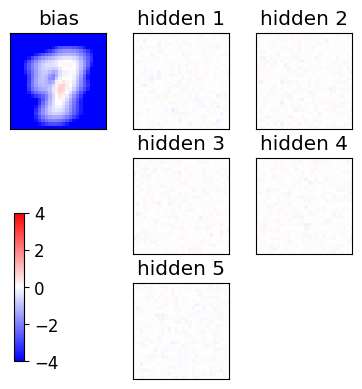

Starting the training
[16801 20681 13650 17337 16919 18129 11873 16107 11868 20865]
[ 8884  3690 11607  4229  7414  5548  7884  3837  6232 13320]
[19739 10507  7313 10783  2468 10568  2299 11968 14367 15257]
[ 3879  1349  3470  6776  6845  6186  5187  7132 16378 14712]
epoch 1 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 2 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 3 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 4 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 5 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 6 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 7 / 150  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 8 / 150  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 9 / 150  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= Fa

<Figure size 640x480 with 0 Axes>

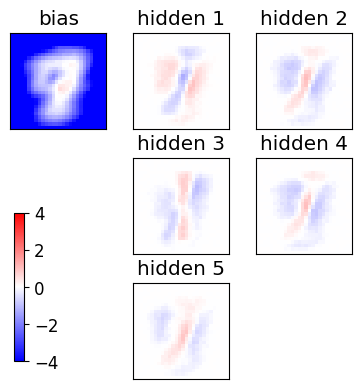

epoch 21 / 150  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 22 / 150  Nt: 4  N: 19  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 23 / 150  Nt: 4  N: 20  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 24 / 150  Nt: 4  N: 21  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 25 / 150  Nt: 4  N: 22  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 26 / 150  Nt: 4  N: 23  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 27 / 150  Nt: 4  N: 24  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 28 / 150  Nt: 4  N: 26  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 29 / 150  Nt: 4  N: 27  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 30 / 150  Nt: 4  N: 28  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 31 / 150  Nt: 4  N: 29  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 32 / 150  Nt: 4  N: 31  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS

<Figure size 640x480 with 0 Axes>

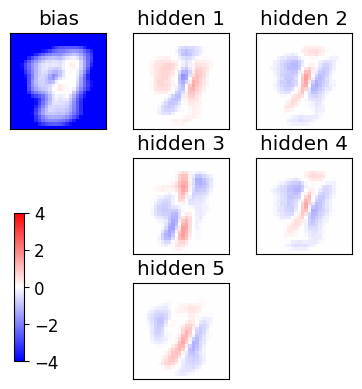

epoch 41 / 150  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 42 / 150  Nt: 4  N: 47  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 43 / 150  Nt: 4  N: 48  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 44 / 150  Nt: 4  N: 50  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 45 / 150  Nt: 4  N: 52  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 46 / 150  Nt: 4  N: 54  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 47 / 150  Nt: 4  N: 56  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 48 / 150  Nt: 4  N: 58  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 49 / 150  Nt: 4  N: 60  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 50 / 150  Nt: 4  N: 62  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 51 / 150  Nt: 4  N: 65  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 52 / 150  Nt: 4  N: 67  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS

<Figure size 640x480 with 0 Axes>

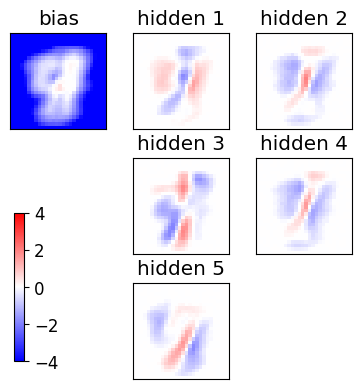

epoch 61 / 150  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 62 / 150  Nt: 4  N: 92  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 63 / 150  Nt: 4  N: 94  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 64 / 150  Nt: 4  N: 97  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 65 / 150  Nt: 4  N: 100  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 66 / 150  Nt: 4  N: 103  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 67 / 150  Nt: 4  N: 106  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 68 / 150  Nt: 4  N: 109  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 69 / 150  Nt: 4  N: 112  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 70 / 150  Nt: 4  N: 115  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 71 / 150  Nt: 4  N: 118  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 72 / 150  Nt: 4  N: 121  L: 5  rate: 0.05  gam: 0.01 SPINS= Fal

<Figure size 640x480 with 0 Axes>

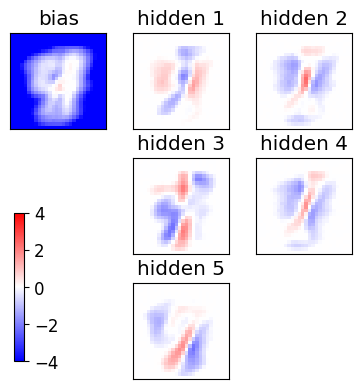

epoch 81 / 150  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 82 / 150  Nt: 4  N: 154  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 83 / 150  Nt: 4  N: 158  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 84 / 150  Nt: 4  N: 162  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 85 / 150  Nt: 4  N: 165  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 86 / 150  Nt: 4  N: 169  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 87 / 150  Nt: 4  N: 173  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 88 / 150  Nt: 4  N: 177  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 89 / 150  Nt: 4  N: 180  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 90 / 150  Nt: 4  N: 184  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 91 / 150  Nt: 4  N: 188  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 92 / 150  Nt: 4  N: 192  L: 5  rate: 0.05  gam: 0.01 SPINS=

<Figure size 640x480 with 0 Axes>

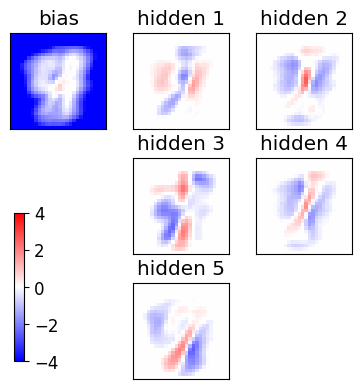

epoch 101 / 150  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 102 / 150  Nt: 4  N: 235  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 103 / 150  Nt: 4  N: 239  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 104 / 150  Nt: 4  N: 244  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 105 / 150  Nt: 4  N: 248  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 106 / 150  Nt: 4  N: 253  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 107 / 150  Nt: 4  N: 257  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 108 / 150  Nt: 4  N: 262  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 109 / 150  Nt: 4  N: 267  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 110 / 150  Nt: 4  N: 272  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 111 / 150  Nt: 4  N: 277  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 112 / 150  Nt: 4  N: 281  L: 5  rate: 0.05  gam:

<Figure size 640x480 with 0 Axes>

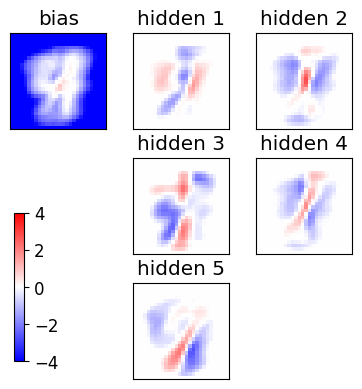

epoch 121 / 150  Nt: 4  N: 327  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 122 / 150  Nt: 4  N: 333  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 123 / 150  Nt: 4  N: 338  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 124 / 150  Nt: 4  N: 343  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 125 / 150  Nt: 4  N: 349  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 126 / 150  Nt: 4  N: 354  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 127 / 150  Nt: 4  N: 360  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 128 / 150  Nt: 4  N: 365  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 129 / 150  Nt: 4  N: 371  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 130 / 150  Nt: 4  N: 377  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 131 / 150  Nt: 4  N: 383  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 132 / 150  Nt: 4  N: 388  L: 5  rate: 0.05  gam:

<Figure size 640x480 with 0 Axes>

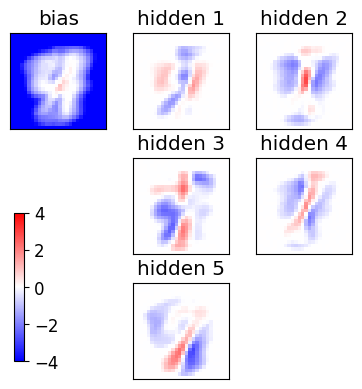

epoch 141 / 150  Nt: 4  N: 442  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 142 / 150  Nt: 4  N: 448  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 143 / 150  Nt: 4  N: 455  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 144 / 150  Nt: 4  N: 461  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 145 / 150  Nt: 4  N: 467  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 146 / 150  Nt: 4  N: 474  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 147 / 150  Nt: 4  N: 480  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 148 / 150  Nt: 4  N: 486  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 149 / 150  Nt: 4  N: 493  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False
epoch 150 / 150  Nt: 4  N: 500  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= False


<Figure size 640x480 with 0 Axes>

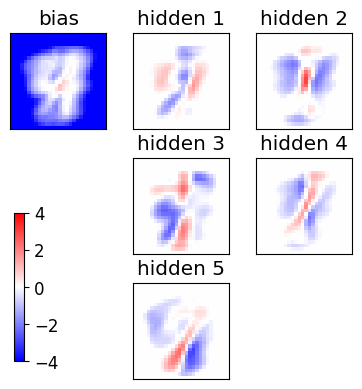

END of learning phase
END of learning phase
END of learning phase


In [81]:
 for L in L_v:
    if L == 5: 
        # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
        w = sigma * np.random.randn(D,L)
        #a = sigma * np.random.randn(D)
        # using Hinton initialization of visible biases
        a = Hinton_bias_init(data)
        # hidden biases initialized to zero
        b = np.zeros(L)
        #print("w=",w);print("a=",a);print("b=",b)
    
        # nr of epochs
        Nepoch=150
        # minibatches per epoch
        Nmini=20
        # minibatch size at initial epoch and final one
        N_ini,N_fin=10,500
        print(f"Nepoch={Nepoch}\nNmini={Nmini}")
    
    
        # recording history of weights ("E" means epoch)
        wE,aE,bE=np.zeros((Nepoch+1,D,L)),np.zeros((Nepoch+1,D)),np.zeros((Nepoch+1,L))
        wE[0],aE[0],bE[0]=np.copy(w),np.copy(a),np.copy(b)
        gwE,gw2E,gwE_d,gwE_m = np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE)
        gaE,ga2E,gaE_d,gaE_m = np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE)
        gbE,gb2E,gbE_d,gbE_m = np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE)
        miniE = np.zeros(Nepoch+1)
        pzE=np.zeros((Nepoch+1,Nz))
        if GRAD=="RMSprop":
            gw2,ga2,gb2 = np.zeros_like(w),np.zeros_like(a),np.zeros_like(b)
    
        indices=np.arange(Nd).astype("int")
        plot_weights_bias(wE, aE, 0, L, cols=L//2, save=False)
    
        # for the plot with panels
        Ncols=min(8,max(2,L//2))
    
        if POTTS: print("Starting the training, POTTS=True")
        else: print("Starting the training")
    
        # Note: here an epoch does not analyze the whole dataset
        for epoch in range(1,1+Nepoch):
            # q maps epochs to interval [0,1]
            q = (epoch-1.)/(Nepoch-1.)
            # N, size of the mini batch
            # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
            N = int(N_ini + (N_fin-N_ini)*(q**2))
            #  l_rate interpolates between initial and final value
            l_rate = l_rate_ini + (l_rate_fin-l_rate_ini)*q
    
            for mini in range(Nmini):
                # initializitation for averages in minibatch
                # visible variables "v" --> "x"
                #  hidden variables "h" --> "z"
                x_data, x_model = np.zeros(D),np.zeros(D)
                z_data, z_model = np.zeros(L),np.zeros(L)
                xz_data,xz_model= np.zeros((D,L)),np.zeros((D,L))
                pz = np.zeros(L)
    
                # Minibatch of size N: points randomply picked (without repetition) from data
                selected = np.random.choice(indices,N,replace=False)
                if epoch==1 and mini<=3: print(selected)
    
                for k in range(N):
                    ###################################
                    x0 = data[selected[k]]
                    # positive CD phase: generating z from x[k]
                    z = CD_step(x0,w,b,POTTS=POTTS)
                    x_data  += x0
                    z_data  += z
                    xz_data += np.outer(x0,z)
                    # fantasy
                    zf=np.copy(z)
                    # Contrastive divergence with Nt steps
                    for t in range(Nt):
                        # negative CD pzase: generating fantasy xf from fantasy zf
                        xf = CD_step(zf,w.T,a)
                        # positive CD phase: generating fantasy zf from fantasy xf
                        zf = CD_step(xf,w,b,POTTS=POTTS)
                    x_model += xf
                    z_model += zf
                    xz_model+= np.outer(xf,zf)
                    # recording probability of encoding in z-space, if POTTS
                    if POTTS: pz[zf]+=1
    
                # gradient of the likelihood: follow it along its positive direction
                gw_d,gw_m = xz_data/N, xz_model/N
                ga_d,ga_m = x_data/N, x_model/N
                gb_d,gb_m = z_data/N, z_model/N
                gw=np.copy(gw_d - gw_m)
                ga=np.copy(ga_d - ga_m)
                gb=np.copy(gb_d - gb_m)
    
                # gradient ascent step
                if GRAD=="RMSprop":
                    # RMSprop gradient ascent
                    gw2 = beta*gw2+(1-beta)*np.square(gw)
                    ga2 = beta*ga2+(1-beta)*np.square(ga)
                    gb2 = beta*gb2+(1-beta)*np.square(gb)
                    w += l_rate*gw/sqrt(epsilon+gw2)
                    a += l_rate*ga/sqrt(epsilon+ga2)
                    b += l_rate*gb/sqrt(epsilon+gb2)
                else:
                    # defaulting to the vanilla stochastic gradient ascent (SGD)
                    w += l_rate*gw
                    a += l_rate*ga
                    b += l_rate*gb
                # regularization (LASSO)
                if gamma>0.:
                    w -= (gamma*l_rate)*sign(w)
                    a -= (gamma*l_rate)*sign(a)
                    b -= (gamma*l_rate)*sign(b)
    
            wE[epoch],gwE[epoch],gwE_d[epoch],gwE_m[epoch]=np.copy(w),np.copy(gw),np.copy(gw_d),np.copy(gw_m)
            aE[epoch],gaE[epoch],gaE_d[epoch],gaE_m[epoch]=np.copy(a),np.copy(ga),np.copy(ga_d),np.copy(ga_m)
            bE[epoch],gbE[epoch],gbE_d[epoch],gbE_m[epoch]=np.copy(b),np.copy(gb),np.copy(gb_d),np.copy(gb_m)
            miniE[epoch]=N
            if POTTS: pzE[epoch] = pz/np.sum(pz)
            print("epoch",epoch,"/",Nepoch," Nt:",Nt," N:",N," L:",L,
                  " rate:",l_rate," gam:",gamma,"SPINS=",SPINS,"POTTS=",POTTS)
    
            if Nepoch<=100 or epoch%20==0 or epoch==Nepoch:
                plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)
    
            str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")
        save_epochs(wE,"w")
        save_epochs(bE,"b")
        save_epochs(aE,"a")
    
    print("END of learning phase")


Log-likelihood estimation:

In [90]:
log_like_sgd=[]
log_like_sgd_std=[]
Nepoch=150
GRAD_list= ["SGD","RMSprop"]
num_epo=np.arange(1,Nepoch,1) # consider trend over the last 5 iterations

for grad in GRAD_list:
    L=5
    Nt=4
    a_all = np.load(f"WEIGHTS/a_RBM_MNIST3_L{L}_Nt{Nt}_SGD-0.05-0.05_Ep150_reg0.01.npy", allow_pickle=True)
    print(f'a_all alg={grad}, gamma={0.01}, L={L}, Nt={Nt}')
    b_all= np.load(f"WEIGHTS/b_RBM_MNIST3_L{L}_Nt{Nt}_SGD-0.05-0.05_Ep150_reg0.01.npy", allow_pickle=True)
    print(f'b_all alg={grad}, gamma={0.01}, L={L}, Nt={Nt}')
    w_all=np.load(f"WEIGHTS/w_RBM_MNIST3_L{L}_Nt{Nt}_SGD-0.05-0.05_Ep150_reg0.01.npy", allow_pickle=True)
    print(f'w_all alg={grad}, gamma={0.01}, L={L}, Nt={Nt}') ## matrice visible*hidden per epoch

    log_like_s=[]
    log_like_s_std=[]
    Nepoch=150
    for i in range(Nepoch-10,Nepoch,1):
        print(f'Epoch n.{i}')
        ll_iter=[]
        mean=[]
        for iter in range(5): # to determine the loglike at each epoch we run the calculation 5 times and compute the average, to reduce randomness
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            ll_iter.append(ll)
        ll_mean= np.array(ll_iter).mean()
        ll_std= np.array(ll_iter).std()
        log_like_s.append(ll_mean)
        log_like_s_std.append(ll_std)
        print('Log-likelihood=',ll_mean,"+-",ll_std)
    log_like_sgd.append(log_like_s)
    log_like_sgd_std.append(log_like_g_std)


a_all alg=SGD, gamma=0.01, L=5, Nt=4
b_all alg=SGD, gamma=0.01, L=5, Nt=4
w_all alg=SGD, gamma=0.01, L=5, Nt=4
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:12<00:00, 434.96it/s]


Log-likelihood= -136.43195015018296 +- 0.6634041401223008
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 471.65it/s]


Log-likelihood= -136.5881363364273 +- 0.6405366242638701
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 478.75it/s]


Log-likelihood= -136.52014481704947 +- 0.34956546809108935
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 484.66it/s]


Log-likelihood= -136.17914769659035 +- 0.6242080111943158
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 481.49it/s]


Log-likelihood= -136.41129823071546 +- 0.48618769529466327
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:12<00:00, 430.09it/s]


Log-likelihood= -136.49786534312256 +- 0.2431426761464852
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 466.72it/s]


Log-likelihood= -136.48499831838996 +- 0.6013798513853724
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 471.39it/s]


Log-likelihood= -136.13714705091556 +- 0.46482286585875876
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:12<00:00, 443.95it/s]


Log-likelihood= -136.32401032396814 +- 0.7636502057991761
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 471.32it/s]


Log-likelihood= -136.51092871638804 +- 0.5122036952181888
a_all alg=RMSprop, gamma=0.01, L=5, Nt=4
b_all alg=RMSprop, gamma=0.01, L=5, Nt=4
w_all alg=RMSprop, gamma=0.01, L=5, Nt=4
Epoch n.140


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 459.17it/s]


Log-likelihood= -136.2531591112505 +- 0.30628891742376524
Epoch n.141


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 483.66it/s]


Log-likelihood= -136.71877788661666 +- 0.2983070911609236
Epoch n.142


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 488.50it/s]


Log-likelihood= -136.5495156894802 +- 0.46098505109866367
Epoch n.143


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 493.20it/s]


Log-likelihood= -136.2052287114306 +- 0.3419901326715745
Epoch n.144


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 510.34it/s]


Log-likelihood= -135.8897678864609 +- 0.5637473647698849
Epoch n.145


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 506.54it/s]


Log-likelihood= -136.49843956148797 +- 0.6079325439414491
Epoch n.146


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 503.43it/s]


Log-likelihood= -136.7513088028865 +- 0.42581324827194533
Epoch n.147


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 504.67it/s]


Log-likelihood= -136.37019286089475 +- 0.3798620569438675
Epoch n.148


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:10<00:00, 501.30it/s]


Log-likelihood= -136.4840234183304 +- 0.5283209434085377
Epoch n.149


Computing log-likelihood: 100%|████████████████████████████████████████████████████| 5498/5498 [00:11<00:00, 469.72it/s]

Log-likelihood= -136.24866961726175 +- 0.41907098910709983


In [20]:
log_like_sgd = [
    [-136.5881363364273,-136.52014481704947,-136.17914769659035,-136.41129823071546,-136.49786534312256,-136.48499831838996,-136.13714705091556,-136.32401032396814,-136.51092871638804],
    [-136.71877788661666,-136.5495156894802,-136.2052287114306,-135.8897678864609,-136.49843956148797,-136.7513088028865,-136.37019286089475,-136.4840234183304,-136.24866961726175],
    [-135.865342, -136.001948, -135.707486, -135.966906, -135.210723, -135.100912, -135.397453, -134.978345, -135.222377],
    [-137.827980, -137.743474, -137.781769, -137.544187, -138.055022, -137.698302, -137.560149, -137.414843, -137.430550],
    [-136.411753, -136.206079, -135.950641, -136.564406, -136.138098, -136.319475, -135.599322, -136.534909, -136.363042],
    [-138.048709, -137.531882, -138.097373, -137.648915, -137.848440, -137.818809, -137.825771, -138.095109, -138.710082],
    [-138.944297, -139.168998, -139.152277, -138.882860, -138.857680, -138.957606, -138.287696, -139.346639, -139.498179]
]

log_like_sgd_std = [
    [0.6405366242638701,0.34956546809108935,0.6242080111943158,0.48618769529466327,0.2431426761464852,0.6013798513853724,0.46482286585875876,0.7636502057991761,0.5122036952181888],
    [0.2983070911609236,0.46098505109866367,0.3419901326715745,0.5637473647698849,0.6079325439414491,0.42581324827194533,0.3798620569438675,0.5283209434085377,0.41907098910709983],
    [0.384676, 0.184522, 0.212543, 0.234186, 0.417299, 0.573856, 0.499638, 0.343054, 0.486019],
    [0.445976, 0.505133, 0.273906, 0.227696, 0.449657, 0.498509, 0.283581, 0.558378, 0.353881],
    [0.516486, 0.362436, 0.400902, 0.401944, 0.640492, 0.469452, 0.312294, 0.254561, 0.396844],
    [0.328409, 0.398709, 0.395415, 0.608133, 0.572938, 0.249544, 0.529368, 0.325129, 0.357037],
    [0.487677, 0.476068, 0.376113, 0.425997, 0.417301, 0.391321, 0.193295, 0.546545, 0.364993]
]


# previous runs with gamma= 10^-2, L=5,CD=4
loglike_g_minus_2 = [
    [-125.85154879296297, -124.44122769837045, -124.28427932378015, -124.18165585940615, -125.09481147201537, -126.16101989148645, -125.00854925745364, -126.05435485895728, -125.21972224383414],
    [-122.62542868850706, -124.11451628857876, -123.4843271568224, -124.05372296089436, -122.24597827652887, -122.66494649854273, -121.54523041943976, -123.72011996090623, -123.73760561887545],
    [-124.7655880833436, -122.74710598917648, -123.8646751686124, -124.05642801439835, -121.97401716746455, -124.18396713550078, -122.79665156370405, -122.73799131505945, -122.33172406148574],
    [-122.16802321449525, -122.18275345637025, -122.34678847252223, -122.58048158180373, -122.35720236152946, -122.4376982515468, -122.30154229815756, -122.45636932359998, -122.33246217650266]
]
loglike_g_minus_2_std = [
    [0.5399704316488174, 0.7661178035581507, 0.6524193432981173, 0.5001648365369342, 0.6148409808424062, 0.7062310904431229, 0.5544875810932012, 0.5035449407437159, 0.5227257940815508],
    [0.7517496006752543, 0.3614748135426356, 0.46876953246891456, 0.55458226120476, 0.4857151296653672, 0.5245671740910623, 0.7015393284983075, 0.3071353970162202, 0.5487949340152654],
    [0.3361339638033289, 0.7788064620820748, 0.5115530550282861, 0.6356929635160161, 0.4777822473371769, 0.5615255279576584, 0.43334187750762976, 0.4586941034599634, 0.4005135372429275],
    [0.34476793642229265, 0.3195690423805653, 0.3021332770611088, 0.3273839015408619, 0.3198197422045928, 0.354306575758081, 0.4190101837894065, 0.3724908985141893, 0.407053960109875]
]

In [ ]:
# graphs: comparison for SGD and RMSProp 

colors = plt.cm.YlOrRd(np.linspace(0.178, 1, len(log_like_sgd)))
colors_two = plt.cm.seismic(np.linspace(0.1, 0.55, len(loglike_g_minus_2)))
Nepoch=150
num_epo=np.arange(Nepoch-9,Nepoch,1)


fig,ax1 = plt.subplots(1,1,figsize=(10,6))
runs_sgd=[]
runs_sgd_std=[]
runs_rms=[]
runs_rms_std=[]
for i, log_like in enumerate(log_like_sgd):
    if i<4:
        weights = 1 / np.array(log_like_sgd_std[i])**2
        weighted_avg = np.average(log_like_sgd[i], weights=weights) # weighted average of log-likelihoods of last 10 epochs
        weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
        chi = np.sum(((log_like_sgd[i] - weighted_avg*np.ones(9))/log_like_sgd_std[i]) ** 2)
        ax1.errorbar(num_epo,log_like_sgd[i],yerr=log_like_sgd_std[i],fmt='s',color=colors[i],label=f'SGD {i+1},χ²={round(chi,1)}',linewidth=2, markersize=6,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
        ax1.plot(num_epo, log_like_sgd[i],color=colors[i], linewidth=2)
        
        runs_sgd.append(weighted_avg) 
        runs_sgd_std.append(weighted_error)
mean_sgd= np.average(runs_sgd, weights=runs_sgd_std)
std_sgd= np.std(runs_sgd)


for i, log_like in enumerate(loglike_g_minus_2):
    color_rms = colors_two[i] if i != 3 else 'black'
    weights_rms = 1 / np.array(loglike_g_minus_2_std[i])**2
    weighted_avg_rms = np.average(loglike_g_minus_2[i], weights=weights_rms) # weighted average of log-likelihoods of last 10 epochs
    weighted_error_rms = np.sqrt(1 / np.sum(weights_rms)) # error of weighted average
    chi_rms = np.sum(((loglike_g_minus_2[i] - weighted_avg_rms*np.ones(9))/loglike_g_minus_2_std[i]) ** 2)
    ax1.errorbar(num_epo,log_like,yerr=loglike_g_minus_2_std[i],fmt='o',color=color_rms,label=f'RMSprop {i+1},χ²={round(chi_rms,1)}',linewidth=2, markersize=6,capsize=4, capthick=1,markerfacecolor=color_rms, markeredgecolor='black', markeredgewidth=1.2)
    ax1.plot(num_epo, log_like, color=color_rms, linewidth=2)

    runs_rms.append(weighted_avg_rms)
    runs_rms_std.append(weighted_error_rms)
mean_rms= np.average(runs_rms, weights=runs_rms_std)
std_rms= np.std(runs_rms)

ax1.set_xlabel('Epoch', fontsize=19.5, fontweight='bold')
ax1.set_ylabel('Log-Likelihood value', fontsize=18.5, fontweight='bold')
ax1.set_title('Log-Likelihood over different runs for different maximization algorithms (L=5,CD=4,$\gamma$=0.001)', fontsize=17.5, fontweight='bold',pad=14)
ax1.set_xticks(num_epo)

ax1.text(15, -5, 'SGD runs', fontsize=12, color='black', ha='center')
ax1.text(15, -6, 'RMSprop runs', fontsize=12, color='black', ha='center')


#ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
#ax1.legend(fontsize=14, loc='center left', frameon=True,bbox_to_anchor=(0.01, 0.445) , edgecolor='black')
ax1.minorticks_off()
#ax1.set_ylim(-138.5,-134)
file_path = 'GRAPHS/loglike_algorithms_runs_plot.png'  # Path where you want to save the figure
fig.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution
plt.show()



NameError: name 'mean_sgd' is not defined

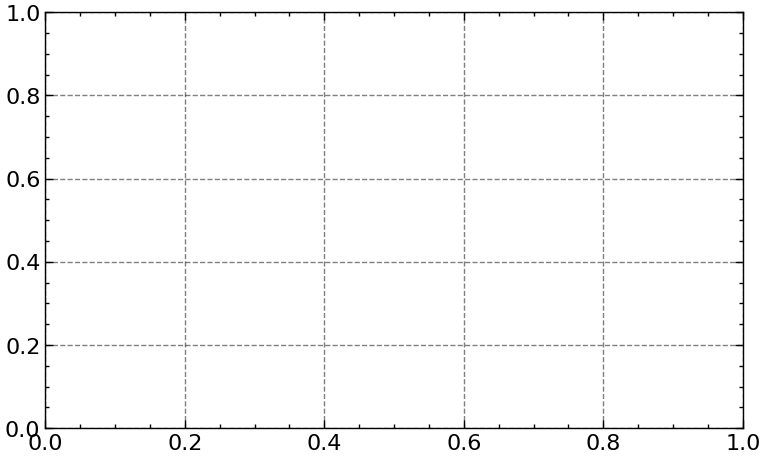

In [12]:
fig2, ax2 = plt.subplots(1,1,figsize=(9,5.4))

ax2.errorbar([0], mean_sgd, yerr=std_sgd, fmt='o', linewidth=2, markersize=8.5,
             capsize=4, color='darkorange', capthick=1, markeredgecolor='black',
             markeredgewidth=1.2, label='SGD')
ax2.errorbar([0.5], mean_rms, yerr=std_rms, fmt='o', linewidth=2, markersize=8.5,
             capsize=4, color='blue', capthick=1, markeredgecolor='black',
             markeredgewidth=1.2, label=r'RMSprop ($\beta$=0.9, $\epsilon$=$10^{-4}$)')

ax2.set_xticks([0, 0.5])  # positions for SGD and RMSprop
ax2.set_xticklabels(['SGD', 'RMSprop'], fontsize=17, fontweight='bold')

ax2.set_ylabel('Mean Log-Likelihood', fontsize=19, fontweight='bold')
ax2.set_title('Mean Log-Likelihood after transient for different maximization algorithms (L=5,$\mathbf{N_t=4},\mathbf{\gamma=10^{-3}}$)', fontsize=17.3, fontweight='bold',pad=15)
ax2.minorticks_off()
#ax2.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax2.legend(fontsize=16, loc='best', frameon=True, edgecolor='black',framealpha=0.9)
ax2.set_xlim(-0.25,0.75)
ax2.set_ylim(-140,-120)

file_path = 'GRAPHS/loglike_algorithms_plot.png'  # Path where you want to save the figure
fig2.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution


plt.show()

We notice a clear separation between the log-likelihood values of two methods: RMSprop appers to perform better over the same number of epochs. This is what we were expecting considering RMSprop is an optimzed version of plain/basic/simpler SGD algorithm, which helps to improve the convergence speed and stability of the model during the training process by using the moving average of the squared gradients to scale the learning rate for each component of the weights. Instead in standard SGD the learning rate increases linearly at each epoch and is the same for each of the weights components.

## Training with POTTS

Here we perform the training of the RBM and computation of Log-Likelihood setting the POTTS parameter to True, so to use a Potts model in which the hidden units have values {-1,1}. As before, we perform those calculations for different values of L and fixed CD steps (set to 4). Since the Potts model allow us to much faster calculations, we used more possible values of L (3,4,5,6,8,10).

Nepoch=450
Nmini=20


<Figure size 640x480 with 0 Axes>

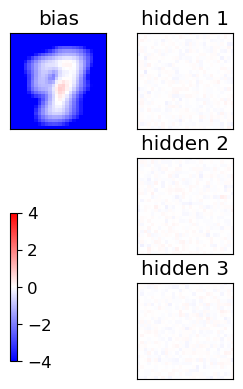

Starting the training, POTTS=True
[ 8326 12451  1601  9335 10142  8594   336  1931 13976  3031]
[ 9295  6178   313 14370  9612 15153 18435 15613 18013  1100]
[ 6670  8429 11483 12169  9907 10932  1787  1441   897 13853]
[ 9273  4402  5629 19051  5225 13262 21306  4494   931  6490]
epoch 1 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 2 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 3 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 4 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 5 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 6 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 7 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 8 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 9 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

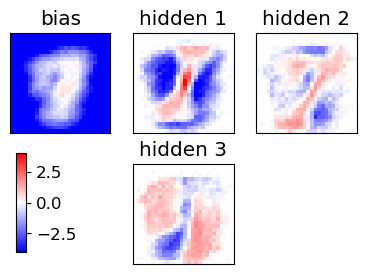

epoch 21 / 450  Nt: 4  N: 10  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 22 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 23 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 24 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 25 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 26 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 27 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 28 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 29 / 450  Nt: 4  N: 11  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 30 / 450  Nt: 4  N: 12  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 31 / 450  Nt: 4  N: 12  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 32 / 450  Nt: 4  N: 12  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

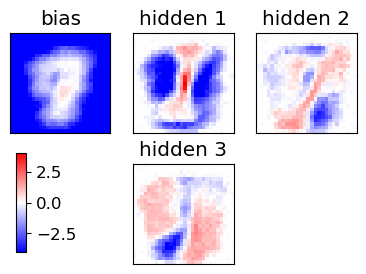

epoch 41 / 450  Nt: 4  N: 13  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 42 / 450  Nt: 4  N: 14  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 43 / 450  Nt: 4  N: 14  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 44 / 450  Nt: 4  N: 14  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 45 / 450  Nt: 4  N: 14  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 46 / 450  Nt: 4  N: 14  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 47 / 450  Nt: 4  N: 15  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 48 / 450  Nt: 4  N: 15  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 49 / 450  Nt: 4  N: 15  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 50 / 450  Nt: 4  N: 15  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 51 / 450  Nt: 4  N: 16  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 52 / 450  Nt: 4  N: 16  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

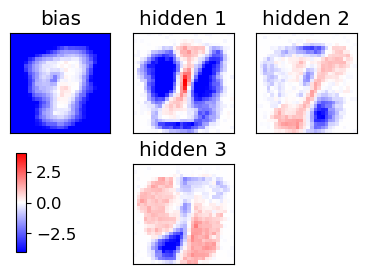

epoch 61 / 450  Nt: 4  N: 18  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 62 / 450  Nt: 4  N: 19  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 63 / 450  Nt: 4  N: 19  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 64 / 450  Nt: 4  N: 19  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 65 / 450  Nt: 4  N: 19  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 66 / 450  Nt: 4  N: 20  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 67 / 450  Nt: 4  N: 20  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 68 / 450  Nt: 4  N: 20  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 69 / 450  Nt: 4  N: 21  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 70 / 450  Nt: 4  N: 21  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 71 / 450  Nt: 4  N: 21  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 72 / 450  Nt: 4  N: 22  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

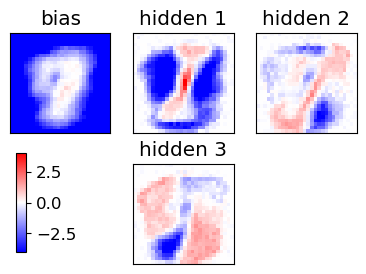

epoch 81 / 450  Nt: 4  N: 25  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 82 / 450  Nt: 4  N: 25  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 83 / 450  Nt: 4  N: 26  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 84 / 450  Nt: 4  N: 26  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 85 / 450  Nt: 4  N: 27  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 86 / 450  Nt: 4  N: 27  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 87 / 450  Nt: 4  N: 27  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 88 / 450  Nt: 4  N: 28  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 89 / 450  Nt: 4  N: 28  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 90 / 450  Nt: 4  N: 29  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 91 / 450  Nt: 4  N: 29  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 92 / 450  Nt: 4  N: 30  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

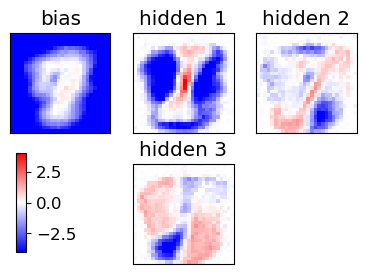

epoch 101 / 450  Nt: 4  N: 34  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 102 / 450  Nt: 4  N: 34  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 103 / 450  Nt: 4  N: 35  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 104 / 450  Nt: 4  N: 35  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 105 / 450  Nt: 4  N: 36  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 106 / 450  Nt: 4  N: 36  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 107 / 450  Nt: 4  N: 37  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 108 / 450  Nt: 4  N: 37  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 109 / 450  Nt: 4  N: 38  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 110 / 450  Nt: 4  N: 38  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 111 / 450  Nt: 4  N: 39  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 112 / 450  Nt: 4  N: 39  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

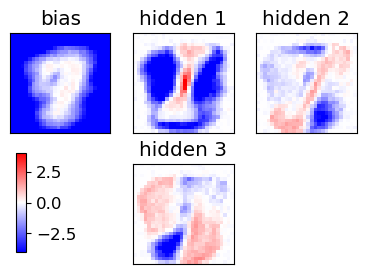

epoch 121 / 450  Nt: 4  N: 44  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 122 / 450  Nt: 4  N: 45  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 123 / 450  Nt: 4  N: 46  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 124 / 450  Nt: 4  N: 46  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 125 / 450  Nt: 4  N: 47  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 126 / 450  Nt: 4  N: 47  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 127 / 450  Nt: 4  N: 48  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 128 / 450  Nt: 4  N: 49  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 129 / 450  Nt: 4  N: 49  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 130 / 450  Nt: 4  N: 50  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 131 / 450  Nt: 4  N: 51  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 132 / 450  Nt: 4  N: 51  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

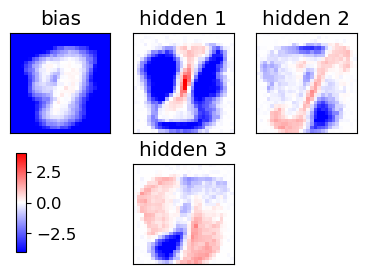

epoch 141 / 450  Nt: 4  N: 57  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 142 / 450  Nt: 4  N: 58  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 143 / 450  Nt: 4  N: 59  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 144 / 450  Nt: 4  N: 59  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 145 / 450  Nt: 4  N: 60  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 146 / 450  Nt: 4  N: 61  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 147 / 450  Nt: 4  N: 61  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 148 / 450  Nt: 4  N: 62  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 149 / 450  Nt: 4  N: 63  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 150 / 450  Nt: 4  N: 63  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 151 / 450  Nt: 4  N: 64  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 152 / 450  Nt: 4  N: 65  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

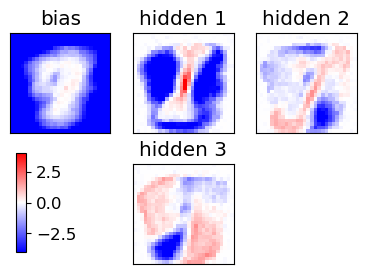

epoch 161 / 450  Nt: 4  N: 72  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 162 / 450  Nt: 4  N: 73  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 163 / 450  Nt: 4  N: 73  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 164 / 450  Nt: 4  N: 74  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 165 / 450  Nt: 4  N: 75  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 166 / 450  Nt: 4  N: 76  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 167 / 450  Nt: 4  N: 76  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 168 / 450  Nt: 4  N: 77  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 169 / 450  Nt: 4  N: 78  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 170 / 450  Nt: 4  N: 79  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 171 / 450  Nt: 4  N: 80  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 172 / 450  Nt: 4  N: 81  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

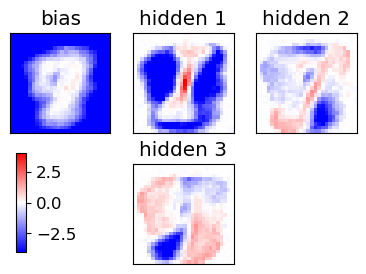

epoch 181 / 450  Nt: 4  N: 88  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 182 / 450  Nt: 4  N: 89  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 183 / 450  Nt: 4  N: 90  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 184 / 450  Nt: 4  N: 91  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 185 / 450  Nt: 4  N: 92  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 186 / 450  Nt: 4  N: 93  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 187 / 450  Nt: 4  N: 94  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 188 / 450  Nt: 4  N: 94  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 189 / 450  Nt: 4  N: 95  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 190 / 450  Nt: 4  N: 96  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 191 / 450  Nt: 4  N: 97  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 192 / 450  Nt: 4  N: 98  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

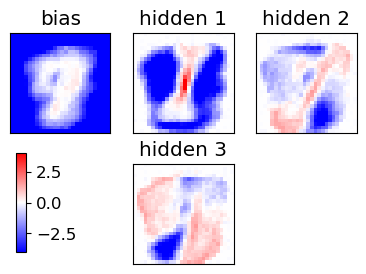

epoch 201 / 450  Nt: 4  N: 107  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 202 / 450  Nt: 4  N: 108  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 203 / 450  Nt: 4  N: 109  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 204 / 450  Nt: 4  N: 110  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 205 / 450  Nt: 4  N: 111  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 206 / 450  Nt: 4  N: 112  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 207 / 450  Nt: 4  N: 113  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 208 / 450  Nt: 4  N: 114  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 209 / 450  Nt: 4  N: 115  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 210 / 450  Nt: 4  N: 116  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 211 / 450  Nt: 4  N: 117  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 212 / 450  Nt: 4  N: 118  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

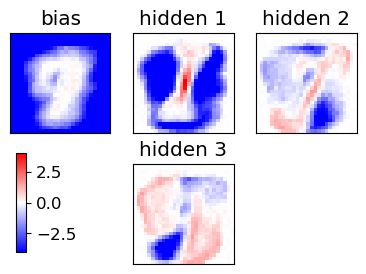

epoch 221 / 450  Nt: 4  N: 127  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 222 / 450  Nt: 4  N: 128  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 223 / 450  Nt: 4  N: 129  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 224 / 450  Nt: 4  N: 130  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 225 / 450  Nt: 4  N: 131  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 226 / 450  Nt: 4  N: 133  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 227 / 450  Nt: 4  N: 134  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 228 / 450  Nt: 4  N: 135  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 229 / 450  Nt: 4  N: 136  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 230 / 450  Nt: 4  N: 137  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 231 / 450  Nt: 4  N: 138  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 232 / 450  Nt: 4  N: 139  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

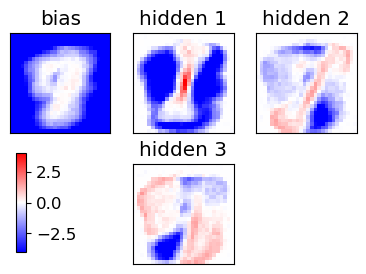

epoch 241 / 450  Nt: 4  N: 149  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 242 / 450  Nt: 4  N: 151  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 243 / 450  Nt: 4  N: 152  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 244 / 450  Nt: 4  N: 153  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 245 / 450  Nt: 4  N: 154  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 246 / 450  Nt: 4  N: 155  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 247 / 450  Nt: 4  N: 157  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 248 / 450  Nt: 4  N: 158  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 249 / 450  Nt: 4  N: 159  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 250 / 450  Nt: 4  N: 160  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 251 / 450  Nt: 4  N: 161  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 252 / 450  Nt: 4  N: 163  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

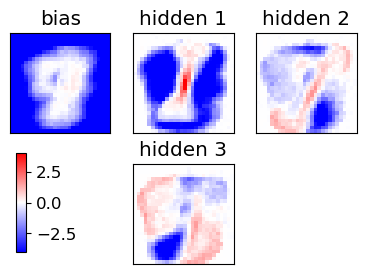

epoch 261 / 450  Nt: 4  N: 174  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 262 / 450  Nt: 4  N: 175  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 263 / 450  Nt: 4  N: 176  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 264 / 450  Nt: 4  N: 178  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 265 / 450  Nt: 4  N: 179  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 266 / 450  Nt: 4  N: 180  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 267 / 450  Nt: 4  N: 181  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 268 / 450  Nt: 4  N: 183  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 269 / 450  Nt: 4  N: 184  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 270 / 450  Nt: 4  N: 185  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 271 / 450  Nt: 4  N: 187  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 272 / 450  Nt: 4  N: 188  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

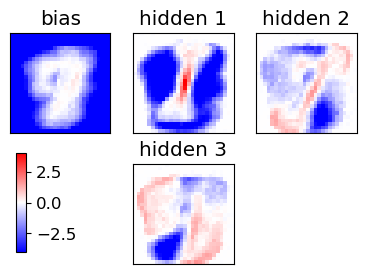

epoch 281 / 450  Nt: 4  N: 200  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 282 / 450  Nt: 4  N: 201  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 283 / 450  Nt: 4  N: 203  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 284 / 450  Nt: 4  N: 204  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 285 / 450  Nt: 4  N: 206  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 286 / 450  Nt: 4  N: 207  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 287 / 450  Nt: 4  N: 208  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 288 / 450  Nt: 4  N: 210  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 289 / 450  Nt: 4  N: 211  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 290 / 450  Nt: 4  N: 213  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 291 / 450  Nt: 4  N: 214  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 292 / 450  Nt: 4  N: 215  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

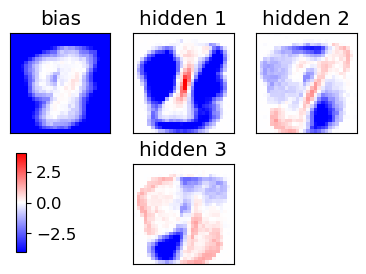

epoch 301 / 450  Nt: 4  N: 228  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 302 / 450  Nt: 4  N: 230  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 303 / 450  Nt: 4  N: 231  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 304 / 450  Nt: 4  N: 233  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 305 / 450  Nt: 4  N: 234  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 306 / 450  Nt: 4  N: 236  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 307 / 450  Nt: 4  N: 237  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 308 / 450  Nt: 4  N: 239  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 309 / 450  Nt: 4  N: 240  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 310 / 450  Nt: 4  N: 242  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 311 / 450  Nt: 4  N: 243  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 312 / 450  Nt: 4  N: 245  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

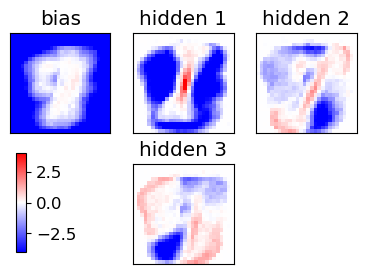

epoch 321 / 450  Nt: 4  N: 258  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 322 / 450  Nt: 4  N: 260  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 323 / 450  Nt: 4  N: 262  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 324 / 450  Nt: 4  N: 263  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 325 / 450  Nt: 4  N: 265  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 326 / 450  Nt: 4  N: 266  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 327 / 450  Nt: 4  N: 268  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 328 / 450  Nt: 4  N: 269  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 329 / 450  Nt: 4  N: 271  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 330 / 450  Nt: 4  N: 273  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 331 / 450  Nt: 4  N: 274  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 332 / 450  Nt: 4  N: 276  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

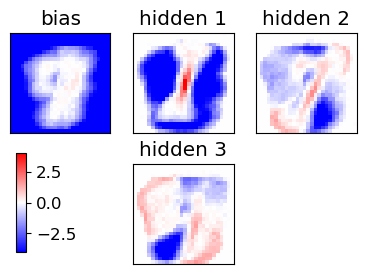

epoch 341 / 450  Nt: 4  N: 290  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 342 / 450  Nt: 4  N: 292  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 343 / 450  Nt: 4  N: 294  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 344 / 450  Nt: 4  N: 295  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 345 / 450  Nt: 4  N: 297  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 346 / 450  Nt: 4  N: 299  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 347 / 450  Nt: 4  N: 300  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 348 / 450  Nt: 4  N: 302  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 349 / 450  Nt: 4  N: 304  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 350 / 450  Nt: 4  N: 306  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 351 / 450  Nt: 4  N: 307  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 352 / 450  Nt: 4  N: 309  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

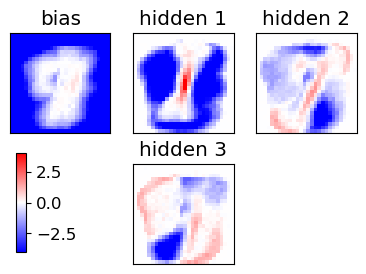

epoch 361 / 450  Nt: 4  N: 324  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 362 / 450  Nt: 4  N: 326  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 363 / 450  Nt: 4  N: 328  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 364 / 450  Nt: 4  N: 330  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 365 / 450  Nt: 4  N: 332  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 366 / 450  Nt: 4  N: 333  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 367 / 450  Nt: 4  N: 335  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 368 / 450  Nt: 4  N: 337  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 369 / 450  Nt: 4  N: 339  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 370 / 450  Nt: 4  N: 340  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 371 / 450  Nt: 4  N: 342  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 372 / 450  Nt: 4  N: 344  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

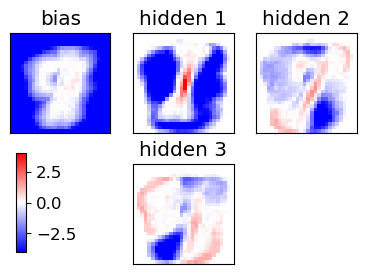

epoch 381 / 450  Nt: 4  N: 360  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 382 / 450  Nt: 4  N: 362  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 383 / 450  Nt: 4  N: 364  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 384 / 450  Nt: 4  N: 366  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 385 / 450  Nt: 4  N: 368  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 386 / 450  Nt: 4  N: 370  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 387 / 450  Nt: 4  N: 372  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 388 / 450  Nt: 4  N: 374  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 389 / 450  Nt: 4  N: 375  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 390 / 450  Nt: 4  N: 377  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 391 / 450  Nt: 4  N: 379  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 392 / 450  Nt: 4  N: 381  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

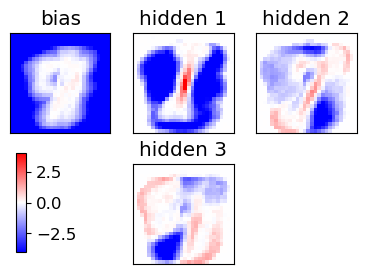

epoch 401 / 450  Nt: 4  N: 398  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 402 / 450  Nt: 4  N: 400  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 403 / 450  Nt: 4  N: 402  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 404 / 450  Nt: 4  N: 404  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 405 / 450  Nt: 4  N: 406  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 406 / 450  Nt: 4  N: 408  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 407 / 450  Nt: 4  N: 410  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 408 / 450  Nt: 4  N: 412  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 409 / 450  Nt: 4  N: 414  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 410 / 450  Nt: 4  N: 416  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 411 / 450  Nt: 4  N: 418  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 412 / 450  Nt: 4  N: 420  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

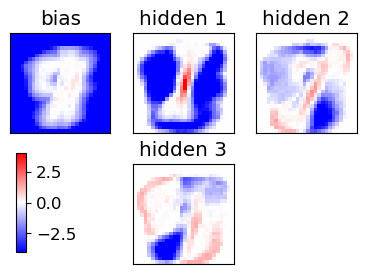

epoch 421 / 450  Nt: 4  N: 438  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 422 / 450  Nt: 4  N: 440  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 423 / 450  Nt: 4  N: 442  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 424 / 450  Nt: 4  N: 444  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 425 / 450  Nt: 4  N: 446  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 426 / 450  Nt: 4  N: 449  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 427 / 450  Nt: 4  N: 451  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 428 / 450  Nt: 4  N: 453  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 429 / 450  Nt: 4  N: 455  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 430 / 450  Nt: 4  N: 457  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 431 / 450  Nt: 4  N: 459  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 432 / 450  Nt: 4  N: 461  L: 3  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

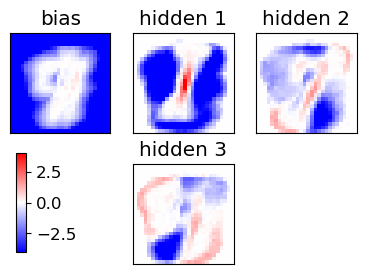

epoch 441 / 450  Nt: 4  N: 480  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 442 / 450  Nt: 4  N: 482  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 443 / 450  Nt: 4  N: 484  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 444 / 450  Nt: 4  N: 486  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 445 / 450  Nt: 4  N: 489  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 446 / 450  Nt: 4  N: 491  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 447 / 450  Nt: 4  N: 493  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 448 / 450  Nt: 4  N: 495  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 449 / 450  Nt: 4  N: 497  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 450 / 450  Nt: 4  N: 500  L: 3  rate: 0.05  gam: 0.01 SPINS= False POTTS= True


<Figure size 640x480 with 0 Axes>

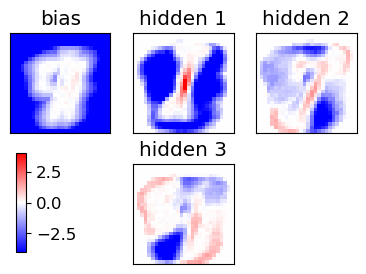

END of learning phase
Nepoch=450
Nmini=20


<Figure size 640x480 with 0 Axes>

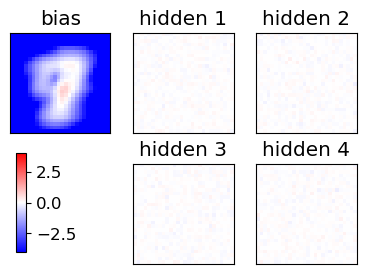

Starting the training, POTTS=True
[ 5514  6738 15824 17247 20892 17897  6931 12774  5732  3839]
[  274  6208 19299 11882  2498 13507 18102 14741  3245   295]
[19916 12972 14266  7980  2419   947  7655 18557  4260  7751]
[10758 16031  2542 21883  7131 20816  8061 12316 20819  6456]
epoch 1 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 2 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 3 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 4 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 5 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 6 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 7 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 8 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 9 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

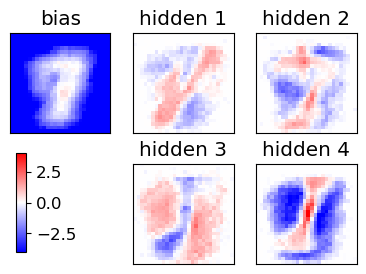

epoch 21 / 450  Nt: 4  N: 10  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 22 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 23 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 24 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 25 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 26 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 27 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 28 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 29 / 450  Nt: 4  N: 11  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 30 / 450  Nt: 4  N: 12  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 31 / 450  Nt: 4  N: 12  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 32 / 450  Nt: 4  N: 12  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

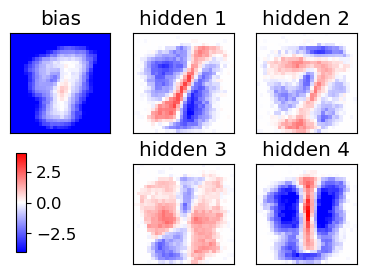

epoch 41 / 450  Nt: 4  N: 13  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 42 / 450  Nt: 4  N: 14  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 43 / 450  Nt: 4  N: 14  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 44 / 450  Nt: 4  N: 14  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 45 / 450  Nt: 4  N: 14  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 46 / 450  Nt: 4  N: 14  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 47 / 450  Nt: 4  N: 15  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 48 / 450  Nt: 4  N: 15  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 49 / 450  Nt: 4  N: 15  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 50 / 450  Nt: 4  N: 15  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 51 / 450  Nt: 4  N: 16  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 52 / 450  Nt: 4  N: 16  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

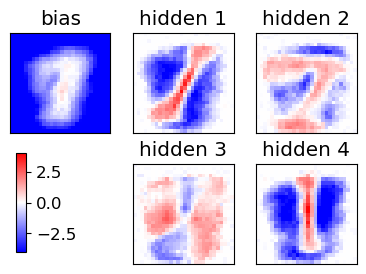

epoch 61 / 450  Nt: 4  N: 18  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 62 / 450  Nt: 4  N: 19  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 63 / 450  Nt: 4  N: 19  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 64 / 450  Nt: 4  N: 19  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 65 / 450  Nt: 4  N: 19  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 66 / 450  Nt: 4  N: 20  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 67 / 450  Nt: 4  N: 20  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 68 / 450  Nt: 4  N: 20  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 69 / 450  Nt: 4  N: 21  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 70 / 450  Nt: 4  N: 21  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 71 / 450  Nt: 4  N: 21  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 72 / 450  Nt: 4  N: 22  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

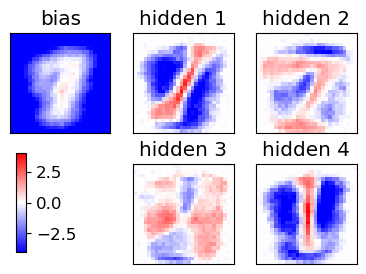

epoch 81 / 450  Nt: 4  N: 25  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 82 / 450  Nt: 4  N: 25  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 83 / 450  Nt: 4  N: 26  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 84 / 450  Nt: 4  N: 26  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 85 / 450  Nt: 4  N: 27  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 86 / 450  Nt: 4  N: 27  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 87 / 450  Nt: 4  N: 27  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 88 / 450  Nt: 4  N: 28  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 89 / 450  Nt: 4  N: 28  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 90 / 450  Nt: 4  N: 29  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 91 / 450  Nt: 4  N: 29  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 92 / 450  Nt: 4  N: 30  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

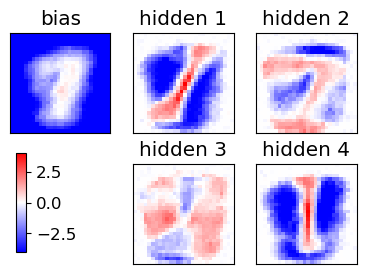

epoch 101 / 450  Nt: 4  N: 34  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 102 / 450  Nt: 4  N: 34  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 103 / 450  Nt: 4  N: 35  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 104 / 450  Nt: 4  N: 35  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 105 / 450  Nt: 4  N: 36  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 106 / 450  Nt: 4  N: 36  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 107 / 450  Nt: 4  N: 37  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 108 / 450  Nt: 4  N: 37  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 109 / 450  Nt: 4  N: 38  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 110 / 450  Nt: 4  N: 38  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 111 / 450  Nt: 4  N: 39  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 112 / 450  Nt: 4  N: 39  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

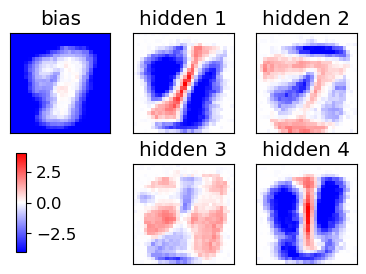

epoch 121 / 450  Nt: 4  N: 44  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 122 / 450  Nt: 4  N: 45  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 123 / 450  Nt: 4  N: 46  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 124 / 450  Nt: 4  N: 46  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 125 / 450  Nt: 4  N: 47  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 126 / 450  Nt: 4  N: 47  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 127 / 450  Nt: 4  N: 48  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 128 / 450  Nt: 4  N: 49  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 129 / 450  Nt: 4  N: 49  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 130 / 450  Nt: 4  N: 50  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 131 / 450  Nt: 4  N: 51  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 132 / 450  Nt: 4  N: 51  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

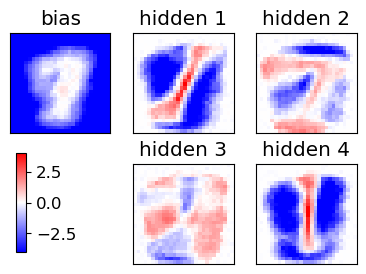

epoch 141 / 450  Nt: 4  N: 57  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 142 / 450  Nt: 4  N: 58  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 143 / 450  Nt: 4  N: 59  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 144 / 450  Nt: 4  N: 59  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 145 / 450  Nt: 4  N: 60  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 146 / 450  Nt: 4  N: 61  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 147 / 450  Nt: 4  N: 61  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 148 / 450  Nt: 4  N: 62  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 149 / 450  Nt: 4  N: 63  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 150 / 450  Nt: 4  N: 63  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 151 / 450  Nt: 4  N: 64  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 152 / 450  Nt: 4  N: 65  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

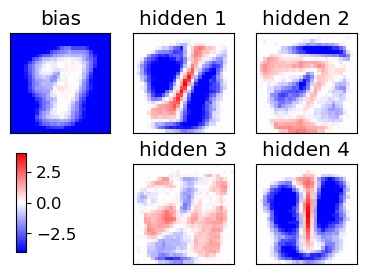

epoch 161 / 450  Nt: 4  N: 72  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 162 / 450  Nt: 4  N: 73  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 163 / 450  Nt: 4  N: 73  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 164 / 450  Nt: 4  N: 74  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 165 / 450  Nt: 4  N: 75  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 166 / 450  Nt: 4  N: 76  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 167 / 450  Nt: 4  N: 76  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 168 / 450  Nt: 4  N: 77  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 169 / 450  Nt: 4  N: 78  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 170 / 450  Nt: 4  N: 79  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 171 / 450  Nt: 4  N: 80  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 172 / 450  Nt: 4  N: 81  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

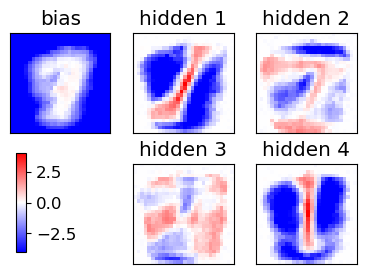

epoch 181 / 450  Nt: 4  N: 88  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 182 / 450  Nt: 4  N: 89  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 183 / 450  Nt: 4  N: 90  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 184 / 450  Nt: 4  N: 91  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 185 / 450  Nt: 4  N: 92  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 186 / 450  Nt: 4  N: 93  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 187 / 450  Nt: 4  N: 94  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 188 / 450  Nt: 4  N: 94  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 189 / 450  Nt: 4  N: 95  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 190 / 450  Nt: 4  N: 96  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 191 / 450  Nt: 4  N: 97  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 192 / 450  Nt: 4  N: 98  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

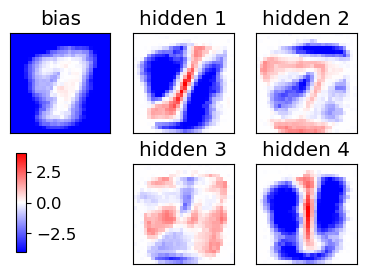

epoch 201 / 450  Nt: 4  N: 107  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 202 / 450  Nt: 4  N: 108  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 203 / 450  Nt: 4  N: 109  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 204 / 450  Nt: 4  N: 110  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 205 / 450  Nt: 4  N: 111  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 206 / 450  Nt: 4  N: 112  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 207 / 450  Nt: 4  N: 113  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 208 / 450  Nt: 4  N: 114  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 209 / 450  Nt: 4  N: 115  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 210 / 450  Nt: 4  N: 116  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 211 / 450  Nt: 4  N: 117  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 212 / 450  Nt: 4  N: 118  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

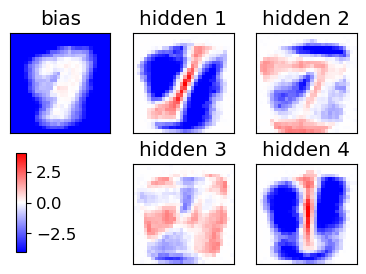

epoch 221 / 450  Nt: 4  N: 127  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 222 / 450  Nt: 4  N: 128  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 223 / 450  Nt: 4  N: 129  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 224 / 450  Nt: 4  N: 130  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 225 / 450  Nt: 4  N: 131  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 226 / 450  Nt: 4  N: 133  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 227 / 450  Nt: 4  N: 134  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 228 / 450  Nt: 4  N: 135  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 229 / 450  Nt: 4  N: 136  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 230 / 450  Nt: 4  N: 137  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 231 / 450  Nt: 4  N: 138  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 232 / 450  Nt: 4  N: 139  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

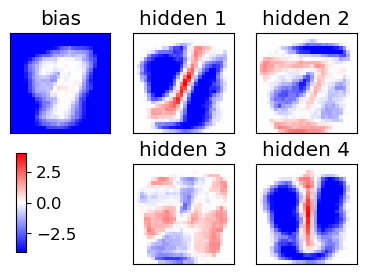

epoch 241 / 450  Nt: 4  N: 149  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 242 / 450  Nt: 4  N: 151  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 243 / 450  Nt: 4  N: 152  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 244 / 450  Nt: 4  N: 153  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 245 / 450  Nt: 4  N: 154  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 246 / 450  Nt: 4  N: 155  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 247 / 450  Nt: 4  N: 157  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 248 / 450  Nt: 4  N: 158  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 249 / 450  Nt: 4  N: 159  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 250 / 450  Nt: 4  N: 160  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 251 / 450  Nt: 4  N: 161  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 252 / 450  Nt: 4  N: 163  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

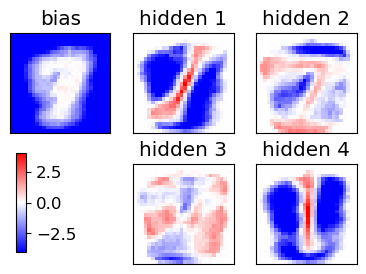

epoch 261 / 450  Nt: 4  N: 174  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 262 / 450  Nt: 4  N: 175  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 263 / 450  Nt: 4  N: 176  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 264 / 450  Nt: 4  N: 178  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 265 / 450  Nt: 4  N: 179  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 266 / 450  Nt: 4  N: 180  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 267 / 450  Nt: 4  N: 181  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 268 / 450  Nt: 4  N: 183  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 269 / 450  Nt: 4  N: 184  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 270 / 450  Nt: 4  N: 185  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 271 / 450  Nt: 4  N: 187  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 272 / 450  Nt: 4  N: 188  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

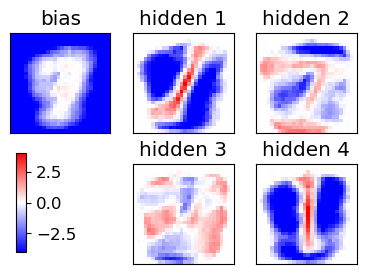

epoch 281 / 450  Nt: 4  N: 200  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 282 / 450  Nt: 4  N: 201  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 283 / 450  Nt: 4  N: 203  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 284 / 450  Nt: 4  N: 204  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 285 / 450  Nt: 4  N: 206  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 286 / 450  Nt: 4  N: 207  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 287 / 450  Nt: 4  N: 208  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 288 / 450  Nt: 4  N: 210  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 289 / 450  Nt: 4  N: 211  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 290 / 450  Nt: 4  N: 213  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 291 / 450  Nt: 4  N: 214  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 292 / 450  Nt: 4  N: 215  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

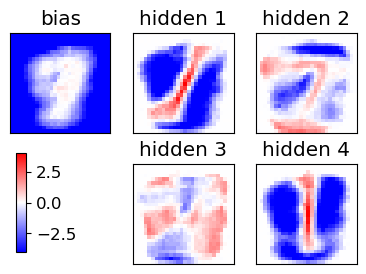

epoch 301 / 450  Nt: 4  N: 228  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 302 / 450  Nt: 4  N: 230  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 303 / 450  Nt: 4  N: 231  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 304 / 450  Nt: 4  N: 233  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 305 / 450  Nt: 4  N: 234  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 306 / 450  Nt: 4  N: 236  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 307 / 450  Nt: 4  N: 237  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 308 / 450  Nt: 4  N: 239  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 309 / 450  Nt: 4  N: 240  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 310 / 450  Nt: 4  N: 242  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 311 / 450  Nt: 4  N: 243  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 312 / 450  Nt: 4  N: 245  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

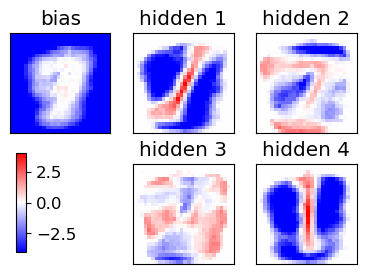

epoch 321 / 450  Nt: 4  N: 258  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 322 / 450  Nt: 4  N: 260  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 323 / 450  Nt: 4  N: 262  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 324 / 450  Nt: 4  N: 263  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 325 / 450  Nt: 4  N: 265  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 326 / 450  Nt: 4  N: 266  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 327 / 450  Nt: 4  N: 268  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 328 / 450  Nt: 4  N: 269  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 329 / 450  Nt: 4  N: 271  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 330 / 450  Nt: 4  N: 273  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 331 / 450  Nt: 4  N: 274  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 332 / 450  Nt: 4  N: 276  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

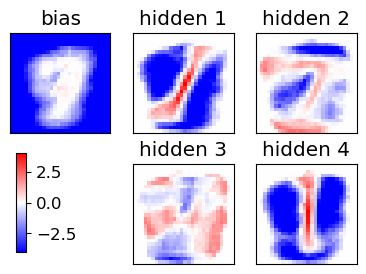

epoch 341 / 450  Nt: 4  N: 290  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 342 / 450  Nt: 4  N: 292  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 343 / 450  Nt: 4  N: 294  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 344 / 450  Nt: 4  N: 295  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 345 / 450  Nt: 4  N: 297  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 346 / 450  Nt: 4  N: 299  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 347 / 450  Nt: 4  N: 300  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 348 / 450  Nt: 4  N: 302  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 349 / 450  Nt: 4  N: 304  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 350 / 450  Nt: 4  N: 306  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 351 / 450  Nt: 4  N: 307  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 352 / 450  Nt: 4  N: 309  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

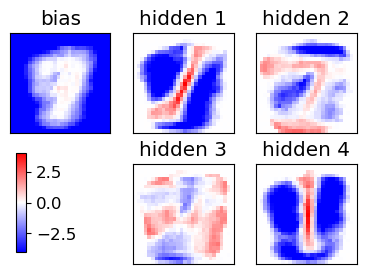

epoch 361 / 450  Nt: 4  N: 324  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 362 / 450  Nt: 4  N: 326  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 363 / 450  Nt: 4  N: 328  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 364 / 450  Nt: 4  N: 330  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 365 / 450  Nt: 4  N: 332  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 366 / 450  Nt: 4  N: 333  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 367 / 450  Nt: 4  N: 335  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 368 / 450  Nt: 4  N: 337  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 369 / 450  Nt: 4  N: 339  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 370 / 450  Nt: 4  N: 340  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 371 / 450  Nt: 4  N: 342  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 372 / 450  Nt: 4  N: 344  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

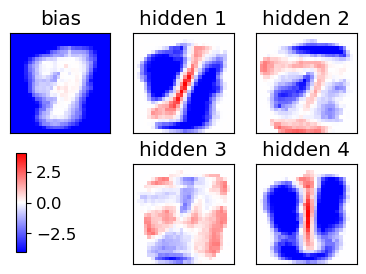

epoch 381 / 450  Nt: 4  N: 360  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 382 / 450  Nt: 4  N: 362  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 383 / 450  Nt: 4  N: 364  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 384 / 450  Nt: 4  N: 366  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 385 / 450  Nt: 4  N: 368  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 386 / 450  Nt: 4  N: 370  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 387 / 450  Nt: 4  N: 372  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 388 / 450  Nt: 4  N: 374  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 389 / 450  Nt: 4  N: 375  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 390 / 450  Nt: 4  N: 377  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 391 / 450  Nt: 4  N: 379  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 392 / 450  Nt: 4  N: 381  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

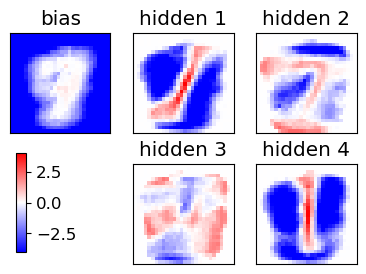

epoch 401 / 450  Nt: 4  N: 398  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 402 / 450  Nt: 4  N: 400  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 403 / 450  Nt: 4  N: 402  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 404 / 450  Nt: 4  N: 404  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 405 / 450  Nt: 4  N: 406  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 406 / 450  Nt: 4  N: 408  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 407 / 450  Nt: 4  N: 410  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 408 / 450  Nt: 4  N: 412  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 409 / 450  Nt: 4  N: 414  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 410 / 450  Nt: 4  N: 416  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 411 / 450  Nt: 4  N: 418  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 412 / 450  Nt: 4  N: 420  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

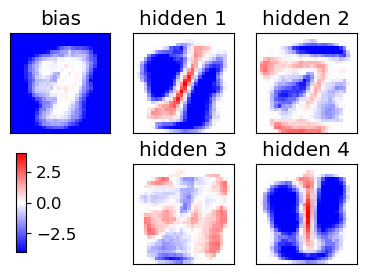

epoch 421 / 450  Nt: 4  N: 438  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 422 / 450  Nt: 4  N: 440  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 423 / 450  Nt: 4  N: 442  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 424 / 450  Nt: 4  N: 444  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 425 / 450  Nt: 4  N: 446  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 426 / 450  Nt: 4  N: 449  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 427 / 450  Nt: 4  N: 451  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 428 / 450  Nt: 4  N: 453  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 429 / 450  Nt: 4  N: 455  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 430 / 450  Nt: 4  N: 457  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 431 / 450  Nt: 4  N: 459  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 432 / 450  Nt: 4  N: 461  L: 4  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

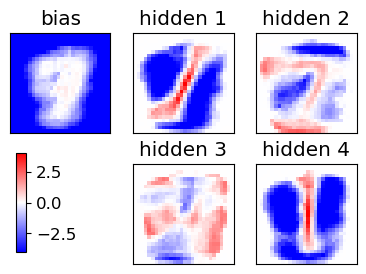

epoch 441 / 450  Nt: 4  N: 480  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 442 / 450  Nt: 4  N: 482  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 443 / 450  Nt: 4  N: 484  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 444 / 450  Nt: 4  N: 486  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 445 / 450  Nt: 4  N: 489  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 446 / 450  Nt: 4  N: 491  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 447 / 450  Nt: 4  N: 493  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 448 / 450  Nt: 4  N: 495  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 449 / 450  Nt: 4  N: 497  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 450 / 450  Nt: 4  N: 500  L: 4  rate: 0.05  gam: 0.01 SPINS= False POTTS= True


<Figure size 640x480 with 0 Axes>

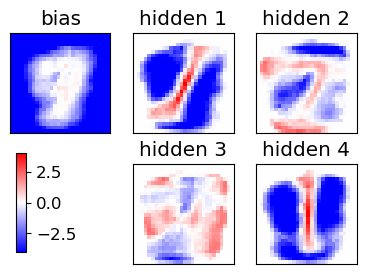

END of learning phase
Nepoch=450
Nmini=20


<Figure size 640x480 with 0 Axes>

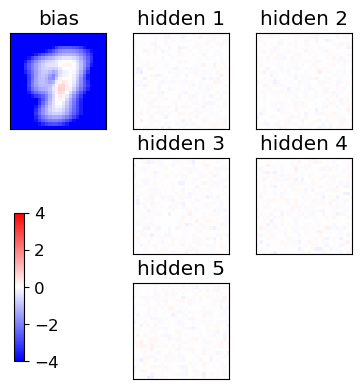

Starting the training, POTTS=True
[ 6428 12340  6676 12742  6730 20636 13320 14633 12204 10711]
[ 1499  7770  9336 10677 20735 18265  4369 21659  9371 15554]
[ 3983 18801  6283 10300 10350 14634  9950 17929 21234 17434]
[19914 13136 20188 14551 18756 17538 16922 13086  4999 16234]
epoch 1 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 2 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 3 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 4 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 5 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 6 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 7 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 8 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 9 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

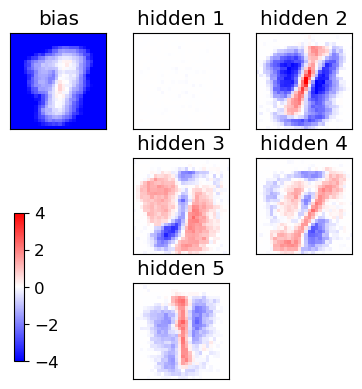

epoch 21 / 450  Nt: 4  N: 10  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 22 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 23 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 24 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 25 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 26 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 27 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 28 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 29 / 450  Nt: 4  N: 11  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 30 / 450  Nt: 4  N: 12  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 31 / 450  Nt: 4  N: 12  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 32 / 450  Nt: 4  N: 12  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

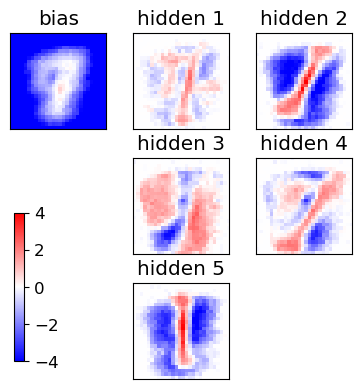

epoch 41 / 450  Nt: 4  N: 13  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 42 / 450  Nt: 4  N: 14  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 43 / 450  Nt: 4  N: 14  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 44 / 450  Nt: 4  N: 14  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 45 / 450  Nt: 4  N: 14  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 46 / 450  Nt: 4  N: 14  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 47 / 450  Nt: 4  N: 15  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 48 / 450  Nt: 4  N: 15  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 49 / 450  Nt: 4  N: 15  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 50 / 450  Nt: 4  N: 15  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 51 / 450  Nt: 4  N: 16  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 52 / 450  Nt: 4  N: 16  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

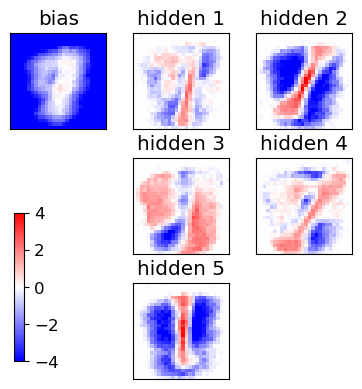

epoch 61 / 450  Nt: 4  N: 18  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 62 / 450  Nt: 4  N: 19  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 63 / 450  Nt: 4  N: 19  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 64 / 450  Nt: 4  N: 19  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 65 / 450  Nt: 4  N: 19  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 66 / 450  Nt: 4  N: 20  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 67 / 450  Nt: 4  N: 20  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 68 / 450  Nt: 4  N: 20  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 69 / 450  Nt: 4  N: 21  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 70 / 450  Nt: 4  N: 21  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 71 / 450  Nt: 4  N: 21  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 72 / 450  Nt: 4  N: 22  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

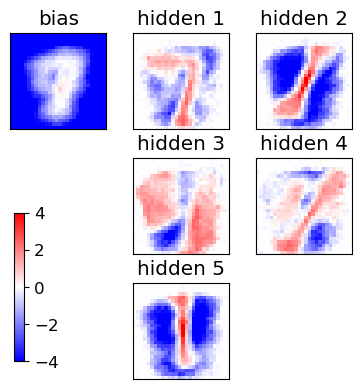

epoch 81 / 450  Nt: 4  N: 25  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 82 / 450  Nt: 4  N: 25  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 83 / 450  Nt: 4  N: 26  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 84 / 450  Nt: 4  N: 26  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 85 / 450  Nt: 4  N: 27  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 86 / 450  Nt: 4  N: 27  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 87 / 450  Nt: 4  N: 27  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 88 / 450  Nt: 4  N: 28  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 89 / 450  Nt: 4  N: 28  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 90 / 450  Nt: 4  N: 29  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 91 / 450  Nt: 4  N: 29  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 92 / 450  Nt: 4  N: 30  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

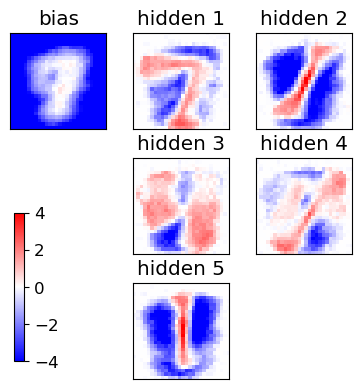

epoch 101 / 450  Nt: 4  N: 34  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 102 / 450  Nt: 4  N: 34  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 103 / 450  Nt: 4  N: 35  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 104 / 450  Nt: 4  N: 35  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 105 / 450  Nt: 4  N: 36  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 106 / 450  Nt: 4  N: 36  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 107 / 450  Nt: 4  N: 37  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 108 / 450  Nt: 4  N: 37  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 109 / 450  Nt: 4  N: 38  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 110 / 450  Nt: 4  N: 38  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 111 / 450  Nt: 4  N: 39  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 112 / 450  Nt: 4  N: 39  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

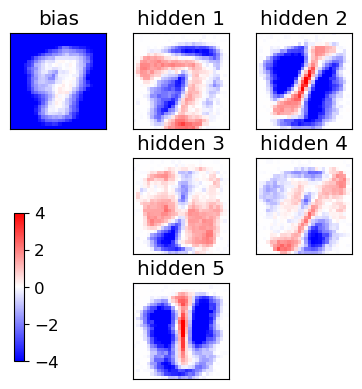

epoch 121 / 450  Nt: 4  N: 44  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 122 / 450  Nt: 4  N: 45  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 123 / 450  Nt: 4  N: 46  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 124 / 450  Nt: 4  N: 46  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 125 / 450  Nt: 4  N: 47  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 126 / 450  Nt: 4  N: 47  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 127 / 450  Nt: 4  N: 48  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 128 / 450  Nt: 4  N: 49  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 129 / 450  Nt: 4  N: 49  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 130 / 450  Nt: 4  N: 50  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 131 / 450  Nt: 4  N: 51  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 132 / 450  Nt: 4  N: 51  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

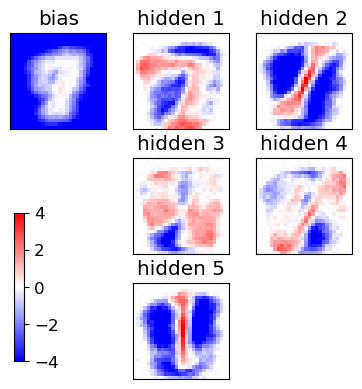

epoch 141 / 450  Nt: 4  N: 57  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 142 / 450  Nt: 4  N: 58  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 143 / 450  Nt: 4  N: 59  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 144 / 450  Nt: 4  N: 59  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 145 / 450  Nt: 4  N: 60  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 146 / 450  Nt: 4  N: 61  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 147 / 450  Nt: 4  N: 61  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 148 / 450  Nt: 4  N: 62  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 149 / 450  Nt: 4  N: 63  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 150 / 450  Nt: 4  N: 63  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 151 / 450  Nt: 4  N: 64  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 152 / 450  Nt: 4  N: 65  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

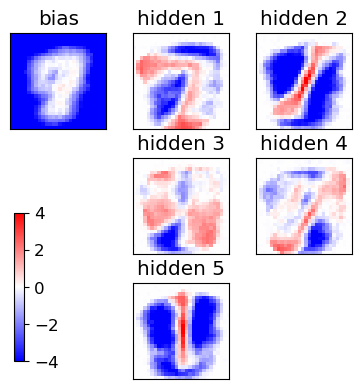

epoch 161 / 450  Nt: 4  N: 72  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 162 / 450  Nt: 4  N: 73  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 163 / 450  Nt: 4  N: 73  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 164 / 450  Nt: 4  N: 74  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 165 / 450  Nt: 4  N: 75  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 166 / 450  Nt: 4  N: 76  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 167 / 450  Nt: 4  N: 76  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 168 / 450  Nt: 4  N: 77  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 169 / 450  Nt: 4  N: 78  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 170 / 450  Nt: 4  N: 79  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 171 / 450  Nt: 4  N: 80  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 172 / 450  Nt: 4  N: 81  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

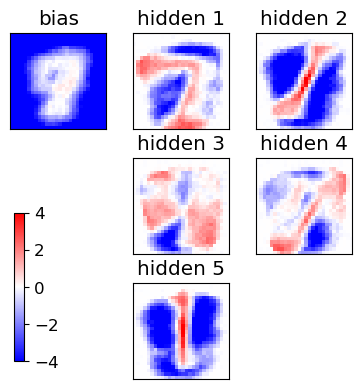

epoch 181 / 450  Nt: 4  N: 88  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 182 / 450  Nt: 4  N: 89  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 183 / 450  Nt: 4  N: 90  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 184 / 450  Nt: 4  N: 91  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 185 / 450  Nt: 4  N: 92  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 186 / 450  Nt: 4  N: 93  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 187 / 450  Nt: 4  N: 94  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 188 / 450  Nt: 4  N: 94  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 189 / 450  Nt: 4  N: 95  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 190 / 450  Nt: 4  N: 96  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 191 / 450  Nt: 4  N: 97  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 192 / 450  Nt: 4  N: 98  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

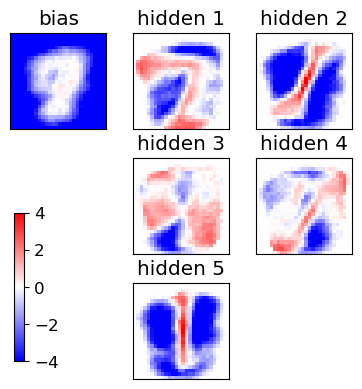

epoch 201 / 450  Nt: 4  N: 107  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 202 / 450  Nt: 4  N: 108  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 203 / 450  Nt: 4  N: 109  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 204 / 450  Nt: 4  N: 110  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 205 / 450  Nt: 4  N: 111  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 206 / 450  Nt: 4  N: 112  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 207 / 450  Nt: 4  N: 113  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 208 / 450  Nt: 4  N: 114  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 209 / 450  Nt: 4  N: 115  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 210 / 450  Nt: 4  N: 116  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 211 / 450  Nt: 4  N: 117  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 212 / 450  Nt: 4  N: 118  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

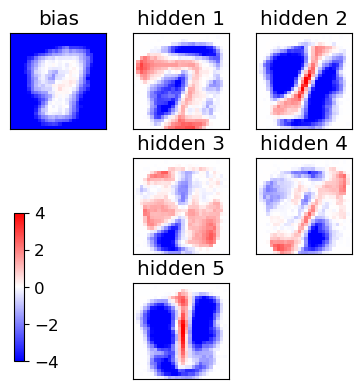

epoch 221 / 450  Nt: 4  N: 127  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 222 / 450  Nt: 4  N: 128  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 223 / 450  Nt: 4  N: 129  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 224 / 450  Nt: 4  N: 130  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 225 / 450  Nt: 4  N: 131  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 226 / 450  Nt: 4  N: 133  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 227 / 450  Nt: 4  N: 134  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 228 / 450  Nt: 4  N: 135  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 229 / 450  Nt: 4  N: 136  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 230 / 450  Nt: 4  N: 137  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 231 / 450  Nt: 4  N: 138  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 232 / 450  Nt: 4  N: 139  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

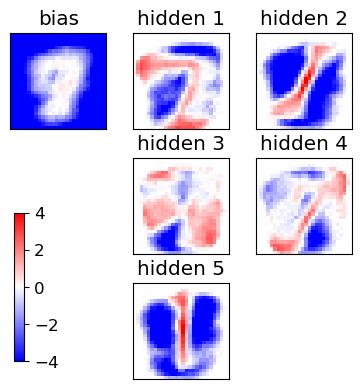

epoch 241 / 450  Nt: 4  N: 149  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 242 / 450  Nt: 4  N: 151  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 243 / 450  Nt: 4  N: 152  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 244 / 450  Nt: 4  N: 153  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 245 / 450  Nt: 4  N: 154  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 246 / 450  Nt: 4  N: 155  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 247 / 450  Nt: 4  N: 157  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 248 / 450  Nt: 4  N: 158  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 249 / 450  Nt: 4  N: 159  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 250 / 450  Nt: 4  N: 160  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 251 / 450  Nt: 4  N: 161  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 252 / 450  Nt: 4  N: 163  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

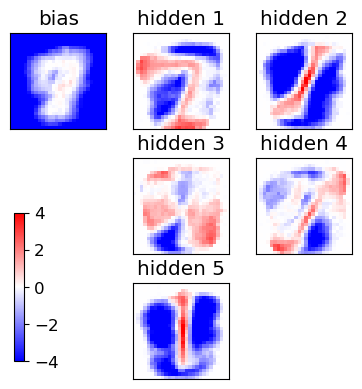

epoch 261 / 450  Nt: 4  N: 174  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 262 / 450  Nt: 4  N: 175  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 263 / 450  Nt: 4  N: 176  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 264 / 450  Nt: 4  N: 178  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 265 / 450  Nt: 4  N: 179  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 266 / 450  Nt: 4  N: 180  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 267 / 450  Nt: 4  N: 181  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 268 / 450  Nt: 4  N: 183  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 269 / 450  Nt: 4  N: 184  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 270 / 450  Nt: 4  N: 185  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 271 / 450  Nt: 4  N: 187  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 272 / 450  Nt: 4  N: 188  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

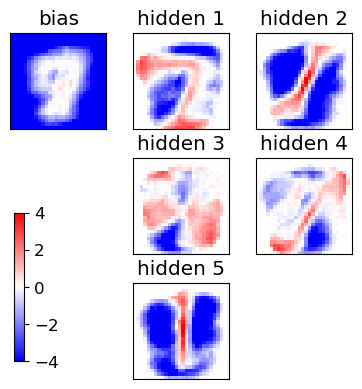

epoch 281 / 450  Nt: 4  N: 200  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 282 / 450  Nt: 4  N: 201  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 283 / 450  Nt: 4  N: 203  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 284 / 450  Nt: 4  N: 204  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 285 / 450  Nt: 4  N: 206  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 286 / 450  Nt: 4  N: 207  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 287 / 450  Nt: 4  N: 208  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 288 / 450  Nt: 4  N: 210  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 289 / 450  Nt: 4  N: 211  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 290 / 450  Nt: 4  N: 213  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 291 / 450  Nt: 4  N: 214  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 292 / 450  Nt: 4  N: 215  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

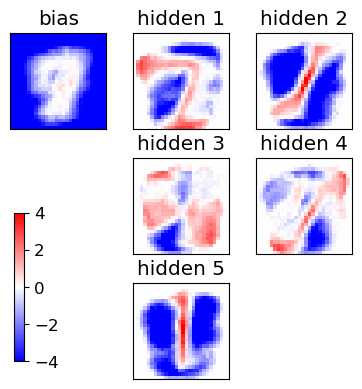

epoch 301 / 450  Nt: 4  N: 228  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 302 / 450  Nt: 4  N: 230  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 303 / 450  Nt: 4  N: 231  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 304 / 450  Nt: 4  N: 233  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 305 / 450  Nt: 4  N: 234  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 306 / 450  Nt: 4  N: 236  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 307 / 450  Nt: 4  N: 237  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 308 / 450  Nt: 4  N: 239  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 309 / 450  Nt: 4  N: 240  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 310 / 450  Nt: 4  N: 242  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 311 / 450  Nt: 4  N: 243  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 312 / 450  Nt: 4  N: 245  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

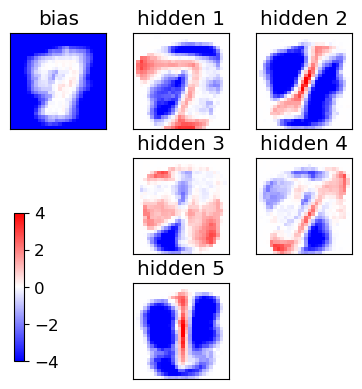

epoch 321 / 450  Nt: 4  N: 258  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 322 / 450  Nt: 4  N: 260  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 323 / 450  Nt: 4  N: 262  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 324 / 450  Nt: 4  N: 263  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 325 / 450  Nt: 4  N: 265  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 326 / 450  Nt: 4  N: 266  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 327 / 450  Nt: 4  N: 268  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 328 / 450  Nt: 4  N: 269  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 329 / 450  Nt: 4  N: 271  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 330 / 450  Nt: 4  N: 273  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 331 / 450  Nt: 4  N: 274  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 332 / 450  Nt: 4  N: 276  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

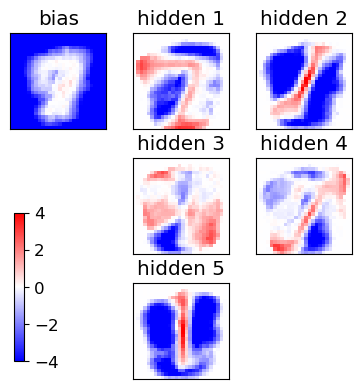

epoch 341 / 450  Nt: 4  N: 290  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 342 / 450  Nt: 4  N: 292  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 343 / 450  Nt: 4  N: 294  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 344 / 450  Nt: 4  N: 295  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 345 / 450  Nt: 4  N: 297  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 346 / 450  Nt: 4  N: 299  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 347 / 450  Nt: 4  N: 300  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 348 / 450  Nt: 4  N: 302  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 349 / 450  Nt: 4  N: 304  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 350 / 450  Nt: 4  N: 306  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 351 / 450  Nt: 4  N: 307  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 352 / 450  Nt: 4  N: 309  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

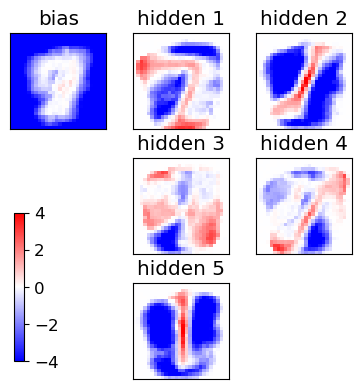

epoch 361 / 450  Nt: 4  N: 324  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 362 / 450  Nt: 4  N: 326  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 363 / 450  Nt: 4  N: 328  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 364 / 450  Nt: 4  N: 330  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 365 / 450  Nt: 4  N: 332  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 366 / 450  Nt: 4  N: 333  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 367 / 450  Nt: 4  N: 335  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 368 / 450  Nt: 4  N: 337  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 369 / 450  Nt: 4  N: 339  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 370 / 450  Nt: 4  N: 340  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 371 / 450  Nt: 4  N: 342  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 372 / 450  Nt: 4  N: 344  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

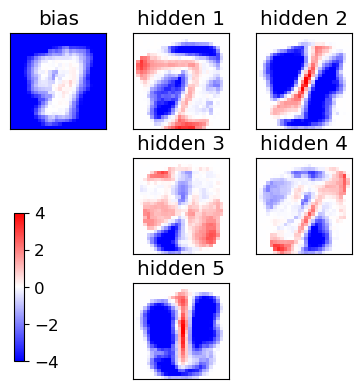

epoch 381 / 450  Nt: 4  N: 360  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 382 / 450  Nt: 4  N: 362  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 383 / 450  Nt: 4  N: 364  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 384 / 450  Nt: 4  N: 366  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 385 / 450  Nt: 4  N: 368  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 386 / 450  Nt: 4  N: 370  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 387 / 450  Nt: 4  N: 372  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 388 / 450  Nt: 4  N: 374  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 389 / 450  Nt: 4  N: 375  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 390 / 450  Nt: 4  N: 377  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 391 / 450  Nt: 4  N: 379  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 392 / 450  Nt: 4  N: 381  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

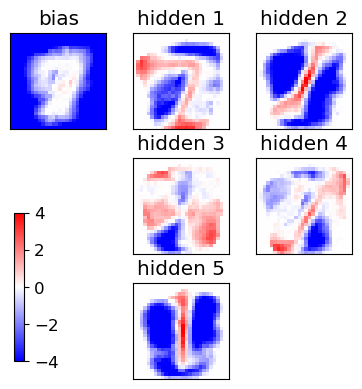

epoch 401 / 450  Nt: 4  N: 398  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 402 / 450  Nt: 4  N: 400  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 403 / 450  Nt: 4  N: 402  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 404 / 450  Nt: 4  N: 404  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 405 / 450  Nt: 4  N: 406  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 406 / 450  Nt: 4  N: 408  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 407 / 450  Nt: 4  N: 410  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 408 / 450  Nt: 4  N: 412  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 409 / 450  Nt: 4  N: 414  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 410 / 450  Nt: 4  N: 416  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 411 / 450  Nt: 4  N: 418  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 412 / 450  Nt: 4  N: 420  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

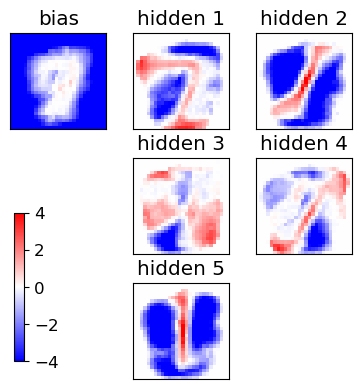

epoch 421 / 450  Nt: 4  N: 438  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 422 / 450  Nt: 4  N: 440  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 423 / 450  Nt: 4  N: 442  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 424 / 450  Nt: 4  N: 444  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 425 / 450  Nt: 4  N: 446  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 426 / 450  Nt: 4  N: 449  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 427 / 450  Nt: 4  N: 451  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 428 / 450  Nt: 4  N: 453  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 429 / 450  Nt: 4  N: 455  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 430 / 450  Nt: 4  N: 457  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 431 / 450  Nt: 4  N: 459  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 432 / 450  Nt: 4  N: 461  L: 5  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

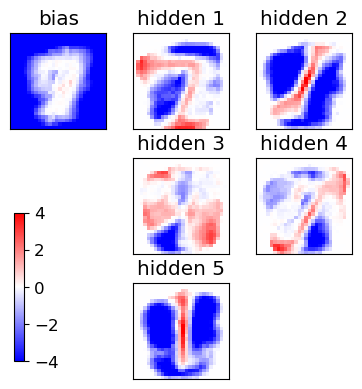

epoch 441 / 450  Nt: 4  N: 480  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 442 / 450  Nt: 4  N: 482  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 443 / 450  Nt: 4  N: 484  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 444 / 450  Nt: 4  N: 486  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 445 / 450  Nt: 4  N: 489  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 446 / 450  Nt: 4  N: 491  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 447 / 450  Nt: 4  N: 493  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 448 / 450  Nt: 4  N: 495  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 449 / 450  Nt: 4  N: 497  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 450 / 450  Nt: 4  N: 500  L: 5  rate: 0.05  gam: 0.01 SPINS= False POTTS= True


<Figure size 640x480 with 0 Axes>

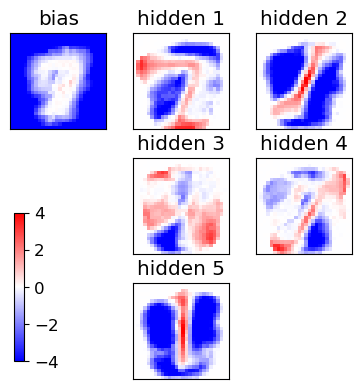

END of learning phase
Nepoch=450
Nmini=20


<Figure size 640x480 with 0 Axes>

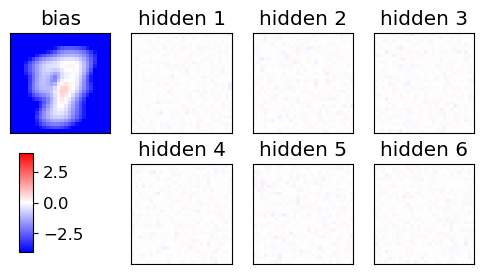

Starting the training, POTTS=True
[ 4581  7677  7655 11451  9261 18602 17191 16154  1883 11746]
[ 9110  3096  6820 11265 16615  2999  4315  4597 20355  7839]
[ 5722  7547  7157  1527   346 12486  4428 14594 19353 11247]
[ 5224 16739 12277 21874 11832  6583 13634  8801  9742  2885]
epoch 1 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 2 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 3 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 4 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 5 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 6 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 7 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 8 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 9 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

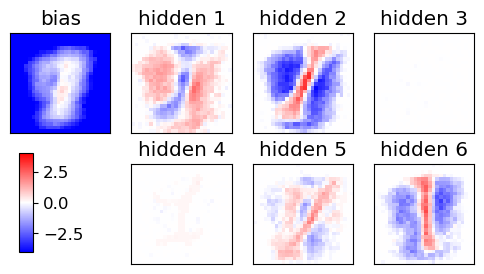

epoch 21 / 450  Nt: 4  N: 10  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 22 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 23 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 24 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 25 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 26 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 27 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 28 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 29 / 450  Nt: 4  N: 11  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 30 / 450  Nt: 4  N: 12  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 31 / 450  Nt: 4  N: 12  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 32 / 450  Nt: 4  N: 12  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

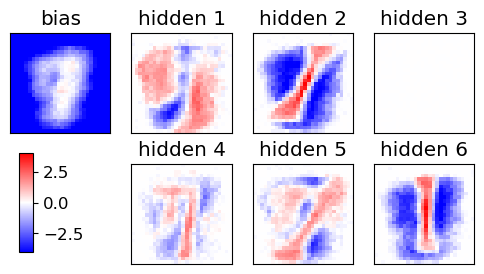

epoch 41 / 450  Nt: 4  N: 13  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 42 / 450  Nt: 4  N: 14  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 43 / 450  Nt: 4  N: 14  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 44 / 450  Nt: 4  N: 14  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 45 / 450  Nt: 4  N: 14  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 46 / 450  Nt: 4  N: 14  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 47 / 450  Nt: 4  N: 15  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 48 / 450  Nt: 4  N: 15  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 49 / 450  Nt: 4  N: 15  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 50 / 450  Nt: 4  N: 15  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 51 / 450  Nt: 4  N: 16  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 52 / 450  Nt: 4  N: 16  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

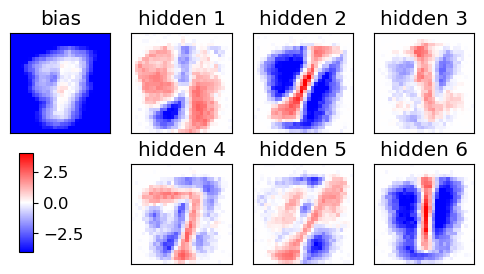

epoch 61 / 450  Nt: 4  N: 18  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 62 / 450  Nt: 4  N: 19  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 63 / 450  Nt: 4  N: 19  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 64 / 450  Nt: 4  N: 19  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 65 / 450  Nt: 4  N: 19  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 66 / 450  Nt: 4  N: 20  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 67 / 450  Nt: 4  N: 20  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 68 / 450  Nt: 4  N: 20  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 69 / 450  Nt: 4  N: 21  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 70 / 450  Nt: 4  N: 21  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 71 / 450  Nt: 4  N: 21  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 72 / 450  Nt: 4  N: 22  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

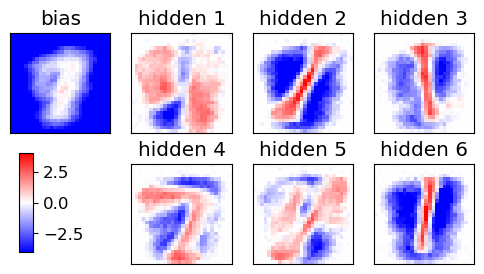

epoch 81 / 450  Nt: 4  N: 25  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 82 / 450  Nt: 4  N: 25  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 83 / 450  Nt: 4  N: 26  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 84 / 450  Nt: 4  N: 26  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 85 / 450  Nt: 4  N: 27  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 86 / 450  Nt: 4  N: 27  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 87 / 450  Nt: 4  N: 27  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 88 / 450  Nt: 4  N: 28  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 89 / 450  Nt: 4  N: 28  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 90 / 450  Nt: 4  N: 29  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 91 / 450  Nt: 4  N: 29  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 92 / 450  Nt: 4  N: 30  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

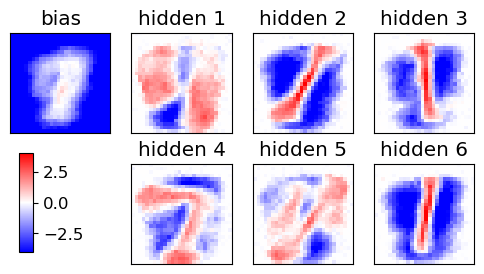

epoch 101 / 450  Nt: 4  N: 34  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 102 / 450  Nt: 4  N: 34  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 103 / 450  Nt: 4  N: 35  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 104 / 450  Nt: 4  N: 35  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 105 / 450  Nt: 4  N: 36  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 106 / 450  Nt: 4  N: 36  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 107 / 450  Nt: 4  N: 37  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 108 / 450  Nt: 4  N: 37  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 109 / 450  Nt: 4  N: 38  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 110 / 450  Nt: 4  N: 38  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 111 / 450  Nt: 4  N: 39  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 112 / 450  Nt: 4  N: 39  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

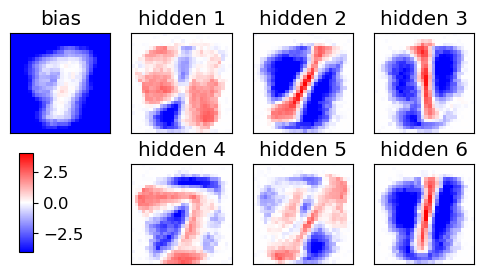

epoch 121 / 450  Nt: 4  N: 44  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 122 / 450  Nt: 4  N: 45  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 123 / 450  Nt: 4  N: 46  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 124 / 450  Nt: 4  N: 46  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 125 / 450  Nt: 4  N: 47  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 126 / 450  Nt: 4  N: 47  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 127 / 450  Nt: 4  N: 48  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 128 / 450  Nt: 4  N: 49  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 129 / 450  Nt: 4  N: 49  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 130 / 450  Nt: 4  N: 50  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 131 / 450  Nt: 4  N: 51  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 132 / 450  Nt: 4  N: 51  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

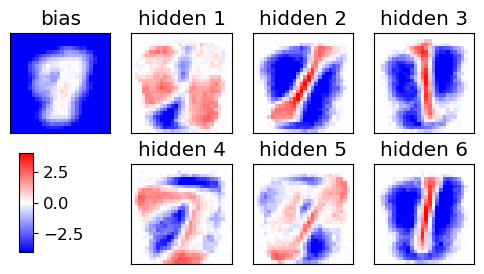

epoch 141 / 450  Nt: 4  N: 57  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 142 / 450  Nt: 4  N: 58  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 143 / 450  Nt: 4  N: 59  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 144 / 450  Nt: 4  N: 59  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 145 / 450  Nt: 4  N: 60  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 146 / 450  Nt: 4  N: 61  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 147 / 450  Nt: 4  N: 61  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 148 / 450  Nt: 4  N: 62  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 149 / 450  Nt: 4  N: 63  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 150 / 450  Nt: 4  N: 63  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 151 / 450  Nt: 4  N: 64  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 152 / 450  Nt: 4  N: 65  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

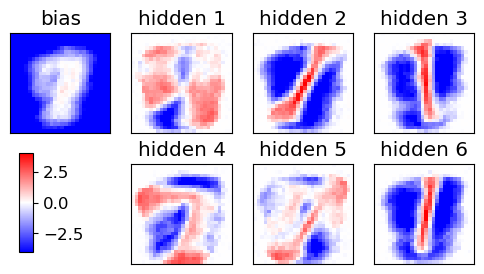

epoch 161 / 450  Nt: 4  N: 72  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 162 / 450  Nt: 4  N: 73  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 163 / 450  Nt: 4  N: 73  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 164 / 450  Nt: 4  N: 74  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 165 / 450  Nt: 4  N: 75  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 166 / 450  Nt: 4  N: 76  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 167 / 450  Nt: 4  N: 76  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 168 / 450  Nt: 4  N: 77  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 169 / 450  Nt: 4  N: 78  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 170 / 450  Nt: 4  N: 79  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 171 / 450  Nt: 4  N: 80  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 172 / 450  Nt: 4  N: 81  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

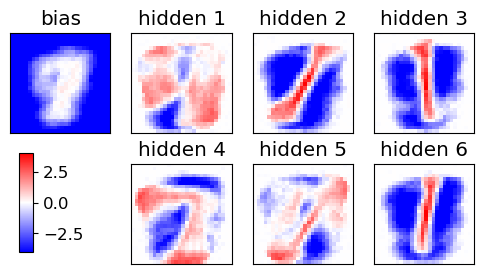

epoch 181 / 450  Nt: 4  N: 88  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 182 / 450  Nt: 4  N: 89  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 183 / 450  Nt: 4  N: 90  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 184 / 450  Nt: 4  N: 91  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 185 / 450  Nt: 4  N: 92  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 186 / 450  Nt: 4  N: 93  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 187 / 450  Nt: 4  N: 94  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 188 / 450  Nt: 4  N: 94  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 189 / 450  Nt: 4  N: 95  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 190 / 450  Nt: 4  N: 96  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 191 / 450  Nt: 4  N: 97  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 192 / 450  Nt: 4  N: 98  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

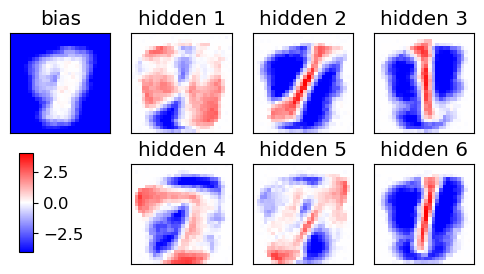

epoch 201 / 450  Nt: 4  N: 107  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 202 / 450  Nt: 4  N: 108  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 203 / 450  Nt: 4  N: 109  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 204 / 450  Nt: 4  N: 110  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 205 / 450  Nt: 4  N: 111  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 206 / 450  Nt: 4  N: 112  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 207 / 450  Nt: 4  N: 113  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 208 / 450  Nt: 4  N: 114  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 209 / 450  Nt: 4  N: 115  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 210 / 450  Nt: 4  N: 116  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 211 / 450  Nt: 4  N: 117  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 212 / 450  Nt: 4  N: 118  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

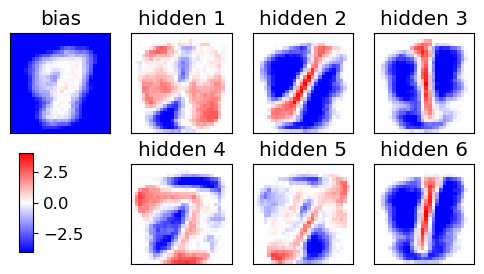

epoch 221 / 450  Nt: 4  N: 127  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 222 / 450  Nt: 4  N: 128  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 223 / 450  Nt: 4  N: 129  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 224 / 450  Nt: 4  N: 130  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 225 / 450  Nt: 4  N: 131  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 226 / 450  Nt: 4  N: 133  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 227 / 450  Nt: 4  N: 134  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 228 / 450  Nt: 4  N: 135  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 229 / 450  Nt: 4  N: 136  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 230 / 450  Nt: 4  N: 137  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 231 / 450  Nt: 4  N: 138  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 232 / 450  Nt: 4  N: 139  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

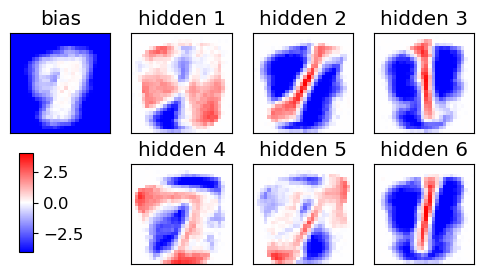

epoch 241 / 450  Nt: 4  N: 149  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 242 / 450  Nt: 4  N: 151  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 243 / 450  Nt: 4  N: 152  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 244 / 450  Nt: 4  N: 153  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 245 / 450  Nt: 4  N: 154  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 246 / 450  Nt: 4  N: 155  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 247 / 450  Nt: 4  N: 157  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 248 / 450  Nt: 4  N: 158  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 249 / 450  Nt: 4  N: 159  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 250 / 450  Nt: 4  N: 160  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 251 / 450  Nt: 4  N: 161  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 252 / 450  Nt: 4  N: 163  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

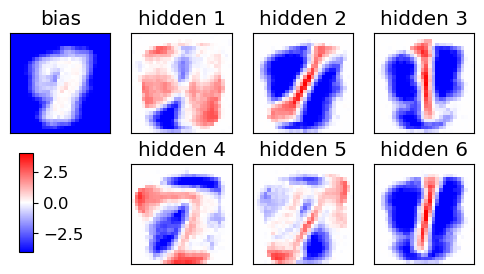

epoch 261 / 450  Nt: 4  N: 174  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 262 / 450  Nt: 4  N: 175  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 263 / 450  Nt: 4  N: 176  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 264 / 450  Nt: 4  N: 178  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 265 / 450  Nt: 4  N: 179  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 266 / 450  Nt: 4  N: 180  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 267 / 450  Nt: 4  N: 181  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 268 / 450  Nt: 4  N: 183  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 269 / 450  Nt: 4  N: 184  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 270 / 450  Nt: 4  N: 185  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 271 / 450  Nt: 4  N: 187  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 272 / 450  Nt: 4  N: 188  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

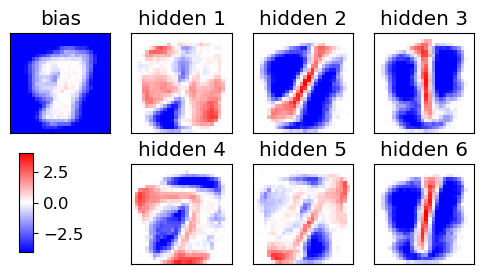

epoch 281 / 450  Nt: 4  N: 200  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 282 / 450  Nt: 4  N: 201  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 283 / 450  Nt: 4  N: 203  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 284 / 450  Nt: 4  N: 204  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 285 / 450  Nt: 4  N: 206  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 286 / 450  Nt: 4  N: 207  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 287 / 450  Nt: 4  N: 208  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 288 / 450  Nt: 4  N: 210  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 289 / 450  Nt: 4  N: 211  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 290 / 450  Nt: 4  N: 213  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 291 / 450  Nt: 4  N: 214  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 292 / 450  Nt: 4  N: 215  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

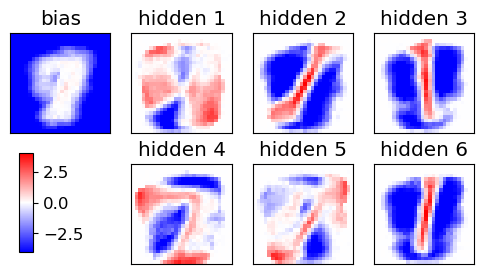

epoch 301 / 450  Nt: 4  N: 228  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 302 / 450  Nt: 4  N: 230  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 303 / 450  Nt: 4  N: 231  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 304 / 450  Nt: 4  N: 233  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 305 / 450  Nt: 4  N: 234  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 306 / 450  Nt: 4  N: 236  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 307 / 450  Nt: 4  N: 237  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 308 / 450  Nt: 4  N: 239  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 309 / 450  Nt: 4  N: 240  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 310 / 450  Nt: 4  N: 242  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 311 / 450  Nt: 4  N: 243  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 312 / 450  Nt: 4  N: 245  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

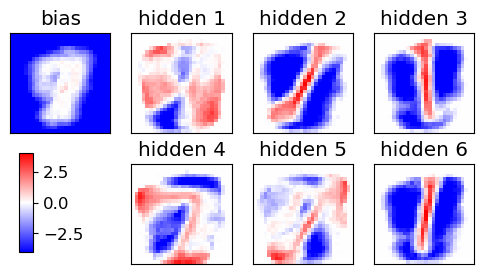

epoch 321 / 450  Nt: 4  N: 258  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 322 / 450  Nt: 4  N: 260  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 323 / 450  Nt: 4  N: 262  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 324 / 450  Nt: 4  N: 263  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 325 / 450  Nt: 4  N: 265  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 326 / 450  Nt: 4  N: 266  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 327 / 450  Nt: 4  N: 268  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 328 / 450  Nt: 4  N: 269  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 329 / 450  Nt: 4  N: 271  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 330 / 450  Nt: 4  N: 273  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 331 / 450  Nt: 4  N: 274  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 332 / 450  Nt: 4  N: 276  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

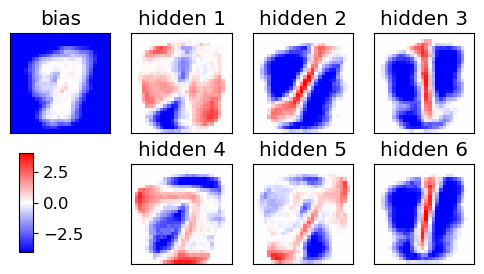

epoch 341 / 450  Nt: 4  N: 290  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 342 / 450  Nt: 4  N: 292  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 343 / 450  Nt: 4  N: 294  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 344 / 450  Nt: 4  N: 295  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 345 / 450  Nt: 4  N: 297  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 346 / 450  Nt: 4  N: 299  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 347 / 450  Nt: 4  N: 300  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 348 / 450  Nt: 4  N: 302  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 349 / 450  Nt: 4  N: 304  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 350 / 450  Nt: 4  N: 306  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 351 / 450  Nt: 4  N: 307  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 352 / 450  Nt: 4  N: 309  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

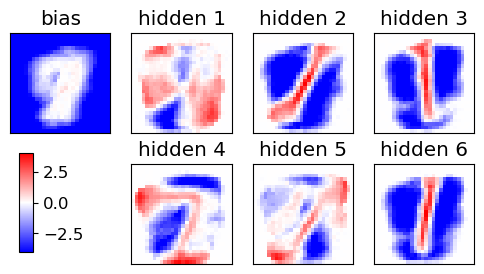

epoch 361 / 450  Nt: 4  N: 324  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 362 / 450  Nt: 4  N: 326  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 363 / 450  Nt: 4  N: 328  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 364 / 450  Nt: 4  N: 330  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 365 / 450  Nt: 4  N: 332  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 366 / 450  Nt: 4  N: 333  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 367 / 450  Nt: 4  N: 335  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 368 / 450  Nt: 4  N: 337  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 369 / 450  Nt: 4  N: 339  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 370 / 450  Nt: 4  N: 340  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 371 / 450  Nt: 4  N: 342  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 372 / 450  Nt: 4  N: 344  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

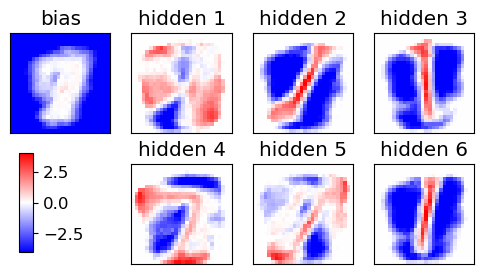

epoch 381 / 450  Nt: 4  N: 360  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 382 / 450  Nt: 4  N: 362  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 383 / 450  Nt: 4  N: 364  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 384 / 450  Nt: 4  N: 366  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 385 / 450  Nt: 4  N: 368  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 386 / 450  Nt: 4  N: 370  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 387 / 450  Nt: 4  N: 372  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 388 / 450  Nt: 4  N: 374  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 389 / 450  Nt: 4  N: 375  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 390 / 450  Nt: 4  N: 377  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 391 / 450  Nt: 4  N: 379  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 392 / 450  Nt: 4  N: 381  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

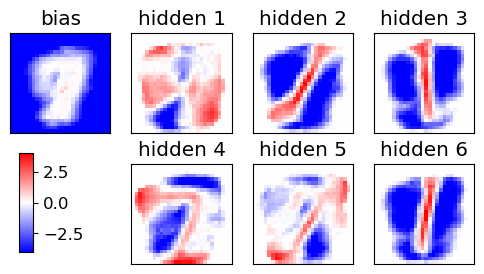

epoch 401 / 450  Nt: 4  N: 398  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 402 / 450  Nt: 4  N: 400  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 403 / 450  Nt: 4  N: 402  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 404 / 450  Nt: 4  N: 404  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 405 / 450  Nt: 4  N: 406  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 406 / 450  Nt: 4  N: 408  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 407 / 450  Nt: 4  N: 410  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 408 / 450  Nt: 4  N: 412  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 409 / 450  Nt: 4  N: 414  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 410 / 450  Nt: 4  N: 416  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 411 / 450  Nt: 4  N: 418  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 412 / 450  Nt: 4  N: 420  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

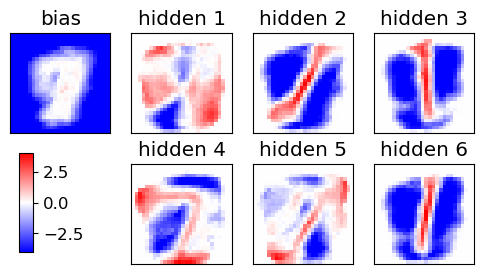

epoch 421 / 450  Nt: 4  N: 438  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 422 / 450  Nt: 4  N: 440  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 423 / 450  Nt: 4  N: 442  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 424 / 450  Nt: 4  N: 444  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 425 / 450  Nt: 4  N: 446  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 426 / 450  Nt: 4  N: 449  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 427 / 450  Nt: 4  N: 451  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 428 / 450  Nt: 4  N: 453  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 429 / 450  Nt: 4  N: 455  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 430 / 450  Nt: 4  N: 457  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 431 / 450  Nt: 4  N: 459  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 432 / 450  Nt: 4  N: 461  L: 6  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

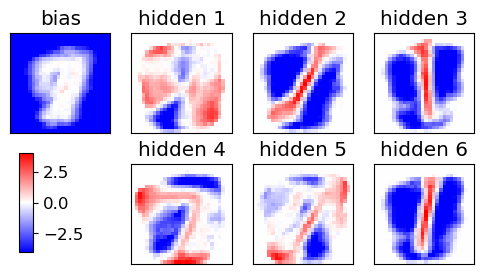

epoch 441 / 450  Nt: 4  N: 480  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 442 / 450  Nt: 4  N: 482  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 443 / 450  Nt: 4  N: 484  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 444 / 450  Nt: 4  N: 486  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 445 / 450  Nt: 4  N: 489  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 446 / 450  Nt: 4  N: 491  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 447 / 450  Nt: 4  N: 493  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 448 / 450  Nt: 4  N: 495  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 449 / 450  Nt: 4  N: 497  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 450 / 450  Nt: 4  N: 500  L: 6  rate: 0.05  gam: 0.01 SPINS= False POTTS= True


<Figure size 640x480 with 0 Axes>

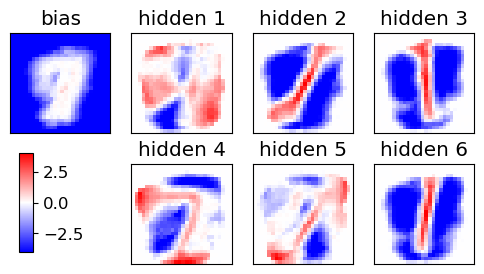

END of learning phase
Nepoch=450
Nmini=20


<Figure size 640x480 with 0 Axes>

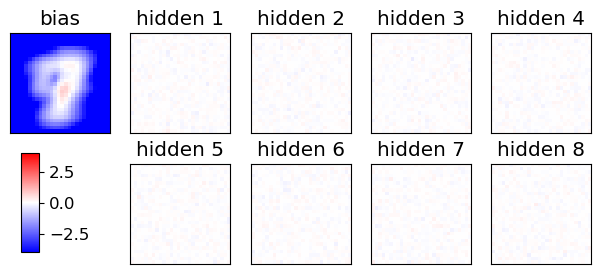

Starting the training, POTTS=True
[11846 19255   670 14978 13771 19322  6080 21876 20102  1334]
[  115 21656 17753  4770  9761 11435 15045 13373 15351  1341]
[11097 12326 20981  9282  4501 18917 16942 21952 13648 15396]
[  774  4146  8013 17979  6406 19162 16411 10355 15939  9116]
epoch 1 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 2 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 3 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 4 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 5 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 6 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 7 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 8 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 9 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

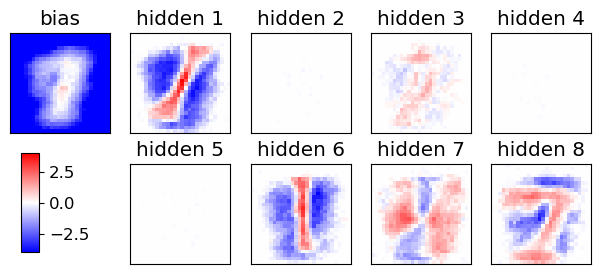

epoch 21 / 450  Nt: 4  N: 10  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 22 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 23 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 24 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 25 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 26 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 27 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 28 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 29 / 450  Nt: 4  N: 11  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 30 / 450  Nt: 4  N: 12  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 31 / 450  Nt: 4  N: 12  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 32 / 450  Nt: 4  N: 12  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

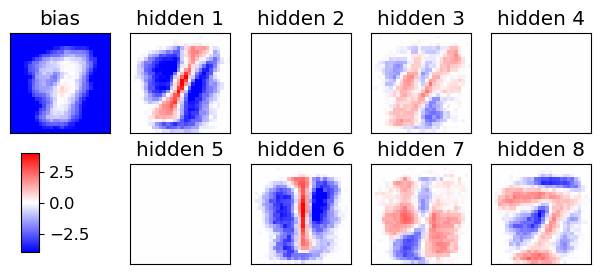

epoch 41 / 450  Nt: 4  N: 13  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 42 / 450  Nt: 4  N: 14  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 43 / 450  Nt: 4  N: 14  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 44 / 450  Nt: 4  N: 14  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 45 / 450  Nt: 4  N: 14  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 46 / 450  Nt: 4  N: 14  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 47 / 450  Nt: 4  N: 15  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 48 / 450  Nt: 4  N: 15  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 49 / 450  Nt: 4  N: 15  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 50 / 450  Nt: 4  N: 15  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 51 / 450  Nt: 4  N: 16  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 52 / 450  Nt: 4  N: 16  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

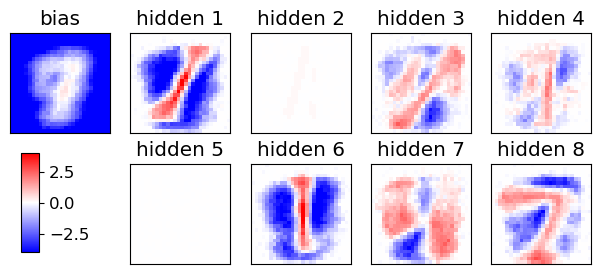

epoch 61 / 450  Nt: 4  N: 18  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 62 / 450  Nt: 4  N: 19  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 63 / 450  Nt: 4  N: 19  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 64 / 450  Nt: 4  N: 19  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 65 / 450  Nt: 4  N: 19  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 66 / 450  Nt: 4  N: 20  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 67 / 450  Nt: 4  N: 20  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 68 / 450  Nt: 4  N: 20  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 69 / 450  Nt: 4  N: 21  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 70 / 450  Nt: 4  N: 21  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 71 / 450  Nt: 4  N: 21  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 72 / 450  Nt: 4  N: 22  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

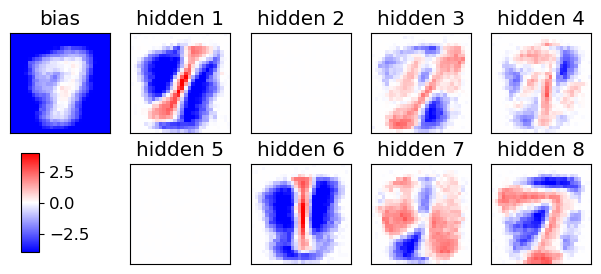

epoch 81 / 450  Nt: 4  N: 25  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 82 / 450  Nt: 4  N: 25  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 83 / 450  Nt: 4  N: 26  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 84 / 450  Nt: 4  N: 26  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 85 / 450  Nt: 4  N: 27  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 86 / 450  Nt: 4  N: 27  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 87 / 450  Nt: 4  N: 27  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 88 / 450  Nt: 4  N: 28  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 89 / 450  Nt: 4  N: 28  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 90 / 450  Nt: 4  N: 29  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 91 / 450  Nt: 4  N: 29  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 92 / 450  Nt: 4  N: 30  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoc

<Figure size 640x480 with 0 Axes>

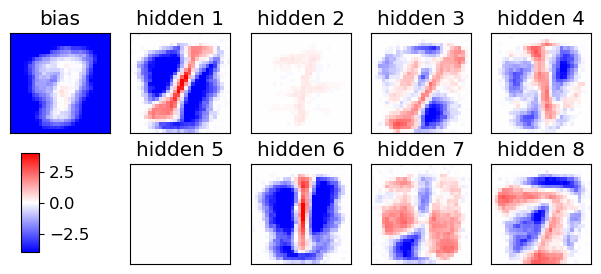

epoch 101 / 450  Nt: 4  N: 34  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 102 / 450  Nt: 4  N: 34  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 103 / 450  Nt: 4  N: 35  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 104 / 450  Nt: 4  N: 35  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 105 / 450  Nt: 4  N: 36  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 106 / 450  Nt: 4  N: 36  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 107 / 450  Nt: 4  N: 37  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 108 / 450  Nt: 4  N: 37  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 109 / 450  Nt: 4  N: 38  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 110 / 450  Nt: 4  N: 38  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 111 / 450  Nt: 4  N: 39  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 112 / 450  Nt: 4  N: 39  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

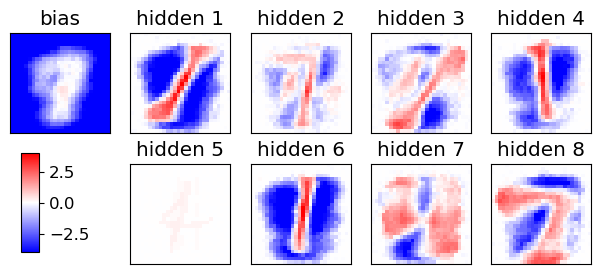

epoch 121 / 450  Nt: 4  N: 44  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 122 / 450  Nt: 4  N: 45  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 123 / 450  Nt: 4  N: 46  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 124 / 450  Nt: 4  N: 46  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 125 / 450  Nt: 4  N: 47  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 126 / 450  Nt: 4  N: 47  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 127 / 450  Nt: 4  N: 48  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 128 / 450  Nt: 4  N: 49  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 129 / 450  Nt: 4  N: 49  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 130 / 450  Nt: 4  N: 50  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 131 / 450  Nt: 4  N: 51  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 132 / 450  Nt: 4  N: 51  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

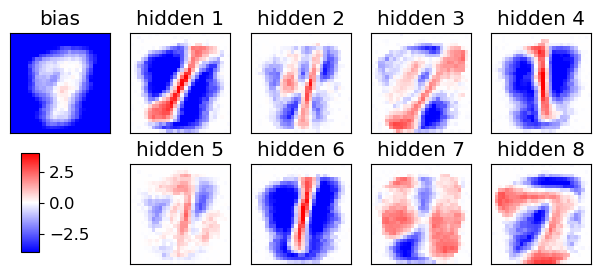

epoch 141 / 450  Nt: 4  N: 57  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 142 / 450  Nt: 4  N: 58  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 143 / 450  Nt: 4  N: 59  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 144 / 450  Nt: 4  N: 59  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 145 / 450  Nt: 4  N: 60  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 146 / 450  Nt: 4  N: 61  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 147 / 450  Nt: 4  N: 61  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 148 / 450  Nt: 4  N: 62  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 149 / 450  Nt: 4  N: 63  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 150 / 450  Nt: 4  N: 63  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 151 / 450  Nt: 4  N: 64  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 152 / 450  Nt: 4  N: 65  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

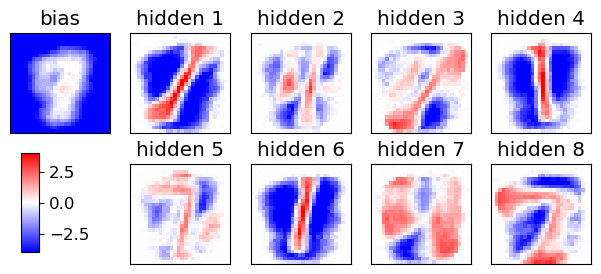

epoch 161 / 450  Nt: 4  N: 72  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 162 / 450  Nt: 4  N: 73  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 163 / 450  Nt: 4  N: 73  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 164 / 450  Nt: 4  N: 74  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 165 / 450  Nt: 4  N: 75  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 166 / 450  Nt: 4  N: 76  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 167 / 450  Nt: 4  N: 76  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 168 / 450  Nt: 4  N: 77  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 169 / 450  Nt: 4  N: 78  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 170 / 450  Nt: 4  N: 79  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 171 / 450  Nt: 4  N: 80  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 172 / 450  Nt: 4  N: 81  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

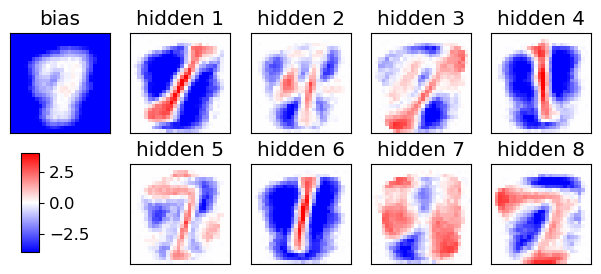

epoch 181 / 450  Nt: 4  N: 88  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 182 / 450  Nt: 4  N: 89  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 183 / 450  Nt: 4  N: 90  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 184 / 450  Nt: 4  N: 91  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 185 / 450  Nt: 4  N: 92  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 186 / 450  Nt: 4  N: 93  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 187 / 450  Nt: 4  N: 94  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 188 / 450  Nt: 4  N: 94  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 189 / 450  Nt: 4  N: 95  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 190 / 450  Nt: 4  N: 96  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 191 / 450  Nt: 4  N: 97  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 192 / 450  Nt: 4  N: 98  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

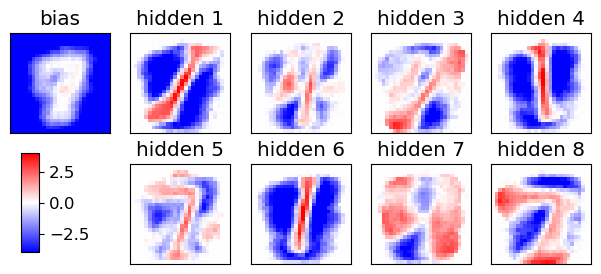

epoch 201 / 450  Nt: 4  N: 107  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 202 / 450  Nt: 4  N: 108  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 203 / 450  Nt: 4  N: 109  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 204 / 450  Nt: 4  N: 110  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 205 / 450  Nt: 4  N: 111  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 206 / 450  Nt: 4  N: 112  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 207 / 450  Nt: 4  N: 113  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 208 / 450  Nt: 4  N: 114  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 209 / 450  Nt: 4  N: 115  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 210 / 450  Nt: 4  N: 116  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 211 / 450  Nt: 4  N: 117  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 212 / 450  Nt: 4  N: 118  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

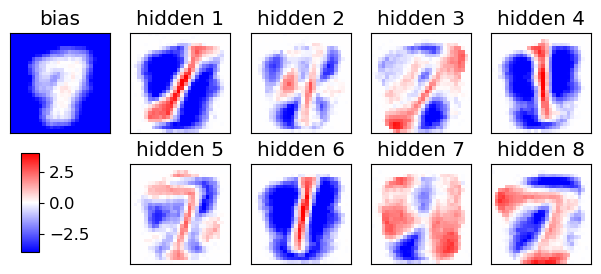

epoch 221 / 450  Nt: 4  N: 127  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 222 / 450  Nt: 4  N: 128  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 223 / 450  Nt: 4  N: 129  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 224 / 450  Nt: 4  N: 130  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 225 / 450  Nt: 4  N: 131  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 226 / 450  Nt: 4  N: 133  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 227 / 450  Nt: 4  N: 134  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 228 / 450  Nt: 4  N: 135  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 229 / 450  Nt: 4  N: 136  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 230 / 450  Nt: 4  N: 137  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 231 / 450  Nt: 4  N: 138  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 232 / 450  Nt: 4  N: 139  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

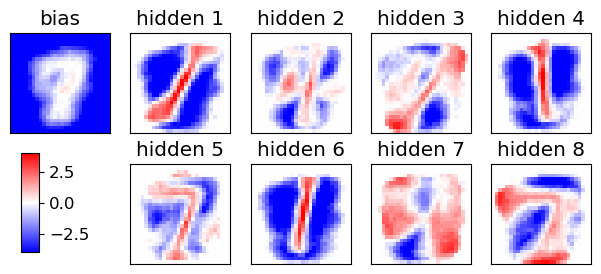

epoch 241 / 450  Nt: 4  N: 149  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 242 / 450  Nt: 4  N: 151  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 243 / 450  Nt: 4  N: 152  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 244 / 450  Nt: 4  N: 153  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 245 / 450  Nt: 4  N: 154  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 246 / 450  Nt: 4  N: 155  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 247 / 450  Nt: 4  N: 157  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 248 / 450  Nt: 4  N: 158  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 249 / 450  Nt: 4  N: 159  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 250 / 450  Nt: 4  N: 160  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 251 / 450  Nt: 4  N: 161  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 252 / 450  Nt: 4  N: 163  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

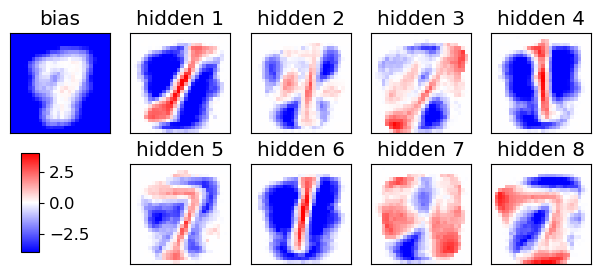

epoch 261 / 450  Nt: 4  N: 174  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 262 / 450  Nt: 4  N: 175  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 263 / 450  Nt: 4  N: 176  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 264 / 450  Nt: 4  N: 178  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 265 / 450  Nt: 4  N: 179  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 266 / 450  Nt: 4  N: 180  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 267 / 450  Nt: 4  N: 181  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 268 / 450  Nt: 4  N: 183  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 269 / 450  Nt: 4  N: 184  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 270 / 450  Nt: 4  N: 185  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 271 / 450  Nt: 4  N: 187  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 272 / 450  Nt: 4  N: 188  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

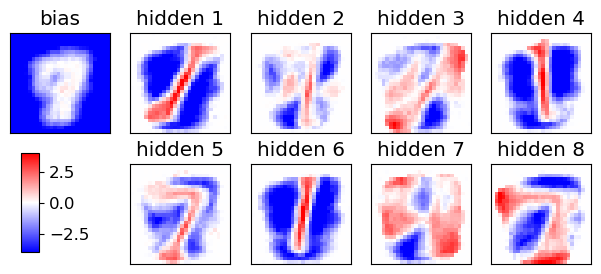

epoch 281 / 450  Nt: 4  N: 200  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 282 / 450  Nt: 4  N: 201  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 283 / 450  Nt: 4  N: 203  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 284 / 450  Nt: 4  N: 204  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 285 / 450  Nt: 4  N: 206  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 286 / 450  Nt: 4  N: 207  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 287 / 450  Nt: 4  N: 208  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 288 / 450  Nt: 4  N: 210  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 289 / 450  Nt: 4  N: 211  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 290 / 450  Nt: 4  N: 213  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 291 / 450  Nt: 4  N: 214  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 292 / 450  Nt: 4  N: 215  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

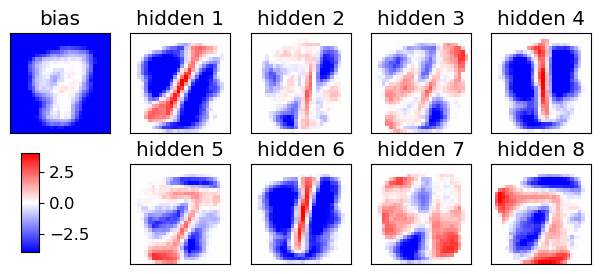

epoch 301 / 450  Nt: 4  N: 228  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 302 / 450  Nt: 4  N: 230  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 303 / 450  Nt: 4  N: 231  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 304 / 450  Nt: 4  N: 233  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 305 / 450  Nt: 4  N: 234  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 306 / 450  Nt: 4  N: 236  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 307 / 450  Nt: 4  N: 237  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 308 / 450  Nt: 4  N: 239  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 309 / 450  Nt: 4  N: 240  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 310 / 450  Nt: 4  N: 242  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 311 / 450  Nt: 4  N: 243  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 312 / 450  Nt: 4  N: 245  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

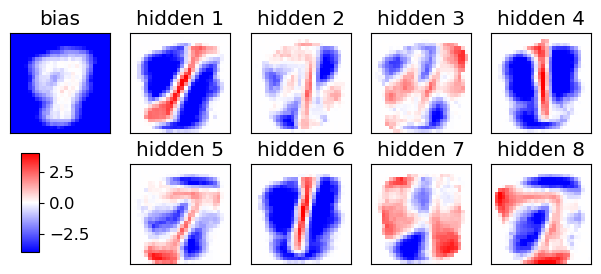

epoch 321 / 450  Nt: 4  N: 258  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 322 / 450  Nt: 4  N: 260  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 323 / 450  Nt: 4  N: 262  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 324 / 450  Nt: 4  N: 263  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 325 / 450  Nt: 4  N: 265  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 326 / 450  Nt: 4  N: 266  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 327 / 450  Nt: 4  N: 268  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 328 / 450  Nt: 4  N: 269  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 329 / 450  Nt: 4  N: 271  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 330 / 450  Nt: 4  N: 273  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 331 / 450  Nt: 4  N: 274  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 332 / 450  Nt: 4  N: 276  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

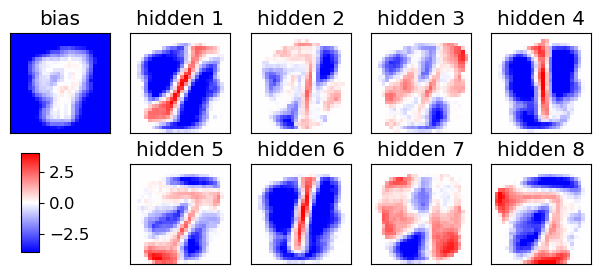

epoch 341 / 450  Nt: 4  N: 290  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 342 / 450  Nt: 4  N: 292  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 343 / 450  Nt: 4  N: 294  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 344 / 450  Nt: 4  N: 295  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 345 / 450  Nt: 4  N: 297  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 346 / 450  Nt: 4  N: 299  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 347 / 450  Nt: 4  N: 300  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 348 / 450  Nt: 4  N: 302  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 349 / 450  Nt: 4  N: 304  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 350 / 450  Nt: 4  N: 306  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 351 / 450  Nt: 4  N: 307  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 352 / 450  Nt: 4  N: 309  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

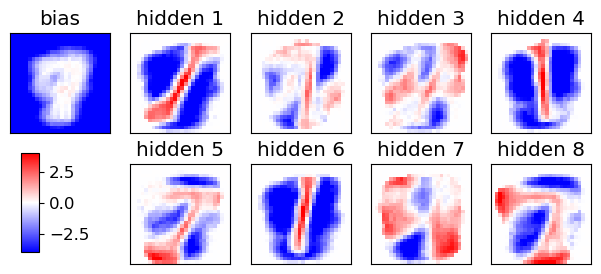

epoch 361 / 450  Nt: 4  N: 324  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 362 / 450  Nt: 4  N: 326  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 363 / 450  Nt: 4  N: 328  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 364 / 450  Nt: 4  N: 330  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 365 / 450  Nt: 4  N: 332  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 366 / 450  Nt: 4  N: 333  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 367 / 450  Nt: 4  N: 335  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 368 / 450  Nt: 4  N: 337  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 369 / 450  Nt: 4  N: 339  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 370 / 450  Nt: 4  N: 340  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 371 / 450  Nt: 4  N: 342  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 372 / 450  Nt: 4  N: 344  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

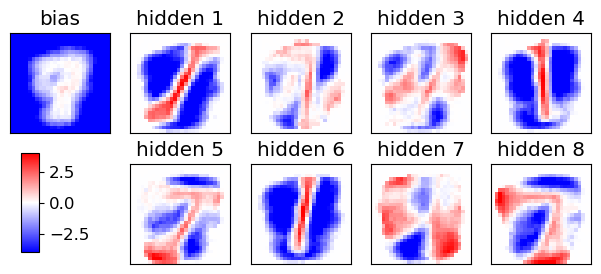

epoch 381 / 450  Nt: 4  N: 360  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 382 / 450  Nt: 4  N: 362  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 383 / 450  Nt: 4  N: 364  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 384 / 450  Nt: 4  N: 366  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 385 / 450  Nt: 4  N: 368  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 386 / 450  Nt: 4  N: 370  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 387 / 450  Nt: 4  N: 372  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 388 / 450  Nt: 4  N: 374  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 389 / 450  Nt: 4  N: 375  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 390 / 450  Nt: 4  N: 377  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 391 / 450  Nt: 4  N: 379  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 392 / 450  Nt: 4  N: 381  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

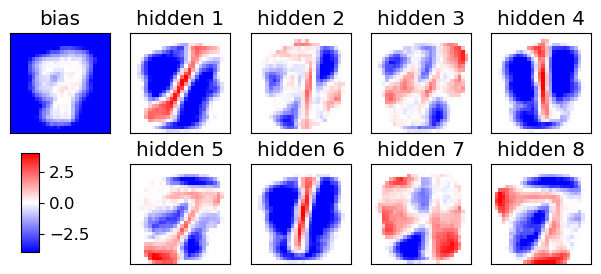

epoch 401 / 450  Nt: 4  N: 398  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 402 / 450  Nt: 4  N: 400  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 403 / 450  Nt: 4  N: 402  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 404 / 450  Nt: 4  N: 404  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 405 / 450  Nt: 4  N: 406  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 406 / 450  Nt: 4  N: 408  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 407 / 450  Nt: 4  N: 410  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 408 / 450  Nt: 4  N: 412  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 409 / 450  Nt: 4  N: 414  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 410 / 450  Nt: 4  N: 416  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 411 / 450  Nt: 4  N: 418  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 412 / 450  Nt: 4  N: 420  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

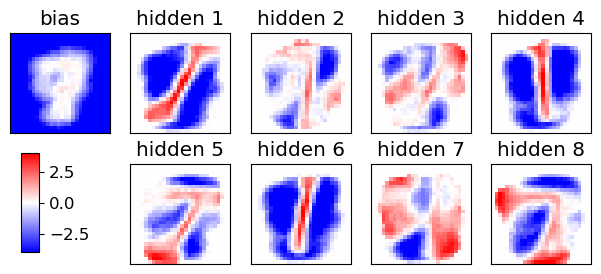

epoch 421 / 450  Nt: 4  N: 438  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 422 / 450  Nt: 4  N: 440  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 423 / 450  Nt: 4  N: 442  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 424 / 450  Nt: 4  N: 444  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 425 / 450  Nt: 4  N: 446  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 426 / 450  Nt: 4  N: 449  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 427 / 450  Nt: 4  N: 451  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 428 / 450  Nt: 4  N: 453  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 429 / 450  Nt: 4  N: 455  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 430 / 450  Nt: 4  N: 457  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 431 / 450  Nt: 4  N: 459  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 432 / 450  Nt: 4  N: 461  L: 8  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

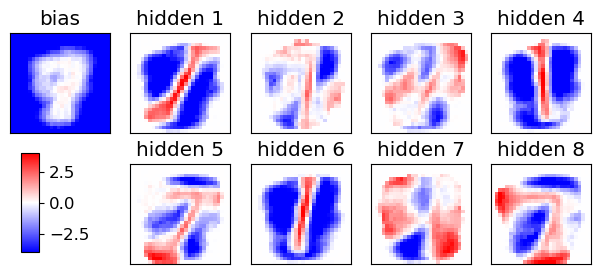

epoch 441 / 450  Nt: 4  N: 480  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 442 / 450  Nt: 4  N: 482  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 443 / 450  Nt: 4  N: 484  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 444 / 450  Nt: 4  N: 486  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 445 / 450  Nt: 4  N: 489  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 446 / 450  Nt: 4  N: 491  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 447 / 450  Nt: 4  N: 493  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 448 / 450  Nt: 4  N: 495  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 449 / 450  Nt: 4  N: 497  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 450 / 450  Nt: 4  N: 500  L: 8  rate: 0.05  gam: 0.01 SPINS= False POTTS= True


<Figure size 640x480 with 0 Axes>

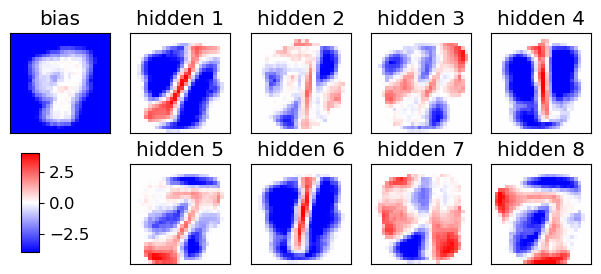

END of learning phase
Nepoch=450
Nmini=20


<Figure size 640x480 with 0 Axes>

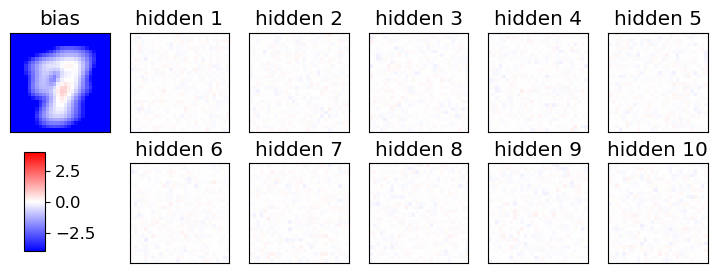

Starting the training, POTTS=True
[ 5134  4137 10674 17701 18937 20823 17763 15946 13635  8566]
[17152  8805 12479 20164 19970  3670 17454  1874 18919 10925]
[19116 20397 20822 10510  5081  4239 16952  5969  8742  1692]
[10881  6824 18691  5144 20497  3428  8915  6987 10769   149]
epoch 1 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 2 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 3 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 4 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 5 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 6 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 7 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 8 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 9 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0

<Figure size 640x480 with 0 Axes>

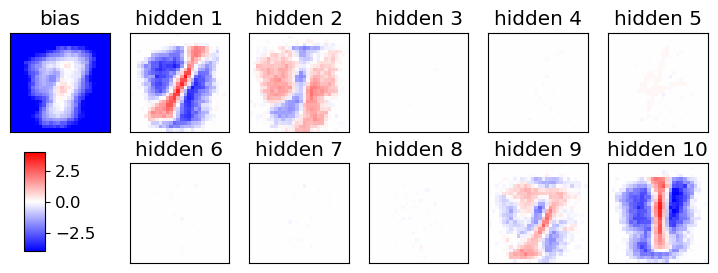

epoch 21 / 450  Nt: 4  N: 10  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 22 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 23 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 24 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 25 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 26 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 27 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 28 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 29 / 450  Nt: 4  N: 11  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 30 / 450  Nt: 4  N: 12  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 31 / 450  Nt: 4  N: 12  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 32 / 450  Nt: 4  N: 12  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

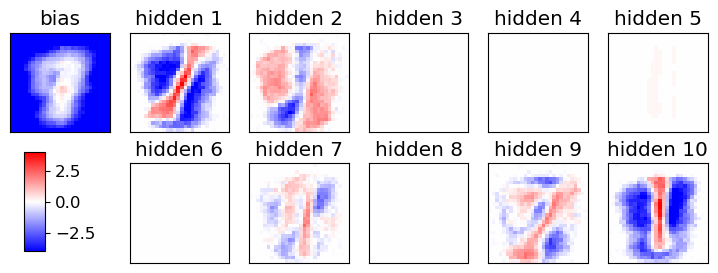

epoch 41 / 450  Nt: 4  N: 13  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 42 / 450  Nt: 4  N: 14  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 43 / 450  Nt: 4  N: 14  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 44 / 450  Nt: 4  N: 14  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 45 / 450  Nt: 4  N: 14  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 46 / 450  Nt: 4  N: 14  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 47 / 450  Nt: 4  N: 15  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 48 / 450  Nt: 4  N: 15  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 49 / 450  Nt: 4  N: 15  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 50 / 450  Nt: 4  N: 15  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 51 / 450  Nt: 4  N: 16  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 52 / 450  Nt: 4  N: 16  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

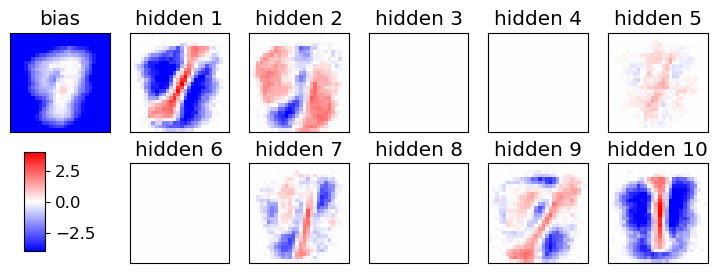

epoch 61 / 450  Nt: 4  N: 18  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 62 / 450  Nt: 4  N: 19  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 63 / 450  Nt: 4  N: 19  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 64 / 450  Nt: 4  N: 19  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 65 / 450  Nt: 4  N: 19  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 66 / 450  Nt: 4  N: 20  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 67 / 450  Nt: 4  N: 20  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 68 / 450  Nt: 4  N: 20  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 69 / 450  Nt: 4  N: 21  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 70 / 450  Nt: 4  N: 21  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 71 / 450  Nt: 4  N: 21  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 72 / 450  Nt: 4  N: 22  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

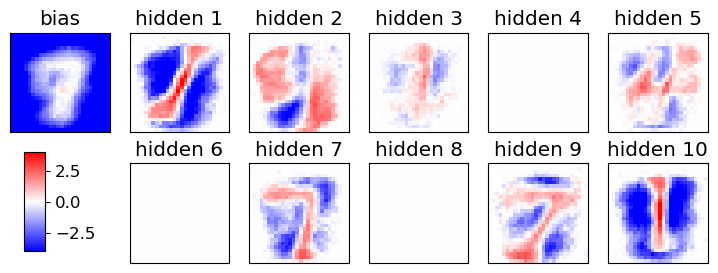

epoch 81 / 450  Nt: 4  N: 25  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 82 / 450  Nt: 4  N: 25  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 83 / 450  Nt: 4  N: 26  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 84 / 450  Nt: 4  N: 26  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 85 / 450  Nt: 4  N: 27  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 86 / 450  Nt: 4  N: 27  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 87 / 450  Nt: 4  N: 27  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 88 / 450  Nt: 4  N: 28  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 89 / 450  Nt: 4  N: 28  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 90 / 450  Nt: 4  N: 29  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 91 / 450  Nt: 4  N: 29  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 92 / 450  Nt: 4  N: 30  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTT

<Figure size 640x480 with 0 Axes>

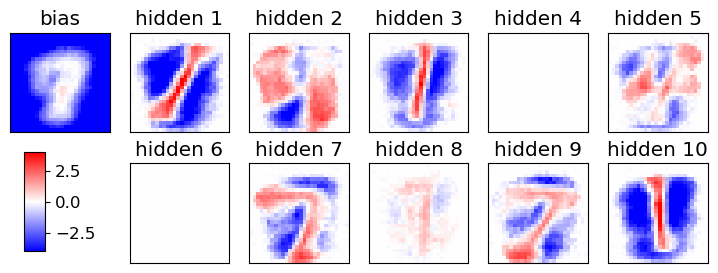

epoch 101 / 450  Nt: 4  N: 34  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 102 / 450  Nt: 4  N: 34  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 103 / 450  Nt: 4  N: 35  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 104 / 450  Nt: 4  N: 35  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 105 / 450  Nt: 4  N: 36  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 106 / 450  Nt: 4  N: 36  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 107 / 450  Nt: 4  N: 37  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 108 / 450  Nt: 4  N: 37  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 109 / 450  Nt: 4  N: 38  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 110 / 450  Nt: 4  N: 38  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 111 / 450  Nt: 4  N: 39  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 112 / 450  Nt: 4  N: 39  L: 10  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

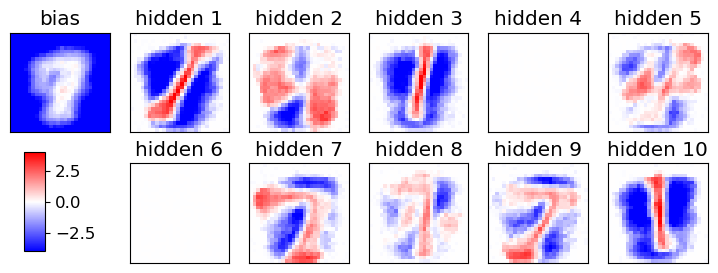

epoch 121 / 450  Nt: 4  N: 44  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 122 / 450  Nt: 4  N: 45  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 123 / 450  Nt: 4  N: 46  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 124 / 450  Nt: 4  N: 46  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 125 / 450  Nt: 4  N: 47  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 126 / 450  Nt: 4  N: 47  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 127 / 450  Nt: 4  N: 48  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 128 / 450  Nt: 4  N: 49  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 129 / 450  Nt: 4  N: 49  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 130 / 450  Nt: 4  N: 50  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 131 / 450  Nt: 4  N: 51  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 132 / 450  Nt: 4  N: 51  L: 10  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

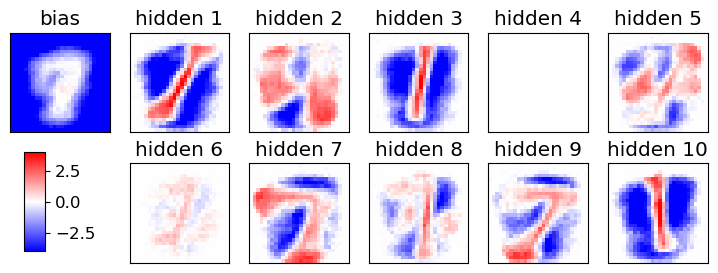

epoch 141 / 450  Nt: 4  N: 57  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 142 / 450  Nt: 4  N: 58  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 143 / 450  Nt: 4  N: 59  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 144 / 450  Nt: 4  N: 59  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 145 / 450  Nt: 4  N: 60  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 146 / 450  Nt: 4  N: 61  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 147 / 450  Nt: 4  N: 61  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 148 / 450  Nt: 4  N: 62  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 149 / 450  Nt: 4  N: 63  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 150 / 450  Nt: 4  N: 63  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 151 / 450  Nt: 4  N: 64  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 152 / 450  Nt: 4  N: 65  L: 10  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

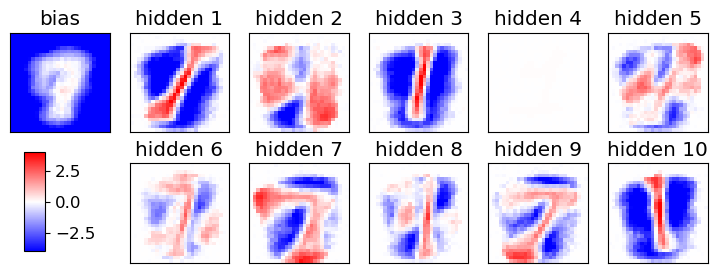

epoch 161 / 450  Nt: 4  N: 72  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 162 / 450  Nt: 4  N: 73  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 163 / 450  Nt: 4  N: 73  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 164 / 450  Nt: 4  N: 74  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 165 / 450  Nt: 4  N: 75  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 166 / 450  Nt: 4  N: 76  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 167 / 450  Nt: 4  N: 76  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 168 / 450  Nt: 4  N: 77  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 169 / 450  Nt: 4  N: 78  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 170 / 450  Nt: 4  N: 79  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 171 / 450  Nt: 4  N: 80  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 172 / 450  Nt: 4  N: 81  L: 10  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

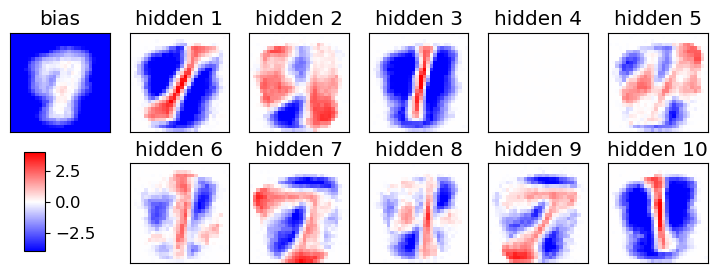

epoch 181 / 450  Nt: 4  N: 88  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 182 / 450  Nt: 4  N: 89  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 183 / 450  Nt: 4  N: 90  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 184 / 450  Nt: 4  N: 91  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 185 / 450  Nt: 4  N: 92  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 186 / 450  Nt: 4  N: 93  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 187 / 450  Nt: 4  N: 94  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 188 / 450  Nt: 4  N: 94  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 189 / 450  Nt: 4  N: 95  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 190 / 450  Nt: 4  N: 96  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 191 / 450  Nt: 4  N: 97  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 192 / 450  Nt: 4  N: 98  L: 10  rate: 0.05  gam: 0.01 SPINS

<Figure size 640x480 with 0 Axes>

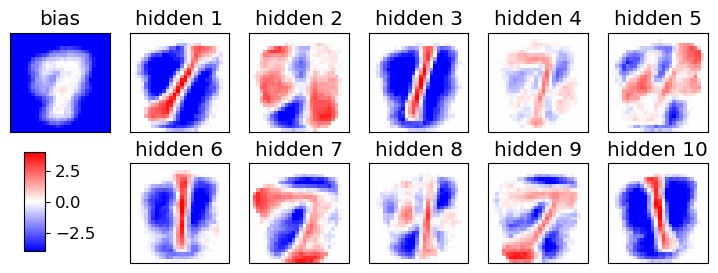

epoch 201 / 450  Nt: 4  N: 107  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 202 / 450  Nt: 4  N: 108  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 203 / 450  Nt: 4  N: 109  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 204 / 450  Nt: 4  N: 110  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 205 / 450  Nt: 4  N: 111  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 206 / 450  Nt: 4  N: 112  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 207 / 450  Nt: 4  N: 113  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 208 / 450  Nt: 4  N: 114  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 209 / 450  Nt: 4  N: 115  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 210 / 450  Nt: 4  N: 116  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 211 / 450  Nt: 4  N: 117  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 212 / 450  Nt: 4  N: 118  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

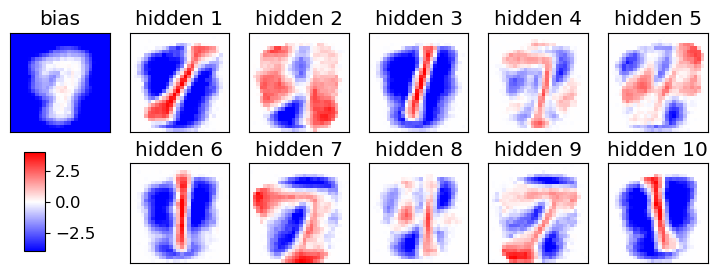

epoch 221 / 450  Nt: 4  N: 127  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 222 / 450  Nt: 4  N: 128  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 223 / 450  Nt: 4  N: 129  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 224 / 450  Nt: 4  N: 130  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 225 / 450  Nt: 4  N: 131  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 226 / 450  Nt: 4  N: 133  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 227 / 450  Nt: 4  N: 134  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 228 / 450  Nt: 4  N: 135  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 229 / 450  Nt: 4  N: 136  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 230 / 450  Nt: 4  N: 137  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 231 / 450  Nt: 4  N: 138  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 232 / 450  Nt: 4  N: 139  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

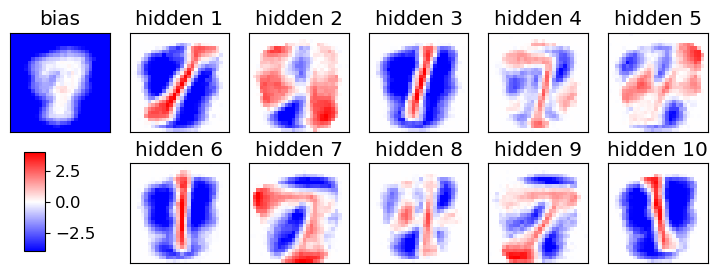

epoch 241 / 450  Nt: 4  N: 149  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 242 / 450  Nt: 4  N: 151  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 243 / 450  Nt: 4  N: 152  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 244 / 450  Nt: 4  N: 153  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 245 / 450  Nt: 4  N: 154  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 246 / 450  Nt: 4  N: 155  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 247 / 450  Nt: 4  N: 157  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 248 / 450  Nt: 4  N: 158  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 249 / 450  Nt: 4  N: 159  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 250 / 450  Nt: 4  N: 160  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 251 / 450  Nt: 4  N: 161  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 252 / 450  Nt: 4  N: 163  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

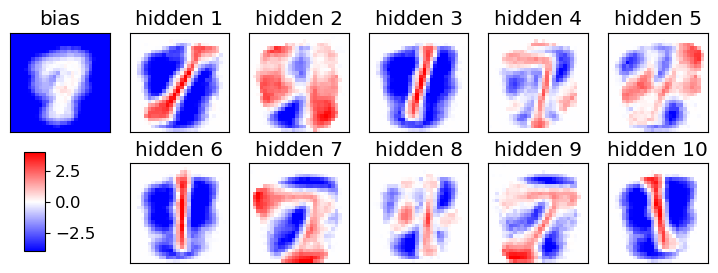

epoch 261 / 450  Nt: 4  N: 174  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 262 / 450  Nt: 4  N: 175  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 263 / 450  Nt: 4  N: 176  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 264 / 450  Nt: 4  N: 178  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 265 / 450  Nt: 4  N: 179  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 266 / 450  Nt: 4  N: 180  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 267 / 450  Nt: 4  N: 181  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 268 / 450  Nt: 4  N: 183  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 269 / 450  Nt: 4  N: 184  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 270 / 450  Nt: 4  N: 185  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 271 / 450  Nt: 4  N: 187  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 272 / 450  Nt: 4  N: 188  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

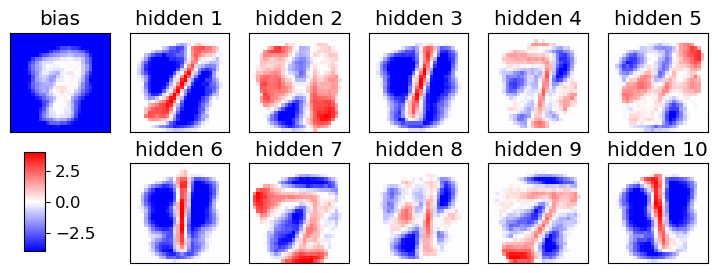

epoch 281 / 450  Nt: 4  N: 200  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 282 / 450  Nt: 4  N: 201  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 283 / 450  Nt: 4  N: 203  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 284 / 450  Nt: 4  N: 204  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 285 / 450  Nt: 4  N: 206  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 286 / 450  Nt: 4  N: 207  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 287 / 450  Nt: 4  N: 208  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 288 / 450  Nt: 4  N: 210  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 289 / 450  Nt: 4  N: 211  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 290 / 450  Nt: 4  N: 213  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 291 / 450  Nt: 4  N: 214  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 292 / 450  Nt: 4  N: 215  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

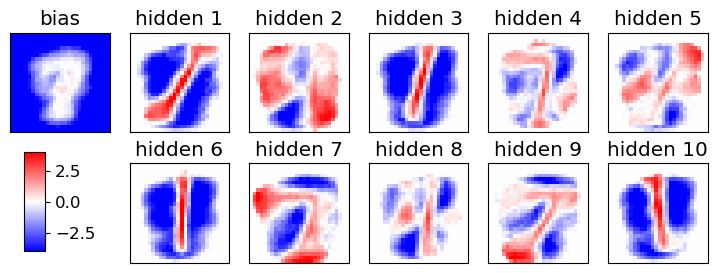

epoch 301 / 450  Nt: 4  N: 228  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 302 / 450  Nt: 4  N: 230  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 303 / 450  Nt: 4  N: 231  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 304 / 450  Nt: 4  N: 233  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 305 / 450  Nt: 4  N: 234  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 306 / 450  Nt: 4  N: 236  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 307 / 450  Nt: 4  N: 237  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 308 / 450  Nt: 4  N: 239  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 309 / 450  Nt: 4  N: 240  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 310 / 450  Nt: 4  N: 242  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 311 / 450  Nt: 4  N: 243  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 312 / 450  Nt: 4  N: 245  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

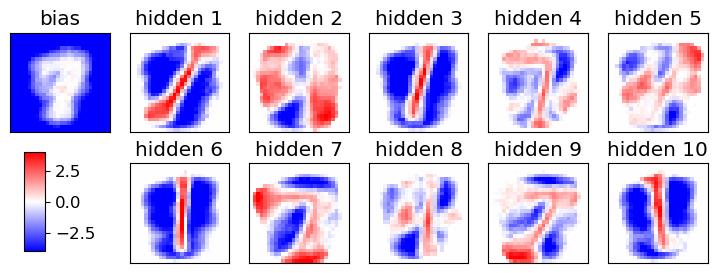

epoch 321 / 450  Nt: 4  N: 258  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 322 / 450  Nt: 4  N: 260  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 323 / 450  Nt: 4  N: 262  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 324 / 450  Nt: 4  N: 263  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 325 / 450  Nt: 4  N: 265  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 326 / 450  Nt: 4  N: 266  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 327 / 450  Nt: 4  N: 268  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 328 / 450  Nt: 4  N: 269  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 329 / 450  Nt: 4  N: 271  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 330 / 450  Nt: 4  N: 273  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 331 / 450  Nt: 4  N: 274  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 332 / 450  Nt: 4  N: 276  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

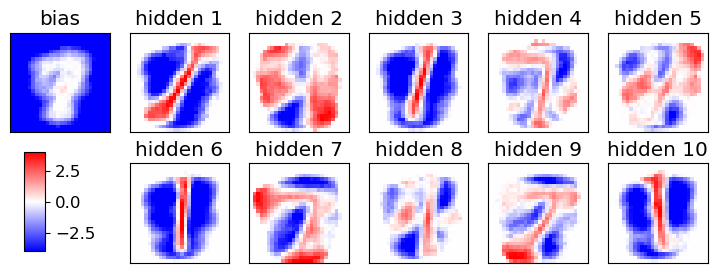

epoch 341 / 450  Nt: 4  N: 290  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 342 / 450  Nt: 4  N: 292  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 343 / 450  Nt: 4  N: 294  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 344 / 450  Nt: 4  N: 295  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 345 / 450  Nt: 4  N: 297  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 346 / 450  Nt: 4  N: 299  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 347 / 450  Nt: 4  N: 300  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 348 / 450  Nt: 4  N: 302  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 349 / 450  Nt: 4  N: 304  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 350 / 450  Nt: 4  N: 306  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 351 / 450  Nt: 4  N: 307  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 352 / 450  Nt: 4  N: 309  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

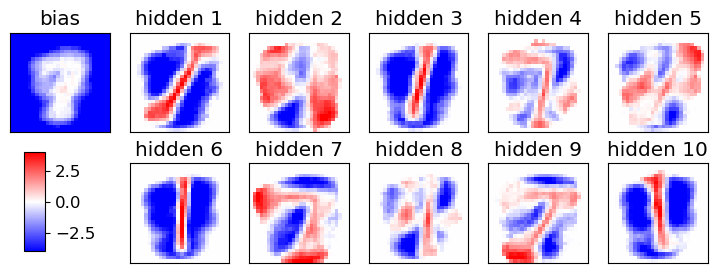

epoch 361 / 450  Nt: 4  N: 324  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 362 / 450  Nt: 4  N: 326  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 363 / 450  Nt: 4  N: 328  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 364 / 450  Nt: 4  N: 330  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 365 / 450  Nt: 4  N: 332  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 366 / 450  Nt: 4  N: 333  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 367 / 450  Nt: 4  N: 335  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 368 / 450  Nt: 4  N: 337  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 369 / 450  Nt: 4  N: 339  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 370 / 450  Nt: 4  N: 340  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 371 / 450  Nt: 4  N: 342  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 372 / 450  Nt: 4  N: 344  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

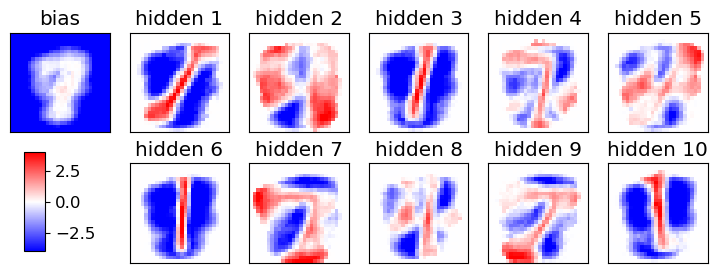

epoch 381 / 450  Nt: 4  N: 360  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 382 / 450  Nt: 4  N: 362  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 383 / 450  Nt: 4  N: 364  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 384 / 450  Nt: 4  N: 366  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 385 / 450  Nt: 4  N: 368  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 386 / 450  Nt: 4  N: 370  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 387 / 450  Nt: 4  N: 372  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 388 / 450  Nt: 4  N: 374  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 389 / 450  Nt: 4  N: 375  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 390 / 450  Nt: 4  N: 377  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 391 / 450  Nt: 4  N: 379  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 392 / 450  Nt: 4  N: 381  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

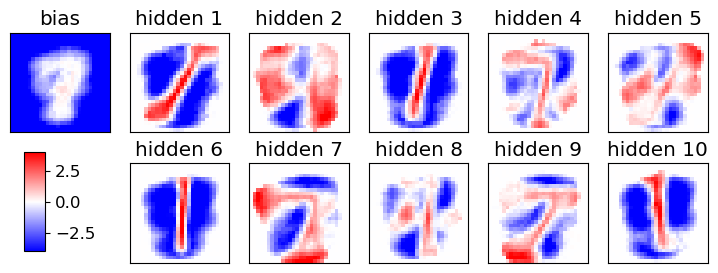

epoch 401 / 450  Nt: 4  N: 398  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 402 / 450  Nt: 4  N: 400  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 403 / 450  Nt: 4  N: 402  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 404 / 450  Nt: 4  N: 404  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 405 / 450  Nt: 4  N: 406  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 406 / 450  Nt: 4  N: 408  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 407 / 450  Nt: 4  N: 410  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 408 / 450  Nt: 4  N: 412  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 409 / 450  Nt: 4  N: 414  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 410 / 450  Nt: 4  N: 416  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 411 / 450  Nt: 4  N: 418  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 412 / 450  Nt: 4  N: 420  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

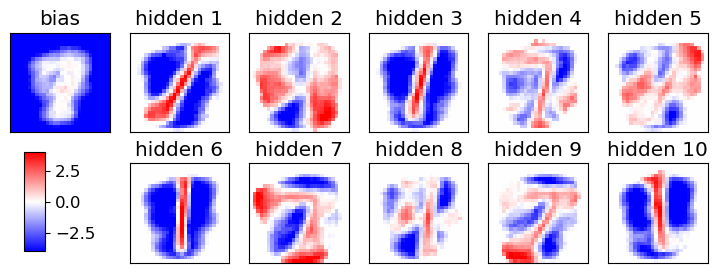

epoch 421 / 450  Nt: 4  N: 438  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 422 / 450  Nt: 4  N: 440  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 423 / 450  Nt: 4  N: 442  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 424 / 450  Nt: 4  N: 444  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 425 / 450  Nt: 4  N: 446  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 426 / 450  Nt: 4  N: 449  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 427 / 450  Nt: 4  N: 451  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 428 / 450  Nt: 4  N: 453  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 429 / 450  Nt: 4  N: 455  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 430 / 450  Nt: 4  N: 457  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 431 / 450  Nt: 4  N: 459  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 432 / 450  Nt: 4  N: 461  L: 10  rate: 0.05  gam

<Figure size 640x480 with 0 Axes>

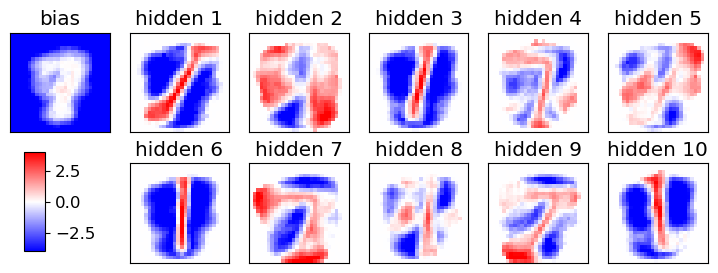

epoch 441 / 450  Nt: 4  N: 480  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 442 / 450  Nt: 4  N: 482  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 443 / 450  Nt: 4  N: 484  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 444 / 450  Nt: 4  N: 486  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 445 / 450  Nt: 4  N: 489  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 446 / 450  Nt: 4  N: 491  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 447 / 450  Nt: 4  N: 493  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 448 / 450  Nt: 4  N: 495  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 449 / 450  Nt: 4  N: 497  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
epoch 450 / 450  Nt: 4  N: 500  L: 10  rate: 0.05  gam: 0.01 SPINS= False POTTS= True


<Figure size 640x480 with 0 Axes>

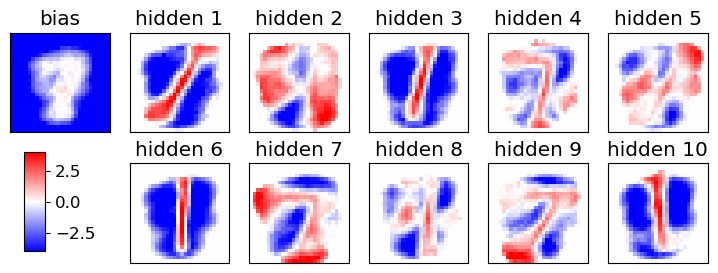

END of learning phase


In [31]:
L_v=[3,4,5,6,7,8,10] ##Nt=4,
gamma=0.01
POTTS=True

for L in L_v:
    if POTTS:
        str_simul="RBM_Potts"
        # in one-hot encoding, number of possible hidden states matches L
        Nz=L
    else:
        str_simul="RBM"
        # number of possible hidden states: 2**L
        Nz=2**L
    
    # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
    w = sigma * np.random.randn(D,L)
    #a = sigma * np.random.randn(D)
    # using Hinton initialization of visible biases
    a = Hinton_bias_init(data)
    # hidden biases initialized to zero
    b = np.zeros(L)
    #print("w=",w);print("a=",a);print("b=",b)
    # nr of epochs
    Nepoch=450
    # minibatches per epoch
    Nmini=20
    # minibatch size at initial epoch and final one
    N_ini,N_fin=10,500
    print(f"Nepoch={Nepoch}\nNmini={Nmini}")
    # number of CD steps
    Nt=4
    # recording history of weights ("E" means epoch)
    wE,aE,bE=np.zeros((Nepoch+1,D,L)),np.zeros((Nepoch+1,D)),np.zeros((Nepoch+1,L))
    wE[0],aE[0],bE[0]=np.copy(w),np.copy(a),np.copy(b)
    gwE,gw2E,gwE_d,gwE_m = np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE)
    gaE,ga2E,gaE_d,gaE_m = np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE)
    gbE,gb2E,gbE_d,gbE_m = np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE)
    miniE = np.zeros(Nepoch+1)
    pzE=np.zeros((Nepoch+1,Nz))
    if GRAD=="RMSprop":
        gw2,ga2,gb2 = np.zeros_like(w),np.zeros_like(a),np.zeros_like(b)
    indices=np.arange(Nd).astype("int")
    plot_weights_bias(wE, aE, 0, L, cols=L//2, save=False)
    # for the plot with panels
    Ncols=min(8,max(2,L//2))
    if POTTS: print("Starting the training, POTTS=True")
    else: print("Starting the training")
    # Note: here an epoch does not analyze the whole dataset
    for epoch in range(1,1+Nepoch):
        # q maps epochs to interval [0,1]
        q = (epoch-1.)/(Nepoch-1.)
        # N, size of the mini batch
        # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
        N = int(N_ini + (N_fin-N_ini)*(q**2))
        #  l_rate interpolates between initial and final value
        l_rate = l_rate_ini + (l_rate_fin-l_rate_ini)*q
        for mini in range(Nmini):
            # initializitation for averages in minibatch
            # visible variables "v" --> "x"
            #  hidden variables "h" --> "z"
            x_data, x_model = np.zeros(D),np.zeros(D)
            z_data, z_model = np.zeros(L),np.zeros(L)
            xz_data,xz_model= np.zeros((D,L)),np.zeros((D,L))
            pz = np.zeros(L)
            # Minibatch of size N: points randomply picked (without repetition) from data
            selected = np.random.choice(indices,N,replace=False)
            if epoch==1 and mini<=3: print(selected)
            for k in range(N):
                ###################################
                x0 = data[selected[k]]
                # positive CD phase: generating z from x[k]
                z = CD_step(x0,w,b,POTTS=POTTS)
                x_data  += x0
                z_data  += z
                xz_data += np.outer(x0,z)
                # fantasy
                zf=np.copy(z)
                # Contrastive divergence with Nt steps
                for t in range(Nt):
                    # negative CD pzase: generating fantasy xf from fantasy zf
                    xf = CD_step(zf,w.T,a)
                    # positive CD phase: generating fantasy zf from fantasy xf
                    zf = CD_step(xf,w,b,POTTS=POTTS)
                x_model += xf
                z_model += zf
                xz_model+= np.outer(xf,zf)
                # recording probability of encoding in z-space, if POTTS
                if POTTS: pz[zf]+=1
                ###################################
            # gradient of the likelihood: follow it along its positive direction
            gw_d,gw_m = xz_data/N, xz_model/N
            ga_d,ga_m = x_data/N, x_model/N
            gb_d,gb_m = z_data/N, z_model/N
            gw=np.copy(gw_d - gw_m)
            ga=np.copy(ga_d - ga_m)
            gb=np.copy(gb_d - gb_m)
            # gradient ascent step
            if GRAD=="RMSprop":
                # RMSprop gradient ascent
                gw2 = beta*gw2+(1-beta)*np.square(gw)
                ga2 = beta*ga2+(1-beta)*np.square(ga)
                gb2 = beta*gb2+(1-beta)*np.square(gb)
                w += l_rate*gw/sqrt(epsilon+gw2)
                a += l_rate*ga/sqrt(epsilon+ga2)
                b += l_rate*gb/sqrt(epsilon+gb2)
            else:
                # defaulting to the vanilla stochastic gradient ascent (SGD)
                w += l_rate*gw
                a += l_rate*ga
                b += l_rate*gb
            # regularization (LASSO)
            if gamma>0.:
                w -= (gamma*l_rate)*sign(w)
                a -= (gamma*l_rate)*sign(a)
                b -= (gamma*l_rate)*sign(b)
        wE[epoch],gwE[epoch],gwE_d[epoch],gwE_m[epoch]=np.copy(w),np.copy(gw),np.copy(gw_d),np.copy(gw_m)
        aE[epoch],gaE[epoch],gaE_d[epoch],gaE_m[epoch]=np.copy(a),np.copy(ga),np.copy(ga_d),np.copy(ga_m)
        bE[epoch],gbE[epoch],gbE_d[epoch],gbE_m[epoch]=np.copy(b),np.copy(gb),np.copy(gb_d),np.copy(gb_m)
        miniE[epoch]=N
        if POTTS: pzE[epoch] = pz/np.sum(pz)
        print("epoch",epoch,"/",Nepoch," Nt:",Nt," N:",N," L:",L,
              " rate:",l_rate," gam:",gamma,"SPINS=",SPINS,"POTTS=",POTTS)
        if Nepoch<=100 or epoch%20==0 or epoch==Nepoch:
            plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)
        str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")
    save_epochs(wE,"w")
    save_epochs(bE,"b")
    save_epochs(aE,"a")
    print("END of learning phase")


Nepoch=500
Nmini=20


<Figure size 640x480 with 0 Axes>

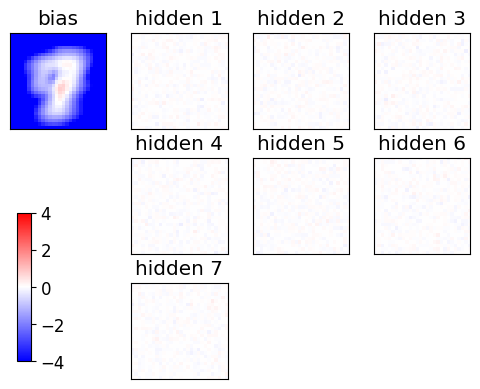

Starting the training, POTTS=True
[ 6786 18737   298 18484  8021 13998  5770  4259 15124 20555]
[16958 10869 13036  3360  2224  3475 20594  7145  5791 11096]
[ 2089 13018 11741  6346   240 20889 10876  3287  4593  1149]
[ 8868  7808 19070  3099   994  4861  4655 18394  7068 19133]
Iter 1 epoch 1 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 2 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 3 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 4 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 5 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 6 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 7 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 8 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1

<Figure size 640x480 with 0 Axes>

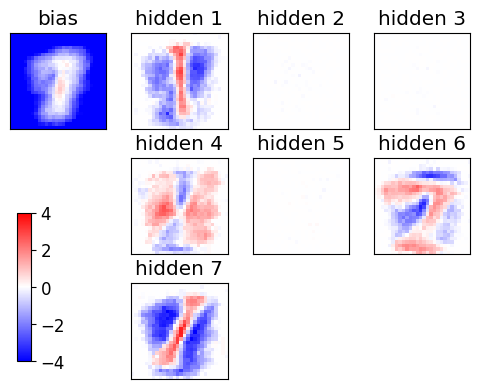

Iter 1 epoch 21 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 22 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 23 / 500  Nt: 4  N: 10  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 24 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 25 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 26 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 27 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 28 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 29 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 30 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 31 / 500  Nt: 4  N: 11  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epo

<Figure size 640x480 with 0 Axes>

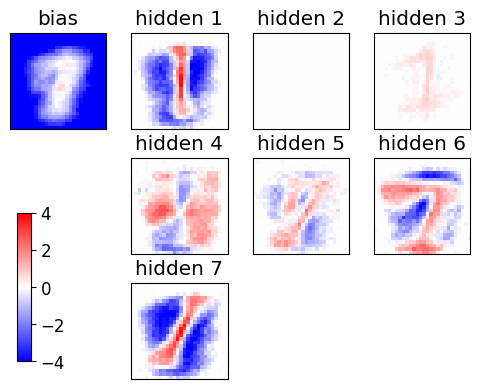

Iter 1 epoch 41 / 500  Nt: 4  N: 13  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 42 / 500  Nt: 4  N: 13  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 43 / 500  Nt: 4  N: 13  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 44 / 500  Nt: 4  N: 13  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 45 / 500  Nt: 4  N: 13  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 46 / 500  Nt: 4  N: 13  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 47 / 500  Nt: 4  N: 14  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 48 / 500  Nt: 4  N: 14  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 49 / 500  Nt: 4  N: 14  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 50 / 500  Nt: 4  N: 14  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 51 / 500  Nt: 4  N: 14  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epo

<Figure size 640x480 with 0 Axes>

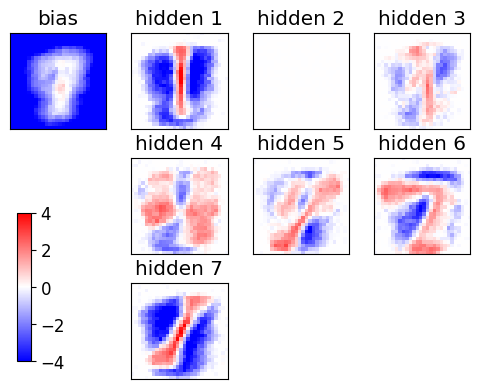

Iter 1 epoch 61 / 500  Nt: 4  N: 17  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 62 / 500  Nt: 4  N: 17  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 63 / 500  Nt: 4  N: 17  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 64 / 500  Nt: 4  N: 17  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 65 / 500  Nt: 4  N: 18  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 66 / 500  Nt: 4  N: 18  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 67 / 500  Nt: 4  N: 18  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 68 / 500  Nt: 4  N: 18  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 69 / 500  Nt: 4  N: 19  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 70 / 500  Nt: 4  N: 19  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epoch 71 / 500  Nt: 4  N: 19  L: 7  rate: 0.05  gam: 0.01 SPINS= False POTTS= True
Iter 1 epo

KeyboardInterrupt: 

In [15]:
# TRAINING L=7 AND POTTS

L_v=[3,4,5,6,7,8,10] ##Nt=4,
gamma=0.01
POTTS=True

for iteration in range(1,5):
    for L in L_v:
        if L==7:
            if POTTS:
                str_simul="RBM_Potts"
                # in one-hot encoding, number of possible hidden states matches L
                Nz=L
            else:
                str_simul="RBM"
                # number of possible hidden states: 2**L
                Nz=2**L
            
            # initial weights from a Normal distr. (see literature, e.g. page 98 of Mehta's review)
            w = sigma * np.random.randn(D,L)
            #a = sigma * np.random.randn(D)
            # using Hinton initialization of visible biases
            a = Hinton_bias_init(data)
            # hidden biases initialized to zero
            b = np.zeros(L)
            #print("w=",w);print("a=",a);print("b=",b)
            # nr of epochs
            Nepoch=500
            # minibatches per epoch
            Nmini=20
            # minibatch size at initial epoch and final one
            N_ini,N_fin=10,500
            print(f"Nepoch={Nepoch}\nNmini={Nmini}")
            # number of CD steps
            Nt=4
            # recording history of weights ("E" means epoch)
            wE,aE,bE=np.zeros((Nepoch+1,D,L)),np.zeros((Nepoch+1,D)),np.zeros((Nepoch+1,L))
            wE[0],aE[0],bE[0]=np.copy(w),np.copy(a),np.copy(b)
            gwE,gw2E,gwE_d,gwE_m = np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE),np.zeros_like(wE)
            gaE,ga2E,gaE_d,gaE_m = np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE),np.zeros_like(aE)
            gbE,gb2E,gbE_d,gbE_m = np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE),np.zeros_like(bE)
            miniE = np.zeros(Nepoch+1)
            pzE=np.zeros((Nepoch+1,Nz))
            if GRAD=="RMSprop":
                gw2,ga2,gb2 = np.zeros_like(w),np.zeros_like(a),np.zeros_like(b)
            indices=np.arange(Nd).astype("int")
            plot_weights_bias(wE, aE, 0, L, cols=L//2, save=False)
            # for the plot with panels
            Ncols=min(8,max(2,L//2))
            if POTTS: print("Starting the training, POTTS=True")
            else: print("Starting the training")
            # Note: here an epoch does not analyze the whole dataset
            for epoch in range(1,1+Nepoch):
                # q maps epochs to interval [0,1]
                q = (epoch-1.)/(Nepoch-1.)
                # N, size of the mini batch
                # stays closer to N_ini for some time, then it progressively accelerates toward N_fin
                N = int(N_ini + (N_fin-N_ini)*(q**2))
                #  l_rate interpolates between initial and final value
                l_rate = l_rate_ini + (l_rate_fin-l_rate_ini)*q
                for mini in range(Nmini):
                    # initializitation for averages in minibatch
                    # visible variables "v" --> "x"
                    #  hidden variables "h" --> "z"
                    x_data, x_model = np.zeros(D),np.zeros(D)
                    z_data, z_model = np.zeros(L),np.zeros(L)
                    xz_data,xz_model= np.zeros((D,L)),np.zeros((D,L))
                    pz = np.zeros(L)
                    # Minibatch of size N: points randomply picked (without repetition) from data
                    selected = np.random.choice(indices,N,replace=False)
                    if epoch==1 and mini<=3: print(selected)
                    for k in range(N):
                        ###################################
                        x0 = data[selected[k]]
                        # positive CD phase: generating z from x[k]
                        z = CD_step(x0,w,b,POTTS=POTTS)
                        x_data  += x0
                        z_data  += z
                        xz_data += np.outer(x0,z)
                        # fantasy
                        zf=np.copy(z)
                        # Contrastive divergence with Nt steps
                        for t in range(Nt):
                            # negative CD pzase: generating fantasy xf from fantasy zf
                            xf = CD_step(zf,w.T,a)
                            # positive CD phase: generating fantasy zf from fantasy xf
                            zf = CD_step(xf,w,b,POTTS=POTTS)
                        x_model += xf
                        z_model += zf
                        xz_model+= np.outer(xf,zf)
                        # recording probability of encoding in z-space, if POTTS
                        if POTTS: pz[zf]+=1
                        ###################################
                    # gradient of the likelihood: follow it along its positive direction
                    gw_d,gw_m = xz_data/N, xz_model/N
                    ga_d,ga_m = x_data/N, x_model/N
                    gb_d,gb_m = z_data/N, z_model/N
                    gw=np.copy(gw_d - gw_m)
                    ga=np.copy(ga_d - ga_m)
                    gb=np.copy(gb_d - gb_m)
                    # gradient ascent step
                    if GRAD=="RMSprop":
                        # RMSprop gradient ascent
                        gw2 = beta*gw2+(1-beta)*np.square(gw)
                        ga2 = beta*ga2+(1-beta)*np.square(ga)
                        gb2 = beta*gb2+(1-beta)*np.square(gb)
                        w += l_rate*gw/sqrt(epsilon+gw2)
                        a += l_rate*ga/sqrt(epsilon+ga2)
                        b += l_rate*gb/sqrt(epsilon+gb2)
                    else:
                        # defaulting to the vanilla stochastic gradient ascent (SGD)
                        w += l_rate*gw
                        a += l_rate*ga
                        b += l_rate*gb
                    # regularization (LASSO)
                    if gamma>0.:
                        w -= (gamma*l_rate)*sign(w)
                        a -= (gamma*l_rate)*sign(a)
                        b -= (gamma*l_rate)*sign(b)
                wE[epoch],gwE[epoch],gwE_d[epoch],gwE_m[epoch]=np.copy(w),np.copy(gw),np.copy(gw_d),np.copy(gw_m)
                aE[epoch],gaE[epoch],gaE_d[epoch],gaE_m[epoch]=np.copy(a),np.copy(ga),np.copy(ga_d),np.copy(ga_m)
                bE[epoch],gbE[epoch],gbE_d[epoch],gbE_m[epoch]=np.copy(b),np.copy(gb),np.copy(gb_d),np.copy(gb_m)
                miniE[epoch]=N
                if POTTS: pzE[epoch] = pz/np.sum(pz)
                print("Iter",iteration,"epoch",epoch,"/",Nepoch," Nt:",Nt," N:",N," L:",L,
                      " rate:",l_rate," gam:",gamma,"SPINS=",SPINS,"POTTS=",POTTS)
                if Nepoch<=100 or epoch%20==0 or epoch==Nepoch:
                    plot_weights_bias(wE, aE, epoch, L, cols=Ncols, save=False)
                str_time_completion = datetime.datetime.now().strftime("_%Y%m%d_%H%M")
            save_epochs_iter(wE,"w")
            save_epochs_iter(bE,"b")
            save_epochs_iter(aE,"a")
            print("END of learning phase")

In [32]:
L_v=[3,4, 5,6,8,10] ##Nt=4,
gamma=0.01
POTTS=True

log_like_potts=[]
for L in L_v:
    Nt=4
    a_all = np.load(f"WEIGHTS/a_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep450_reg0.01_POTTS.npy", allow_pickle=True)
    print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
    b_all= np.load(f"WEIGHTS/b_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep450_reg0.01_POTTS.npy", allow_pickle=True)
    print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
    w_all=np.load(f"WEIGHTS/w_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep450_reg0.01_POTTS.npy", allow_pickle=True)
    print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch

    log_like=[]
    num_epo=[]
    Nepoch=450
    n=5  ### take 1/5 of the epoch
    for i in range(Nepoch):
        if i%n==0:
            print(f'Epoch n.{i}')
            ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
            log_like.append(ll)
            num_epo.append(i)
            print('Log-likelihood=',ll)
    log_like_potts.append(log_like)


a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2627.12it/s]


Log-likelihood= -166.91599240650964
Epoch n.5


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12727.57it/s]


Log-likelihood= -149.87264260367095
Epoch n.10


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12790.61it/s]


Log-likelihood= -153.21565052400607
Epoch n.15


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12432.87it/s]


Log-likelihood= -149.4376726004234
Epoch n.20


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12596.11it/s]


Log-likelihood= -149.38538556968166
Epoch n.25


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12711.34it/s]


Log-likelihood= -153.71828346416066
Epoch n.30


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 11855.19it/s]


Log-likelihood= -151.46997375665066
Epoch n.35


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12843.88it/s]


Log-likelihood= -149.4226782748461
Epoch n.40


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12679.26it/s]


Log-likelihood= -153.85816132922798
Epoch n.45


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12666.32it/s]


Log-likelihood= -149.2755292139087
Epoch n.50


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12905.39it/s]


Log-likelihood= -148.27847184985464
Epoch n.55


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12940.41it/s]


Log-likelihood= -151.38716839708724
Epoch n.60


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12958.21it/s]


Log-likelihood= -149.82912333975867
Epoch n.65


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12575.12it/s]


Log-likelihood= -152.0697335168128
Epoch n.70


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12732.62it/s]


Log-likelihood= -151.57081202167896
Epoch n.75


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12390.87it/s]


Log-likelihood= -148.1703486886922
Epoch n.80


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12992.51it/s]


Log-likelihood= -154.7334905262013
Epoch n.85


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12976.14it/s]


Log-likelihood= -151.8506405114581
Epoch n.90


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12769.12it/s]


Log-likelihood= -149.13677024425735
Epoch n.95


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12981.54it/s]


Log-likelihood= -150.6429517310738
Epoch n.100


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12838.01it/s]


Log-likelihood= -150.5845799001828
Epoch n.105


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12902.60it/s]


Log-likelihood= -152.06573752154287
Epoch n.110


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12872.84it/s]


Log-likelihood= -149.30590231597847
Epoch n.115


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12629.75it/s]


Log-likelihood= -149.78625072466326
Epoch n.120


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12826.56it/s]


Log-likelihood= -149.51615827250993
Epoch n.125


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12560.42it/s]


Log-likelihood= -148.73348511445545
Epoch n.130


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12119.09it/s]


Log-likelihood= -150.14696586917614
Epoch n.135


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12326.05it/s]


Log-likelihood= -150.44502311384775
Epoch n.140


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12909.78it/s]


Log-likelihood= -148.3078999422338
Epoch n.145


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12127.17it/s]


Log-likelihood= -148.3394136551056
Epoch n.150


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12092.33it/s]


Log-likelihood= -147.44613920250174
Epoch n.155


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12800.99it/s]


Log-likelihood= -149.43777910407607
Epoch n.160


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12274.08it/s]


Log-likelihood= -150.36198067427725
Epoch n.165


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12657.77it/s]


Log-likelihood= -148.92442916481474
Epoch n.170


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12368.90it/s]


Log-likelihood= -148.87064923914352
Epoch n.175


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13022.09it/s]


Log-likelihood= -150.1694645468806
Epoch n.180


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12971.74it/s]


Log-likelihood= -151.02484437088182
Epoch n.185


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12893.75it/s]


Log-likelihood= -150.68708726762023
Epoch n.190


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12330.73it/s]


Log-likelihood= -147.36383349084616
Epoch n.195


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 11920.00it/s]


Log-likelihood= -148.3933090854876
Epoch n.200


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12790.41it/s]


Log-likelihood= -149.98213443204756
Epoch n.205


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13038.88it/s]


Log-likelihood= -149.57490474727652
Epoch n.210


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13025.07it/s]


Log-likelihood= -147.99749693043924
Epoch n.215


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12541.20it/s]


Log-likelihood= -148.6407000355923
Epoch n.220


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12002.51it/s]


Log-likelihood= -150.50135421907962
Epoch n.225


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12066.12it/s]


Log-likelihood= -149.4617691121032
Epoch n.230


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12804.81it/s]


Log-likelihood= -148.39596204305172
Epoch n.235


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12795.84it/s]


Log-likelihood= -148.98463262489486
Epoch n.240


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12892.32it/s]


Log-likelihood= -149.3724010363165
Epoch n.245


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12798.70it/s]


Log-likelihood= -149.3466148194739
Epoch n.250


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12994.52it/s]


Log-likelihood= -148.73643724970614
Epoch n.255


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12833.06it/s]


Log-likelihood= -150.39514759745788
Epoch n.260


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12781.26it/s]


Log-likelihood= -150.3447283809343
Epoch n.265


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12876.57it/s]


Log-likelihood= -149.85267330484803
Epoch n.270


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12957.62it/s]


Log-likelihood= -148.33957976480417
Epoch n.275


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12649.86it/s]


Log-likelihood= -149.19147122277437
Epoch n.280


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13096.86it/s]


Log-likelihood= -149.112823783785
Epoch n.285


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12913.54it/s]


Log-likelihood= -147.91682175553657
Epoch n.290


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12955.06it/s]


Log-likelihood= -149.31126925943386
Epoch n.295


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 11252.56it/s]


Log-likelihood= -150.0021121974856
Epoch n.300


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13046.90it/s]


Log-likelihood= -147.52338937999122
Epoch n.305


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12722.71it/s]


Log-likelihood= -149.43591028911635
Epoch n.310


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12894.77it/s]


Log-likelihood= -148.41993064231116
Epoch n.315


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12677.92it/s]


Log-likelihood= -148.42608788301416
Epoch n.320


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12682.39it/s]


Log-likelihood= -149.6694667391067
Epoch n.325


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12533.28it/s]


Log-likelihood= -149.84781078824662
Epoch n.330


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12228.25it/s]


Log-likelihood= -149.18181334594982
Epoch n.335


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13006.86it/s]


Log-likelihood= -148.66330708560054
Epoch n.340


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12723.29it/s]


Log-likelihood= -149.5257220146229
Epoch n.345


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12985.72it/s]


Log-likelihood= -148.9675817230922
Epoch n.350


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12735.89it/s]


Log-likelihood= -147.39996210408566
Epoch n.355


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12524.31it/s]


Log-likelihood= -149.33791290116858
Epoch n.360


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12962.61it/s]


Log-likelihood= -148.75926707484209
Epoch n.365


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12945.16it/s]


Log-likelihood= -149.22755351866496
Epoch n.370


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13000.93it/s]


Log-likelihood= -148.5714086305156
Epoch n.375


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12587.04it/s]


Log-likelihood= -148.66911523707498
Epoch n.380


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13057.82it/s]


Log-likelihood= -149.61381839031338
Epoch n.385


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12915.85it/s]


Log-likelihood= -149.91141310893528
Epoch n.390


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12887.02it/s]


Log-likelihood= -150.24805034789222
Epoch n.395


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12465.52it/s]


Log-likelihood= -148.37542118372178
Epoch n.400


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13010.19it/s]


Log-likelihood= -150.8065609138767
Epoch n.405


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12902.73it/s]


Log-likelihood= -149.09941441224456
Epoch n.410


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12714.25it/s]


Log-likelihood= -149.85003371696843
Epoch n.415


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12921.93it/s]


Log-likelihood= -148.0533491050948
Epoch n.420


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12737.98it/s]


Log-likelihood= -150.0293904179206
Epoch n.425


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 13088.39it/s]


Log-likelihood= -148.92969351830507
Epoch n.430


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12536.86it/s]


Log-likelihood= -148.18343684053826
Epoch n.435


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12796.21it/s]


Log-likelihood= -149.07935136867286
Epoch n.440


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12989.37it/s]


Log-likelihood= -147.0821518007089
Epoch n.445


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 12922.73it/s]


Log-likelihood= -149.80183574072078
a_all L=4, Nt=4
b_all L=4, Nt=4
w_all L=4, Nt=4
Epoch n.0


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10198.46it/s]


Log-likelihood= -167.73320808528237
Epoch n.5


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9905.13it/s]


Log-likelihood= -158.57197910422656
Epoch n.10


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10085.13it/s]


Log-likelihood= -153.3510242268299
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9971.69it/s]


Log-likelihood= -150.7099537019436
Epoch n.20


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10049.91it/s]


Log-likelihood= -148.31542553304482
Epoch n.25


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10079.17it/s]


Log-likelihood= -147.76172481963908
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9924.51it/s]


Log-likelihood= -148.6351316955957
Epoch n.35


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10093.10it/s]


Log-likelihood= -144.15788358150002
Epoch n.40


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10076.48it/s]


Log-likelihood= -140.007559366749
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9982.19it/s]


Log-likelihood= -140.36750544238427
Epoch n.50


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10027.24it/s]


Log-likelihood= -139.1802235766454
Epoch n.55


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10037.88it/s]


Log-likelihood= -138.305518938373
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9931.93it/s]


Log-likelihood= -137.32999051584162
Epoch n.65


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9812.10it/s]


Log-likelihood= -139.6457659669882
Epoch n.70


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10013.95it/s]


Log-likelihood= -136.94095995136726
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9964.88it/s]


Log-likelihood= -139.7787095354773
Epoch n.80


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9945.75it/s]


Log-likelihood= -138.39757563492472
Epoch n.85


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9999.73it/s]


Log-likelihood= -138.40594336699075
Epoch n.90


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10045.87it/s]


Log-likelihood= -140.75138528825417
Epoch n.95


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9815.52it/s]


Log-likelihood= -138.11134351871124
Epoch n.100


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10048.17it/s]


Log-likelihood= -137.28686845086358
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9778.93it/s]


Log-likelihood= -136.99316752452364
Epoch n.110


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10005.92it/s]


Log-likelihood= -137.09034968072893
Epoch n.115


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9969.93it/s]


Log-likelihood= -139.00558482800503
Epoch n.120


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10075.68it/s]


Log-likelihood= -138.6655384553698
Epoch n.125


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10129.82it/s]


Log-likelihood= -137.47671571063972
Epoch n.130


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9866.40it/s]


Log-likelihood= -137.92180558341866
Epoch n.135


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10047.43it/s]


Log-likelihood= -137.57272632482815
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9845.91it/s]


Log-likelihood= -137.89732178450421
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9940.21it/s]


Log-likelihood= -138.39727173765232
Epoch n.150


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9816.88it/s]


Log-likelihood= -139.0007335693723
Epoch n.155


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10150.97it/s]


Log-likelihood= -138.4580406339547
Epoch n.160


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10038.44it/s]


Log-likelihood= -138.46680138555578
Epoch n.165


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9949.59it/s]


Log-likelihood= -139.76607387350543
Epoch n.170


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9839.78it/s]


Log-likelihood= -137.75029224300508
Epoch n.175


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10116.19it/s]


Log-likelihood= -138.31481171773476
Epoch n.180


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10057.56it/s]


Log-likelihood= -136.07882643155298
Epoch n.185


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9871.12it/s]


Log-likelihood= -138.5479691841512
Epoch n.190


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10041.50it/s]


Log-likelihood= -137.99994767590678
Epoch n.195


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10185.63it/s]


Log-likelihood= -136.66201322435674
Epoch n.200


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10045.52it/s]


Log-likelihood= -136.4249851731747
Epoch n.205


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9948.87it/s]


Log-likelihood= -137.93935200666022
Epoch n.210


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10129.48it/s]


Log-likelihood= -138.23873616495817
Epoch n.215


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10113.88it/s]


Log-likelihood= -136.11840406492243
Epoch n.220


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9927.76it/s]


Log-likelihood= -138.83744016904663
Epoch n.225


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10038.51it/s]


Log-likelihood= -137.93128877325333
Epoch n.230


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10114.86it/s]


Log-likelihood= -136.27418025270538
Epoch n.235


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9739.51it/s]


Log-likelihood= -136.89285496193583
Epoch n.240


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9711.69it/s]


Log-likelihood= -136.5678868293929
Epoch n.245


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10087.57it/s]


Log-likelihood= -137.4718948668881
Epoch n.250


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9886.07it/s]


Log-likelihood= -137.97373263787264
Epoch n.255


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10075.84it/s]


Log-likelihood= -137.75693954478044
Epoch n.260


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9958.69it/s]


Log-likelihood= -138.64204167890065
Epoch n.265


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10086.59it/s]


Log-likelihood= -136.87221629569282
Epoch n.270


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10087.40it/s]


Log-likelihood= -137.59584946920927
Epoch n.275


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10112.71it/s]


Log-likelihood= -135.57320231885362
Epoch n.280


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10020.37it/s]


Log-likelihood= -138.77672566641448
Epoch n.285


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10011.71it/s]


Log-likelihood= -140.22613479611823
Epoch n.290


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10143.13it/s]


Log-likelihood= -136.5585416273769
Epoch n.295


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10075.98it/s]


Log-likelihood= -136.19719551106334
Epoch n.300


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10160.25it/s]


Log-likelihood= -135.68163110077552
Epoch n.305


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9942.49it/s]


Log-likelihood= -136.57380331361685
Epoch n.310


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9973.45it/s]


Log-likelihood= -136.67307618259832
Epoch n.315


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10046.80it/s]


Log-likelihood= -138.19054293025076
Epoch n.320


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10085.00it/s]


Log-likelihood= -134.7773862816415
Epoch n.325


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10054.32it/s]


Log-likelihood= -137.8651984023145
Epoch n.330


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9943.60it/s]


Log-likelihood= -135.6163615291969
Epoch n.335


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10067.15it/s]


Log-likelihood= -137.25624243374833
Epoch n.340


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10081.33it/s]


Log-likelihood= -137.00971186360582
Epoch n.345


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10063.52it/s]


Log-likelihood= -138.68946802793687
Epoch n.350


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10052.57it/s]


Log-likelihood= -137.72530173967087
Epoch n.355


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9876.44it/s]


Log-likelihood= -136.74642968127537
Epoch n.360


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10034.85it/s]


Log-likelihood= -138.40236249898643
Epoch n.365


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10134.78it/s]


Log-likelihood= -136.84927320424052
Epoch n.370


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10031.15it/s]


Log-likelihood= -136.12616707460546
Epoch n.375


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10125.42it/s]


Log-likelihood= -137.240031354563
Epoch n.380


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10055.90it/s]


Log-likelihood= -135.749537111226
Epoch n.385


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10064.81it/s]


Log-likelihood= -136.64695036563393
Epoch n.390


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10053.80it/s]


Log-likelihood= -136.14558116507698
Epoch n.395


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9945.75it/s]


Log-likelihood= -136.83054532230162
Epoch n.400


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10006.75it/s]


Log-likelihood= -136.19979031597848
Epoch n.405


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10044.46it/s]


Log-likelihood= -137.77871070097322
Epoch n.410


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10136.50it/s]


Log-likelihood= -137.1063335070077
Epoch n.415


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10137.08it/s]


Log-likelihood= -136.56416424155447
Epoch n.420


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10095.14it/s]


Log-likelihood= -135.9925836092202
Epoch n.425


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10059.35it/s]


Log-likelihood= -137.2162929703066
Epoch n.430


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10109.19it/s]


Log-likelihood= -136.2875209847961
Epoch n.435


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9966.59it/s]


Log-likelihood= -137.09866596089392
Epoch n.440


Computing log-likelihood: 100%|██████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 10076.95it/s]


Log-likelihood= -137.7443419377027
Epoch n.445


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 9814.52it/s]


Log-likelihood= -137.9700197159398
a_all L=5, Nt=4
b_all L=5, Nt=4
w_all L=5, Nt=4
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8127.61it/s]


Log-likelihood= -167.6497607854821
Epoch n.5


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8134.08it/s]


Log-likelihood= -155.9653982331615
Epoch n.10


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8024.43it/s]


Log-likelihood= -150.34894766814742
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8148.80it/s]


Log-likelihood= -147.3956115688232
Epoch n.20


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8040.36it/s]


Log-likelihood= -145.25122707643536
Epoch n.25


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8089.02it/s]


Log-likelihood= -138.57287057651027
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8023.59it/s]


Log-likelihood= -142.91961925446893
Epoch n.35


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8115.08it/s]


Log-likelihood= -138.13924962412273
Epoch n.40


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8062.03it/s]


Log-likelihood= -136.33624570652037
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8032.40it/s]


Log-likelihood= -140.61815952618198
Epoch n.50


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8096.77it/s]


Log-likelihood= -141.39720822207724
Epoch n.55


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8063.40it/s]


Log-likelihood= -139.59310089174033
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7961.70it/s]


Log-likelihood= -138.7409430707616
Epoch n.65


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8082.64it/s]


Log-likelihood= -139.76104753636224
Epoch n.70


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8091.52it/s]


Log-likelihood= -137.27115888153955
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8051.98it/s]


Log-likelihood= -139.24714804314834
Epoch n.80


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8122.19it/s]


Log-likelihood= -143.0308213595689
Epoch n.85


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8085.62it/s]


Log-likelihood= -136.2190191686613
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7866.25it/s]


Log-likelihood= -136.38708987950125
Epoch n.95


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7970.48it/s]


Log-likelihood= -133.44444843314145
Epoch n.100


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7982.06it/s]


Log-likelihood= -134.7178579679648
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7960.32it/s]


Log-likelihood= -132.91912541665317
Epoch n.110


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8119.68it/s]


Log-likelihood= -135.59239697014607
Epoch n.115


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8122.38it/s]


Log-likelihood= -135.12709320917835
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8044.82it/s]


Log-likelihood= -135.3963359643555
Epoch n.125


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8048.72it/s]


Log-likelihood= -132.76889095322875
Epoch n.130


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8075.54it/s]


Log-likelihood= -133.79270699511028
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8036.78it/s]


Log-likelihood= -135.45364571632453
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7965.03it/s]


Log-likelihood= -133.39347173035063
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8031.03it/s]


Log-likelihood= -132.70968993369203
Epoch n.150


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8001.63it/s]


Log-likelihood= -133.7473625127011
Epoch n.155


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8098.13it/s]


Log-likelihood= -134.6394925550003
Epoch n.160


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8054.26it/s]


Log-likelihood= -134.92708309779735
Epoch n.165


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7989.68it/s]


Log-likelihood= -134.395842575459
Epoch n.170


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8020.60it/s]


Log-likelihood= -135.56385411542104
Epoch n.175


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8029.49it/s]


Log-likelihood= -136.06519184021954
Epoch n.180


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8178.01it/s]


Log-likelihood= -133.91652698211973
Epoch n.185


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8069.33it/s]


Log-likelihood= -133.50794226061055
Epoch n.190


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8009.25it/s]


Log-likelihood= -135.54286164717527
Epoch n.195


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7983.84it/s]


Log-likelihood= -135.82355769776348
Epoch n.200


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7941.74it/s]


Log-likelihood= -135.17229414447277
Epoch n.205


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8136.85it/s]


Log-likelihood= -134.64479176846527
Epoch n.210


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8051.93it/s]


Log-likelihood= -133.07879460847178
Epoch n.215


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7945.12it/s]


Log-likelihood= -132.83889176915167
Epoch n.220


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7988.23it/s]


Log-likelihood= -133.04159158552753
Epoch n.225


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8060.49it/s]


Log-likelihood= -134.28411088505365
Epoch n.230


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8048.52it/s]


Log-likelihood= -132.16180814182002
Epoch n.235


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8107.07it/s]


Log-likelihood= -132.2880582828321
Epoch n.240


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8060.94it/s]


Log-likelihood= -134.51634908730932
Epoch n.245


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8056.68it/s]


Log-likelihood= -132.97294858656267
Epoch n.250


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8011.34it/s]


Log-likelihood= -133.7004575994339
Epoch n.255


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8038.92it/s]


Log-likelihood= -134.14768225872027
Epoch n.260


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8040.25it/s]


Log-likelihood= -134.2067741470348
Epoch n.265


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8034.42it/s]


Log-likelihood= -133.2106757274549
Epoch n.270


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8104.87it/s]


Log-likelihood= -133.89500034325033
Epoch n.275


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8162.09it/s]


Log-likelihood= -133.3493494096802
Epoch n.280


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8069.29it/s]


Log-likelihood= -132.46472170956608
Epoch n.285


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8114.07it/s]


Log-likelihood= -133.62395650433962
Epoch n.290


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7716.49it/s]


Log-likelihood= -135.65219686762808
Epoch n.295


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8022.13it/s]


Log-likelihood= -133.6438166990391
Epoch n.300


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8086.53it/s]


Log-likelihood= -132.76033801714334
Epoch n.305


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8075.64it/s]


Log-likelihood= -135.19453277060543
Epoch n.310


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8116.57it/s]


Log-likelihood= -134.23825024902314
Epoch n.315


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8068.72it/s]


Log-likelihood= -135.03019785580238
Epoch n.320


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8103.75it/s]


Log-likelihood= -135.1281534323327
Epoch n.325


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8059.62it/s]


Log-likelihood= -133.169474933323
Epoch n.330


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8085.61it/s]


Log-likelihood= -133.06440168222076
Epoch n.335


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8107.59it/s]


Log-likelihood= -134.68859899006077
Epoch n.340


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8070.32it/s]


Log-likelihood= -133.6076212984117
Epoch n.345


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8122.32it/s]


Log-likelihood= -134.92289307643867
Epoch n.350


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8030.60it/s]


Log-likelihood= -134.70882427281478
Epoch n.355


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8171.65it/s]


Log-likelihood= -133.8753537209026
Epoch n.360


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7912.14it/s]


Log-likelihood= -133.70680394016608
Epoch n.365


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8098.02it/s]


Log-likelihood= -135.13061203764636
Epoch n.370


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8055.83it/s]


Log-likelihood= -133.59228891361008
Epoch n.375


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8100.99it/s]


Log-likelihood= -135.02109276051664
Epoch n.380


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8093.61it/s]


Log-likelihood= -134.37979725904603
Epoch n.385


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8072.05it/s]


Log-likelihood= -134.3490035849567
Epoch n.390


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7965.37it/s]


Log-likelihood= -135.43216042782979
Epoch n.395


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7971.28it/s]


Log-likelihood= -132.90754529781634
Epoch n.400


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8024.19it/s]


Log-likelihood= -133.35199953216087
Epoch n.405


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8046.67it/s]


Log-likelihood= -132.6751602609067
Epoch n.410


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8033.39it/s]


Log-likelihood= -133.15157113440785
Epoch n.415


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8050.30it/s]


Log-likelihood= -134.37785057346017
Epoch n.420


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 7953.85it/s]


Log-likelihood= -134.4513912298443
Epoch n.425


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8013.50it/s]


Log-likelihood= -132.5006132813442
Epoch n.430


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8034.05it/s]


Log-likelihood= -133.36241437148726
Epoch n.435


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8038.69it/s]


Log-likelihood= -134.70232927423945
Epoch n.440


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8044.38it/s]


Log-likelihood= -132.93018615456782
Epoch n.445


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 8016.82it/s]


Log-likelihood= -133.39855398475376
a_all L=6, Nt=4
b_all L=6, Nt=4
w_all L=6, Nt=4
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6711.60it/s]


Log-likelihood= -167.5518759976066
Epoch n.5


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6768.50it/s]


Log-likelihood= -158.85578398641366
Epoch n.10


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6738.13it/s]


Log-likelihood= -153.69801729840412
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6779.10it/s]


Log-likelihood= -150.095207493714
Epoch n.20


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6720.69it/s]


Log-likelihood= -139.79917126306367
Epoch n.25


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6767.68it/s]


Log-likelihood= -142.6768770994885
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6418.67it/s]


Log-likelihood= -137.67775273736925
Epoch n.35


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6652.79it/s]


Log-likelihood= -137.81575170212182
Epoch n.40


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6768.55it/s]


Log-likelihood= -138.22415993179962
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6711.00it/s]


Log-likelihood= -141.2245957328647
Epoch n.50


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6696.11it/s]


Log-likelihood= -140.729237151522
Epoch n.55


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6840.33it/s]


Log-likelihood= -141.16527699888945
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6681.94it/s]


Log-likelihood= -133.41948532019782
Epoch n.65


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6730.49it/s]


Log-likelihood= -134.4749870407413
Epoch n.70


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6826.47it/s]


Log-likelihood= -132.36743959975843
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6647.58it/s]


Log-likelihood= -130.55853039296483
Epoch n.80


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6755.98it/s]


Log-likelihood= -130.89655656382388
Epoch n.85


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6776.66it/s]


Log-likelihood= -130.80878396462697
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6694.86it/s]


Log-likelihood= -132.95307481207308
Epoch n.95


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6807.46it/s]


Log-likelihood= -130.00185582852922
Epoch n.100


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6693.95it/s]


Log-likelihood= -129.92199489370557
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6830.11it/s]


Log-likelihood= -130.38866702592316
Epoch n.110


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6782.95it/s]


Log-likelihood= -129.19010227189793
Epoch n.115


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6746.09it/s]


Log-likelihood= -131.32931523632126
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6803.13it/s]


Log-likelihood= -130.37465823981316
Epoch n.125


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6670.27it/s]


Log-likelihood= -133.10176947615415
Epoch n.130


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6696.19it/s]


Log-likelihood= -129.69472206810102
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6778.58it/s]


Log-likelihood= -127.43328251221129
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6720.92it/s]


Log-likelihood= -129.17771640005662
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6774.85it/s]


Log-likelihood= -129.63539179968663
Epoch n.150


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6757.66it/s]


Log-likelihood= -129.21673921251505
Epoch n.155


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6793.73it/s]


Log-likelihood= -128.14054611213479
Epoch n.160


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6733.69it/s]


Log-likelihood= -128.02246728091944
Epoch n.165


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6812.06it/s]


Log-likelihood= -131.993355404846
Epoch n.170


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6820.18it/s]


Log-likelihood= -129.14412007836836
Epoch n.175


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6861.08it/s]


Log-likelihood= -128.39849179136917
Epoch n.180


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6758.96it/s]


Log-likelihood= -129.61010267130396
Epoch n.185


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6726.64it/s]


Log-likelihood= -128.47953573898445
Epoch n.190


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6788.41it/s]


Log-likelihood= -127.56864742468562
Epoch n.195


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6726.69it/s]


Log-likelihood= -127.90608232765013
Epoch n.200


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6802.94it/s]


Log-likelihood= -127.63035395569952
Epoch n.205


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6778.31it/s]


Log-likelihood= -127.93696750908462
Epoch n.210


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6775.13it/s]


Log-likelihood= -128.79199110161935
Epoch n.215


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6816.71it/s]


Log-likelihood= -127.37223207356676
Epoch n.220


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6866.85it/s]


Log-likelihood= -130.3461619508649
Epoch n.225


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6785.49it/s]


Log-likelihood= -127.5371051554869
Epoch n.230


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6789.70it/s]


Log-likelihood= -127.60942919288196
Epoch n.235


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6746.89it/s]


Log-likelihood= -128.55799294195836
Epoch n.240


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6853.63it/s]


Log-likelihood= -129.66389843097917
Epoch n.245


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6852.16it/s]


Log-likelihood= -126.97975718428063
Epoch n.250


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6787.30it/s]


Log-likelihood= -128.38335255482718
Epoch n.255


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6775.82it/s]


Log-likelihood= -129.39463768191953
Epoch n.260


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6703.72it/s]


Log-likelihood= -129.31141611682787
Epoch n.265


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6520.40it/s]


Log-likelihood= -128.79789303752952
Epoch n.270


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6577.12it/s]


Log-likelihood= -128.5124007889829
Epoch n.275


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6816.41it/s]


Log-likelihood= -128.26527045716907
Epoch n.280


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6729.21it/s]


Log-likelihood= -129.85997611117446
Epoch n.285


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6849.76it/s]


Log-likelihood= -128.16361941395192
Epoch n.290


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6612.50it/s]


Log-likelihood= -128.0214455476401
Epoch n.295


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6827.68it/s]


Log-likelihood= -127.68703955219021
Epoch n.300


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6774.63it/s]


Log-likelihood= -128.07273008875566
Epoch n.305


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6823.05it/s]


Log-likelihood= -127.46101550887641
Epoch n.310


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6875.54it/s]


Log-likelihood= -129.35710180643093
Epoch n.315


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6847.88it/s]


Log-likelihood= -128.37835992311489
Epoch n.320


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6739.25it/s]


Log-likelihood= -129.01439228247762
Epoch n.325


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6922.78it/s]


Log-likelihood= -130.0885930933547
Epoch n.330


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6876.11it/s]


Log-likelihood= -128.6097715056183
Epoch n.335


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6829.83it/s]


Log-likelihood= -127.3914239985662
Epoch n.340


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6809.56it/s]


Log-likelihood= -127.65422957375175
Epoch n.345


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6919.36it/s]


Log-likelihood= -128.55198747211224
Epoch n.350


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6913.66it/s]


Log-likelihood= -129.05856699162578
Epoch n.355


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6831.84it/s]


Log-likelihood= -128.88091186258364
Epoch n.360


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6873.95it/s]


Log-likelihood= -127.78056810429182
Epoch n.365


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6845.54it/s]


Log-likelihood= -128.81613409605745
Epoch n.370


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6823.26it/s]


Log-likelihood= -129.2792812669782
Epoch n.375


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6869.12it/s]


Log-likelihood= -127.19219669971187
Epoch n.380


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6869.47it/s]


Log-likelihood= -127.50422670886745
Epoch n.385


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6898.01it/s]


Log-likelihood= -128.7817675390258
Epoch n.390


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6834.18it/s]


Log-likelihood= -130.82967955470815
Epoch n.395


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6819.29it/s]


Log-likelihood= -127.25294127572316
Epoch n.400


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6910.30it/s]


Log-likelihood= -127.64177707432138
Epoch n.405


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6788.46it/s]


Log-likelihood= -128.93784004775534
Epoch n.410


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6830.31it/s]


Log-likelihood= -128.1175614754732
Epoch n.415


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6816.90it/s]


Log-likelihood= -128.67156294978045
Epoch n.420


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6832.26it/s]


Log-likelihood= -128.20080166940213
Epoch n.425


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6747.24it/s]


Log-likelihood= -128.37800548961602
Epoch n.430


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6687.70it/s]


Log-likelihood= -127.05886004536873
Epoch n.435


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6749.49it/s]


Log-likelihood= -127.55820985344191
Epoch n.440


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6835.49it/s]


Log-likelihood= -127.61438880378024
Epoch n.445


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:00<00:00, 6849.24it/s]


Log-likelihood= -128.2827293846732
a_all L=8, Nt=4
b_all L=8, Nt=4
w_all L=8, Nt=4
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5125.25it/s]


Log-likelihood= -167.88908164042456
Epoch n.5


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5180.70it/s]


Log-likelihood= -150.37013937700704
Epoch n.10


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5130.54it/s]


Log-likelihood= -141.55003614963985
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5132.89it/s]


Log-likelihood= -142.12701779581485
Epoch n.20


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5180.99it/s]


Log-likelihood= -140.26480024785127
Epoch n.25


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5175.78it/s]


Log-likelihood= -138.76392569864103
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5185.65it/s]


Log-likelihood= -141.28140433056214
Epoch n.35


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5151.55it/s]


Log-likelihood= -136.58986110176335
Epoch n.40


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5135.81it/s]


Log-likelihood= -137.7928582788389
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5104.31it/s]


Log-likelihood= -136.3353402628495
Epoch n.50


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5089.24it/s]


Log-likelihood= -136.5319680745748
Epoch n.55


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5134.25it/s]


Log-likelihood= -136.2302507604859
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5169.04it/s]


Log-likelihood= -134.81659928319806
Epoch n.65


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5128.27it/s]


Log-likelihood= -134.6245430531314
Epoch n.70


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5216.47it/s]


Log-likelihood= -136.03563815708168
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5166.01it/s]


Log-likelihood= -143.11470179606863
Epoch n.80


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5100.50it/s]


Log-likelihood= -139.9919107737121
Epoch n.85


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5177.41it/s]


Log-likelihood= -136.28549169756056
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5129.62it/s]


Log-likelihood= -134.01578772362285
Epoch n.95


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5164.07it/s]


Log-likelihood= -133.7348521444894
Epoch n.100


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5114.46it/s]


Log-likelihood= -132.3404862305618
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5123.44it/s]


Log-likelihood= -133.64555449559322
Epoch n.110


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5186.72it/s]


Log-likelihood= -132.54231416246557
Epoch n.115


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5134.70it/s]


Log-likelihood= -133.9520262214511
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5164.07it/s]


Log-likelihood= -130.48766376723339
Epoch n.125


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5188.50it/s]


Log-likelihood= -130.30935528341314
Epoch n.130


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5188.48it/s]


Log-likelihood= -130.53515847806077
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5139.13it/s]


Log-likelihood= -128.580244354434
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5203.89it/s]


Log-likelihood= -130.5993020854999
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5140.96it/s]


Log-likelihood= -129.70602893505682
Epoch n.150


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5148.49it/s]


Log-likelihood= -132.01398106790873
Epoch n.155


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5212.96it/s]


Log-likelihood= -127.93903689583172
Epoch n.160


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5178.60it/s]


Log-likelihood= -129.91908504361302
Epoch n.165


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5174.83it/s]


Log-likelihood= -128.0586442652927
Epoch n.170


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5203.08it/s]


Log-likelihood= -129.43934889933846
Epoch n.175


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5141.31it/s]


Log-likelihood= -127.53510371121776
Epoch n.180


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4927.31it/s]


Log-likelihood= -127.92686707643573
Epoch n.185


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5088.87it/s]


Log-likelihood= -131.15941893904127
Epoch n.190


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5125.98it/s]


Log-likelihood= -129.83361337351752
Epoch n.195


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5089.29it/s]


Log-likelihood= -128.23305766457628
Epoch n.200


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5042.02it/s]


Log-likelihood= -128.29649191972175
Epoch n.205


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5021.12it/s]


Log-likelihood= -127.13430849533457
Epoch n.210


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5120.83it/s]


Log-likelihood= -131.86025768532824
Epoch n.215


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5088.41it/s]


Log-likelihood= -127.44484865642822
Epoch n.220


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5080.02it/s]


Log-likelihood= -126.91291869759131
Epoch n.225


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5073.46it/s]


Log-likelihood= -128.56266052359555
Epoch n.230


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5124.15it/s]


Log-likelihood= -129.22267072792988
Epoch n.235


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5082.00it/s]


Log-likelihood= -128.1445971705502
Epoch n.240


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5154.07it/s]


Log-likelihood= -126.96163894280147
Epoch n.245


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5124.59it/s]


Log-likelihood= -129.5932844751812
Epoch n.250


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5194.08it/s]


Log-likelihood= -129.84830636769289
Epoch n.255


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5190.90it/s]


Log-likelihood= -127.77024496908669
Epoch n.260


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5158.15it/s]


Log-likelihood= -127.15151019694575
Epoch n.265


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5069.90it/s]


Log-likelihood= -130.15276216179535
Epoch n.270


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5123.10it/s]


Log-likelihood= -128.3708065742463
Epoch n.275


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5130.48it/s]


Log-likelihood= -129.58609144195327
Epoch n.280


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5129.86it/s]


Log-likelihood= -127.12875022516505
Epoch n.285


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5084.83it/s]


Log-likelihood= -126.59441616288714
Epoch n.290


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5092.45it/s]


Log-likelihood= -126.7908247887233
Epoch n.295


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5139.64it/s]


Log-likelihood= -125.51599443921992
Epoch n.300


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5141.39it/s]


Log-likelihood= -125.71799445347474
Epoch n.305


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5131.46it/s]


Log-likelihood= -125.24359139017035
Epoch n.310


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5122.22it/s]


Log-likelihood= -126.16266982326952
Epoch n.315


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5058.47it/s]


Log-likelihood= -126.7613443146843
Epoch n.320


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5130.14it/s]


Log-likelihood= -125.82776938129217
Epoch n.325


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5074.64it/s]


Log-likelihood= -126.75423528695718
Epoch n.330


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5156.59it/s]


Log-likelihood= -127.78876216306958
Epoch n.335


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5132.69it/s]


Log-likelihood= -124.04103898444012
Epoch n.340


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5107.04it/s]


Log-likelihood= -125.32141840204126
Epoch n.345


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5103.27it/s]


Log-likelihood= -124.85112139652462
Epoch n.350


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5139.97it/s]


Log-likelihood= -126.00301305951442
Epoch n.355


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5132.00it/s]


Log-likelihood= -126.43472083300877
Epoch n.360


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5133.15it/s]


Log-likelihood= -126.41754181576141
Epoch n.365


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5104.37it/s]


Log-likelihood= -125.65556988757886
Epoch n.370


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5186.46it/s]


Log-likelihood= -126.13207145804843
Epoch n.375


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5101.98it/s]


Log-likelihood= -127.45115223152658
Epoch n.380


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5117.80it/s]


Log-likelihood= -125.67599707330906
Epoch n.385


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5036.00it/s]


Log-likelihood= -126.5949592111544
Epoch n.390


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5139.83it/s]


Log-likelihood= -125.85312213054866
Epoch n.395


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5094.61it/s]


Log-likelihood= -125.61057107969756
Epoch n.400


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5207.57it/s]


Log-likelihood= -126.30516426820552
Epoch n.405


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5113.62it/s]


Log-likelihood= -126.58558895846532
Epoch n.410


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5050.51it/s]


Log-likelihood= -126.8205857813145
Epoch n.415


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5149.98it/s]


Log-likelihood= -126.76333584643456
Epoch n.420


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5119.29it/s]


Log-likelihood= -128.82572363237657
Epoch n.425


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5159.63it/s]


Log-likelihood= -124.78003625459068
Epoch n.430


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5142.65it/s]


Log-likelihood= -123.79023934638803
Epoch n.435


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5147.13it/s]


Log-likelihood= -127.48828181279717
Epoch n.440


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5122.62it/s]


Log-likelihood= -126.46893981164857
Epoch n.445


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 5215.39it/s]


Log-likelihood= -125.89766807256046
a_all L=10, Nt=4
b_all L=10, Nt=4
w_all L=10, Nt=4
Epoch n.0


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4048.12it/s]


Log-likelihood= -166.72704606297086
Epoch n.5


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4073.61it/s]


Log-likelihood= -149.52714114750435
Epoch n.10


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4086.45it/s]


Log-likelihood= -142.21619229696782
Epoch n.15


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4046.73it/s]


Log-likelihood= -144.03389967687238
Epoch n.20


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4088.21it/s]


Log-likelihood= -141.75808842409555
Epoch n.25


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4141.56it/s]


Log-likelihood= -138.42963536475787
Epoch n.30


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4062.24it/s]


Log-likelihood= -139.94471735309256
Epoch n.35


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4081.10it/s]


Log-likelihood= -141.28749819030014
Epoch n.40


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4095.20it/s]


Log-likelihood= -141.7337929467266
Epoch n.45


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4034.53it/s]


Log-likelihood= -138.47655708904387
Epoch n.50


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4053.17it/s]


Log-likelihood= -137.99383943393445
Epoch n.55


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4093.97it/s]


Log-likelihood= -137.868092330125
Epoch n.60


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4099.52it/s]


Log-likelihood= -141.68532694296147
Epoch n.65


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4044.08it/s]


Log-likelihood= -135.47329146605358
Epoch n.70


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4073.32it/s]


Log-likelihood= -138.8042391052615
Epoch n.75


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4110.50it/s]


Log-likelihood= -137.84711404038325
Epoch n.80


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4097.81it/s]


Log-likelihood= -141.08167160862786
Epoch n.85


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4079.98it/s]


Log-likelihood= -136.12834729879407
Epoch n.90


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4079.87it/s]


Log-likelihood= -137.88803436028
Epoch n.95


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4062.10it/s]


Log-likelihood= -130.97728796169946
Epoch n.100


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4045.90it/s]


Log-likelihood= -128.0634548841436
Epoch n.105


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4099.50it/s]


Log-likelihood= -131.10090373933508
Epoch n.110


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4115.92it/s]


Log-likelihood= -127.24660424870132
Epoch n.115


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4101.88it/s]


Log-likelihood= -128.29146042687103
Epoch n.120


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4092.04it/s]


Log-likelihood= -126.94128842010133
Epoch n.125


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4103.82it/s]


Log-likelihood= -130.1268523753831
Epoch n.130


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4075.42it/s]


Log-likelihood= -128.40333161661613
Epoch n.135


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4090.34it/s]


Log-likelihood= -128.52004849312212
Epoch n.140


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4097.29it/s]


Log-likelihood= -130.98062958696903
Epoch n.145


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4093.73it/s]


Log-likelihood= -126.3453318841676
Epoch n.150


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4037.06it/s]


Log-likelihood= -127.64675179610799
Epoch n.155


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4076.24it/s]


Log-likelihood= -128.9604074210187
Epoch n.160


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4120.10it/s]


Log-likelihood= -127.56525484019622
Epoch n.165


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4104.29it/s]


Log-likelihood= -127.4798270763659
Epoch n.170


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4078.30it/s]


Log-likelihood= -125.9731986202734
Epoch n.175


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4030.87it/s]


Log-likelihood= -127.58082861521497
Epoch n.180


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4100.69it/s]


Log-likelihood= -127.78484175037366
Epoch n.185


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4063.76it/s]


Log-likelihood= -129.99668321253105
Epoch n.190


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4088.26it/s]


Log-likelihood= -124.31356811183822
Epoch n.195


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4101.53it/s]


Log-likelihood= -127.20810371004589
Epoch n.200


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4082.40it/s]


Log-likelihood= -126.70384963073927
Epoch n.205


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4096.02it/s]


Log-likelihood= -125.41734188490365
Epoch n.210


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4034.44it/s]


Log-likelihood= -126.81847291785176
Epoch n.215


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4060.16it/s]


Log-likelihood= -127.00319221336204
Epoch n.220


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4087.59it/s]


Log-likelihood= -121.82371168094299
Epoch n.225


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4044.57it/s]


Log-likelihood= -126.3720334303487
Epoch n.230


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4104.73it/s]


Log-likelihood= -127.06510175208291
Epoch n.235


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4105.90it/s]


Log-likelihood= -123.4289769427998
Epoch n.240


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4048.60it/s]


Log-likelihood= -127.64717076782223
Epoch n.245


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4065.21it/s]


Log-likelihood= -128.9948050315538
Epoch n.250


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4084.70it/s]


Log-likelihood= -126.35962787537129
Epoch n.255


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4041.70it/s]


Log-likelihood= -121.51731415986912
Epoch n.260


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4045.83it/s]


Log-likelihood= -126.34982928607299
Epoch n.265


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4079.74it/s]


Log-likelihood= -126.26447286564574
Epoch n.270


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4086.57it/s]


Log-likelihood= -124.70804146952479
Epoch n.275


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4096.08it/s]


Log-likelihood= -123.7910559185082
Epoch n.280


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4071.79it/s]


Log-likelihood= -123.8488547782088
Epoch n.285


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4042.26it/s]


Log-likelihood= -125.90693115320737
Epoch n.290


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4129.94it/s]


Log-likelihood= -123.63098836041895
Epoch n.295


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4021.56it/s]


Log-likelihood= -124.80919826154206
Epoch n.300


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4075.47it/s]


Log-likelihood= -124.88823769467578
Epoch n.305


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4117.33it/s]


Log-likelihood= -123.24681982478829
Epoch n.310


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4027.21it/s]


Log-likelihood= -124.77477916468246
Epoch n.315


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4133.18it/s]


Log-likelihood= -123.61473846042693
Epoch n.320


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4077.75it/s]


Log-likelihood= -123.90862956140076
Epoch n.325


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4060.43it/s]


Log-likelihood= -125.97450687731204
Epoch n.330


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4110.12it/s]


Log-likelihood= -124.27932392699373
Epoch n.335


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4002.12it/s]


Log-likelihood= -125.6577289012505
Epoch n.340


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4075.21it/s]


Log-likelihood= -126.17474485418981
Epoch n.345


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4063.90it/s]


Log-likelihood= -128.49643089897026
Epoch n.350


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4079.40it/s]


Log-likelihood= -123.54408056469086
Epoch n.355


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4106.52it/s]


Log-likelihood= -127.27751478869897
Epoch n.360


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4044.40it/s]


Log-likelihood= -126.03705960208933
Epoch n.365


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4095.16it/s]


Log-likelihood= -123.8590160978997
Epoch n.370


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4068.63it/s]


Log-likelihood= -124.81480233344227
Epoch n.375


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4100.03it/s]


Log-likelihood= -124.44520174686023
Epoch n.380


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4126.54it/s]


Log-likelihood= -122.86362381953028
Epoch n.385


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4085.54it/s]


Log-likelihood= -126.7027037635756
Epoch n.390


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4058.23it/s]


Log-likelihood= -124.4651244525246
Epoch n.395


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4106.30it/s]


Log-likelihood= -123.91726629953698
Epoch n.400


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4100.02it/s]


Log-likelihood= -124.44114464127512
Epoch n.405


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4096.01it/s]


Log-likelihood= -125.93542025091962
Epoch n.410


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4052.62it/s]


Log-likelihood= -124.95415467103572
Epoch n.415


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4090.90it/s]


Log-likelihood= -125.79233526924561
Epoch n.420


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4063.79it/s]


Log-likelihood= -125.83745993988457
Epoch n.425


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4083.04it/s]


Log-likelihood= -124.49746751554595
Epoch n.430


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4069.89it/s]


Log-likelihood= -122.8650173085364
Epoch n.435


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4099.61it/s]


Log-likelihood= -124.51976129120207
Epoch n.440


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4098.63it/s]


Log-likelihood= -122.0323141569834
Epoch n.445


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4062.90it/s]

Log-likelihood= -122.56184499830862


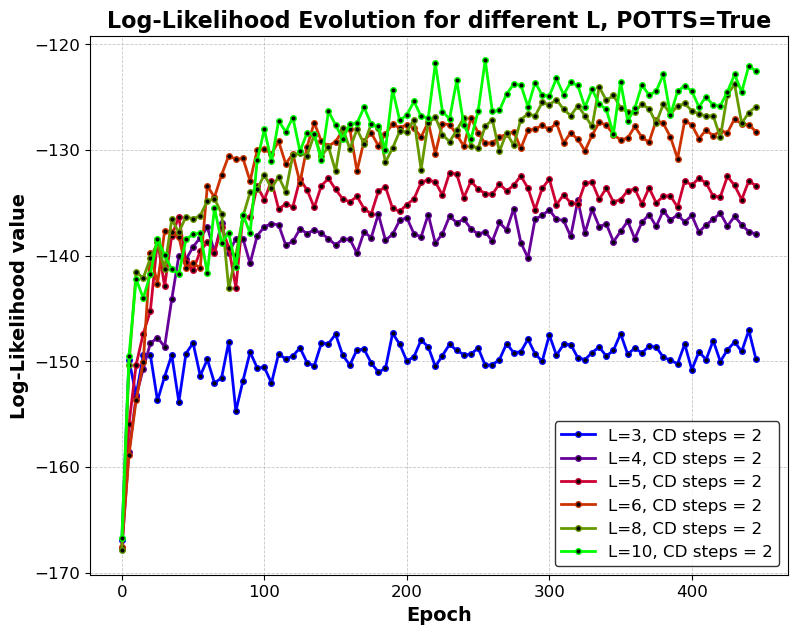

In [34]:
# drawing graphs
fig, ax1 = plt.subplots(1,1,figsize=(9,7))
num_epo=[0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 145, 150, 155, 160, 165, 170, 175, 180, 185, 190, 195, 200, 205, 210, 215, 220, 225, 230, 235, 240, 245, 250, 255, 260, 265, 270, 275, 280, 285, 290, 295, 300, 305, 310, 315, 320, 325, 330, 335, 340, 345, 350, 355, 360, 365, 370, 375, 380, 385, 390, 395, 400, 405, 410, 415, 420, 425, 430, 435, 440, 445]
L_v=[3,4,5,6,8,10]

colors = plt.cm.brg(np.linspace(0, 1, len(log_like_potts)))
for i,log_like in enumerate(log_like_potts): # fixed CD steps=2
    ax1.plot(num_epo, log_like, label=f'L={L_v[i]}, CD steps = 2',linewidth=2, color=colors[i], marker='o',markersize=4, markerfacecolor='black', markeredgewidth=1)
    ax1.set_xlabel('Epoch', fontsize=14, fontweight='bold')
    ax1.set_ylabel('Log-Likelihood value', fontsize=14, fontweight='bold')
    ax1.set_title('Log-Likelihood Evolution for different L, POTTS=True', fontsize=16, fontweight='bold')
    ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
    #ax1.set_xticks(num_epo)
    ax1.legend(fontsize=12, loc='lower right', frameon=True, edgecolor='black')

plt.show()


The general value of the Log-Likelihood are similar to the ones obtained without using the Potts model, but with a greater difference between the different L used.

In [20]:
# Log-likelyhood after transient for different L and fixed CD steps = 4: stability check and mean; mean comparison for different L

log_like_potts_m=[]
log_like_potts_m_std=[]
Nepoch=500
num_epo=np.arange(Nepoch-50,Nepoch,5)
L_v=[3,4] ##Nt=4,
gamma=0.01
POTTS=True
    
    
for L in L_v:
    Nt=4
    for iteration in range(5):
        a_all = np.load(f"WEIGHTS/a_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep500_{iteration}_reg0.01_POTTS.npy", allow_pickle=True)
        print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
        b_all= np.load(f"WEIGHTS/b_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep500_{iteration}_reg0.01_POTTS.npy", allow_pickle=True)
        print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
        w_all=np.load(f"WEIGHTS/w_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep500_{iteration}_reg0.01_POTTS.npy", allow_pickle=True)
        print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch


        log_like=[]
        log_like_std=[]
        for i in range(Nepoch-10,Nepoch,1):
            print(f'Run{iteration},Epoch n.{i}')   ### è sbagliato il print 
            ll_iter= []
            for iter in range(5): # to determine the loglike at each epoch we run the calculation 10 times and compute the average, to reduce randomness
                ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
                ll_iter.append(ll)
            ll_mean= np.array(ll_iter).mean()
            ll_std= np.array(ll_iter).std()
            log_like.append(ll_mean)
            log_like_std.append(ll_std)
            print('Log-likelihood=',ll_mean,"+-",ll_std)
        log_like_potts_m.append(log_like)
        log_like_potts_m_std.append(log_like_std)
    

a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Run0,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3698.42it/s]


Log-likelihood= -142.8385143777248 +- 0.2845755277573233
Run0,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3633.27it/s]


Log-likelihood= -142.6618204681758 +- 0.6822684203474922
Run0,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3722.17it/s]


Log-likelihood= -142.65198560037985 +- 0.608161105204832
Run0,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3500.11it/s]


Log-likelihood= -143.84160691022734 +- 0.6857022980368785
Run0,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3639.22it/s]


Log-likelihood= -143.23650817552544 +- 0.5997039540861633
Run0,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3976.36it/s]


Log-likelihood= -142.31269024784183 +- 0.19364138898808123
Run0,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3938.66it/s]


Log-likelihood= -142.13866208200253 +- 0.6877080361610229
Run0,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3829.09it/s]


Log-likelihood= -142.91175712208627 +- 0.6030205284438935
Run0,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3679.61it/s]


Log-likelihood= -142.04632398211152 +- 0.6065274832014294
Run0,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3858.69it/s]


Log-likelihood= -141.99829898745713 +- 0.6774844037011796
a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Run1,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3968.63it/s]


Log-likelihood= -143.10798248650158 +- 0.8800417043304933
Run1,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3844.95it/s]


Log-likelihood= -142.66321436325705 +- 0.6004390844910021
Run1,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3778.57it/s]


Log-likelihood= -142.7693811725447 +- 0.2377149065376178
Run1,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3802.05it/s]


Log-likelihood= -142.68344206160643 +- 0.4812514107765811
Run1,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3610.12it/s]


Log-likelihood= -142.78225986875006 +- 0.6848860095270582
Run1,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3826.10it/s]


Log-likelihood= -142.5081568480819 +- 0.749238496654943
Run1,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4015.43it/s]


Log-likelihood= -142.86297120653018 +- 0.8263989013647278
Run1,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3833.19it/s]


Log-likelihood= -142.3411559430771 +- 0.22155700240930348
Run1,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3693.92it/s]


Log-likelihood= -142.76140916407402 +- 0.29615864401148184
Run1,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3747.66it/s]


Log-likelihood= -143.63041575572737 +- 0.643252410969078
a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Run2,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3004.53it/s]


Log-likelihood= -151.6278804015506 +- 0.32325692282966756
Run2,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3611.72it/s]


Log-likelihood= -149.0996618473625 +- 0.22253214001749158
Run2,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3682.17it/s]


Log-likelihood= -149.21458568207703 +- 0.5719145840151046
Run2,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3477.36it/s]


Log-likelihood= -149.60755406970674 +- 0.5874915437377402
Run2,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3725.90it/s]


Log-likelihood= -148.84978422058384 +- 0.5041154639962497
Run2,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3656.00it/s]


Log-likelihood= -148.26382746121325 +- 0.4598814062423548
Run2,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4060.17it/s]


Log-likelihood= -149.50658016820685 +- 0.5733541051524844
Run2,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3810.85it/s]


Log-likelihood= -150.95415652279803 +- 0.2533945497694125
Run2,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4055.38it/s]


Log-likelihood= -148.68009574668312 +- 0.41862343522469936
Run2,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3747.62it/s]


Log-likelihood= -150.75741882257503 +- 0.23184843928287388
a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Run3,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3802.19it/s]


Log-likelihood= -142.76205003383546 +- 0.5311486997358797
Run3,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3612.24it/s]


Log-likelihood= -143.46096789492788 +- 0.7430853995356832
Run3,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3837.07it/s]


Log-likelihood= -144.97884276177086 +- 0.5997950769077636
Run3,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3421.84it/s]


Log-likelihood= -141.7920306887632 +- 0.8258674537450996
Run3,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3399.91it/s]


Log-likelihood= -141.97454608339137 +- 0.23639161238807
Run3,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3618.07it/s]


Log-likelihood= -143.01832002204745 +- 0.19387953344213615
Run3,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3093.67it/s]


Log-likelihood= -142.87320254844238 +- 0.5964692034964388
Run3,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3507.09it/s]


Log-likelihood= -142.30932099956743 +- 0.39201305905382
Run3,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4062.83it/s]


Log-likelihood= -142.46138534951012 +- 0.3965447553347751
Run3,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2984.16it/s]


Log-likelihood= -141.78183211954746 +- 0.7696868070867864
a_all L=3, Nt=4
b_all L=3, Nt=4
w_all L=3, Nt=4
Run4,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3596.36it/s]


Log-likelihood= -142.7370056494482 +- 0.6866680557323284
Run4,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3354.11it/s]


Log-likelihood= -142.26913573243093 +- 0.6332456578473991
Run4,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3344.05it/s]


Log-likelihood= -143.44940002665484 +- 0.7797258804970906
Run4,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3899.87it/s]


Log-likelihood= -143.7534120602882 +- 0.3650023000279444
Run4,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3824.69it/s]


Log-likelihood= -142.53861646823782 +- 0.5410912368324949
Run4,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3798.20it/s]


Log-likelihood= -141.89729872676793 +- 0.5230702106690941
Run4,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3592.34it/s]


Log-likelihood= -142.60876359694095 +- 0.9080267872580545
Run4,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3724.83it/s]


Log-likelihood= -142.95797674098577 +- 0.8004596526456097
Run4,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 4134.11it/s]


Log-likelihood= -142.68908207302036 +- 0.6688413569412303
Run4,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3854.40it/s]


Log-likelihood= -142.9113673083717 +- 0.18359687712335246
a_all L=4, Nt=4
b_all L=4, Nt=4
w_all L=4, Nt=4
Run0,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2961.19it/s]


Log-likelihood= -136.00880625103085 +- 0.46279595925014516
Run0,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2945.66it/s]


Log-likelihood= -137.5055060692685 +- 0.5940646838203194
Run0,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2846.79it/s]


Log-likelihood= -137.0889308563687 +- 0.5856703604794546
Run0,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3042.63it/s]


Log-likelihood= -139.04333135097906 +- 0.9812638054241271
Run0,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3127.87it/s]


Log-likelihood= -136.87301146275294 +- 0.4469825906174189
Run0,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3044.09it/s]


Log-likelihood= -136.99122626740888 +- 0.6502425991356782
Run0,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3072.70it/s]


Log-likelihood= -137.8494890228883 +- 0.7924017030885261
Run0,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3032.97it/s]


Log-likelihood= -137.9634850747411 +- 0.3023249095934916
Run0,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2944.68it/s]


Log-likelihood= -137.22505230157307 +- 0.7158599175342345
Run0,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3004.47it/s]


Log-likelihood= -136.221021432188 +- 0.6292588173665687
a_all L=4, Nt=4
b_all L=4, Nt=4
w_all L=4, Nt=4
Run1,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3158.45it/s]


Log-likelihood= -137.93882309478946 +- 0.61961938479306
Run1,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2766.40it/s]


Log-likelihood= -141.163175189393 +- 0.6635189955688303
Run1,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2578.82it/s]


Log-likelihood= -138.53103438742806 +- 0.49400780414000595
Run1,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2746.01it/s]


Log-likelihood= -141.28524005764365 +- 0.50581871133147
Run1,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2998.22it/s]


Log-likelihood= -139.84559963360323 +- 0.5296350647623599
Run1,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2965.84it/s]


Log-likelihood= -138.6403383195641 +- 0.631624808714395
Run1,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3100.03it/s]


Log-likelihood= -140.64912419527815 +- 0.9703633348689747
Run1,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2975.44it/s]


Log-likelihood= -140.4517505806619 +- 0.22681435293215962
Run1,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3063.79it/s]


Log-likelihood= -138.76951869277767 +- 0.22568664856256113
Run1,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2976.39it/s]


Log-likelihood= -139.88780111404247 +- 0.751967017744644
a_all L=4, Nt=4
b_all L=4, Nt=4
w_all L=4, Nt=4
Run2,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3013.03it/s]


Log-likelihood= -138.29128965396288 +- 0.40420821748751046
Run2,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2874.36it/s]


Log-likelihood= -136.0853290613204 +- 0.4692817109304288
Run2,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3041.56it/s]


Log-likelihood= -136.33137767262218 +- 0.478317364289484
Run2,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2904.82it/s]


Log-likelihood= -135.7132001346218 +- 0.23929309774549776
Run2,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3016.41it/s]


Log-likelihood= -136.648829253295 +- 0.26452634552940657
Run2,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2821.18it/s]


Log-likelihood= -137.58213736671223 +- 0.5336034527926414
Run2,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2915.10it/s]


Log-likelihood= -137.4848437633162 +- 0.27842999259268764
Run2,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3116.35it/s]


Log-likelihood= -138.68206844037792 +- 0.5272010115020079
Run2,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2403.02it/s]


Log-likelihood= -137.13558498458033 +- 0.39534620940038767
Run2,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2918.22it/s]


Log-likelihood= -137.99270453582136 +- 0.21203485475238637
a_all L=4, Nt=4
b_all L=4, Nt=4
w_all L=4, Nt=4
Run3,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3032.56it/s]


Log-likelihood= -137.40729291197346 +- 0.5086757864920859
Run3,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2968.91it/s]


Log-likelihood= -136.60234621834167 +- 0.6327476763767106
Run3,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2977.10it/s]


Log-likelihood= -138.47331497102877 +- 0.37472388580474103
Run3,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2950.82it/s]


Log-likelihood= -137.30176003018488 +- 0.43825497489296167
Run3,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2999.28it/s]


Log-likelihood= -136.2190497359949 +- 0.810349892350318
Run3,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3050.24it/s]


Log-likelihood= -136.07027198031676 +- 0.9420881351714363
Run3,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2571.26it/s]


Log-likelihood= -137.4050443969423 +- 0.6696276400615208
Run3,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2998.80it/s]


Log-likelihood= -137.0547452256346 +- 0.23825318692556302
Run3,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3012.62it/s]


Log-likelihood= -136.06223947481215 +- 0.7702304485631898
Run3,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3075.01it/s]


Log-likelihood= -135.0355673131799 +- 0.14787017534103414
a_all L=4, Nt=4
b_all L=4, Nt=4
w_all L=4, Nt=4
Run4,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3060.10it/s]


Log-likelihood= -136.9719836272363 +- 0.55576170241564
Run4,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2813.69it/s]


Log-likelihood= -136.64930757691906 +- 0.5870370062424887
Run4,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2830.78it/s]


Log-likelihood= -136.95220875502005 +- 0.5485011800474816
Run4,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3005.58it/s]


Log-likelihood= -137.0908667133781 +- 0.7667616659017944
Run4,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2566.35it/s]


Log-likelihood= -138.2466912142292 +- 0.7512764879805838
Run4,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2968.99it/s]


Log-likelihood= -137.3742334130421 +- 0.2879348061234163
Run4,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2837.39it/s]


Log-likelihood= -136.130472827069 +- 0.6852809212844811
Run4,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2850.76it/s]


Log-likelihood= -136.51764325475784 +- 0.1688451013212406
Run4,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2347.51it/s]


Log-likelihood= -137.98382012508293 +- 0.4503716546805675
Run4,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2809.72it/s]

Log-likelihood= -137.0320631949267 +- 0.40906341547254454


In [17]:
#TRAINING FOR L=7 AND POTTS
log_like_7_potts=[]
log_like_7_std_potts=[]
Nepoch=500
num_epo=np.arange(Nepoch-50,Nepoch,5)
L_v=[7] ## Nt=4,
gamma=0.01
POTTS=True
    
    
for L in L_v:
    Nt=4
    for iteration in range(5):
                        
        a_all = np.load(f"WEIGHTS/a_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep500_{iteration}_reg0.01_POTTS.npy", allow_pickle=True)
        print(f'a_all L={L}, Nt={Nt}')  ## 1 peso per visible per epoch
        b_all= np.load(f"WEIGHTS/b_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep500_{iteration}_reg0.01_POTTS.npy", allow_pickle=True)
        print(f'b_all L={L}, Nt={Nt}')  ## 1 peso per hidden per epoch
        w_all=np.load(f"WEIGHTS/w_RBM_Potts_MNIST3_L{L}_Nt{Nt}_RMSprop-0.05-0.05_Ep500_{iteration}_reg0.01_POTTS.npy", allow_pickle=True)
        print(f'w_all L={L}, Nt={Nt}') ## matrice visible*hidden per epoch


        log_like=[]
        log_like_std=[]
        for i in range(Nepoch-10,Nepoch,1):
            print(f'Run{iteration},Epoch n.{i}')   ## è sbagliato il print 
            ll_iter= []
            for iter in range(5): # to determine the loglike at each epoch we run the calculation 10 times and compute the average, to reduce randomness
                ll=compute_log_likelihood(w_all[i], a_all[i], b_all[i], data)
                ll_iter.append(ll)
            ll_mean= np.array(ll_iter).mean()
            ll_std= np.array(ll_iter).std()
            log_like.append(ll_mean)
            log_like_std.append(ll_std)
            print('Log-likelihood=',ll_mean,"+-",ll_std)
        log_like_7_potts.append(log_like)
        log_like_7_std_potts.append(log_like_std)
    

a_all L=7, Nt=4
b_all L=7, Nt=4
w_all L=7, Nt=4
Run0,Epoch n.490


/tmp/ipykernel_13356/1603196961.py:51: NumbaPendingDeprecationWarning:                 | 0/5498 [00:00<?, ?it/s]
Encountered the use of a type that is scheduled for deprecation: type 'reflected list' found for argument 'all_z' of function 'compute_free_energy_term'.

For more information visit https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-reflection-for-list-and-set-types

File "../../../../tmp/ipykernel_13356/1603196961.py", line 78:
<source missing, REPL/exec in use?>

  first_term = compute_free_energy_term(w, a, b, x, all_z, q, D)
/tmp/ipykernel_13356/1603196961.py:52: NumbaPendingDeprecationWarning: 
Encountered the use of a type that is scheduled for deprecation: type 'reflected list' found for argument 'all_z' of function 'compute_partition_function'.

For more information visit https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-reflection-for-list-and-set-types

File "../../../../tmp/ipykernel_13356/1603196961.py"

Log-likelihood= -126.18846746125887 +- 0.6139271938676208
Run0,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3151.01it/s]


Log-likelihood= -125.96278514105632 +- 0.717640241604986
Run0,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2924.20it/s]


Log-likelihood= -126.27719638466063 +- 0.14195213463836556
Run0,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3109.50it/s]


Log-likelihood= -127.02514304916119 +- 0.4260950128107838
Run0,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2874.69it/s]


Log-likelihood= -126.60245675612023 +- 0.5609988487754255
Run0,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2712.55it/s]


Log-likelihood= -129.78803804363676 +- 0.3750186558898475
Run0,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3143.98it/s]


Log-likelihood= -128.66245483028655 +- 0.5357908793242246
Run0,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3176.16it/s]


Log-likelihood= -127.43985596375406 +- 0.5600856622278844
Run0,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3164.46it/s]


Log-likelihood= -127.45407607768365 +- 0.8151955232509299
Run0,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3175.02it/s]


Log-likelihood= -126.2345210152836 +- 0.5023757440624803
a_all L=7, Nt=4
b_all L=7, Nt=4
w_all L=7, Nt=4
Run1,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3151.64it/s]


Log-likelihood= -127.96497682908064 +- 0.35826985357427016
Run1,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3075.53it/s]


Log-likelihood= -126.55262843620967 +- 0.5003484402108913
Run1,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3181.23it/s]


Log-likelihood= -128.36928467171043 +- 0.6290724136806923
Run1,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3178.39it/s]


Log-likelihood= -127.07884400762387 +- 0.29877331296751597
Run1,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3202.34it/s]


Log-likelihood= -128.5669285130655 +- 0.36894563978400424
Run1,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3171.82it/s]


Log-likelihood= -127.5593057496892 +- 0.3160933237427284
Run1,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3102.09it/s]


Log-likelihood= -129.02348489988157 +- 0.4426035577515356
Run1,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3164.82it/s]


Log-likelihood= -128.15548858264475 +- 0.6190598759020489
Run1,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3132.58it/s]


Log-likelihood= -127.74392851081045 +- 0.5120335299136725
Run1,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2973.96it/s]


Log-likelihood= -129.64567220958025 +- 0.47999286803959856
a_all L=7, Nt=4
b_all L=7, Nt=4
w_all L=7, Nt=4
Run2,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3174.74it/s]


Log-likelihood= -131.03103558365166 +- 0.5169883760723877
Run2,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3142.93it/s]


Log-likelihood= -128.70190559439885 +- 0.4387264517256202
Run2,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3129.98it/s]


Log-likelihood= -127.25054233580677 +- 0.44835945758891543
Run2,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3134.61it/s]


Log-likelihood= -126.08303914224135 +- 0.2830229013773082
Run2,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3179.65it/s]


Log-likelihood= -127.20479227514309 +- 0.5976975473829043
Run2,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3016.65it/s]


Log-likelihood= -128.84754234195023 +- 0.6163225176789122
Run2,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3088.99it/s]


Log-likelihood= -125.85063112910738 +- 0.5048391702955841
Run2,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2865.62it/s]


Log-likelihood= -128.55219675471932 +- 0.5010105675861224
Run2,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3186.82it/s]


Log-likelihood= -128.40974341625915 +- 0.3926046592281098
Run2,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3179.16it/s]


Log-likelihood= -129.341546151099 +- 0.5412616016767648
a_all L=7, Nt=4
b_all L=7, Nt=4
w_all L=7, Nt=4
Run3,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2808.68it/s]


Log-likelihood= -127.12538986455141 +- 0.4568863573540732
Run3,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2258.63it/s]


Log-likelihood= -128.18047638765194 +- 0.7025141305943399
Run3,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:02<00:00, 2335.26it/s]


Log-likelihood= -128.0064944420539 +- 0.7407718817241458
Run3,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2977.19it/s]


Log-likelihood= -128.01877384277955 +- 0.3899999288161879
Run3,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3019.79it/s]


Log-likelihood= -128.38394245958477 +- 0.47350788047788694
Run3,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3057.51it/s]


Log-likelihood= -126.83437006103527 +- 0.6654192895030612
Run3,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2850.79it/s]


Log-likelihood= -126.97213622926456 +- 0.5815038892106078
Run3,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2925.57it/s]


Log-likelihood= -127.43585169749194 +- 0.549608113340072
Run3,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3134.92it/s]


Log-likelihood= -127.44867830888533 +- 0.3942952499809725
Run3,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3058.98it/s]


Log-likelihood= -127.16517318025736 +- 0.39504342530164577
a_all L=7, Nt=4
b_all L=7, Nt=4
w_all L=7, Nt=4
Run4,Epoch n.490


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2857.26it/s]


Log-likelihood= -127.50487553382247 +- 0.2106855706422518
Run4,Epoch n.491


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3178.91it/s]


Log-likelihood= -129.4644021508662 +- 0.34720663732743146
Run4,Epoch n.492


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3160.43it/s]


Log-likelihood= -126.64115738042203 +- 0.36851422200293255
Run4,Epoch n.493


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3177.68it/s]


Log-likelihood= -128.34926212151458 +- 0.739720958874678
Run4,Epoch n.494


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3115.20it/s]


Log-likelihood= -129.0023687267109 +- 0.43968825765936725
Run4,Epoch n.495


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3045.56it/s]


Log-likelihood= -128.8604472133889 +- 0.7747023854720048
Run4,Epoch n.496


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3190.13it/s]


Log-likelihood= -128.5245008373322 +- 0.5430576137968461
Run4,Epoch n.497


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 2998.09it/s]


Log-likelihood= -128.15310611960425 +- 0.5089818387113748
Run4,Epoch n.498


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3172.41it/s]


Log-likelihood= -128.73887426070561 +- 0.42376108040623583
Run4,Epoch n.499


Computing log-likelihood: 100%|███████████████████████████████████████████████████| 5498/5498 [00:01<00:00, 3130.28it/s]

Log-likelihood= -127.5370635656058 +- 0.35728982073802945


In [15]:

log_like_3_potts =[ [
    -142.8385143777248, 
    -142.6618204681758, 
    -142.65198560037985, 
    -143.84160691022734, 
    -143.23650817552544, 
    -142.31269024784183, 
    -142.13866208200253, 
    -142.91175712208627, 
    -142.04632398211152, 
    -141.99829898745713
], [
    -143.10798248650158, 
    -142.66321436325705, 
    -142.7693811725447, 
    -142.68344206160643, 
    -142.78225986875006, 
    -142.5081568480819, 
    -142.86297120653018, 
    -142.3411559430771, 
    -142.76140916407402, 
    -143.63041575572737
], [
    -151.6278804015506, 
    -149.0996618473625, 
    -149.21458568207703, 
    -149.60755406970674, 
    -148.84978422058384, 
    -148.26382746121325, 
    -149.50658016820685, 
    -150.95415652279803, 
    -148.68009574668312, 
    -150.75741882257503], [-142.76,-143.46,-144.98,-141.79,-141.97,-143.02,-142.87,-142.31, -142.461, -141.78 ],  
    [-142.7370056494482, -142.26913573243093, -143.44940002665484, -143.7534120602882, -142.53861646823782, 
     -141.897, -142.609,-142.958,-142.69,-142.911] ]

log_like_3_std_potts =[ [
    0.2845755277573233, 
    0.6822684203474922, 
    0.608161105204832, 
    0.6857022980368785, 
    0.5997039540861633, 
    0.19364138898808123, 
    0.6877080361610229, 
    0.6030205284438935, 
    0.6065274832014294, 
    0.6774844037011796],[
    0.8800417043304933, 
    0.6004390844910021, 
    0.2377149065376178, 
    0.4812514107765811, 
    0.6848860095270582, 
    0.749238496654943, 
    0.8263989013647278, 
    0.22155700240930348, 
    0.29615864401148184, 
    0.643252410969078], [
    0.32325692282966756, 
    0.22253214001749158, 
    0.5719145840151046, 
    0.5874915437377402, 
    0.5041154639962497, 
    0.4598814062423548, 
    0.5733541051524844, 
    0.2533945497694125, 
    0.41862343522469936, 
    0.23184843928287388],   
    [-0.5311486997358797, -0.7430853995356832, -0.5997950769077636, -0.8258674537450996, -0.23639161238807, 
    -0.19387953344213615, -0.5964692034964388, -0.39201305905382, -0.3965447553347751, -0.7696868070867864],
    
    [-0.6866680557323284, -0.6332456578473991, -0.7797258804970906, -0.3650023000279444, -0.5410912368324949, 
    -0.5230702106690941, -0.9080267872580545, -0.8004596526456097, -0.6688413569412303, -0.183] ]    

log_like_4_potts=[ [
    -136.00880625103085,
    -137.5055060692685,
    -137.0889308563687,
    -139.04333135097906,
    -136.87301146275294,
    -136.99122626740888,
    -137.8494890228883,
    -137.9634850747411,
    -137.22505230157307,
    -136.221021432188
], [
    -137.93882309478946,
    -141.163175189393,
    -138.53103438742806,
    -141.28524005764365,
    -139.84559963360323,
    -138.6403383195641,
    -140.64912419527815,
    -140.4517505806619,
    -138.76951869277767,
    -139.88780111404247
],[
    -138.29128965396288,
    -136.0853290613204,
    -136.33137767262218,
    -135.7132001346218,
    -136.648829253295,
    -137.58213736671223,
    -137.4848437633162,
    -138.68206844037792,
    -137.13558498458033,
    -137.99270453582136
],  [
    -137.40729291197346,
    -136.60234621834167,
    -138.47331497102877,
    -137.30176003018488,
    -136.2190497359949,
    -136.07027198031676,
    -137.4050443969423,
    -137.0547452256346,
    -136.06223947481215,
    -135.0355673131799
],[
    -136.9719836272363,
    -136.64930757691906,
    -136.95220875502005,
    -137.0908667133781,
    -138.2466912142292,
    -137.3742334130421,
    -136.130472827069,
    -136.51764325475784,
    -137.98382012508293,
    -137.0320631949267] ]

log_like_4_std_potts=[ [
    0.46279595925014516,
    0.5940646838203194,
    0.5856703604794546,
    0.9812638054241271,
    0.4469825906174189,
    0.6502425991356782,
    0.7924017030885261,
    0.3023249095934916,
    0.7158599175342345,
    0.6292588173665687
], [
    0.61961938479306,
    0.6635189955688303,
    0.49400780414000595,
    0.50581871133147,
    0.5296350647623599,
    0.631624808714395,
    0.9703633348689747,
    0.22681435293215962,
    0.22568664856256113,
    0.751967017744644
],[
    0.40420821748751046,
    0.4692817109304288,
    0.478317364289484,
    0.23929309774549776,
    0.26452634552940657,
    0.5336034527926414,
    0.27842999259268764,
    0.5272010115020079,
    0.39534620940038767,
    0.21203485475238637
], [
    0.5086757864920859,
    0.6327476763767106,
    0.37472388580474103,
    0.43825497489296167,
    0.810349892350318,
    0.9420881351714363,
    0.6696276400615208,
    0.23825318692556302,
    0.7702304485631898,
    0.14787017534103414
], [
    0.55576170241564,
    0.5870370062424887,
    0.5485011800474816,
    0.7667616659017944,
    0.7512764879805838,
    0.2879348061234163,
    0.6852809212844811,
    0.1688451013212406,
    0.4503716546805675,
    0.40906341547254454
]]



log_like_5_potts = [[-133.06665557375032, -136.2411988714516, -133.5468045619381, -134.55787819612624, -133.624754405044,
     -133.22660697792438, -134.02745546577157, -134.64055038419397, -133.3056161078319, -133.00788145619356],
    [-133.3304787066532, -133.15215698731856, -133.08296856590923, -132.99265281672314, -133.5185308890756,
     -133.362435081148, -134.9206151982437, -133.6429163630215, -132.6834107353068, -134.83056434430213],
    [-134.2838067340851, -132.33041313090362, -132.98145771260377, -132.83944291868875, -133.31056302009742,
     -133.18603854085592, -134.23913853664808, -134.41909472233615, -133.76641290186052, -134.62672974190335],
    [-133.84212711648016, -133.83146499630692, -134.97168890124198, -132.89434940708207, -132.67789253907873,
     -133.20809275158257, -133.14550291056315, -132.7394983941093, -133.41505791343258, -132.43728555335298],
    [-131.72749310295958, -132.0859065560093, -131.50591212804335, -132.56434289984048, -132.18455686769477,
     -130.81274478180947, -131.75739914307215, -131.36291692640475, -131.7613662770538, -132.02119956331438]]

log_like_5_std_potts=[[0.4660269847649866, 0.41866593937152774, 0.5448696653106866, 0.7209645724190747, 0.4330189585986699,
     0.5148395414141907, 0.42815581540735304, 0.41890788605386114, 0.7842740607577432, 0.32975121957620884],
    [0.47767554384992955, 0.40270367868329027, 0.4480340989960268, 0.40636011709710756, 0.4446800464970249,
     0.47474308178495866, 0.3752493394356433, 0.4465931703677866, 0.546693403083396, 0.627265648038587],
    [0.5067494114557575, 0.48229126856115395, 0.447305483506764, 0.35485778404073715, 0.688576149070465,
     0.40864821212737906, 0.4253161501810541, 0.4904528648355204, 0.46160066684204143, 0.3821750390488137],
    [0.5218829880233283, 0.5086405037459849, 0.3443724132392082, 0.4781475817702396, 0.4731476355146348,
     0.6355343892356663, 0.5284268390046007, 0.46945121840667736, 0.433447612077518, 0.6924162371688007],
    [0.6655116905101618, 0.4250011135608506, 0.6490173163050429, 0.6075909242421106, 0.5246554650279508,
     0.6290605241388906, 0.5932833083553192, 0.5870956704651753, 0.209638235535842, 1.059534062663594]]


log_like_6_potts=[[-127.70182374117579, -129.24433081691336, -128.4716409083597, -127.87355946092893, -127.69434810046019,
     -127.80838890917553, -127.96314567304928, -129.55534246450642, -127.88503228917394, -127.42336488223194],
    [-128.07707309283742, -127.58759311304614, -129.1416877383633, -127.74699216394052, -128.80958664358803,
     -127.82304608308978, -129.00012425478502, -128.38489048421417, -127.33972417521314, -130.42179802779216],
    [-135.45670486379302, -133.55416251156856, -131.87639643021353, -133.04040469943268, -131.72271611285913,
     -132.06322890899392, -132.40967310426322, -133.9467936202381, -130.88369977706705, -133.62006421968667],
    [-128.83679477093236, -129.00342052088962, -129.06694201570474, -128.11119575810463, -127.87072120668317,
     -128.24628848542406, -128.16290494143618, -127.61002068121869, -128.37052102848685, -127.89710329082213],
    [-128.72569825588005, -128.1468881972466, -127.70341669910417, -128.0370368546655, -128.18782969478644,
     -127.39769079698722, -128.0053747507785, -128.08178040891164, -128.77286346226688, -128.16902502163646]]


log_like_6_std_potts=[[0.49207728703028536, 0.9370566991323053, 0.5256896021454679, 0.44483910542903077, 0.7134054017406346,
     0.6309100013591447, 0.5077492038034044, 0.390297358775938, 0.3986632346355174, 0.22917690328360496],
    [0.696524331029572, 0.30390097747209843, 0.5109392979028903, 0.1709724129792967, 0.43379531322311554,
     0.6248165493629504, 0.46570980034235726, 0.41643798687853084, 0.6479161508370055, 0.3080338721763489],
    [0.4832213845647398, 0.4608077951892626, 0.6104481057470478, 0.5471967420945689, 0.45618041172164087,
     0.4462109034933835, 0.4389411229029869, 0.11491617081657886, 0.4657102738995319, 0.3430989798962216],
    [0.8346084559980113, 0.4271864662350153, 0.45569467929986457, 0.15342165952382428, 0.865965823348968,
     0.4950394147928598, 0.6780977245306542, 0.692168994632496, 0.3087142552142252, 0.4413129152953942],
    [0.521218045401626, 0.3039220189096196, 0.5859110331004793, 0.4723243641042371, 0.30714204711316306,
     0.23508912783792102, 0.8484165171743853, 0.3273962837052807, 0.7230190269316806, 0.3644129206286122]]


log_like_7_potts = [
    [-126.18846746125887, -125.96278514105632, -126.27719638466063, -127.02514304916119, -126.60245675612023, 
     -129.78803804363676, -128.66245483028655, -127.43985596375406, -127.45407607768365, -126.2345210152836],
    
    [-127.96497682908064, -126.55262843620967, -128.36928467171043, -127.07884400762387, -128.5669285130655, 
     -127.5593057496892, -129.02348489988157, -128.15548858264475, -127.74392851081045, -129.64567220958025],

    [-131.03103558365166, -128.70190559439885, -127.25054233580677, -126.08303914224135, -127.20479227514309, 
     -128.84754234195023, -125.85063112910738, -128.55219675471932, -128.40974341625915, -129.341546151099],
    
    [-127.12538986455141, -128.18047638765194, -128.0064944420539, -128.01877384277955, -128.38394245958477, 
     -126.83437006103527, -126.97213622926456, -127.43585169749194, -127.44867830888533, -127.16517318025736],

    [-127.50487553382247, -129.4644021508662, -126.64115738042203, -128.34926212151458, -129.0023687267109, 
     -128.8604472133889, -128.5245008373322, -128.15310611960425, -128.73887426070561, -127.5370635656058]]

log_like_7_std_potts = [

    [0.6139271938676208, 0.717640241604986, 0.14195213463836556, 0.4260950128107838, 0.5609988487754255,
     0.3750186558898475, 0.5357908793242246, 0.5600856622278844, 0.8151955232509299, 0.5023757440624803],

    [0.35826985357427016, 0.5003484402108913, 0.6290724136806923, 0.29877331296751597, 0.36894563978400424,
     0.3160933237427284, 0.4426035577515356, 0.6190598759020489, 0.5120335299136725, 0.47999286803959856],
    
    [0.5169883760723877, 0.4387264517256202, 0.44835945758891543, 0.2830229013773082, 0.5976975473829043,
     0.6163225176789122, 0.5048391702955841, 0.5010105675861224, 0.3926046592281098, 0.5412616016767648],
    
   [0.4568863573540732, 0.7025141305943399, 0.7407718817241458, 0.3899999288161879, 0.47350788047788694,
     0.6654192895030612, 0.5815038892106078, 0.549608113340072, 0.3942952499809725, 0.39504342530164577],
    
    [0.2106855706422518, 0.34720663732743146, 0.36851422200293255, 0.739720958874678, 0.43968825765936725,
     0.7747023854720048, 0.5089818387113748, 0.42376108040623583, 0.5430576137968461, 0.35728982073802945]]


log_like_8_potts= [[-125.71637707424136, -126.50473535373649, -126.46216581497247, -127.56471292553347, -125.35698707362363, -126.04597098033098, -125.50195671500224, -128.34040571229266, -126.61390398354567, -125.4685345598544],
 [-126.39454485796576, -126.83915860011477, -126.46154481316634, -126.88161256467836, -127.11932396711188, -125.43823059649114, -128.8869080210403, -127.18991688564203, -126.24226820401739, -128.01582864525432],
[-126.21053542806195, -125.35448992466927, -125.76657361534214, -125.87526718293273, -126.1726267214259, -126.29267640167177, -124.78854633100227, -125.17884137728561, -126.45667076865723, -125.14043561940511],
 [-130.0870349785165, -126.19190403699463, -127.2012865949135, -126.36023817158716, -125.33739256760944, -125.16799186742205, -126.45110100948168, -126.16447161655097, -127.89042776494435, -124.82087135040229], 
[-126.37854270101006, -126.62231058109373, -126.39190608636788, -126.54783393679251, -127.96969601214991, -126.5575883759587, -125.73793832546214, -125.54474425250835, -127.84779461100682, -126.10742434080308]]

 
log_like_8_std_potts= [[0.5242411570322685, 0.20773644593820909, 0.2946747273993942, 0.6320747299116576, 0.49880786724793447, 0.7304320834667021, 0.26501271391237113, 0.5648638500012322, 0.5987155781163216, 0.729288273765773],
 [0.208482416812572, 0.41802350090537993, 0.43105599498108005, 0.4813761163417976, 0.30189321926538515, 0.5828345620021111, 0.3629937734692268, 0.5858909414058595, 0.36371915294442614, 0.5804217062431454],
 [0.34168573744582303, 0.6305908564148285, 0.7739265012610096, 0.369627829837257, 0.45987428059685465, 0.36291749040281734, 0.5015871097295224, 0.8425940350627313, 0.3008308056029241, 0.3297075289526236],
 [0.2352383702441224, 0.3960772298961245, 0.5632573636479853, 0.2350838022654036, 0.47052927106135234, 0.5120159672701432, 0.2072736247041251, 0.599385416632587, 0.3758580570385094, 0.593597022535655],
[0.43184107809100214, 0.34095506471941067, 0.4804309686719111, 0.3526013020690959, 0.8641081659275365, 0.7145498712971713, 0.659771292687679, 0.29648103847245966, 0.40383017676424493, 0.15326372039686575]]

log_like_10_potts=[
    [-124.46138971277864, -125.58435547535491, -123.66183849483937, -126.53366377483164, -123.5138455855049, -124.89591612177769, -123.9064035649338, -126.58614384542025, -125.20773355655263, -123.79491134649759],
    [-124.67525842038951, -125.52494787040212, -123.6578811141306, -126.05311621945361, -126.10159732997272, -125.62787577198182, -123.7979586458149, -125.04604923423388, -124.24138544048142, -123.54851065855146],
    [-124.41230132770636, -123.40449026232304, -124.60521802070134, -125.19927855580508, -125.40907689699483, -125.0137625081143, -123.8653018772716, -123.60928997361309, -125.37776622210677, -124.17883437731908],
    [-126.54034424284706, -124.28572759188732, -125.6104024112044, -124.01400552820658, -124.98132856108619, -124.49432076732566, -123.9693158004701, -123.65409898012176, -125.81549160023542, -123.05525886642977],
    [-125.69595352227611, -123.88755204426022, -126.59616663707934, -124.39836288597681, -126.68742137481334, -124.25606966898533, -125.34572119911904, -125.35616799093057, -125.57894408898214, -124.17026009040322]
]

log_like_10_std_potts=[[0.30827724974618514, 0.42897800203587927, 0.41767215971010035, 0.6615667568060707, 0.46258988539367946, 0.6402311052814584, 0.4864163394491967, 0.5183174709965811, 0.3428545201603366, 0.48318864003659917],
    [0.3313152026978764, 0.374901907302543, 0.2566822845659447, 0.5998118518797942, 0.5544366277914647, 0.2968678120772721, 0.5956976126021456, 0.7542329755277937, 0.8764805832410155, 0.2971459520948696],
    [0.41115118019592, 0.3170878730359906, 0.35793676272356106, 0.4013712117997366, 0.5443419943831964, 0.3852056633751165, 0.5848481474201653, 0.3444133498039513, 0.5812748898322684, 0.12942051531600107],
    [0.4544819328029797, 0.5532045565465463, 0.42484358664880634, 0.470462266201951, 0.7646821958058515, 0.42133766723420485, 0.48573957774275733, 0.3350072452587401, 0.39457677223070525, 0.4004866820562077],
    [0.8627272958265009, 0.6857161278894337, 0.24122335538970613, 0.8142058656971821, 0.41214267462983084, 0.6541508633154997, 0.41254488826801705, 0.4394514151150776, 0.5901572817395558, 0.23930586648783217]]

In [16]:

log_like_8_spins=[[-160.37139409523573, -160.46274728580755,
-159.91047870844244, -159.2063775202676, -161.57940923418937,
-161.4895729282414, -162.0599199732996, -161.24282571426673,
-163.06686563564463, -159.5751917602287],
 [-139.47083101568094, -142.94112033044712, -141.09374695781986,
-138.19287819769028, -145.3649371068853, -141.09984045727893,
-144.57252618689435, -141.50571347282923, -143.52679847704968,
-142.36224954906794],
 [-147.39124066038877, -149.27533914890583, -148.0131614442723,
-149.20356405251147, -147.06804758371732, -147.64574730893673,
-147.32390596211576, -145.78291830637525, -142.95313678408237,
-142.09504770773245],
 [-124.23354797382471, -124.09846031389483, -124.69931729442155,
-122.6332918914278, -122.89088609395321, -121.99633911993828,
-127.02408370685603, -125.79225026537725, -125.25822358697125,
-125.29698959709212],
]

log_like_8_std_spins=[[0.48867276190331144, 0.6464431906007896,
0.4898623876987881, 0.574105569071363, 0.8773937538701632,
0.5728917613231503, 0.5670045735465263, 0.2722668589613119,
0.23538437025273376, 0.4824403694917466],
 [0.39051688975486115, 0.7056054790740119, 0.3541503567825023,
0.7111567964683838, 0.6406289991060468, 0.35703808262734765,
0.44091198160034484, 0.3005786629003059, 0.7011070961152939,
0.4721995790196096],
 [0.4522086840133713, 0.4667003601573527, 0.681534496672195,
0.5859593798472859, 0.19421452278250756, 0.6228091385077417,
0.2778854793393488, 0.5162703132425491, 0.3442489175566128,
0.5422924530765294],
 [0.3799050582396115, 0.5282031408282811, 0.42690854262106365,
0.5021250636533905, 0.6771519115126325, 0.13630029899302035,
0.4313015323685672, 0.44860066770021934, 0.3185130977343258,
0.8016712667625311],
 [0.7934814660147569, 0.4578655112380039, 0.6836799327302187,
0.444631980093378, 0.35239065350145765, 0.8719101525409553,
0.31614265040752704, 0.2341955884601087, 0.6530857183652384,
0.27015824233509667]]

log_like_6_spins=[[-127.70182374117579, -129.24433081691336,
-128.4716409083597, -127.87355946092893, -127.69434810046019,
-127.80838890917553, -127.96314567304928, -129.55534246450642,
-127.88503228917394, -127.42336488223194],
    [-128.07707309283742, -127.58759311304614, -129.1416877383633,
-127.74699216394052, -128.80958664358803, -127.82304608308978,
-129.00012425478502, -128.38489048421417, -127.33972417521314,
-130.42179802779216],
    [-135.45670486379302, -133.55416251156856, -131.87639643021353,
-133.04040469943268, -131.72271611285913, -132.06322890899392,
-132.40967310426322, -133.9467936202381, -130.88369977706705,
-133.62006421968667],
    [-128.83679477093236, -129.00342052088962, -129.06694201570474,
-128.11119575810463, -127.87072120668317, -128.24628848542406,
-128.16290494143618, -127.61002068121869, -128.37052102848685,
-127.89710329082213],
    [-128.72569825588005, -128.1468881972466, -127.70341669910417,
-128.0370368546655, -128.18782969478644, -127.39769079698722,
-128.0053747507785, -128.08178040891164, -128.77286346226688,
-128.16902502163646]]

log_like_6_std_spins=[[0.49207728703028536, 0.9370566991323053,
0.5256896021454679, 0.44483910542903077, 0.7134054017406346,
0.6309100013591447, 0.5077492038034044, 0.390297358775938,
0.3986632346355174, 0.22917690328360496],
    [0.696524331029572, 0.30390097747209843, 0.5109392979028903,
0.1709724129792967, 0.43379531322311554, 0.6248165493629504,
0.46570980034235726, 0.41643798687853084, 0.6479161508370055,
0.3080338721763489],
    [0.4832213845647398, 0.4608077951892626, 0.6104481057470478,
0.5471967420945689, 0.45618041172164087, 0.4462109034933835,
0.4389411229029869, 0.11491617081657886, 0.4657102738995319,
0.3430989798962216],
    [0.8346084559980113, 0.4271864662350153, 0.45569467929986457,
0.15342165952382428, 0.865965823348968, 0.4950394147928598,
0.6780977245306542, 0.692168994632496, 0.3087142552142252,
0.4413129152953942],
    [0.521218045401626, 0.3039220189096196, 0.5859110331004793,
0.4723243641042371, 0.30714204711316306, 0.23508912783792102,
0.8484165171743853, 0.3273962837052807, 0.7230190269316806,
0.3644129206286122]]

log_like_4_spins=[[-127.06421727378861, -125.29343342416458,
-127.92690113784747, -127.28175218401573, -127.42767852330549,
-126.76684757725384, -126.89803450994168, -127.03688574447293,
-126.75379061109398, -127.30525018531424],
    [-129.67735098150965, -130.55360330605544, -129.04888068612422,
-129.7485626374749, -129.10222997332863, -129.5207046429552,
-129.8739311122862, -129.13029888570063, -128.21618682525408,
-129.1779012839873],
    [-125.42508214864802, -123.79281725426127, -123.68085683690931,
-124.24430392761496, -124.37024506749908, -124.31113247398511,
-124.46032225426661, -124.13630719269818, -124.83938362212707,
-125.46918784353598],
    [-128.6472347091129, -128.38832754447975, -127.14223353432223,
-127.03279240069233, -126.33571283588454, -127.29543748650715,
-126.70737981521427, -127.0582743961938, -125.50551735925599,
-126.9706050343373],
    [-134.1538154821438, -134.23332440261325, -135.06849939114537,
-136.25032209840342, -135.33901458316984, -135.89491855294787,
-137.00255837371245, -135.3980906740764, -134.66892304841366,
-134.3961556525237]]

log_like_4_std_spins=[[0.4607965786635718, 0.3136889847947695,
0.5510650459001151, 0.4576085366966941, 0.27599135554743226,
0.90712650123842, 0.923219029336598, 0.4393572294130516,
0.3143221945535302, 0.17637156872093915],
    [0.4209054184822899, 0.46190598833280144, 0.7716183572941424,
0.5716686671363163, 0.4620958125933314, 0.2614654150318511,
0.7323232438652023, 0.4189838699018291, 0.4521878577520377,
0.4740313281310478],
    [0.728781759780408, 0.5458970289360231, 0.646294654528952,
0.7882936629194836, 0.4735611613484303, 0.18741498364656203,
0.40144851152048244, 0.6654066547169972, 0.37661963980970625,
0.35755192778025285],
    [0.8711583957758524, 0.24606603384862014, 0.46476353904104606,
0.4903402853218522, 0.26686389444597575, 0.7971493407309655,
0.563533643383269, 0.5764878359741434, 0.40364760879383765,
0.8072298240652753],
    [0.47487826095452296, 0.6170866332831092, 0.5792412209579159,
0.5150121053726571, 0.6926524509543045, 0.4989596328536221,
0.7644283630329979, 0.3614479894393869, 0.7226047762154868,
0.42445784275994863]]

log_like_3_spins=[[-137.62910605382996, -137.9972706401752,
-137.75541616751212, -136.45764216608165, -137.90980503400147,
-135.03992261220975, -135.07074609779943, -136.6792975964839,
-136.70549836884703, -134.5052018026467],
    [-134.97123008300963, -134.1880193128125, -134.7880341039024,
-132.3039609037274, -133.4179089306303, -134.4350004607094,
-135.1035550537867, -134.63241105451186, -134.6430607626483,
-135.3929333225505],
    [-134.79823021757923, -135.44165454416603, -134.44313608534875,
-134.190110228302, -134.29826634702118, -134.14551853699155,
-134.0810737785217, -132.89166309890885, -133.64282152392485,
-134.7898636638669],
    [-133.86178175533175, -133.80334806918768, -133.5288666355262,
-133.8253902466172, -133.21238524478264, -133.52101008138823,
-134.34627969758614, -134.25161497344286, -133.8861032331426,
-134.41626018758058],
    [-136.44765052694257, -135.21777887194605, -136.43981823035895,
-136.0572481343236, -136.25065824330736, -138.40609248001604,
-137.91019966355157, -139.088436342093, -136.99404478244446,
-135.81828089854054]]

log_like_3_std_spins=[[0.6239332479190048, 0.1868356057211374,
0.3675135093367271, 0.6860500033137764, 0.708818583117641,
0.31637255145494836, 0.5161822344095626, 0.5384263824808412,
0.44634367277297454, 0.3891866898270379],
    [0.6669152216416039, 0.8507509906280669, 0.4350476696503611,
0.45984977987275416, 0.3626146972733236, 0.39499877927547716,
0.5762705945130903, 0.48408899933232163, 0.5202496210052026,
0.5834460466630383],
    [0.2181808869437386, 0.7209594662081045, 0.30469066080959567,
0.7380729075567066, 0.47898215137273714, 0.4558157233585079,
0.34907983586041696, 0.514249505822814, 0.5216417528129575,
0.21526212456910568],
    [0.7418370343088526, 0.31815684885597195, 0.36229282966305937,
0.6062474813712525, 0.6873913809277821, 0.6778759936985709,
0.5701766718541363, 0.8088495960095263, 0.43588825864021574,
0.688377381297109],
    [0.4781547208104304, 0.33121646930526977, 0.5007031340322534,
0.46029823544587517, 0.380067179320824, 0.6143527682928358,
0.32258006432036196, 0.5046029887627551, 0.5298439219753127,
0.39705059584093083]]
log_like_5_spins=[ [-134.4545842409691, -133.57932695368794,
-133.25614763836853, -132.22987550166314, -135.15746630327266,
-137.1532384874394, -134.45824177683355, -134.16059067523807,
-134.02959029523052, -134.9377030077151],
    [-133.04310749059943, -134.19882391473683, -133.54041193025745,
-132.0945322457413, -131.57902026634616, -131.552612615087,
-132.7518144976553, -134.02706113720535, -133.0362962247296,
-138.43252601612332],
    [-139.787385518287, -138.87977399855453, -139.96675726561722,
-139.01216574186589, -136.67940998239663, -139.87310036153866,
-138.58857404588088, -139.81755252207114, -140.34188689193326,
-140.33572484373423],
    [-133.3959593047231, -133.69792506906612, -133.0152959655006,
-132.0806851655787, -131.94039425211395, -134.61238510307027,
-133.04602887969781, -132.80282232527958, -131.90627697377533,
-132.87771844052511],
    [-128.42354852723017, -131.5186236358923, -127.4047489217725,
-127.05231029274191, -129.4220218961247, -127.22955385987879,
-126.79219030724153, -128.14062622640432, -125.91386919981309,
-127.0050175739187]]

log_like_5_std_spins=[[0.4983963836893768, 0.3015305839200573,
0.3447842503918283, 0.7238754744672389, 0.5137782282599063,
0.4663254133675384, 0.3438209828678823, 0.5154696435861568,
0.25288692980335115, 0.3830226840951475],
    [0.6984443068101818, 0.6034562317998682, 0.36505793846708906,
0.4015170073019075, 0.5821641141453934, 0.523285233082089,
0.4933383143428256, 0.664609291157043, 0.5712234013134599,
0.49766111401172697],
    [0.5727411129682421, 0.33849915837237954, 0.6330971238543424,
0.37623771328260747, 0.31328236479164495, 0.6552425125149017,
0.5412927955850617, 0.7851282207504661, 0.5604718240012073,
0.5216974273115602],
    [0.658854773382193, 0.4984860326104771, 0.7684836344413506,
0.3759080918620202, 0.25878715165964555, 0.28639026353301333,
0.6185874249003974, 0.20244485664657996, 0.5340225324141946,
0.6858010639847756],
    [0.35378863748732214, 0.25452206360282115, 0.44811166287283516,
0.3590546579018804, 0.5845595722707746, 0.42389075373405344,
0.593291606098199, 1.0143037511359652, 0.4176272142845589,
0.6339361321415569]]

log_like_7_spins=[[-121.18485123977766, -120.35588073460224,
-120.38964676893374, -118.62109599815676, -118.88480091395142,
-118.07700677708642, -120.60094189931749, -115.75098793293185,
-117.55716720216864, -120.6549668271366],
    [-117.70832297795832, -115.90048304591292, -116.37014380718028,
-116.7371849206017, -117.63497698956262, -118.14479822233825,
-116.04735710953256, -117.45085099151405, -118.24816947690783,
-115.24274414564113],
    [-118.41664233612948, -120.70036833157413, -117.73864621998314,
-118.47727729392923, -119.07681376475878, -120.3603179945311,
-121.40116233827902, -122.36295700714035, -121.70281076260599,
-119.841834489091],
    [-122.00196231955536, -121.23356915229003, -119.61949284095162,
-117.91946873650572, -121.20302016314015, -119.05205968147814,
-120.88481547853232, -118.47634845860182, -119.77032727949779,
-121.24132052893697],
    [-116.57061617001914, -115.0264686706242, -116.49111152732912,
-116.25651395129594, -115.46980540408363, -115.19933993681533,
-116.7353444831887, -115.59700906004375, -115.60974171656385,
-114.51926820748886]]

log_like_7_std_spins=[[0.3169763661874687, 0.44073650696492683,
0.5929788294468372, 0.3696269007487452, 0.6146892972194271,
0.3534909720057572, 0.8692560417012344, 0.61396343422401,
0.7687020719456638, 0.7615106671258235],
    [0.43038464279612765, 1.0701347272554018, 0.190060718344724,
0.35411731562201165, 0.566077468609686, 0.3541693402107997,
0.5807205461845611, 0.6034395599687061, 0.4655195772086053,
0.35845019305225334],
    [0.6423787771099041, 0.499454566918697, 0.5763149513886444,
0.6360281062981636, 0.4893041116053272, 0.15522630233449872,
0.49173399100952286, 0.7750245258049283, 0.2849120721777073,
0.5576887672888372],
    [0.5493365301495616, 1.0178830134268402, 0.5218997312337926,
0.8252249766472881, 0.6605957754938645, 0.870311240755901,
0.5547869810908767, 0.6069397427904972, 0.3629608242207011,
0.4597434843513796],
    [0.3413419686705925, 0.6582456327262445, 0.3260876917860528,
0.3047226565786662, 0.48090589141540363, 0.4319631529962367,
0.4985602326567689, 0.26237257085007265, 0.36797215765297664,
0.3574938709205144]]


NameError: name 'loglike_L' is not defined

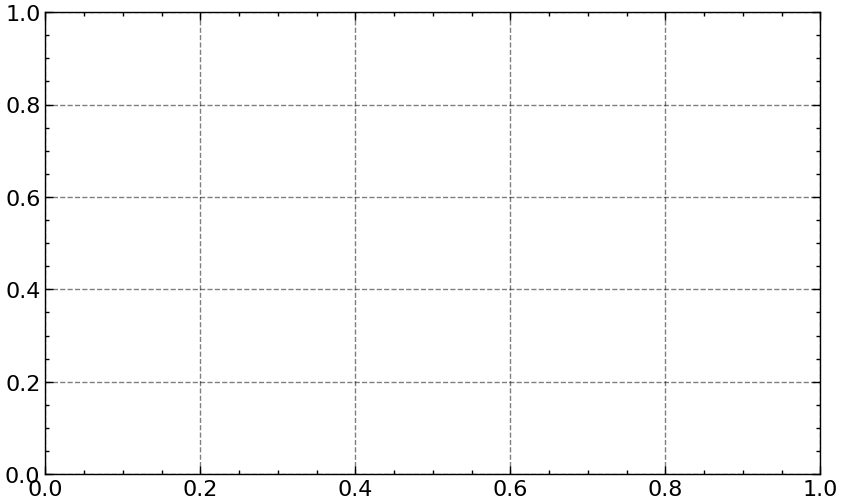

In [17]:
# Different L, POTTS=True, CD steps=4,gamma=10*-(3).... 
#colors = plt.cm.YlOrRd(np.linspace(0.178, 1, len(log_like_)))

Nepoch=500
num_epo=np.arange(Nepoch-10,Nepoch,1)
L_v=[3,4,5,6,7,8,10]
L_v2=[3,4,5,6,7,8]
fig, ax3 = plt.subplots(1,1,figsize=(10,6))

runs=[]
runs_std=[]

L_means=[]
L_stds=[]

L_means_spins=[]
L_stds_spins=[]

#loglike_L.append(-119.02694586328694)   
#loglike_L_std.append(0.444)
logs_L=[log_like_3_potts,log_like_4_potts,log_like_5_potts,log_like_6_potts,log_like_7_potts,log_like_8_potts,log_like_10_potts]
logs_L_std=[log_like_3_std_potts,log_like_4_std_potts,log_like_5_std_potts,log_like_6_std_potts,log_like_7_std_potts,log_like_8_std_potts,log_like_10_std_potts]

logs_L_spins=[log_like_3_spins,log_like_4_spins,log_like_5_spins,log_like_6_spins,log_like_7_spins,log_like_8_spins]
logs_L_spins_std=[log_like_3_std_spins,log_like_4_std_spins,log_like_5_std_spins,log_like_6_std_spins,log_like_7_std_spins,log_like_8_std_spins]



#for i, log_like in enumerate(loglike_L):
#    ax3.errorbar(L_v[i],log_like,yerr=loglike_L_std[i],fmt='o',color='blue',label=f'POTTS=False',linewidth=2, markersize=6.5,capsize=4, capthick=1,markerfacecolor='blue', markeredgecolor='black', markeredgewidth=1.2)

ax3.errorbar(L_v2, loglike_L, yerr=loglike_L_std, fmt='o', color='blue', 
             label='POTTS=False', linewidth=2, markersize=6.5, capsize=4, 
             capthick=1, markeredgecolor='black', markeredgewidth=1.2)

for j,log_like_j_potts in enumerate(logs_L):
    for i, log_like in enumerate(log_like_j_potts):
        weights = 1 / np.array(logs_L_std[j][i])**2
        weighted_avg = np.average(log_like,weights=weights) # weighted average of log-likelihoods of last 10 epochs
        weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
        chi = np.sum(((log_like[i] - weighted_avg*np.ones(10))/logs_L_std[j][i]) ** 2)
        runs.append(weighted_avg)
        runs_std.append(weighted_error)
    avg=np.average(runs, weights=runs_std)
    avg_std= np.std(runs)
    L_means.append(avg)
    L_stds.append(avg_std)
    runs=[]
    runs_std=[]


for j,log_like_j_spins in enumerate(logs_L_spins):
    for i, log_like in enumerate(log_like_j_spins):
        weights = 1 / np.array(logs_L_spins_std[j][i])**2
        weighted_avg = np.average(log_like,weights=weights) # weighted average of log-likelihoods of last 10 epochs
        weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
        chi = np.sum(((log_like[i] - weighted_avg*np.ones(10))/logs_L_spins_std[j][i]) ** 2)
        runs.append(weighted_avg)
        runs_std.append(weighted_error)
    avg=np.average(runs, weights=runs_std)
    avg_std= np.std(runs)
    L_means_spins.append(avg)
    L_stds_spins.append(avg_std)
    runs=[]
    runs_std=[]

    

ax3.errorbar(L_v2, L_means_spins, yerr=L_stds_spins, fmt='D', linewidth=2, markersize=6.5,
             capsize=4, color='red', capthick=1, markeredgecolor='black',
             markeredgewidth=1.2, label=f'SPINS=True')

ax3.errorbar(L_v, L_means, yerr=L_stds, fmt='o', linewidth=2, markersize=7,
             capsize=4, color='darkorange', capthick=1, markeredgecolor='black',
             markeredgewidth=1.2, label=f'POTTS=True')

ax3.set_xlabel('L', fontsize=18, fontweight='bold')
ax3.set_ylabel('Log-Likelihood value', fontsize=18, fontweight='bold')
ax3.tick_params(axis='x', labelsize=18.5,pad=9)
ax3.tick_params(axis='y', labelsize=18.5,pad=9)
ax3.set_title('Mean Log-Likelihood after transient for different L: POTTS and SPIN ($\mathbf{N_t}$=4,$\mathbf{\gamma=10^{-3}}$)', fontsize=17, fontweight='bold',pad=13)
ax3.set_xticks(np.arange(3,11))
ax3.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax3.legend(fontsize=14, loc='lower right', frameon=True, edgecolor='black',framealpha=0.5)
ax3.set_xlim(2,11)
ax3.minorticks_off()
file_path = 'GRAPHS/log_like_POTTS_plot.png' 
fig.savefig(file_path, dpi=300, bbox_inches='tight') 
plt.show()


We notice a clear trend of improvement for the likehood with increasing L with POTTS, despite performing significantly worse than its respective L value in the usual configuration without POTTS activated. This is to be expected since POTTS model is simpler/less complex, with L possible configurations for the hidden units, compared to the basic case with $2^{L}$.     

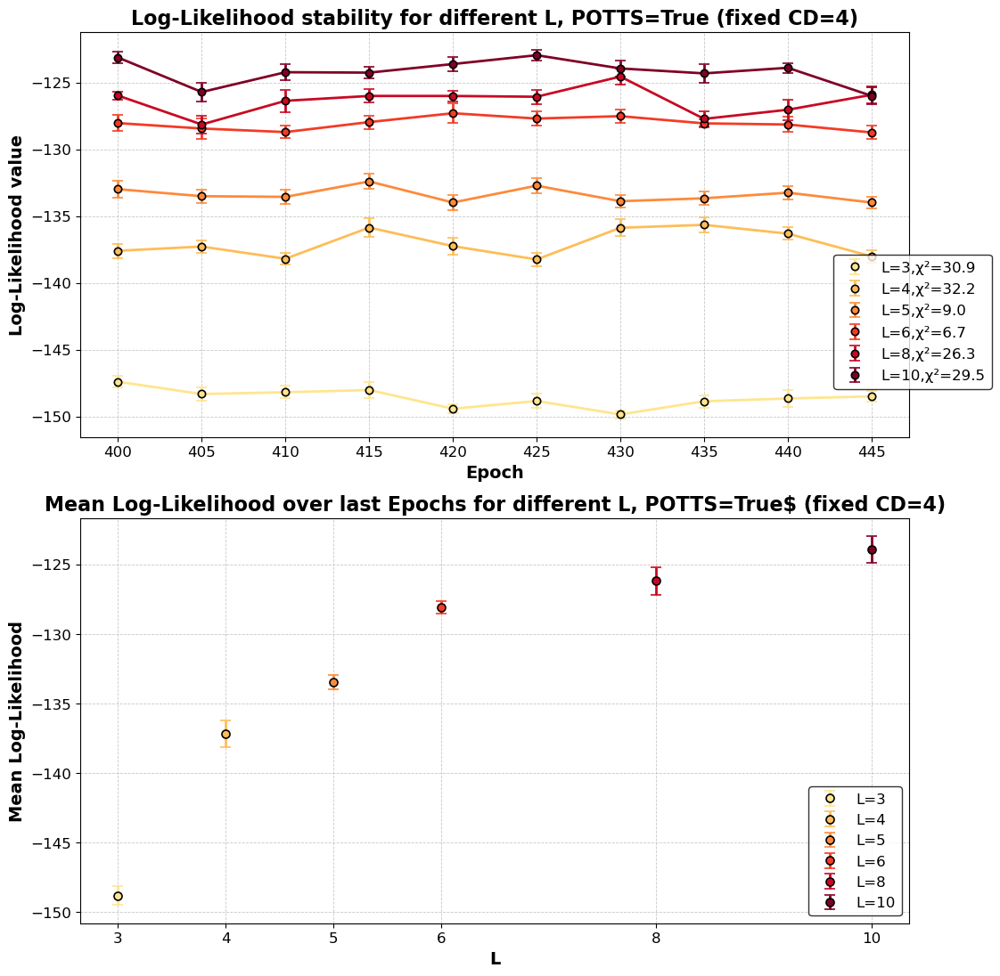

In [44]:
# Different L and CD steps=4 POTTS=True
colors = plt.cm.YlOrRd(np.linspace(0.178, 1, len(log_like_potts_m)))
Nepoch=500
num_epo=np.arange(Nepoch-10,Nepoch,1)

fig, (ax1,ax2) = plt.subplots(2,1,figsize=(12,13))

for i, log_like in enumerate(log_like_potts_m):
    weights = 1 / np.array(log_like_potts_m_std[i])**2
    weighted_avg = np.average(log_like, weights=weights)  # weighted average of log-likelihoods of last 10 epochs
    weighted_error = np.sqrt(1 / np.sum(weights)) # error of weighted average
    chi = np.sum(((log_like - weighted_avg*np.ones(10))/log_like_potts_m_std[i]) ** 2)
    
    ax1.errorbar(num_epo,log_like,yerr=log_like_potts_m_std[i],fmt='o',color=colors[i],label=f'L={L_v[i]},χ²={round(chi,1)}',linewidth=2, markersize=6,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black', markeredgewidth=1.2)
    ax1.plot(num_epo, log_like, color=colors[i], linewidth=2)

    ax2.errorbar(L_v[i],weighted_avg,yerr=np.array(log_like).std(),fmt='o',color=colors[i],label=f'L={L_v[i]}',linewidth=2,markersize=6.5,capsize=4, capthick=1,markerfacecolor=colors[i], markeredgecolor='black',markeredgewidth=1.2 )
   

ax1.set_xlabel('Epoch', fontsize=14, fontweight='bold')
ax1.set_ylabel('Log-Likelihood value', fontsize=14, fontweight='bold')
ax1.set_title('Log-Likelihood stability for different L, POTTS=True (fixed CD=4)', fontsize=16, fontweight='bold')
ax1.set_xticks(num_epo)
ax1.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax1.legend(fontsize=12, loc='center left', frameon=True, bbox_to_anchor=(0.9, 0.285), edgecolor='black')

ax2.set_xlabel('L', fontsize=14, fontweight='bold')
ax2.set_ylabel('Mean Log-Likelihood', fontsize=14, fontweight='bold')
ax2.set_title('Mean Log-Likelihood over last Epochs for different L, POTTS=True (fixed CD=4)', fontsize=16, fontweight='bold')
ax2.set_xticks(L_v)
#ax2.set_xticklabels([f'{tick:.1e}' for tick in gamma_v])
ax2.grid(True, linestyle='--', linewidth=0.6, alpha=0.7)
ax2.legend(fontsize=12, loc='lower right', frameon=True, edgecolor='black')

#file_path = 'GRAPHS/log_like_gammas_plot.png'  # Path where you want to save the figure
#fig.savefig(file_path, dpi=300, bbox_inches='tight')  # Save the figure as a .png file with high resolution


plt.show()

Averaging over many try as we did in the former steps, we can clearly see an imporvement as L gets higher.